In [1]:
import os
import glob
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import xarray as xr
from matplotlib.colors import BoundaryNorm
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.font_manager import FontProperties
import pandas as pd
import datetime
import copy
from scipy.stats import linregress
import colorcet as cc
from sklearn.neighbors import KernelDensity
from scipy.ndimage import label, binary_dilation, generate_binary_structure, filters, iterate_structure
import warnings

import seaborn as sns
import scipy.stats as st
from scipy.stats import pearsonr
from scipy.stats import spearmanr
import pingouin as pg

In [2]:
xr.__version__

'2024.2.0'

In [3]:
def list_dirs(in_dir):
    """
    List sub-directories.
    """
    dirs = []
    for it in os.scandir(in_dir):
        if it.is_dir():
            dirs.append(it.path)
    return dirs

def find_lasso_files(start_dates, root_datadir, in_basename, domain):
    files = []
    # Loop over dates
    for ii in range(0, len(start_dates)):
        # Get sub-directories (cases)
        idate = start_dates[ii]
        case_dirs = list_dirs(f'{root_datadir}/{idate}/')
        if len(case_dirs) > 0:
            # Loop over cases
            for icase in case_dirs:
                # Find config sub-directories
                # config_dirs = list_dirs(icase)
                config_dirs = [f'{icase}/base/']
                if len(config_dirs) > 0:
                    # Loop over configs
                    for iconfig in config_dirs:
                        # Find track stats file
                        fname = sorted(glob.glob(f'{iconfig}{domain}/stats/{in_basename}*nc'))
                        if len(fname) > 0:
                            files.append(fname[0])
    return sorted(files)

In [4]:
# LASSO case dates
start_dates = [
    "20181129", 
    "20181204",
    "20181205", 
    # "20181219", 
    "20190122", 
    "20190123",
    "20190125",
    "20190129",
    "20190208",
]

# LASSO tracking directory
# rootdir_les = '/pscratch/sd/f/feng045/lasso/les/'
# rootdir_meso = '/pscratch/sd/f/feng045/lasso/meso/'
rootdir_les = '/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/'
rootdir_meso = '/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/meso/'
in_basename = 'trackstats_20'
# in_basename_w = 'stats_3d_w_'
in_basename_w = 'stats_3d_w_fixshell_'
in_basename_wmask = 'stats_2d_wmask_'
in_basename_env_les = 'stats_avg1d_env21x21_'
in_basename_env_meso = 'stats_avg1d_env9x9_'

# figdir = '/pscratch/sd/f/feng045/lasso/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h/'
# figdir = '/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/'
figdir = '/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/'

os.makedirs(figdir, exist_ok=True)

# Domain 4 boundaries
# lon_range = [-65.4, -63.1]
# lat_range = [-33.3, -30.8]
# lon_range = [-65., -63.1]
# lon_range = [-65., -63.3]
# lon_range = [-65.3, -63.3]
# lat_range = [-33.2, -30.8]
lon_range = [-65., -63.3]
lat_range = [-33., -30.8]
lifetime_range = [15, 1000]  # [minutes]

# Environment location (0: fixed site, 1: CI location)
# env_loc = 1
# Time for representative environment
time_env = -1

# Find LASSO files
files_d2 = find_lasso_files(start_dates, rootdir_meso, in_basename, 'd2')
files_d3 = find_lasso_files(start_dates, rootdir_les, in_basename, 'd3')
files_d4 = find_lasso_files(start_dates, rootdir_les, in_basename, 'd4')
wfiles_d2 = find_lasso_files(start_dates, rootdir_meso, in_basename_w, 'd2')
wfiles_d3 = find_lasso_files(start_dates, rootdir_les, in_basename_w, 'd3')
wfiles_d4 = find_lasso_files(start_dates, rootdir_les, in_basename_w, 'd4')
wmaskfiles_d2 = find_lasso_files(start_dates, rootdir_meso, in_basename_wmask, 'd2')
wmaskfiles_d3 = find_lasso_files(start_dates, rootdir_les, in_basename_wmask, 'd3')
wmaskfiles_d4 = find_lasso_files(start_dates, rootdir_les, in_basename_wmask, 'd4')
efiles_d2 = find_lasso_files(start_dates, rootdir_meso, in_basename_env_meso, 'd2')
efiles_d3 = find_lasso_files(start_dates, rootdir_les, in_basename_env_les, 'd3')
efiles_d4 = find_lasso_files(start_dates, rootdir_les, in_basename_env_les, 'd4')

print(f'Number of stats files (D2): {len(files_d2)}')
print(f'Number of W files (D2): {len(wfiles_d2)}')
print(f'Number of Wmask files (D2): {len(wmaskfiles_d2)}')
print(f'Number of ENV files (D2): {len(efiles_d2)}')

print(f'Number of stats files (D3): {len(files_d3)}')
print(f'Number of W files (D3): {len(wfiles_d3)}')
print(f'Number of Wmask files (D3): {len(wmaskfiles_d3)}')
print(f'Number of ENV files (D3): {len(efiles_d3)}')

print(f'Number of stats files (D4): {len(files_d4)}')
print(f'Number of W files (D4): {len(wfiles_d4)}')
print(f'Number of Wmask files (D4): {len(wmaskfiles_d4)}')
print(f'Number of ENV files (D4): {len(efiles_d4)}')

# files_d2, files_d3, files_d4, wfiles_d2, wfiles_d3, wfiles_d4

Number of stats files (D2): 17
Number of W files (D2): 17
Number of Wmask files (D2): 17
Number of ENV files (D2): 17
Number of stats files (D3): 17
Number of W files (D3): 17
Number of Wmask files (D3): 17
Number of ENV files (D3): 17
Number of stats files (D4): 17
Number of W files (D4): 17
Number of Wmask files (D4): 17
Number of ENV files (D4): 17


## Limit time window for analysis in each case
### The window is determined manually by examining cold pool animations to exclude periods when significant cold pools develop

In [5]:
# case_hours_dict_d2 = {
#     '20181129-gefs00': (12.0, 19.5),
#     '20181129-gefs03': (12.0, 20.0),
#     '20181129-gefs09': (12.0, 18.5),
#     '20181129-gefs18': (12.0, 18.5),
#     '20181204-gefs18': (12.0, 17.5),
#     '20181204-gefs19': (12.0, 19.0),
#     '20181205-gefs01': (12.0, 18.0),
#     '20181219-eda09': (12.0, 17.0),
#     '20190122-gefs01': (12.0, 21.5),
#     '20190122-gefs18': (12.0, 20.25),
#     '20190123-eda05': (12.0, 16.0),
#     '20190123-gefs18': (12.0, 17.5),
#     '20190125-eda07': (12.0, 18.5),
#     '20190125-gefs11': (12.0, 18.5),
#     '20190129-eda09': (12.0, 18.0),
#     '20190129-gefs11': (12.0, 17.5),
#     '20190208-eda03': (12.0, 19.5),
#     '20190208-eda08': (12.0, 19.75),
# }

In [6]:
# +2 h
case_hours_dict_d2 = {
    '20181129-gefs00': (12.0, 21.5),
    '20181129-gefs03': (12.0, 22.0),
    '20181129-gefs09': (12.0, 20.5),
    '20181129-gefs18': (12.0, 20.5),
    '20181204-gefs18': (12.0, 19.5),
    '20181204-gefs19': (12.0, 21.0),
    '20181205-gefs01': (12.0, 20.0),
    '20181219-eda09': (12.0, 19.0),
    '20190122-gefs01': (12.0, 23.5),
    '20190122-gefs18': (12.0, 22.25),
    '20190123-eda05': (12.0, 18.0),
    '20190123-gefs18': (12.0, 19.5),
    '20190125-eda07': (12.0, 20.5),
    '20190125-gefs11': (12.0, 20.5),
    '20190129-eda09': (12.0, 20.0),
    '20190129-gefs11': (12.0, 19.5),
    '20190208-eda03': (12.0, 21.5),
    '20190208-eda08': (12.0, 21.75),
}

In [7]:
# case_hours_dict_d3 = {
#     '20181129-gefs00': (12.0, 19.5),
#     '20181129-gefs03': (12.0, 20.0),
#     '20181129-gefs09': (12.0, 19.0),
#     '20181129-gefs18': (12.0, 19.0),
#     '20181204-gefs18': (12.0, 17.5),
#     '20181204-gefs19': (12.0, 19.0),
#     '20181205-gefs01': (12.0, 18.0),
#     '20181219-eda09': (12.0, 17.0),
#     '20190122-gefs01': (12.0, 21.5),
#     '20190122-gefs18': (12.0, 20.5),
#     '20190123-eda05': (12.0, 16.0),
#     '20190123-gefs18': (12.0, 17.5),
#     '20190125-eda07': (12.0, 18.5),
#     '20190125-gefs11': (12.0, 18.5),
#     '20190129-eda09': (12.0, 18.5),
#     '20190129-gefs11': (12.0, 18.25),
#     '20190208-eda03': (12.0, 20.0),
#     '20190208-eda08': (12.0, 20.0),
# }

In [8]:
# # +1 h
# case_hours_dict_d3 = {
#     '20181129-gefs00': (12.0, 20.5),
#     '20181129-gefs03': (12.0, 21.0),
#     '20181129-gefs09': (12.0, 20.0),
#     '20181129-gefs18': (12.0, 20.0),
#     '20181204-gefs18': (12.0, 18.5),
#     '20181204-gefs19': (12.0, 20.0),
#     '20181205-gefs01': (12.0, 19.0),
#     '20181219-eda09': (12.0, 18.0),
#     '20190122-gefs01': (12.0, 22.5),
#     '20190122-gefs18': (12.0, 21.5),
#     '20190123-eda05': (12.0, 17.0),
#     '20190123-gefs18': (12.0, 18.5),
#     '20190125-eda07': (12.0, 19.5),
#     '20190125-gefs11': (12.0, 19.5),
#     '20190129-eda09': (12.0, 19.5),
#     '20190129-gefs11': (12.0, 19.25),
#     '20190208-eda03': (12.0, 21.0),
#     '20190208-eda08': (12.0, 21.0),
# }

In [9]:
# +2 h
case_hours_dict_d3 = {
    '20181129-gefs00': (12.0, 21.5),
    '20181129-gefs03': (12.0, 22.0),
    '20181129-gefs09': (12.0, 21.0),
    '20181129-gefs18': (12.0, 21.0),
    '20181204-gefs18': (12.0, 19.5),
    '20181204-gefs19': (12.0, 21.0),
    '20181205-gefs01': (12.0, 20.0),
    '20181219-eda09': (12.0, 19.0),
    '20190122-gefs01': (12.0, 23.5),
    '20190122-gefs18': (12.0, 22.5),
    '20190123-eda05': (12.0, 18.0),
    '20190123-gefs18': (12.0, 19.5),
    '20190125-eda07': (12.0, 20.5),
    '20190125-gefs11': (12.0, 20.5),
    '20190129-eda09': (12.0, 20.5),
    '20190129-gefs11': (12.0, 20.25),
    '20190208-eda03': (12.0, 22.0),
    '20190208-eda08': (12.0, 22.0),
}

In [10]:
# Assume same cold pool development times in D4 as in D3
case_hours_dict_d4 = case_hours_dict_d3

## Read and combine data files

In [11]:
def get_casename(in_file):
    """
    Get case date, ensemble member, and config from full filename
    """
    # Example file name with file directory:
    # .../meso//20181129/gefs09/base/d2/stats/trackstats_20181129.1200_20181130.0000.nc
    caseconfig = (in_file).split(os.path.sep)[-4]
    ensmember = (in_file).split(os.path.sep)[-5]
    casedate = (in_file).split(os.path.sep)[-6]
    return caseconfig, ensmember, casedate

def subset_tracks(ds, time_res, lon_range, lat_range, lifetime_range, hours_range):
    # Get track min/max lat/lon
    minlon = ds['meanlon'].min(dim='times').load()
    maxlon = ds['meanlon'].max(dim='times').load()
    minlat = ds['meanlat'].min(dim='times').load()
    maxlat = ds['meanlat'].max(dim='times').load()
    # Get track lifetime in [minutes]
    lifetime = (ds['track_duration'] * time_res).load()
    # Get track start time in decimal [hours]
    start_hour = (ds['start_basetime'].dt.hour + ds['start_basetime'].dt.minute/60.).load()
    # Get track indices
    track_idx = np.where(
        (minlon >= np.min(lon_range)) & (maxlon <= np.max(lon_range)) & \
        (minlat >= np.min(lat_range)) & (maxlat <= np.max(lat_range)) & \
        (lifetime >= min(lifetime_range)) & (lifetime <= np.max(lifetime_range)) & \
        (start_hour >= np.min(hours_range)) & (start_hour <= np.max(hours_range))
    )[0]
    # Subset tracks
    dsout = ds.isel(tracks=track_idx)
    return dsout, track_idx

## Function to read, subset, combine stats files

In [12]:
pd.to_datetime('20181129', format='%Y%m%d')

Timestamp('2018-11-29 00:00:00')

In [ ]:
def read_subset_combine(tfiles, wfiles, wmaskfiles, efiles, case_hours_dict, lon_range, lat_range, lifetime_range, time_res):
    """
    Read and subset track statistics files and combine multiple DataSets.
    
    Subsets based on:
    - Track inititial lat/lon
    - Track duration (lifetime)
    - Track initial times (different for each case)
    
    Args:
        tfiles: list
            List of track statistics files.
        wfiles: list
            List of W statistics files.
        wmaskfiles: list
            List of W mask statistics files.
        efiles: list
            List of environment statistics files.
        case_hours_dict: dictionary
            Case hour range dictionary.
        lon_range: list/tuple
            Longitude range to subset tracks.
        lat_range: list/tuple
            Latitude range to subset tracks.
        lifetime_range: list/tuple
            Lifetime range to subset tracks.
        time_res: float
            Time resolution of tracks [minutes].
        
    Returns:
        ds: Xarray DataSet
            Combined Xarray DataSet.
    """
    
    # Suppress the warning within this block only
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning)
    
        # Make lists for the DataSets
        dst_list = []
        dsw_list = []
        dsm_list = []
        dse_list = []
        # List to keep track of original track numbers
        original_tracks_list = []

        # Loop over the number of files
        # for ii in range(len(tfiles[0:2])):
        for ii in range(len(tfiles)):
            tfile = tfiles[ii]
            wfile = wfiles[ii]
            mfile = wmaskfiles[ii]
            efile = efiles[ii]
            caseconfig, ensmember, casedate = get_casename(tfile)
            # Make casename (date-ensmember) and look up hours
            casename = f"{casedate}-{ensmember}"
            # Get hours range for the case
            hours_range = case_hours_dict[casename]
            print(casename, hours_range)
            # print(tfile, wfile, efile)

            # Read tracks file
            dst = xr.open_dataset(tfile)
            # Add a variable case (date-forcing) to the DataSet
            dst['case'] = casename
            # dst['date'] = casedate
            dst['date'] = pd.to_datetime(casedate, format='%Y%m%d')
            # Subset tracks
            dst_s, track_idx = subset_tracks(dst, time_res, lon_range, lat_range, lifetime_range, hours_range)
            # Store original track numbers for this subset
            original_tracks_list.append(dst_s['tracks'].values.copy())
            # Add subsetted DataSet to the list
            dst_list.append(dst_s)

            # Read W file
            dsw = xr.open_dataset(wfile)
            # Subset W tracks (only keep largest core)
            dsw_s = dsw.isel(tracks=track_idx, core=0)
            dsw_list.append(dsw_s)

            # Read W mask file
            dsm = xr.open_dataset(mfile)
            # Subset W mask tracks
            dsm_s = dsm.isel(tracks=track_idx)
            dsm_list.append(dsm_s)

            # Read ENV file (drop 'height' dimension, i.e., profile variables)
            dse = xr.open_dataset(efile)
            # Subset ENV tracks (select CI location)
            dse_s = dse.isel(tracks=track_idx)
            # dse_s = dse.isel(tracks=track_idx).sel(location=env_loc)
            dse_list.append(dse_s)

        # Concatenate original track numbers from all cases
        original_tracks = np.concatenate(original_tracks_list)

        # Concetenante subsetted DataSets
        dst = xr.concat(dst_list, dim='tracks')
        # Renumber tracks to make it continuous
        ntracks = dst.sizes['tracks']
        dst['tracks'] = np.arange(0, ntracks)

        dsw = xr.concat(dsw_list, dim='tracks')
        dsw['tracks'] = np.arange(0, ntracks)

        dsm = xr.concat(dsm_list, dim='tracks')
        dsm['tracks'] = np.arange(0, ntracks)

        dse = xr.concat(dse_list, dim='tracks')
        dse['tracks'] = np.arange(0, ntracks)

        # Combine 2D and 3D datasets by coordinates
        ds = xr.combine_by_coords([dst, dsw, dsm, dse], combine_attrs='drop_conflicts')
        
        # Add original track numbers as a data variable (not a coordinate)
        ds['original_tracks'] = (('tracks',), original_tracks)
        ds['original_tracks'].attrs['long_name'] = 'Original track number from individual case files'
        ds['original_tracks'].attrs['description'] = 'Track numbers before renumbering for combined dataset'
        
        ntimes = ds.sizes['times']
        print(f'Number of tracks: {ntracks}')

    return ds

In [14]:
time_res = 5.0  # [minute]

# Read and subset D2 data
ds_d2 = read_subset_combine(files_d2, wfiles_d2, wmaskfiles_d2, efiles_d2, case_hours_dict_d2, lon_range, lat_range, lifetime_range, time_res)
ds_d2

20181129-gefs00 (12.0, 21.5)


20181129-gefs03 (12.0, 22.0)
20181129-gefs09 (12.0, 20.5)
20181129-gefs18 (12.0, 20.5)
20181204-gefs18 (12.0, 19.5)
20181204-gefs19 (12.0, 21.0)
20181205-gefs01 (12.0, 20.0)
20190122-gefs01 (12.0, 23.5)
20190122-gefs18 (12.0, 22.25)
20190123-eda05 (12.0, 18.0)
20190123-gefs18 (12.0, 19.5)
20190125-eda07 (12.0, 20.5)
20190125-gefs11 (12.0, 20.5)
20190129-eda09 (12.0, 20.0)
20190129-gefs11 (12.0, 19.5)
20190208-eda03 (12.0, 21.5)
20190208-eda08 (12.0, 21.75)
Number of tracks: 1228


<xarray.Dataset> Size: 2GB
Dimensions:                  (tracks: 1228, times: 202, height: 101, z: 40)
Coordinates:
  * tracks                   (tracks) int64 10kB 0 1 2 3 ... 1224 1225 1226 1227
  * times                    (times) int64 2kB -2 -1 0 1 2 ... 196 197 198 199
  * height                   (height) float64 808B 0.0 200.0 ... 1.98e+04 2e+04
  * z                        (z) float64 320B 250.0 500.0 ... 2e+04 2.1e+04
    core                     int64 8B 0
Data variables: (12/194)
    temperature              (tracks, times, height) float32 100MB nan ... nan
    qv                       (tracks, times, height) float32 100MB nan ... nan
    rh                       (tracks, times, height) float32 100MB nan ... nan
    pressure                 (tracks, times, height) float32 100MB nan ... nan
    u                        (tracks, times, height) float32 100MB nan ... nan
    v                        (tracks, times, height) float32 100MB nan ... nan
    ...                       ...
    start_split_cloudnumber  (tracks) float64 10kB nan nan nan ... 2.0 nan nan
    end_merge_tracknumber    (tracks) float64 10kB 5.0 3.0 82.0 ... nan nan
    end_merge_timeindex      (tracks) float64 10kB 3.0 14.0 8.0 ... 14.0 nan nan
    end_merge_cloudnumber    (tracks) float64 10kB 1.0 1.0 11.0 ... 1.0 nan nan
    case                     (tracks) <U15 74kB '20181129-gefs00' ... '201902...
    date                     (tracks) datetime64[ns] 10kB 2018-11-29 ... 2019...
Attributes: (12/13)
    source_trackfile:      /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/mes...
    startdate:             20181129.1200
    enddate:               20181130.0000
    source_W_file:         /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/mes...
    source_env_file:       /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/mes...
    time_start:            0
    ...                    ...
    time_environment:      -1
    ETH_buffer:            1.0
    cbase_depth:           0.5
    timegap_hour:          0.5
    time_resolution_hour:  0.08333
    pixel_radius_km:       2.5

In [15]:
# Read and subset D3 data
ds_d3 = read_subset_combine(files_d3, wfiles_d3, wmaskfiles_d3, efiles_d3, case_hours_dict_d3, lon_range, lat_range, lifetime_range, time_res)
ds_d3

20181129-gefs00 (12.0, 21.5)
20181129-gefs03 (12.0, 22.0)
20181129-gefs09 (12.0, 21.0)
20181129-gefs18 (12.0, 21.0)
20181204-gefs18 (12.0, 19.5)
20181204-gefs19 (12.0, 21.0)


20181205-gefs01 (12.0, 20.0)
20190122-gefs01 (12.0, 23.5)
20190122-gefs18 (12.0, 22.5)
20190123-eda05 (12.0, 18.0)
20190123-gefs18 (12.0, 19.5)
20190125-eda07 (12.0, 20.5)
20190125-gefs11 (12.0, 20.5)
20190129-eda09 (12.0, 20.5)
20190129-gefs11 (12.0, 20.25)
20190208-eda03 (12.0, 22.0)
20190208-eda08 (12.0, 22.0)
Number of tracks: 2041


<xarray.Dataset> Size: 4GB
Dimensions:                  (tracks: 2041, times: 202, height: 101, z: 40)
Coordinates:
  * tracks                   (tracks) int64 16kB 0 1 2 3 ... 2037 2038 2039 2040
  * times                    (times) int64 2kB -2 -1 0 1 2 ... 196 197 198 199
  * height                   (height) float64 808B 0.0 200.0 ... 1.98e+04 2e+04
  * z                        (z) float64 320B 250.0 500.0 ... 2e+04 2.1e+04
    core                     int64 8B 0
Data variables: (12/194)
    temperature              (tracks, times, height) float32 167MB nan ... nan
    qv                       (tracks, times, height) float32 167MB nan ... nan
    rh                       (tracks, times, height) float32 167MB nan ... nan
    pressure                 (tracks, times, height) float32 167MB nan ... nan
    u                        (tracks, times, height) float32 167MB nan ... nan
    v                        (tracks, times, height) float32 167MB nan ... nan
    ...                       ...
    start_split_cloudnumber  (tracks) float64 16kB nan nan nan ... nan nan nan
    end_merge_tracknumber    (tracks) float64 16kB nan nan nan ... nan nan nan
    end_merge_timeindex      (tracks) float64 16kB nan nan nan ... nan nan nan
    end_merge_cloudnumber    (tracks) float64 16kB nan nan nan ... nan nan nan
    case                     (tracks) <U15 122kB '20181129-gefs00' ... '20190...
    date                     (tracks) datetime64[ns] 16kB 2018-11-29 ... 2019...
Attributes: (12/13)
    source_trackfile:      /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les...
    startdate:             20181129.1200
    enddate:               20181130.0000
    source_W_file:         /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les...
    source_env_file:       /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les...
    time_start:            0
    ...                    ...
    time_environment:      -1
    ETH_buffer:            1.0
    cbase_depth:           0.5
    timegap_hour:          0.5
    time_resolution_hour:  0.08333
    pixel_radius_km:       0.5

In [16]:
# Read and subset D4 data
ds_d4 = read_subset_combine(files_d4, wfiles_d4, wmaskfiles_d4, efiles_d4, case_hours_dict_d4, lon_range, lat_range, lifetime_range, time_res)
ds_d4

20181129-gefs00 (12.0, 21.5)
20181129-gefs03 (12.0, 22.0)


20181129-gefs09 (12.0, 21.0)
20181129-gefs18 (12.0, 21.0)
20181204-gefs18 (12.0, 19.5)
20181204-gefs19 (12.0, 21.0)
20181205-gefs01 (12.0, 20.0)
20190122-gefs01 (12.0, 23.5)
20190122-gefs18 (12.0, 22.5)
20190123-eda05 (12.0, 18.0)
20190123-gefs18 (12.0, 19.5)
20190125-eda07 (12.0, 20.5)
20190125-gefs11 (12.0, 20.5)
20190129-eda09 (12.0, 20.5)
20190129-gefs11 (12.0, 20.25)
20190208-eda03 (12.0, 22.0)
20190208-eda08 (12.0, 22.0)
Number of tracks: 1710


<xarray.Dataset> Size: 3GB
Dimensions:                  (tracks: 1710, times: 202, height: 101, z: 40)
Coordinates:
  * tracks                   (tracks) int64 14kB 0 1 2 3 ... 1706 1707 1708 1709
  * times                    (times) int64 2kB -2 -1 0 1 2 ... 196 197 198 199
  * height                   (height) float64 808B 0.0 200.0 ... 1.98e+04 2e+04
  * z                        (z) float64 320B 250.0 500.0 ... 2e+04 2.1e+04
    core                     int64 8B 0
Data variables: (12/194)
    temperature              (tracks, times, height) float32 140MB nan ... nan
    qv                       (tracks, times, height) float32 140MB nan ... nan
    rh                       (tracks, times, height) float32 140MB nan ... nan
    pressure                 (tracks, times, height) float32 140MB nan ... nan
    u                        (tracks, times, height) float32 140MB nan ... nan
    v                        (tracks, times, height) float32 140MB nan ... nan
    ...                       ...
    start_split_cloudnumber  (tracks) float64 14kB nan nan nan ... 2.0 nan nan
    end_merge_tracknumber    (tracks) float64 14kB 13.0 nan nan ... nan nan nan
    end_merge_timeindex      (tracks) float64 14kB 2.0 nan nan ... nan nan nan
    end_merge_cloudnumber    (tracks) float64 14kB 3.0 nan nan ... nan nan nan
    case                     (tracks) <U15 103kB '20181129-gefs00' ... '20190...
    date                     (tracks) datetime64[ns] 14kB 2018-11-29 ... 2019...
Attributes: (12/13)
    source_trackfile:      /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les...
    startdate:             20181129.1200
    enddate:               20181130.0000
    source_W_file:         /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les...
    source_env_file:       /gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les...
    time_start:            0
    ...                    ...
    time_environment:      -1
    ETH_buffer:            1.0
    cbase_depth:           0.5
    timegap_hour:          0.5
    time_resolution_hour:  0.08333
    pixel_radius_km:       0.5

In [17]:
# ds_d2.start_basetime.dt.hour.plot.hist(bins=np.arange(12,24,1))
# ds.start_basetime.dt.hour.plot.hist(bins=np.arange(12,24,1))

In [18]:
# ds_d3.start_basetime.dt.hour.plot.hist(bins=np.arange(12,24,1))

In [19]:
# ds_d4.start_basetime.dt.hour.plot.hist(bins=np.arange(12,24,1))

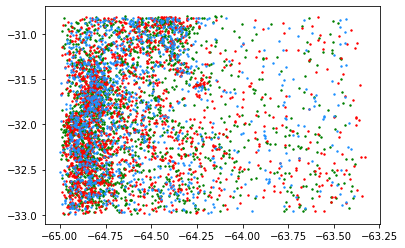

In [20]:
plt.scatter(ds_d3['meanlon'].mean(dim='times'), ds_d3['meanlat'].mean(dim='times'), s=2, c='g')
plt.scatter(ds_d4['meanlon'].mean(dim='times'), ds_d4['meanlat'].mean(dim='times'), s=2, c='r')
plt.scatter(ds_d2['meanlon'].mean(dim='times'), ds_d2['meanlat'].mean(dim='times'), s=2, c='dodgerblue')

## Find merge/split track indices

In [21]:
def find_merge_split_tracks(ds, time_window):
    """
    Find merge/split track indices.
    """
    # Get track lifetime
    lifetime = ds.track_duration.load() * time_res

    # Non-split tracks
    idx_nsplit = np.isnan(ds.start_split_cloudnumber.load())

    # Non-merge tracks
    idx_nmerge = np.isnan(ds.end_merge_cloudnumber.load())

    # Merge after time window tracks
    idx_merge_after = ~np.isnan(ds.end_merge_cloudnumber.load()) & (lifetime > np.max(time_window))

    # Combine conditions (satisfy both):
    # - Non-merge or merge after time window
    # - Non-split
    idx_nms = np.logical_and(idx_nsplit, (np.logical_or(idx_nmerge, idx_merge_after)))

    # Group outputs to dictionary
    out_dict = {
        'ns': idx_nsplit,
        'nm': idx_nmerge,
        'ms': idx_merge_after,
        'nms': idx_nms,
    }
    return out_dict

## Subset DataSets with non-merge/non-split tracks

In [22]:
# Constents common for all Datasets
# time_res = 5.0  # [min]
xtime = ds_d2.times * time_res
# Height coordinate for environmental variables
height = ds_d2.height
# Height coordinate for updraft variables
height_core = ds_d2.z

time_window = (ds_d2.attrs['time_start'], ds_d2.attrs['time_end'])
time_window

(0, 60)

# Modify the first two times (pre-CI) time values (unit: minutes)
## This is hardcoded specific to the average environments files where the extracted time frequencies are 15 min
### Refer to the config files: 
`config_lasso_wrf100m_template.yml`
`config_lasso_wrf500m_template.yml`
`config_lasso_wrf2.5km_template.yml`
- minutes_prior: 30
- freq_prior: 15

In [23]:
xtime.isel(times=slice(0,3))[:] = [-30., -15., 0.]
xtime

<xarray.DataArray 'times' (times: 202)> Size: 2kB
array([-30., -15.,   0.,   5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,
        45.,  50.,  55.,  60.,  65.,  70.,  75.,  80.,  85.,  90.,  95.,
       100., 105., 110., 115., 120., 125., 130., 135., 140., 145., 150.,
       155., 160., 165., 170., 175., 180., 185., 190., 195., 200., 205.,
       210., 215., 220., 225., 230., 235., 240., 245., 250., 255., 260.,
       265., 270., 275., 280., 285., 290., 295., 300., 305., 310., 315.,
       320., 325., 330., 335., 340., 345., 350., 355., 360., 365., 370.,
       375., 380., 385., 390., 395., 400., 405., 410., 415., 420., 425.,
       430., 435., 440., 445., 450., 455., 460., 465., 470., 475., 480.,
       485., 490., 495., 500., 505., 510., 515., 520., 525., 530., 535.,
       540., 545., 550., 555., 560., 565., 570., 575., 580., 585., 590.,
       595., 600., 605., 610., 615., 620., 625., 630., 635., 640., 645.,
       650., 655., 660., 665., 670., 675., 680., 685., 690., 695., 700.,
       705., 710., 715., 720., 725., 730., 735., 740., 745., 750., 755.,
       760., 765., 770., 775., 780., 785., 790., 795., 800., 805., 810.,
       815., 820., 825., 830., 835., 840., 845., 850., 855., 860., 865.,
       870., 875., 880., 885., 890., 895., 900., 905., 910., 915., 920.,
       925., 930., 935., 940., 945., 950., 955., 960., 965., 970., 975.,
       980., 985., 990., 995.])
Coordinates:
  * times    (times) int64 2kB -2 -1 0 1 2 3 4 5 ... 193 194 195 196 197 198 199
    core     int64 8B 0

In [24]:
tid_d2 = find_merge_split_tracks(ds_d2, time_window)
tid_d3 = find_merge_split_tracks(ds_d3, time_window)
tid_d4 = find_merge_split_tracks(ds_d4, time_window)

In [25]:
# Get number of tracks
ntracks_d2 = ds_d2.sizes['tracks']
ntracks_d3 = ds_d3.sizes['tracks']
ntracks_d4 = ds_d4.sizes['tracks']
print(f'D2 all tracks: {ntracks_d2}')
print(f'D3 all tracks: {ntracks_d3}')
print(f'D4 all tracks: {ntracks_d4}')

D2 all tracks: 1228
D3 all tracks: 2041
D4 all tracks: 1710


In [26]:
dsnms_d2 = ds_d2.isel(tracks=tid_d2['nms'])
dsnms_d3 = ds_d3.isel(tracks=tid_d3['nms'])
dsnms_d4 = ds_d4.isel(tracks=tid_d4['nms'])

# Get number of tracks
ntracks_nms_d2 = dsnms_d2.sizes['tracks']
ntracks_nms_d3 = dsnms_d3.sizes['tracks']
ntracks_nms_d4 = dsnms_d4.sizes['tracks']
print(f'D2 non-merge-split tracks: {ntracks_nms_d2} ({100*ntracks_nms_d2/ntracks_d2:.0f}% of all tracks)')
print(f'D3 non-merge-split tracks: {ntracks_nms_d3} ({100*ntracks_nms_d3/ntracks_d3:.0f}% of all tracks)')
print(f'D4 non-merge-split tracks: {ntracks_nms_d4} ({100*ntracks_nms_d4/ntracks_d4:.0f}% of all tracks)')

D2 non-merge-split tracks: 646 (53% of all tracks)
D3 non-merge-split tracks: 1315 (64% of all tracks)
D4 non-merge-split tracks: 1202 (70% of all tracks)


In [ ]:
# Save filtered datasets to netCDF files with compression
output_dir = '/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/cell_stats_combined'

# Define compression encoding for all variables
comp = {'zlib': True, 'complevel': 5}

# Save D2 filtered dataset
outfile_d2 = f'{output_dir}/stats_combined_filtered_d2.nc'
print(f'Saving D2 filtered dataset to:\n{outfile_d2}')
encoding_d2 = {var: comp for var in dsnms_d2.data_vars}
dsnms_d2.to_netcdf(outfile_d2, encoding=encoding_d2)
print(f'Saved {ntracks_nms_d2} tracks')

# Save D3 filtered dataset
outfile_d3 = f'{output_dir}/stats_combined_filtered_d3.nc'
print(f'Saving D3 filtered dataset to:\n{outfile_d3}')
encoding_d3 = {var: comp for var in dsnms_d3.data_vars}
dsnms_d3.to_netcdf(outfile_d3, encoding=encoding_d3)
print(f'Saved {ntracks_nms_d3} tracks')

# Save D4 filtered dataset
outfile_d4 = f'{output_dir}/stats_combined_filtered_d4.nc'
print(f'Saving D4 filtered dataset to:\n{outfile_d4}')
encoding_d4 = {var: comp for var in dsnms_d4.data_vars}
dsnms_d4.to_netcdf(outfile_d4, encoding=encoding_d4)
print(f'Saved {ntracks_nms_d4} tracks')

print('All datasets saved successfully!')

## Check number of merge after time_window tracks

In [27]:
# Tracks where merging occurs after the time_window
lifetime_merge_after_d2 = dsnms_d2.track_duration.where(~np.isnan(dsnms_d2.end_merge_cloudnumber), drop=True) * time_res
minlifetime_merge_after_d2 = lifetime_merge_after_d2.min().values
ntracks_merge_after_d2 = (lifetime_merge_after_d2).sizes['tracks']
print(f'D2 merge after time_window tracks: {ntracks_merge_after_d2}, min lifetime: {minlifetime_merge_after_d2} min')

# Tracks where merging occurs after the time_window
lifetime_merge_after_d3 = dsnms_d3.track_duration.where(~np.isnan(dsnms_d3.end_merge_cloudnumber), drop=True) * time_res
minlifetime_merge_after_d3 = lifetime_merge_after_d3.min().values
ntracks_merge_after_d3 = (lifetime_merge_after_d3).sizes['tracks']
print(f'D3 merge after time_window tracks: {ntracks_merge_after_d3}, min lifetime: {minlifetime_merge_after_d3} min')

# Tracks where merging occurs after the time_window
lifetime_merge_after_d4 = dsnms_d4.track_duration.where(~np.isnan(dsnms_d4.end_merge_cloudnumber), drop=True) * time_res
minlifetime_merge_after_d4 = lifetime_merge_after_d4.min().values
ntracks_merge_after_d4 = (lifetime_merge_after_d4).sizes['tracks']
print(f'D4 merge after time_window tracks: {ntracks_merge_after_d4}, min lifetime: {minlifetime_merge_after_d4} min')

D2 merge after time_window tracks: 83, min lifetime: 65.0 min
D3 merge after time_window tracks: 63, min lifetime: 65.0 min
D4 merge after time_window tracks: 50, min lifetime: 65.0 min


## Mask updraft variables using Wmask

In [28]:
# dsnms_d2 = dsnms_d2.where(dsnms_d2.Wmask == True)
# dsnms_d3 = dsnms_d3.where(dsnms_d3.Wmask == True)
# dsnms_d4 = dsnms_d4.where(dsnms_d4.Wmask == True)

In [29]:
# itrack = 22
# dsnms_d4.CoreArea_up.sel(tracks=itrack, times=slice(0,14)).transpose().plot()

In [30]:
# itrack = 21
# dsnms_d4.CoreArea_up.sel(tracks=itrack, times=slice(0,14)).transpose().plot()

In [31]:
# dsnms_d4.CoreArea_up.where(dsnms_d4.Wmask == True).sel(tracks=itrack, times=slice(0,14)).transpose().plot()

### Convert MU LPL from HAGL to HAMSL and add it back to the DataSets

In [32]:
# Convert MU parcel height from AGL to MSL
mu_parcel_ht_msl_d2 = dsnms_d2.initial_ht_parcel_mu + dsnms_d2.Z_surface
mu_parcel_ht_msl_d3 = dsnms_d3.initial_ht_parcel_mu + dsnms_d3.Z_surface
mu_parcel_ht_msl_d4 = dsnms_d4.initial_ht_parcel_mu + dsnms_d4.Z_surface

mu_parcel_ht_msl_d2.attrs = {
    'long_name': 'Height above MSL of the MU parcel origin',
    'units': 'm',
}
mu_parcel_ht_msl_d3.attrs = {
    'long_name': 'Height above MSL of the MU parcel origin',
    'units': 'm',
}
mu_parcel_ht_msl_d4.attrs = {
    'long_name': 'Height above MSL of the MU parcel origin',
    'units': 'm',
}
# Add to DataSet
dsnms_d2['mu_parcel_ht_msl'] = mu_parcel_ht_msl_d2
dsnms_d3['mu_parcel_ht_msl'] = mu_parcel_ht_msl_d3
dsnms_d4['mu_parcel_ht_msl'] = mu_parcel_ht_msl_d4

(array([144., 129., 234., 201., 228., 303., 159., 279., 162.,  99.]),
 array([ 189.52318,  369.81717,  550.11115,  730.40515,  910.69916,
        1090.9932 , 1271.2871 , 1451.5812 , 1631.8751 , 1812.1692 ,
        1992.4631 ], dtype=float32),
 <BarContainer object of 10 artists>)

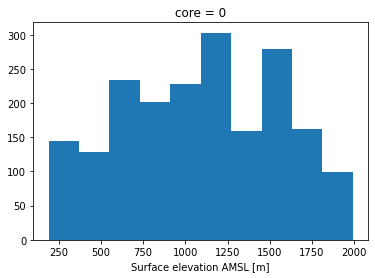

In [33]:
dsnms_d2.Z_surface.sel(times=slice(-2,0)).plot.hist()
# dsnms_d2.initial_ht_parcel_mu.sel(times=slice(-2,0)).plot.hist()
# dsnms_d2.mu_parcel_ht_msl.sel(times=slice(-2,0)).plot.hist()

## Subset cell area/ETH stats to **CI time window** and get their CI-period max values

In [34]:
xtime, time_window

(<xarray.DataArray 'times' (times: 202)> Size: 2kB
 array([-30., -15.,   0.,   5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,
         45.,  50.,  55.,  60.,  65.,  70.,  75.,  80.,  85.,  90.,  95.,
        100., 105., 110., 115., 120., 125., 130., 135., 140., 145., 150.,
        155., 160., 165., 170., 175., 180., 185., 190., 195., 200., 205.,
        210., 215., 220., 225., 230., 235., 240., 245., 250., 255., 260.,
        265., 270., 275., 280., 285., 290., 295., 300., 305., 310., 315.,
        320., 325., 330., 335., 340., 345., 350., 355., 360., 365., 370.,
        375., 380., 385., 390., 395., 400., 405., 410., 415., 420., 425.,
        430., 435., 440., 445., 450., 455., 460., 465., 470., 475., 480.,
        485., 490., 495., 500., 505., 510., 515., 520., 525., 530., 535.,
        540., 545., 550., 555., 560., 565., 570., 575., 580., 585., 590.,
        595., 600., 605., 610., 615., 620., 625., 630., 635., 640., 645.,
        650., 655., 660., 665., 670., 675., 680., 685., 690.,

In [35]:
# Find time coordinate index of the time_window
tidx_start = np.abs(xtime - np.min(time_window)).argmin().item()
tidx_end = np.abs(xtime - np.max(time_window)).argmin().item()
print(f"CI time window start index: {tidx_start}, end index: {tidx_end}")

CI time window start index: 2, end index: 14


In [36]:
# Subset DataSet to CI time_window
dsCI_d2 = dsnms_d2.isel(times=slice(tidx_start, tidx_end))
dsCI_d3 = dsnms_d3.isel(times=slice(tidx_start, tidx_end))
dsCI_d4 = dsnms_d4.isel(times=slice(tidx_start, tidx_end))

# Cell max reflectivity
maxdbz_d2 = dsCI_d2['max_dbz'].load()
maxdbz_d3 = dsCI_d3['max_dbz'].load()
maxdbz_d4 = dsCI_d4['max_dbz'].load()
# Cell ETH
maxETH_10dbz_d2 = dsCI_d2['maxETH_10dbz'].load()
maxETH_10dbz_d3 = dsCI_d3['maxETH_10dbz'].load()
maxETH_10dbz_d4 = dsCI_d4['maxETH_10dbz'].load()
# Cell diameter
cellarea_d2 = dsCI_d2['cell_area'].load()
cellarea_d3 = dsCI_d3['cell_area'].load()
cellarea_d4 = dsCI_d4['cell_area'].load()
celldiam_d2 = 2 * np.sqrt(cellarea_d2 / np.pi)
celldiam_d3 = 2 * np.sqrt(cellarea_d3 / np.pi)
celldiam_d4 = 2 * np.sqrt(cellarea_d4 / np.pi)
# Max updraft top height
trackmaxWtop_d2 = dsCI_d2.Wtop.max(dim='times')
trackmaxWtop_d3 = dsCI_d3.Wtop.max(dim='times')
trackmaxWtop_d4 = dsCI_d4.Wtop.max(dim='times')
# Calculate max W diameter (Warea_max has no times dimension)
maxWdiam_d2 = 2*np.sqrt(dsCI_d2.Warea_max/np.pi)
maxWdiam_d3 = 2*np.sqrt(dsCI_d3.Warea_max/np.pi)
maxWdiam_d4 = 2*np.sqrt(dsCI_d4.Warea_max/np.pi)

## Get **CI-max** 10dBZ ETH and cell diameter percentile values

In [37]:
trackmaxETH_10dbz_d2 = maxETH_10dbz_d2.max(dim='times')
trackmaxCellDiam_d2 = celldiam_d2.max(dim='times')
trackmaxdbz_d2 = maxdbz_d2.max(dim='times')

trackmaxETH_10dbz_d3 = maxETH_10dbz_d3.max(dim='times')
trackmaxCellDiam_d3 = celldiam_d3.max(dim='times')
trackmaxdbz_d3 = maxdbz_d3.max(dim='times')

trackmaxETH_10dbz_d4 = maxETH_10dbz_d4.max(dim='times')
trackmaxCellDiam_d4 = celldiam_d4.max(dim='times')
trackmaxdbz_d4 = maxdbz_d4.max(dim='times')

In [38]:
# Add CI-period variables to DataSet
dsnms_d2['CImaxCellDiam'] = trackmaxCellDiam_d2
dsnms_d2['CImaxETH_10dbz'] = trackmaxETH_10dbz_d2
dsnms_d2['CImaxdbz'] = trackmaxdbz_d2
dsnms_d2['CImaxWDiam'] = maxWdiam_d2

# Add CI-period variables to DataSet
dsnms_d3['CImaxCellDiam'] = trackmaxCellDiam_d3
dsnms_d3['CImaxETH_10dbz'] = trackmaxETH_10dbz_d3
dsnms_d3['CImaxdbz'] = trackmaxdbz_d3
dsnms_d3['CImaxWDiam'] = maxWdiam_d3

# Add CI-period variables to DataSet
dsnms_d4['CImaxCellDiam'] = trackmaxCellDiam_d4
dsnms_d4['CImaxETH_10dbz'] = trackmaxETH_10dbz_d4
dsnms_d4['CImaxdbz'] = trackmaxdbz_d4
dsnms_d4['CImaxWDiam'] = maxWdiam_d4

## Separate narrow vs. wide cell DataSets

In [39]:
# narrow_diam_d2 = 12.93  # km 
# narrow_diam_d3 = 7.05  # km  
# narrow_diam_d4 = 7.44  # km

# wide_diam_d2 = 15.71  # km
# wide_diam_d3 = 9.10  # km
# wide_diam_d4 = 8.97  # km

narrow_diam_d2 = 12.62  # km
narrow_diam_d3 = 7.36  # km
narrow_diam_d4 = 7.33  # km

wide_diam_d2 = 15.71  # km
wide_diam_d3 = 8.65  # km
wide_diam_d4 = 8.80 # km

In [40]:
# MU LNB threshold, cells must have LNB > this to be retained in the subsequent analysis
MULNB_thresh = 6.0  # [km]
# Threshold for max distance between updraft base and LCL height [km]
max_Wbase_LCL_dist = 2.0  # [km]
# Threshold for updraft top fit line slope
min_Wtop_slope = 0

In [41]:
# dsnms_d2.Wbase_LCL_diff.plot.hist()

## Get preCI MU LNB

In [42]:
# Select preCI time, the drop the times coordinate (this avoids conflict with cell lifetime-max variables that has no times coordinate)
# Add surface elevation to convert LNB from HAMSL to HAGL
# MULNB_d2 = ((dsnms_d2.EL_height_mu + dsnms_d2.Z_surface).sel(times=time_env)/1000).reset_coords('times', drop=True)
# MULNB_d3 = ((dsnms_d3.EL_height_mu + dsnms_d3.Z_surface).sel(times=time_env)/1000).reset_coords('times', drop=True)
# MULNB_d4 = ((dsnms_d4.EL_height_mu + dsnms_d4.Z_surface).sel(times=time_env)/1000).reset_coords('times', drop=True)
MULNB_d2 = ((dsnms_d2.EL_height_mu).sel(times=time_env)/1000).reset_coords('times', drop=True)
MULNB_d3 = ((dsnms_d3.EL_height_mu).sel(times=time_env)/1000).reset_coords('times', drop=True)
MULNB_d4 = ((dsnms_d4.EL_height_mu).sel(times=time_env)/1000).reset_coords('times', drop=True)

# MUCAPE_d2 = dsnms_d2.pCAPE_mu.sel(times=time_env).reset_coords('times', drop=True)
# MUCAPE_d3 = dsnms_d3.pCAPE_mu.sel(times=time_env).reset_coords('times', drop=True)
# MUCAPE_d4 = dsnms_d4.pCAPE_mu.sel(times=time_env).reset_coords('times', drop=True)

(array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.00167224, 0.        , 0.00501672,
        0.00334448, 0.        , 0.00668896, 0.01337793, 0.03010033,
        0.12040134, 0.28929766, 0.20234114, 0.12207358, 0.0367893 ,
        0.0083612 , 0.02006689, 0.06354515, 0.08695652, 0.14214047,
        0.19732441, 0.16722408, 0.14046823, 0.14214047, 0.0735786 ,
        0.0735786 , 0.05351171, 0.        , 0.        , 0.        ,
        0.        ]),
 array([ 0. ,  0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,
         5.5,  6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. , 10.5,
        11. , 11.5, 12. , 12.5, 13. , 13.5, 14. , 14.5, 15. , 15.5, 16. ,
        16.5, 17. , 17.5, 18. ]),
 <BarContainer object of 36 artists>)

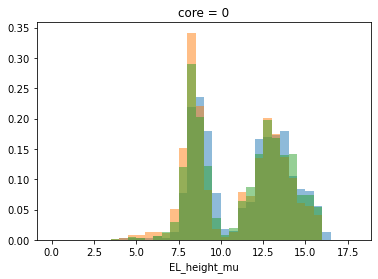

In [43]:
bins = np.arange(0, 18.1, 0.5)
MULNB_d2.plot.hist(bins=bins, alpha=0.5, label='D2', density=True)
MULNB_d3.plot.hist(bins=bins, alpha=0.5, label='D3', density=True)
MULNB_d4.plot.hist(bins=bins, alpha=0.5, label='D4', density=True)

In [44]:
# trackmaxCellDiam_d2.shape, dsnms_d2.CImaxCellDiam.shape, MULNB_d2.shape
narrow_diam_d2, wide_diam_d2, MULNB_thresh

(12.62, 15.71, 6.0)

In [45]:
# Define narrow cells:
# 1. ETH < narrow threshold
# 2. Mu LNB > MULNB_thresh
# 3. Updraft base height close to LCL
narrow_tracks_d2 = ((dsnms_d2.CImaxCellDiam < narrow_diam_d2) & (MULNB_d2 > MULNB_thresh) \
                    & (dsnms_d2.Wbase_LCL_diff <= max_Wbase_LCL_dist) \
                   ).compute()
# Define wide cells:
# 1. ETH >= wide threshold
# 2. MU LNB > MULNB_thresh
# 3. Positive updraft top slope
# 4. Updraft base height close to LCL
wide_tracks_d2 = ((dsnms_d2.CImaxCellDiam >= wide_diam_d2) & (MULNB_d2 > MULNB_thresh) \
                  & (dsnms_d2.Wtop_slope > min_Wtop_slope) \
                  & (dsnms_d2.Wbase_LCL_diff <= max_Wbase_LCL_dist) \
                 ).compute()
# Subset DataSets
ds_narrow_d2 = dsnms_d2.where(narrow_tracks_d2, drop=True)
ds_wide_d2 = dsnms_d2.where(wide_tracks_d2, drop=True)
ntracks_narrow_d2 = ds_narrow_d2.sizes['tracks']
ntracks_wide_d2 = ds_wide_d2.sizes['tracks']
print(f'Number of narrow cells (D2): {ntracks_narrow_d2}')
print(f'Number of wide cells (D2): {ntracks_wide_d2}')

# CI-window lifetime (count number of time a cell exists in the CI window)
narrow_track_lifetime_d2 = (ds_narrow_d2.isel(times=slice(tidx_start, tidx_end)).cell_area > 0).sum(dim='times') * time_res
wide_track_lifetime_d2 = (ds_wide_d2.isel(times=slice(tidx_start, tidx_end)).cell_area > 0).sum(dim='times') * time_res
# CI-max reflectivity
narrow_maxdbz_d2 = ds_narrow_d2.CImaxdbz
wide_maxdbz_d2 = ds_wide_d2.CImaxdbz
# CI-max 10dBZ ETH
narrow_maxETH10dbz_d2 = ds_narrow_d2.CImaxETH_10dbz
wide_maxETH10dbz_d2 = ds_wide_d2.CImaxETH_10dbz
# CI-max cell diameter
narrow_maxdiam_d2 = ds_narrow_d2.CImaxCellDiam
wide_maxdiam_d2 = ds_wide_d2.CImaxCellDiam
# CI-window cloud-base updraft diameter
narrow_maxWdiam_d2 = ds_narrow_d2.CImaxWDiam
wide_maxWdiam_d2 = ds_wide_d2.CImaxWDiam
# CI-window cloud-base updraft speed
narrow_maxWspeed_d2 = ds_narrow_d2.Wspeed_max
wide_maxWspeed_d2 = ds_wide_d2.Wspeed_max

Number of narrow cells (D2): 401
Number of wide cells (D2): 87


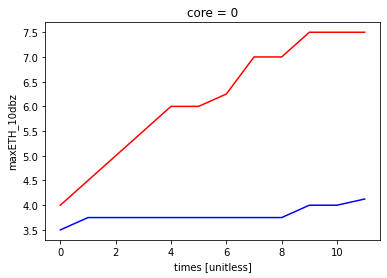

In [46]:
ds_narrow_d2.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.median(dim='tracks').plot(color='b')
ds_wide_d2.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.median(dim='tracks').plot(color='r')

(array([ 0.,  0.,  0.,  1.,  0., 14.,  7., 12., 14., 13.,  7.,  3.,  5.,
         5.,  4.,  2.,  0.,  0.,  0.,  0.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <BarContainer object of 20 artists>)

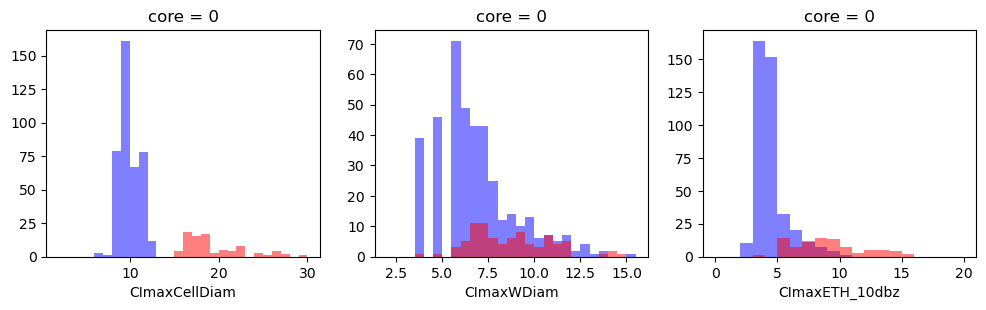

In [47]:
fig, axes = plt.subplots(1, 3, figsize=(12,3), dpi=100)
ax0 = axes[0]
bins = np.arange(2, 31, 1)
narrow_maxdiam_d2.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax0)
wide_maxdiam_d2.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax0)
ax1 = axes[1]
bins = np.arange(2, 16, 0.5)
narrow_maxWdiam_d2.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax1)
wide_maxWdiam_d2.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax1)
ax2 = axes[2]
bins = np.arange(0, 21, 1)
narrow_maxETH10dbz_d2.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax2)
wide_maxETH10dbz_d2.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax2)

In [48]:
# Define narrow cells:
# 1. ETH < narrow threshold
# 2. Mu LNB > MULNB_thresh
# 3. Updraft base height close to LCL
narrow_tracks_d3 = ((dsnms_d3.CImaxCellDiam < narrow_diam_d3) & (MULNB_d3 > MULNB_thresh) \
                    & (dsnms_d3.Wbase_LCL_diff <= max_Wbase_LCL_dist) \
                   ).compute()
# Define wide cells:
# 1. ETH >= wide threshold
# 2. MU LNB > MULNB_thresh
# 3. Positive updraft top slope
# 4. Updraft base height close to LCL
wide_tracks_d3 = ((dsnms_d3.CImaxCellDiam >= wide_diam_d3) & (MULNB_d3 > MULNB_thresh) \
                  & (dsnms_d3.Wtop_slope > min_Wtop_slope) \
                  & (dsnms_d3.Wbase_LCL_diff <= max_Wbase_LCL_dist) \
                 ).compute()
# Subset DataSets
ds_narrow_d3 = dsnms_d3.where(narrow_tracks_d3, drop=True)
ds_wide_d3 = dsnms_d3.where(wide_tracks_d3, drop=True)
ntracks_narrow_d3 = ds_narrow_d3.sizes['tracks']
ntracks_wide_d3 = ds_wide_d3.sizes['tracks']
print(f'Number of narrow cells (d3): {ntracks_narrow_d3}')
print(f'Number of wide cells (d3): {ntracks_wide_d3}')

# CI-window lifetime (count number of time a cell exists in the CI window)
narrow_track_lifetime_d3 = (ds_narrow_d3.isel(times=slice(tidx_start, tidx_end)).cell_area > 0).sum(dim='times') * time_res
wide_track_lifetime_d3 = (ds_wide_d3.isel(times=slice(tidx_start, tidx_end)).cell_area > 0).sum(dim='times') * time_res
# CI-max reflectivity
narrow_maxdbz_d3 = ds_narrow_d3.CImaxdbz
wide_maxdbz_d3 = ds_wide_d3.CImaxdbz
# CI-max 10dBZ ETH
narrow_maxETH10dbz_d3 = ds_narrow_d3.CImaxETH_10dbz
wide_maxETH10dbz_d3 = ds_wide_d3.CImaxETH_10dbz
# CI-max cell diameter
narrow_maxdiam_d3 = ds_narrow_d3.CImaxCellDiam
wide_maxdiam_d3 = ds_wide_d3.CImaxCellDiam
# CI-window cloud-base updraft diameter
narrow_maxWdiam_d3 = ds_narrow_d3.CImaxWDiam
wide_maxWdiam_d3 = ds_wide_d3.CImaxWDiam
# CI-window cloud-base updraft speed
narrow_maxWspeed_d3 = ds_narrow_d3.Wspeed_max
wide_maxWspeed_d3 = ds_wide_d3.Wspeed_max

Number of narrow cells (d3): 822
Number of wide cells (d3): 291


(array([ 0.,  0.,  0.,  0.,  0.,  1., 10., 29., 32., 80., 63., 27., 20.,
        13., 10.,  3.,  3.,  0.,  0.,  0.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <BarContainer object of 20 artists>)

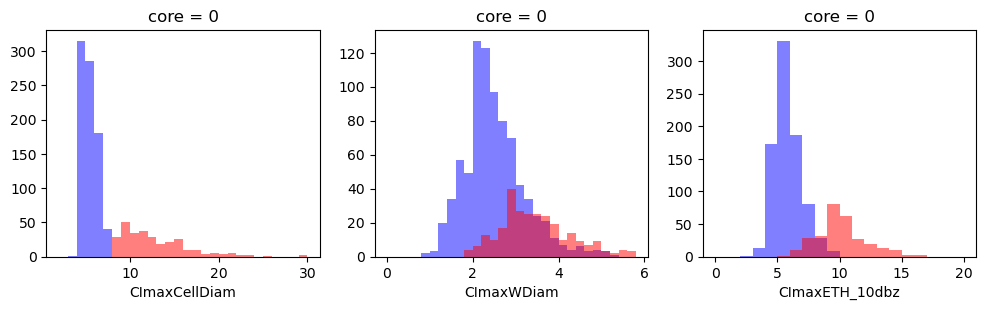

In [49]:
fig, axes = plt.subplots(1, 3, figsize=(12,3), dpi=100)
ax0 = axes[0]
bins = np.arange(2, 31, 1)
narrow_maxdiam_d3.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax0)
wide_maxdiam_d3.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax0)
ax1 = axes[1]
bins = np.arange(0, 6, 0.2)
narrow_maxWdiam_d3.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax1)
wide_maxWdiam_d3.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax1)
ax2 = axes[2]
bins = np.arange(0, 21, 1)
narrow_maxETH10dbz_d3.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax2)
wide_maxETH10dbz_d3.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax2)

In [50]:
# Define narrow cells:
# 1. ETH < narrow threshold
# 2. Mu LNB > MULNB_thresh
# 3. Updraft base height close to LCL
narrow_tracks_d4 = ((dsnms_d4.CImaxCellDiam < narrow_diam_d4) & (MULNB_d4 > MULNB_thresh) \
                    & (dsnms_d4.Wbase_LCL_diff <= max_Wbase_LCL_dist) \
                   ).compute()
# Define wide cells:
# 1. ETH >= wide threshold
# 2. MU LNB > MULNB_thresh
# 3. Positive updraft top slope
# 4. Updraft base height close to LCL
wide_tracks_d4 = ((dsnms_d4.CImaxCellDiam >= wide_diam_d4) & (MULNB_d4 > MULNB_thresh) \
                  & (dsnms_d4.Wtop_slope > min_Wtop_slope) \
                  & (dsnms_d4.Wbase_LCL_diff <= max_Wbase_LCL_dist) \
                 ).compute()
# Subset DataSets
ds_narrow_d4 = dsnms_d4.where(narrow_tracks_d4, drop=True)
ds_wide_d4 = dsnms_d4.where(wide_tracks_d4, drop=True)
ntracks_narrow_d4 = ds_narrow_d4.sizes['tracks']
ntracks_wide_d4 = ds_wide_d4.sizes['tracks']
print(f'Number of narrow cells (d4): {ntracks_narrow_d4}')
print(f'Number of wide cells (d4): {ntracks_wide_d4}')

# CI-window lifetime (count number of time a cell exists in the CI window)
narrow_track_lifetime_d4 = (ds_narrow_d4.isel(times=slice(tidx_start, tidx_end)).cell_area > 0).sum(dim='times') * time_res
wide_track_lifetime_d4 = (ds_wide_d4.isel(times=slice(tidx_start, tidx_end)).cell_area > 0).sum(dim='times') * time_res
# CI-max reflectivity
narrow_maxdbz_d4 = ds_narrow_d4.CImaxdbz
wide_maxdbz_d4 = ds_wide_d4.CImaxdbz
# CI-max 10dBZ ETH
narrow_maxETH10dbz_d4 = ds_narrow_d4.CImaxETH_10dbz
wide_maxETH10dbz_d4 = ds_wide_d4.CImaxETH_10dbz
# CI-max cell diameter
narrow_maxdiam_d4 = ds_narrow_d4.CImaxCellDiam
wide_maxdiam_d4 = ds_wide_d4.CImaxCellDiam
# CI-window cloud-base updraft diameter
narrow_maxWdiam_d4 = ds_narrow_d4.CImaxWDiam
wide_maxWdiam_d4 = ds_wide_d4.CImaxWDiam
# CI-window cloud-base updraft speed
narrow_maxWspeed_d4 = ds_narrow_d4.Wspeed_max
wide_maxWspeed_d4 = ds_wide_d4.Wspeed_max

Number of narrow cells (d4): 747
Number of wide cells (d4): 195


(array([ 0.,  0.,  0.,  0.,  0.,  0.,  8., 22., 44., 62., 30., 10.,  4.,
         4.,  3.,  8.,  0.,  0.,  0.,  0.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 <BarContainer object of 20 artists>)

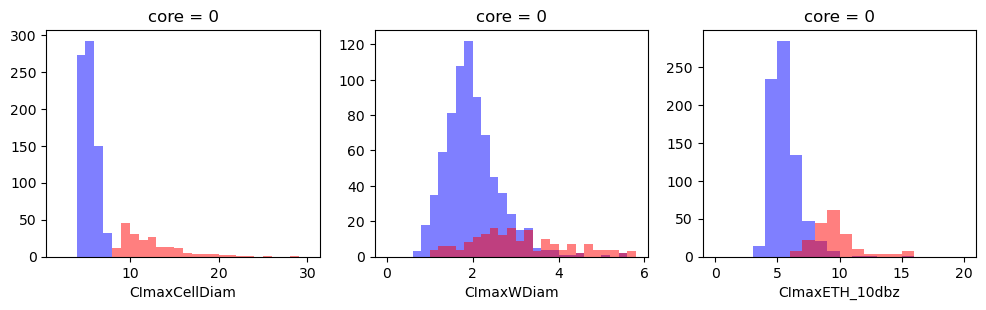

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(12,3), dpi=100)
ax0 = axes[0]
bins = np.arange(2, 31, 1)
narrow_maxdiam_d4.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax0)
wide_maxdiam_d4.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax0)
ax1 = axes[1]
bins = np.arange(0, 6, 0.2)
narrow_maxWdiam_d4.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax1)
wide_maxWdiam_d4.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax1)
ax2 = axes[2]
bins = np.arange(0, 21, 1)
narrow_maxETH10dbz_d4.plot.hist(bins=bins, color='blue', alpha=0.5, ax=ax2)
wide_maxETH10dbz_d4.plot.hist(bins=bins, color='red', alpha=0.5, ax=ax2)

# TODO: This is where futher filtering of cells based on updraft properties can be added

## Find median lifetime-max 10-dBZ ETH as threshold to further separate shallow vs. deep cells for narrow vs. wide DataSets separately

## Get lifetime-max 10-dBZ ETH median values as shallow vs. deep cell threhsolds for both narrow & wide cells

In [52]:
# max10dbz_pts_d2 = trackmaxETH_10dbz_d2.quantile(ETH_percentiles, keep_attrs=True, skipna=True)
# print(f"Max 10dBZ percentile values (D2): {max10dbz_pts_d2.values}")

In [53]:
# maxETH10dbz_thresh_d2 = trackmaxETH_10dbz_d2.quantile(0.5).item()
# print(f"D2 all cells max 10dBZ ETH threshold: {maxETH10dbz_thresh_d2} km")

# maxETH10dbz_thresh_d3 = trackmaxETH_10dbz_d3.quantile(0.5).item()
# print(f"D3 all cells max 10dBZ ETH threshold: {maxETH10dbz_thresh_d3} km")

# maxETH10dbz_thresh_d4 = trackmaxETH_10dbz_d4.quantile(0.5).item()
# print(f"D4 all cells max 10dBZ ETH threshold: {maxETH10dbz_thresh_d4} km")

### D2 wide cell DataSet

In [54]:
wide_maxETH10dbz_d2.sizes, ds_wide_d2.sizes

(Frozen({'tracks': 87}),
 Frozen({'tracks': 87, 'times': 202, 'height': 101, 'z': 40}))

In [55]:
# Get median lifetime-max 10dBZ ETH as threshold to further separate shallow vs. deep cells
wide_maxETH10dbz_thresh_d2 = wide_maxETH10dbz_d2.median()
print(f'D2 wide cells 10-dBZ ETH median: {wide_maxETH10dbz_thresh_d2:.01f} km')

# Separate shallow & deep DataSets
ds_wide_deep_d2 = ds_wide_d2.where(wide_maxETH10dbz_d2 > wide_maxETH10dbz_thresh_d2, drop=True)
ds_wide_shallow_d2 = ds_wide_d2.where(wide_maxETH10dbz_d2 <= wide_maxETH10dbz_thresh_d2, drop=True)

# Get number of tracks
ntracks_wide_deep_d2 = ds_wide_deep_d2.sizes['tracks']
ntracks_wide_shallow_d2 = ds_wide_shallow_d2.sizes['tracks']
print(f'D2 number of wide & deep tracks: {ntracks_wide_deep_d2}')
print(f'D2 number of wide & shallow tracks: {ntracks_wide_shallow_d2}')

D2 wide cells 10-dBZ ETH median: 8.0 km
D2 number of wide & deep tracks: 39
D2 number of wide & shallow tracks: 48


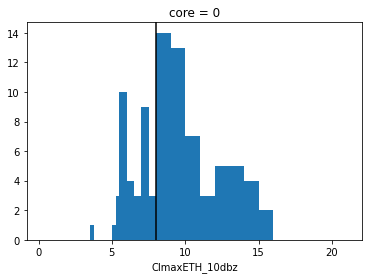

In [56]:
z_km = ds_d2.z/1000
wide_maxETH10dbz_d2.plot.hist(bins=z_km)
plt.axvline(wide_maxETH10dbz_thresh_d2, color='k')

### D2 narrow cell DataSet

In [57]:
# Get median lifetime-max 10dBZ ETH as threshold to further separate shallow vs. deep cells
narrow_maxETH10dbz_thresh_d2 = narrow_maxETH10dbz_d2.median()
print(f'D2 narrow cells 10-dBZ ETH median: {narrow_maxETH10dbz_thresh_d2:.01f} km')

# Separate shallow & deep DataSets
ds_narrow_deep_d2 = ds_narrow_d2.where(narrow_maxETH10dbz_d2 > narrow_maxETH10dbz_thresh_d2, drop=True)
ds_narrow_shallow_d2 = ds_narrow_d2.where(narrow_maxETH10dbz_d2 <= narrow_maxETH10dbz_thresh_d2, drop=True)

# Get number of tracks
ntracks_narrow_deep_d2 = ds_narrow_deep_d2.sizes['tracks']
ntracks_narrow_shallow_d2 = ds_narrow_shallow_d2.sizes['tracks']
print(f'D2 number of narrow & deep tracks: {ntracks_narrow_deep_d2}')
print(f'D2 number of narrow & shallow tracks: {ntracks_narrow_shallow_d2}')

D2 narrow cells 10-dBZ ETH median: 4.0 km
D2 number of narrow & deep tracks: 179
D2 number of narrow & shallow tracks: 222


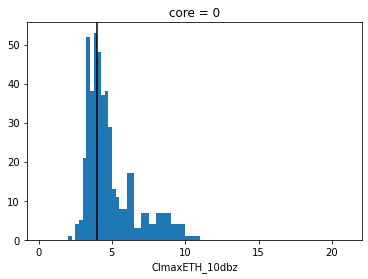

In [58]:
z_km = ds_d2.z/1000
narrow_maxETH10dbz_d2.plot.hist(bins=z_km)
plt.axvline(narrow_maxETH10dbz_thresh_d2, color='k')

(array([22., 26., 39.]),
 array([ 3.5,  7. ,  9. , 15. ]),
 <BarContainer object of 3 artists>)

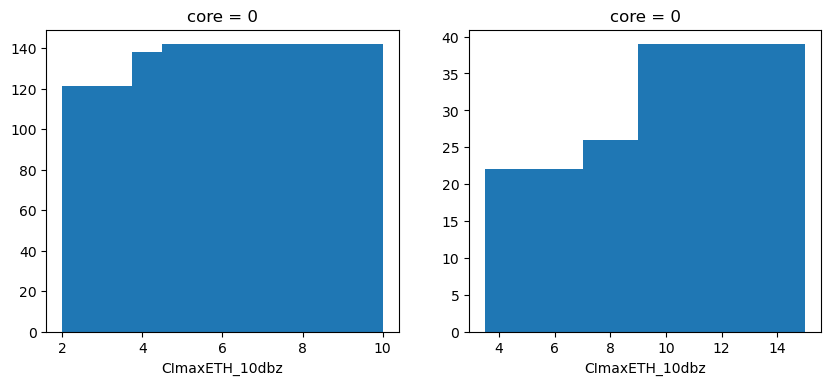

In [59]:
# Get quantile-based bin edges for ETH
nbins_ETH = 3
ETH_bins_n = np.quantile(narrow_maxETH10dbz_d2, np.linspace(0, 1, nbins_ETH + 1))
ETH_bins_w = np.quantile(wide_maxETH10dbz_d2, np.linspace(0, 1, nbins_ETH + 1))
# 
fig, axes = plt.subplots(1,2, figsize=(10,4), dpi=100)
narrow_maxETH10dbz_d2.plot.hist(bins=ETH_bins_n, ax=axes[0])
wide_maxETH10dbz_d2.plot.hist(bins=ETH_bins_w, ax=axes[1])

### D3 wide cell DataSet

In [60]:
# Get median lifetime-max 10dBZ ETH as threshold to further separate shallow vs. deep cells
wide_maxETH10dbz_thresh_d3 = wide_maxETH10dbz_d3.median()
print(f'd3 wide cells 10-dBZ ETH median: {wide_maxETH10dbz_thresh_d3:.01f} km')

# Separate shallow & deep DataSets
ds_wide_deep_d3 = ds_wide_d3.where(wide_maxETH10dbz_d3 >= wide_maxETH10dbz_thresh_d3, drop=True)
ds_wide_shallow_d3 = ds_wide_d3.where(wide_maxETH10dbz_d3 < wide_maxETH10dbz_thresh_d3, drop=True)

# Get number of tracks
ntracks_wide_deep_d3 = ds_wide_deep_d3.sizes['tracks']
ntracks_wide_shallow_d3 = ds_wide_shallow_d3.sizes['tracks']
print(f'D3 number of wide & deep tracks: {ntracks_wide_deep_d3}')
print(f'D3 number of wide & shallow tracks: {ntracks_wide_shallow_d3}')

d3 wide cells 10-dBZ ETH median: 9.0 km


D3 number of wide & deep tracks: 219
D3 number of wide & shallow tracks: 72


### D3 narrow cell DataSet

In [61]:
# Get median lifetime-max 10dBZ ETH as threshold to further separate shallow vs. deep cells
narrow_maxETH10dbz_thresh_d3 = narrow_maxETH10dbz_d3.median()
print(f'd3 narrow cells 10-dBZ ETH median: {narrow_maxETH10dbz_thresh_d3:.01f} km')

# Separate shallow & deep DataSets
ds_narrow_deep_d3 = ds_narrow_d3.where(narrow_maxETH10dbz_d3 >= narrow_maxETH10dbz_thresh_d3, drop=True)
ds_narrow_shallow_d3 = ds_narrow_d3.where(narrow_maxETH10dbz_d3 < narrow_maxETH10dbz_thresh_d3, drop=True)

# Get number of tracks
ntracks_narrow_deep_d3 = ds_narrow_deep_d3.sizes['tracks']
ntracks_narrow_shallow_d3 = ds_narrow_shallow_d3.sizes['tracks']
print(f'D3 number of narrow & deep tracks: {ntracks_narrow_deep_d3}')
print(f'D3 number of narrow & shallow tracks: {ntracks_narrow_shallow_d3}')

d3 narrow cells 10-dBZ ETH median: 5.5 km
D3 number of narrow & deep tracks: 452
D3 number of narrow & shallow tracks: 370


### D4 wide cell DataSet

In [62]:
# Get median lifetime-max 10dBZ ETH as threshold to further separate shallow vs. deep cells
wide_maxETH10dbz_thresh_d4 = wide_maxETH10dbz_d4.median()
print(f'd4 wide cells 10-dBZ ETH median: {wide_maxETH10dbz_thresh_d4:.01f} km')

# Separate shallow & deep DataSets
ds_wide_deep_d4 = ds_wide_d4.where(wide_maxETH10dbz_d4 >= wide_maxETH10dbz_thresh_d4, drop=True)
ds_wide_shallow_d4 = ds_wide_d4.where(wide_maxETH10dbz_d4 < wide_maxETH10dbz_thresh_d4, drop=True)

# Get number of tracks
ntracks_wide_deep_d4 = ds_wide_deep_d4.sizes['tracks']
ntracks_wide_shallow_d4 = ds_wide_shallow_d4.sizes['tracks']
print(f'D4 number of wide & deep tracks: {ntracks_wide_deep_d4}')
print(f'D4 number of wide & shallow tracks: {ntracks_wide_shallow_d4}')

d4 wide cells 10-dBZ ETH median: 9.0 km
D4 number of wide & deep tracks: 121
D4 number of wide & shallow tracks: 74


### D4 narrow cell DataSet

In [63]:
# Get median lifetime-max 10dBZ ETH as threshold to further separate shallow vs. deep cells
narrow_maxETH10dbz_thresh_d4 = narrow_maxETH10dbz_d4.median()
print(f'd4 narrow cells 10-dBZ ETH median: {narrow_maxETH10dbz_thresh_d4:.01f} km')

# Separate shallow & deep DataSets
ds_narrow_deep_d4 = ds_narrow_d4.where(narrow_maxETH10dbz_d4 >= narrow_maxETH10dbz_thresh_d4, drop=True)
ds_narrow_shallow_d4 = ds_narrow_d4.where(narrow_maxETH10dbz_d4 < narrow_maxETH10dbz_thresh_d4, drop=True)

# Get number of tracks
ntracks_narrow_deep_d4 = ds_narrow_deep_d4.sizes['tracks']
ntracks_narrow_shallow_d4 = ds_narrow_shallow_d4.sizes['tracks']
print(f'D4 number of narrow & deep tracks: {ntracks_narrow_deep_d4}')
print(f'D4 number of narrow & shallow tracks: {ntracks_narrow_shallow_d4}')

d4 narrow cells 10-dBZ ETH median: 5.2 km
D4 number of narrow & deep tracks: 398
D4 number of narrow & shallow tracks: 349


Text(0.5, 1.0, 'D4')

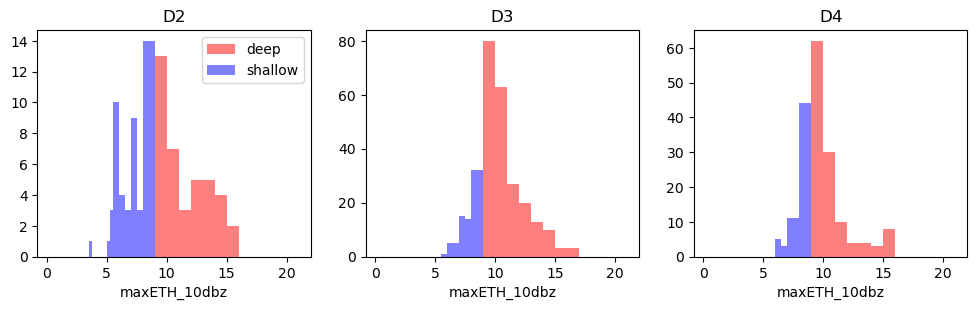

In [64]:
fig, axes = plt.subplots(1, 3, figsize=(12,3), dpi=100)
# bins = np.arange(0, 18.1, 0.5)
bins = ds_d2.z.values/1000.
ax1 = axes[0]
ds_wide_deep_d2.maxETH_10dbz.isel(times=slice(tidx_start, tidx_end)).max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5, ax=ax1, label='deep')
ds_wide_shallow_d2.maxETH_10dbz.isel(times=slice(tidx_start, tidx_end)).max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5, ax=ax1, label='shallow')
ax1.legend()
ax1.set_title('D2')
ax2 = axes[1]
ds_wide_deep_d3.maxETH_10dbz.isel(times=slice(tidx_start, tidx_end)).max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5, ax=ax2)
ds_wide_shallow_d3.maxETH_10dbz.isel(times=slice(tidx_start, tidx_end)).max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5, ax=ax2)
ax2.set_title('D3')
ax3 = axes[2]
ds_wide_deep_d4.maxETH_10dbz.isel(times=slice(tidx_start, tidx_end)).max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5, ax=ax3)
ds_wide_shallow_d4.maxETH_10dbz.isel(times=slice(tidx_start, tidx_end)).max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5, ax=ax3)
ax3.set_title('D4')

Text(0.5, 1.0, 'D4')

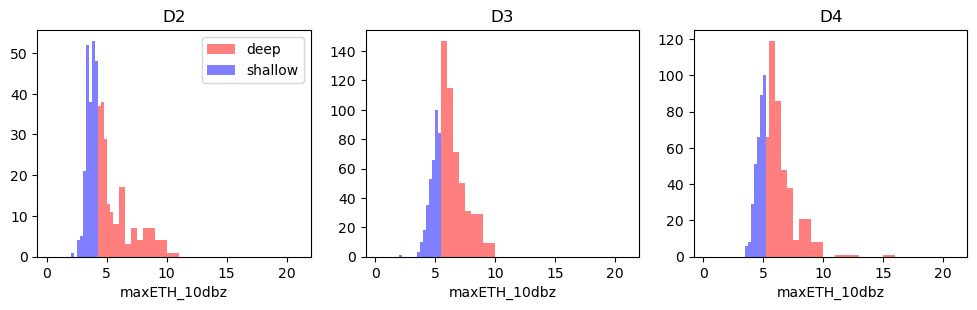

In [65]:
# bins = np.arange(0, 18.1, 1)
# ds_narrow_deep_d2.maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5)
# ds_narrow_shallow_d2.maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5)

fig, axes = plt.subplots(1, 3, figsize=(12,3), dpi=100)
# bins = np.arange(0, 18.1, 0.5)
bins = ds_d2.z.values/1000.
ax1 = axes[0]
ds_narrow_deep_d2.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5, ax=ax1, label='deep')
ds_narrow_shallow_d2.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5, ax=ax1, label='shallow')
ax1.legend()
ax1.set_title('D2')
ax2 = axes[1]
ds_narrow_deep_d3.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5, ax=ax2)
ds_narrow_shallow_d3.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5, ax=ax2)
ax2.set_title('D3')
ax3 = axes[2]
ds_narrow_deep_d4.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='r', alpha=0.5, ax=ax3)
ds_narrow_shallow_d4.isel(times=slice(tidx_start, tidx_end)).maxETH_10dbz.max(dim='times').plot.hist(bins=bins, color='b', alpha=0.5, ax=ax3)
ax3.set_title('D4')

## Composite DataSets to get mean

In [66]:
# preCI_nt = -12  # number of preCI times
preCI_nt = -2  # number of preCI times
xtime_preCI = xtime.sel(times=slice(preCI_nt,0))
xtime_preCI

<xarray.DataArray 'times' (times: 3)> Size: 24B
array([-30., -15.,   0.])
Coordinates:
  * times    (times) int64 24B -2 -1 0
    core     int64 8B 0

## Group DataSets by dates

In [67]:
dates_narrow_d2 = ds_narrow_d2.date
dates_wide_d2 = ds_wide_d2.date

dates_narrow_d3 = ds_narrow_d3.date
dates_wide_d3 = ds_wide_d3.date

dates_narrow_d4 = ds_narrow_d4.date
dates_wide_d4 = ds_wide_d4.date

In [68]:
unique_dates = np.unique(dates_narrow_d2)
unique_dates_str = pd.to_datetime(unique_dates).strftime('%Y-%m-%d')
unique_dates_str
# pd.to_datetime(str(unique_dates)) 
# unique_dates.strftime('%Y-%m-%d')

Index(['2018-11-29', '2018-12-04', '2018-12-05', '2019-01-22', '2019-01-23',
       '2019-01-25', '2019-01-29', '2019-02-08'],
      dtype='object')

In [69]:
ntracks_narrow_dates_d2 = ds_narrow_d2.tracks.groupby(dates_narrow_d2).count()
ntracks_wide_dates_d2 = ds_wide_d2.tracks.groupby(dates_wide_d2).count()

ntracks_narrow_dates_d3 = ds_narrow_d3.tracks.groupby(dates_narrow_d3).count()
ntracks_wide_dates_d3 = ds_wide_d3.tracks.groupby(dates_wide_d3).count()

ntracks_narrow_dates_d4 = ds_narrow_d4.tracks.groupby(dates_narrow_d4).count()
ntracks_wide_dates_d4 = ds_wide_d4.tracks.groupby(dates_wide_d4).count()

In [70]:
def plot_bars(bar_data, xlabel=None, ylabel=None, title=None, figsize=None, figname=None, fontsize=None, bold_xlabel=False, name_map=None):
    # plt.rcParams['font.family'] = 'DejaVu Serif'
    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'

    x = np.arange(len(xlabel))  # the label locations
    width = 0.2  # the width of the bars
    lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
    if name_map is None:
        name_map = {'d2':'2.5 km', 'd3':'500 m', 'd4':'100 m'}

    fig, ax = plt.subplots(figsize=figsize, dpi=100)
    bars2 = ax.bar(x - width, bar_data['d2'], width, label=name_map['d2'], color=lcolors['d2'])
    bars3 = ax.bar(x, bar_data['d3'], width, label=name_map['d3'], color=lcolors['d3'])
    bars4 = ax.bar(x + width, bar_data['d4'], width, label=name_map['d4'], color=lcolors['d4'])

    # Create font properties
    bold_font = FontProperties(weight='bold', family='Helvetica')
    regular_font = FontProperties(weight='normal', family='Helvetica')

    if bold_xlabel:
        # Function to format labels
        def format_label(label):
            parts = label.split('.')
            return f"$\\bf{{{parts[0]}}}$.{parts[1]}"

        # Format xlabels
        formatted_xlabels = [format_label(label) for label in xlabel]
    else:
        formatted_xlabels = xlabel

    # Add some text for labels, title and custom x-axis tick labels, etc.
    # ax.set_xlabel('Cases')
    ax.set_ylabel(ylabel)
    ax.set_title(title, loc='left')
    ax.set_xticks(x)
    ax.set_xticklabels(formatted_xlabels, rotation=30, ha='right')
    ax.grid(ls=':', axis='y')
    ax.legend()

    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

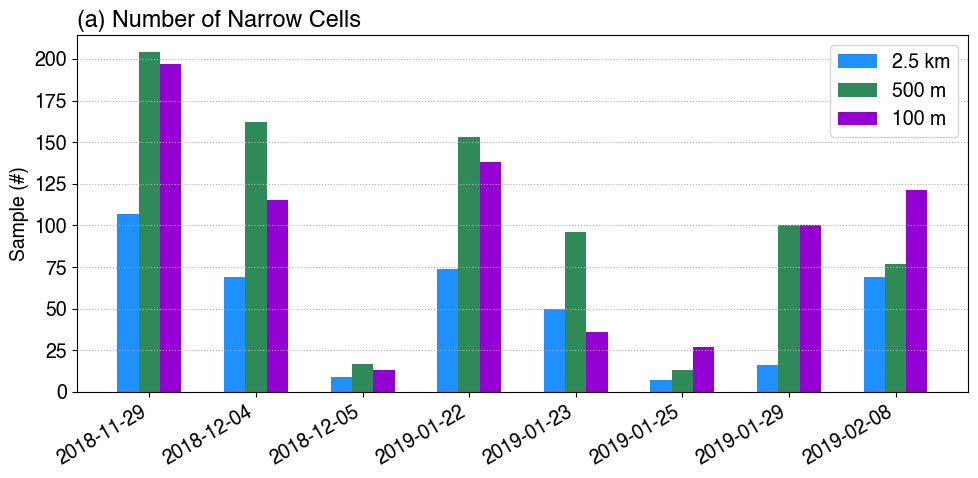

In [71]:
x = np.arange(len(unique_dates))
bar_data = {'d2':ntracks_narrow_dates_d2, 'd3':ntracks_narrow_dates_d3, 'd4':ntracks_narrow_dates_d4}
ylabel = 'Sample (#)'
title = '(a) Number of Narrow Cells'
fontsize = 14
figsize = [10,5]
figname = f'{figdir}CellNumberByDate_narrow_d2_d3_d4.png'
fig = plot_bars(bar_data, xlabel=unique_dates_str, ylabel=ylabel, title=title, fontsize=fontsize, figsize=figsize, figname=figname)

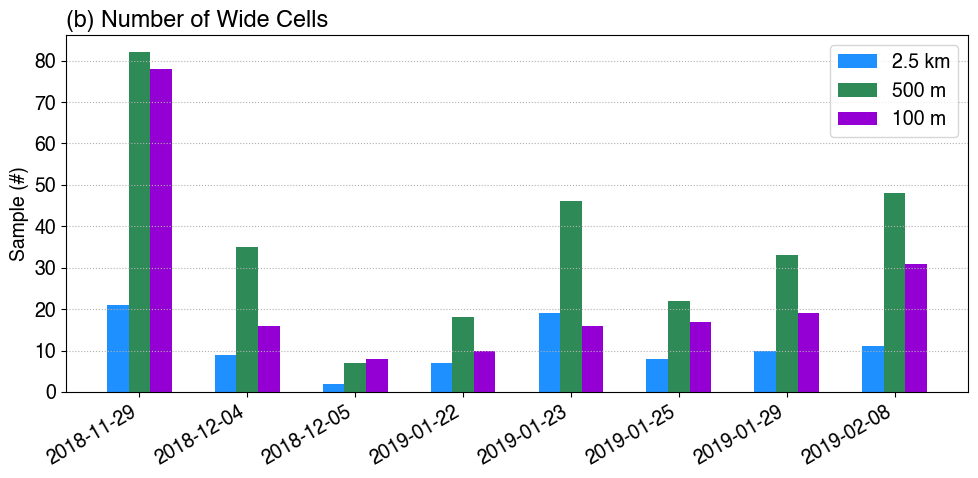

In [72]:
x = np.arange(len(unique_dates))
bar_data = {'d2':ntracks_wide_dates_d2, 'd3':ntracks_wide_dates_d3, 'd4':ntracks_wide_dates_d4}
ylabel = 'Sample (#)'
title = '(b) Number of Wide Cells'
fontsize = 14
figsize = [10,5]
figname = f'{figdir}CellNumberByDate_wide_d2_d3_d4.png'
fig = plot_bars(bar_data, xlabel=unique_dates_str, ylabel=ylabel, title=title, fontsize=fontsize, figsize=figsize, figname=figname)

In [73]:
# Median 10dBZ ETH by date
narrow_maxETH10dbz_thresh_bydate_d2 = ds_narrow_d2.CImaxETH_10dbz.groupby(dates_narrow_d2).median()
narrow_maxETH10dbz_thresh_bydate_d2

<xarray.DataArray 'CImaxETH_10dbz' (date: 8)> Size: 32B
array([4.   , 4.75 , 4.75 , 3.75 , 4.125, 5.   , 4.375, 3.5  ],
      dtype=float32)
Coordinates:
    core     int64 8B 0
  * date     (date) datetime64[ns] 64B 2018-11-29 2018-12-04 ... 2019-02-08

In [74]:
# # # Separate shallow & deep DataSets
# # ds_narrow_deep_d4 = ds_narrow_d4.where(narrow_maxETH10dbz_d4 >= narrow_maxETH10dbz_thresh_d4, drop=True)

# mask = ds_narrow_d2.CImaxETH_10dbz.groupby(dates_narrow_d2) < narrow_maxETH10dbz_thresh_bydate_d2
# ds_narrow_d2.CImaxETH_10dbz.where((mask == True) & (dates_narrow_d2 == pd.to_datetime('2019-02-08'))).plot.hist()

In [75]:
# (ds_narrow_d2.CImaxETH_10dbz.groupby(dates_narrow_d2) < narrow_maxETH10dbz_thresh_bydate_d2).groupby(dates_narrow_d2).sum()

In [76]:
# (ds_narrow_d2.CImaxETH_10dbz.groupby(dates_narrow_d2) >= narrow_maxETH10dbz_thresh_bydate_d2).groupby(dates_narrow_d2).sum()

In [77]:
# # Get MU parcel height prior to CI
# mu_parcel_ht_narrow_d2 = ds_narrow_d2.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
# # Filter heights below MU parcel height, select a preCI time
# thetaE_narrow_d2 = ds_narrow_d2["thetaE"].where(height >= mu_parcel_ht_narrow_d2).sel(times=time_env)

# # Make shallow/deep ETH thresholds by dates
# narrow_shallow_d2 = ds_narrow_d2.CImaxETH_10dbz.groupby(dates_narrow_d2) < narrow_maxETH10dbz_thresh_bydate_d2
# narrow_deep_d2 = ds_narrow_d2.CImaxETH_10dbz.groupby(dates_narrow_d2) >= narrow_maxETH10dbz_thresh_bydate_d2

# # Separate shallow/deep by date, then groupby date and take the median
# ThetaE_narrow_shallow_med_dates_d2 = thetaE_narrow_d2.where(narrow_shallow_d2 == True).groupby(dates_narrow_d2).median()
# ThetaE_narrow_deep_med_dates_d2 = thetaE_narrow_d2.where(narrow_deep_d2 == True).groupby(dates_narrow_d2).median()
# # ThetaE_narrow_shallow_med_dates_d2

In [78]:
# # narrow_shallow_d2.groupby(dates_narrow_d2).sum()
# tmp1 = (thetaE_narrow_d2.where(narrow_shallow_d2 == True) > 0).groupby(dates_narrow_d2).sum(dim='tracks')
# tmp2 = (~np.isnan(thetaE_narrow_d2.where(narrow_shallow_d2 == True))).groupby(dates_narrow_d2).sum(dim='tracks')
# np.nanmax(tmp1 - tmp2)

In [79]:
varname = "CoreBuoyThtv_up"
operation='max'

dates = ds_narrow_d2.date
# dates

# Get quantile-based bin edges for ETH
nbins_ETH = 3
ETH_bins = np.quantile(ds_narrow_d2["CImaxETH_10dbz"], np.linspace(0, 1, nbins_ETH + 1))
# ETH_bins

for ii in range(nbins_ETH):
    # print(ETH_bins[ii], ETH_bins[ii+1])

    mask = (ds_narrow_d2["CImaxETH_10dbz"] >= ETH_bins[ii]) & (ds_narrow_d2["CImaxETH_10dbz"] < ETH_bins[ii+1])

    # print(mask)
    VAR = ds_narrow_d2[varname].isel(times=slice(tidx_start, tidx_end))
    VAR_s = getattr(VAR, operation)(dim=('times')).where(mask, drop=True)
    print(ETH_bins[ii], ETH_bins[ii+1], VAR_s.shape)
# ds_narrow_d2["CImaxETH_10dbz"].plot.hist()

2.0 3.75 (121, 40)
3.75 4.5 (138, 40)
4.5 10.0 (141, 40)


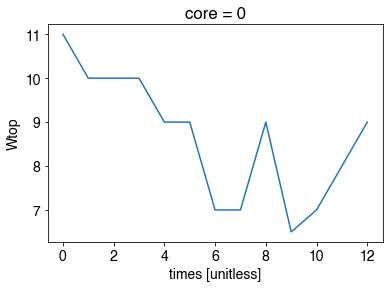

In [80]:
ds_narrow_d2.Wtop.max(dim='tracks').plot()

## Composite updraft profiles by aligning to cloud base, and group by ETH bins

In [81]:
def updraft_prof_cbase_nbins(ds, varname, operation=None, filter_Wmask=True, filter_muparcelht=True, quantiles=[0.25,0.5,0.75], nbins_ETH=None):
    
    # # Get dates
    # dates = ds.date
    # # Height coordinate for updraft variables
    # height_core = ds.z
    # Interpolated height coordinate [m]
    height_core_interp = np.arange(0, 20000.1, 200)

    # Get quantile-based bin edges for ETH
    # ETH_bins = np.quantile(ds["CImaxETH_10dbz"], np.linspace(0, 1, nbins_ETH + 1))
    # CImaxWTH = ds["Wtop"].max(dim='times')
    # ETH_bins = np.quantile(CImaxWTH, np.linspace(0, 1, nbins_ETH + 1))

    # Use Pandas qcut to produce equal-count bins
    # q=4 -> 4 equal-frequency bins; retbins=True returns the edges
    ETH_quantiles = np.linspace(0, 1, nbins_ETH + 1)
    # Convert DataArray to Pandas series
    s = pd.Series(ds["CImaxETH_10dbz"]).dropna()
    # Add a tiny reproducible jitter
    rng = np.random.RandomState(42)                # fixed seed for reproducibility
    eps = 1e-6 * (s.max() - s.min() + 1)          # tiny jitter scale relative to data range
    s_jitter = s + rng.uniform(-eps, eps, size=len(s))

    labels, ETH_bins = pd.qcut(s_jitter, q=ETH_quantiles, retbins=True)
    # top edges are ETH_bins[1:]
    ETH_bins_top = ETH_bins[1:]
    
    # Note: Wbase/Wtop unit is [km], convert to [m] to match original height coordinate
    # Average updraft base height
    Wbase_avg = ds['Wbase'].isel(times=slice(tidx_start, tidx_end)).mean(dim='times')*1000
    # Max updraft top height
    Wtop_max = ds['Wtop'].isel(times=slice(tidx_start, tidx_end)).max(dim='times')*1000
    # Cloud depth
    Wdepth = Wtop_max - Wbase_avg

    # Get variable from DataSet, mask with updraft mask, subset CI-period: filter heights below MU parcel height
    if filter_Wmask:
        VAR = ds[varname].where(ds["Wmask"] == True).isel(times=slice(tidx_start, tidx_end))
    else:
        VAR = ds[varname].isel(times=slice(tidx_start, tidx_end))

    VAR_mean_out = []
    VAR_inqt_out = []
    ns_prof_out = []
    Wdepth_mean_out = []
    Wdepth_inqt_out = []

    # Loop over each ETH bin
    for ii in range(nbins_ETH):
        # Make mask for the ETH bin
        mask = (ds["CImaxETH_10dbz"] >= ETH_bins[ii]) & (ds["CImaxETH_10dbz"] < ETH_bins[ii+1])

        # Use getattr to call the operation dynamically (e.g., operation: 'max', 'mean')
        VAR_s = getattr(VAR, operation)(dim=('times')).where(mask, drop=True)
        Wbase_s = Wbase_avg.where(mask, drop=True)
        Wdepth_s = Wdepth.where(mask, drop=True)               
        
        # Interpolate VAR to constant-spaced height
        VAR_s_interp = VAR_s.interp(z=height_core_interp)

        # Broadcast Wbase to match the VAR shape
        _Wbase_s = Wbase_s.broadcast_like(VAR_s_interp)
        
        # Shift the height coordinate by Wbase height, the new coordinate 'z' will be 2D [z,tracks]
        VAR_s_shifted = VAR_s_interp.assign_coords({'z':(VAR_s_interp.coords['z'] - _Wbase_s)})
        # VAR_d_shifted = VAR_d_interp.assign_coords({'z':(VAR_d_interp.coords['z'] - _Wbase_d)})
        VAR_s_shifted['z'].attrs = {'units':'m'}
        
        VAR_s_Wbase = []
        # Loop over each track
        for track_idx in range(len(VAR_s_shifted.coords['tracks'])):
            # Select one track at a time
            _VAR = VAR_s_shifted.isel(tracks=track_idx)
            # Interpolate again to the new common height grid
            _VAR_interp = _VAR.interp(z=height_core_interp)
            # Store the aligned profile
            VAR_s_Wbase.append(_VAR_interp)
            
        # Stack the aligned profiles along a new dimension
        VAR_s_Wbase = xr.concat(VAR_s_Wbase, dim='tracks')
        
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            # Compute mean
            VAR_s_mean = VAR_s_Wbase.mean(dim='tracks', keep_attrs=True)
            # Compute quantiles
            VAR_s_inqt = VAR_s_Wbase.quantile(quantiles, dim='tracks', keep_attrs=True)
            # Get sample size profiles by dates
            ns_prof_s = (~np.isnan(VAR_s_Wbase)).sum(dim='tracks')
            # Depth statistics
            Wdepth_s_mean = Wdepth_s.mean(keep_attrs=True)
            Wdepth_s_inqt = Wdepth_s.quantile(quantiles)

        # Append the profiles for output
        VAR_mean_out.append(VAR_s_mean)
        VAR_inqt_out.append(VAR_s_inqt)
        ns_prof_out.append(ns_prof_s)
        Wdepth_mean_out.append(Wdepth_s_mean)
        Wdepth_inqt_out.append(Wdepth_s_inqt)

    # Convert list to DataArray by a new dimension
    VAR_mean_out = xr.concat(VAR_mean_out, dim='ETH')
    VAR_inqt_out = xr.concat(VAR_inqt_out, dim='ETH')
    ns_prof_out = xr.concat(ns_prof_out, dim='ETH')
    Wdepth_mean_out = xr.concat(Wdepth_mean_out, dim='ETH')
    Wdepth_inqt_out = xr.concat(Wdepth_inqt_out, dim='ETH')
    # Assign coordinate
    VAR_mean_out = VAR_mean_out.assign_coords({'ETH':ETH_bins_top})
    VAR_inqt_out = VAR_inqt_out.assign_coords({'ETH':ETH_bins_top})
    ns_prof_out = ns_prof_out.assign_coords({'ETH':ETH_bins_top})
    Wdepth_mean_out = Wdepth_mean_out.assign_coords({'ETH':ETH_bins_top})
    Wdepth_inqt_out = Wdepth_inqt_out.assign_coords({'ETH':ETH_bins_top})
    
    return VAR_mean_out, VAR_inqt_out, ns_prof_out, Wdepth_mean_out, Wdepth_inqt_out, ETH_bins

In [83]:
quantiles = [0.25, 0.5, 0.75]
# quantiles = [0.5]
nbins_ETH = 4
# Buoyancy
MaxCoreBuoy_n_avg_d2, MaxCoreBuoy_n_inqt_d2, nsMaxCoreBuoy_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreBuoy_w_avg_d2, MaxCoreBuoy_w_inqt_d2, nsMaxCoreBuoy_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [84]:
# Buoyancy
MaxCoreBuoy_n_avg_d3, MaxCoreBuoy_n_inqt_d3, nsMaxCoreBuoy_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreBuoy_w_avg_d3, MaxCoreBuoy_w_inqt_d3, nsMaxCoreBuoy_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [85]:
# Buoyancy
MaxCoreBuoy_n_avg_d4, MaxCoreBuoy_n_inqt_d4, nsMaxCoreBuoy_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreBuoy_w_avg_d4, MaxCoreBuoy_w_inqt_d4, nsMaxCoreBuoy_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [88]:
# Buoyancy (based on density potential temperature)
MaxCoreBuoyTrho_n_avg_d2, MaxCoreBuoyTrho_n_inqt_d2, nsMaxCoreBuoyTrho_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreBuoyTrho_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreBuoyTrho_w_avg_d2, MaxCoreBuoyTrho_w_inqt_d2, nsMaxCoreBuoyTrho_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2, 'CoreBuoyTrho_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [87]:
# Buoyancy (based on density potential temperature)
MaxCoreBuoyTrho_n_avg_d3, MaxCoreBuoyTrho_n_inqt_d3, nsMaxCoreBuoyTrho_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreBuoyTrho_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreBuoyTrho_w_avg_d3, MaxCoreBuoyTrho_w_inqt_d3, nsMaxCoreBuoyTrho_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3, 'CoreBuoyTrho_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [86]:
# Buoyancy (based on density potential temperature)
MaxCoreBuoyTrho_n_avg_d4, MaxCoreBuoyTrho_n_inqt_d4, nsMaxCoreBuoyTrho_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreBuoyTrho_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreBuoyTrho_w_avg_d4, MaxCoreBuoyTrho_w_inqt_d4, nsMaxCoreBuoyTrho_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4, 'CoreBuoyTrho_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [89]:
# Core diameter
MaxCoreArea_n_avg_d2, MaxCoreArea_n_inqt_d2, nsMaxCoreDiam_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreArea_w_avg_d2, MaxCoreArea_w_inqt_d2, nsMaxCoreDiam_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

# Convert area to equivalent diameter
MaxCoreDiam_n_avg_d2 = 2*np.sqrt(MaxCoreArea_n_avg_d2/np.pi)
MaxCoreDiam_n_inqt_d2 = 2*np.sqrt(MaxCoreArea_n_inqt_d2/np.pi)
MaxCoreDiam_w_avg_d2 = 2*np.sqrt(MaxCoreArea_w_avg_d2/np.pi)
MaxCoreDiam_w_inqt_d2 = 2*np.sqrt(MaxCoreArea_w_inqt_d2/np.pi)


In [90]:
# Core diameter
MaxCoreArea_n_avg_d3, MaxCoreArea_n_inqt_d3, nsMaxCoreDiam_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreArea_w_avg_d3, MaxCoreArea_w_inqt_d3, nsMaxCoreDiam_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

# Convert area to equivalent diameter
MaxCoreDiam_n_avg_d3 = 2*np.sqrt(MaxCoreArea_n_avg_d3/np.pi)
MaxCoreDiam_n_inqt_d3 = 2*np.sqrt(MaxCoreArea_n_inqt_d3/np.pi)
MaxCoreDiam_w_avg_d3 = 2*np.sqrt(MaxCoreArea_w_avg_d3/np.pi)
MaxCoreDiam_w_inqt_d3 = 2*np.sqrt(MaxCoreArea_w_inqt_d3/np.pi)

In [91]:
# Core diameter
MaxCoreArea_n_avg_d4, MaxCoreArea_n_inqt_d4, nsMaxCoreDiam_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreArea_w_avg_d4, MaxCoreArea_w_inqt_d4, nsMaxCoreDiam_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

# Convert area to equivalent diameter
MaxCoreDiam_n_avg_d4 = 2*np.sqrt(MaxCoreArea_n_avg_d4/np.pi)
MaxCoreDiam_n_inqt_d4 = 2*np.sqrt(MaxCoreArea_n_inqt_d4/np.pi)
MaxCoreDiam_w_avg_d4 = 2*np.sqrt(MaxCoreArea_w_avg_d4/np.pi)
MaxCoreDiam_w_inqt_d4 = 2*np.sqrt(MaxCoreArea_w_inqt_d4/np.pi)

In [92]:
# Exclude 2018 dates for testing wide cells
min_date = pd.Timestamp('2019-01-01')
ds_wide_d4_2019 = ds_wide_d4.where(ds_wide_d4.date > min_date, drop=True)

MaxCoreArea_w_avg_d4_2019, MaxCoreArea_w_inqt_d4_2019, nsMaxCoreDiam_w_d4_2019, Wdepth_w_avg_d4_2019, Wdepth_w_inqt_d4_2019, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4_2019, 'CoreArea_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

# Convert area to equivalent diameter
MaxCoreDiam_w_avg_d4_2019 = 2*np.sqrt(MaxCoreArea_w_avg_d4_2019/np.pi)
MaxCoreDiam_w_inqt_d4_2019 = 2*np.sqrt(MaxCoreArea_w_inqt_d4_2019/np.pi)

In [93]:
# Core Mass Flux
MaxCoreMassFlux_n_avg_d2, MaxCoreMassFlux_n_inqt_d2, nsMaxCoreMassFlux_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreMassFlux_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreMassFlux_w_avg_d2, MaxCoreMassFlux_w_inqt_d2, nsMaxCoreMassFlux_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2, 'CoreMassFlux_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [94]:
# Core Mass Flux
MaxCoreMassFlux_n_avg_d3, MaxCoreMassFlux_n_inqt_d3, nsMaxCoreMassFlux_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreMassFlux_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreMassFlux_w_avg_d3, MaxCoreMassFlux_w_inqt_d3, nsMaxCoreMassFlux_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3, 'CoreMassFlux_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [95]:
# Core Mass Flux
MaxCoreMassFlux_n_avg_d4, MaxCoreMassFlux_n_inqt_d4, nsMaxCoreMassFlux_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreMassFlux_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreMassFlux_w_avg_d4, MaxCoreMassFlux_w_inqt_d4, nsMaxCoreMassFlux_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4, 'CoreMassFlux_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)


In [96]:
# Core Mean W
MaxCoreMeanW_n_avg_d2, MaxCoreMeanW_n_inqt_d2, nsMaxCoreMeanW_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreMeanW_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreMeanW_w_avg_d2, MaxCoreMeanW_w_inqt_d2, nsMaxCoreMeanW_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2,'CoreMeanW_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [97]:
# Core Mean W
MaxCoreMeanW_n_avg_d3, MaxCoreMeanW_n_inqt_d3, nsMaxCoreMeanW_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreMeanW_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreMeanW_w_avg_d3, MaxCoreMeanW_w_inqt_d3, nsMaxCoreMeanW_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3,'CoreMeanW_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [98]:
# Core Mean W
MaxCoreMeanW_n_avg_d4, MaxCoreMeanW_n_inqt_d4, nsMaxCoreMeanW_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreMeanW_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)
MaxCoreMeanW_w_avg_d4, MaxCoreMeanW_w_inqt_d4, nsMaxCoreMeanW_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4,'CoreMeanW_up', operation='max', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [99]:
# Core Perimeter RH
MeanShellRH_n_avg_d2, MeanShellRH_n_inqt_d2, nsMeanShellRH_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreRhMean_prm', operation='mean', quantiles=quantiles, nbins_ETH=nbins_ETH)
MeanShellRH_w_avg_d2, MeanShellRH_w_inqt_d2, nsMeanShellRH_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2, 'CoreRhMean_prm', operation='mean', quantiles=quantiles, nbins_ETH=nbins_ETH)

MedianShellRH_n_avg_d2, MedianShellRH_n_inqt_d2, nsMedianShellRH_n_d2, Wdepth_n_avg_d2, Wdepth_n_inqt_d2, ETH_bins_n_d2 = \
    updraft_prof_cbase_nbins(ds_narrow_d2, 'CoreRhMean_prm', operation='median', quantiles=quantiles, nbins_ETH=nbins_ETH)
MedianShellRH_w_avg_d2, MedianShellRH_w_inqt_d2, nsMedianShellRH_w_d2, Wdepth_w_avg_d2, Wdepth_w_inqt_d2, ETH_bins_w_d2 = \
    updraft_prof_cbase_nbins(ds_wide_d2, 'CoreRhMean_prm', operation='median', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [100]:
# Core Perimeter RH
MeanShellRH_n_avg_d3, MeanShellRH_n_inqt_d3, nsMeanShellRH_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreRhMean_prm', operation='mean', quantiles=quantiles, nbins_ETH=nbins_ETH)
MeanShellRH_w_avg_d3, MeanShellRH_w_inqt_d3, nsMeanShellRH_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3, 'CoreRhMean_prm', operation='mean', quantiles=quantiles, nbins_ETH=nbins_ETH)

MedianShellRH_n_avg_d3, MedianShellRH_n_inqt_d3, nsMedianShellRH_n_d3, Wdepth_n_avg_d3, Wdepth_n_inqt_d3, ETH_bins_n_d3 = \
    updraft_prof_cbase_nbins(ds_narrow_d3, 'CoreRhMean_prm', operation='median', quantiles=quantiles, nbins_ETH=nbins_ETH)
MedianShellRH_w_avg_d3, MedianShellRH_w_inqt_d3, nsMedianShellRH_w_d3, Wdepth_w_avg_d3, Wdepth_w_inqt_d3, ETH_bins_w_d3 = \
    updraft_prof_cbase_nbins(ds_wide_d3, 'CoreRhMean_prm', operation='median', quantiles=quantiles, nbins_ETH=nbins_ETH)

In [101]:
# Core Perimeter RH
MeanShellRH_n_avg_d4, MeanShellRH_n_inqt_d4, nsMeanShellRH_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreRhMean_prm', operation='mean', quantiles=quantiles, nbins_ETH=nbins_ETH)
MeanShellRH_w_avg_d4, MeanShellRH_w_inqt_d4, nsMeanShellRH_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4, 'CoreRhMean_prm', operation='mean', quantiles=quantiles, nbins_ETH=nbins_ETH)

MedianShellRH_n_avg_d4, MedianShellRH_n_inqt_d4, nsMedianShellRH_n_d4, Wdepth_n_avg_d4, Wdepth_n_inqt_d4, ETH_bins_n_d4 = \
    updraft_prof_cbase_nbins(ds_narrow_d4, 'CoreRhMean_prm', operation='median', quantiles=quantiles, nbins_ETH=nbins_ETH)
MedianShellRH_w_avg_d4, MedianShellRH_w_inqt_d4, nsMedianShellRH_w_d4, Wdepth_w_avg_d4, Wdepth_w_inqt_d4, ETH_bins_w_d4 = \
    updraft_prof_cbase_nbins(ds_wide_d4, 'CoreRhMean_prm', operation='median', quantiles=quantiles, nbins_ETH=nbins_ETH)

## Plot composite profiles bin my cell depth

In [102]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """ Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

def plot_mxn_prof(nrow, ncol, prof, height, shade_cbase=False,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_text=None, legend_show=None, legend_loc=None, legend_title=None,
                  cmap='jet', cmap_range=(0.1,0.9), titles=None, fontsize=None, figsize=None, figname=None,):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'

    # Choose a sequential colormap (e.g., "viridis", "plasma", "Blues", etc.)
    cmap = plt.get_cmap(cmap)
    cmap = truncate_colormap(cmap, cmap_range[0], cmap_range[1])
    n_prof = prof[0][0].shape[0]  # Number of profiles
    # Get N equally spaced values between 0 and 1
    color_positions = np.linspace(0, 1, n_prof)
    # Sample the colormap at those positions
    lcolors = [cmap(pos) for pos in color_positions]
    # lcolors = ['deepskyblue', 'forestgreen', 'gold', 'orangered', 'maroon']
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    lstyles = {'min':'-', 'max':'-'}
    lw = 3
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof_data = prof[row][col]
            # inqt_data = inqt[row][col]
            legend_tx = legend_text[row][col]
            for pp in range(n_prof):
                ax.plot(prof_data.values[pp], height, color=lcolors[pp], label=f"{legend_tx[pp]:.1f} km", lw=lw, ls=lstyles['min'])
                # ax.fill_betweenx(height, inqt_data['s'][0], inqt_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
                # ax.fill_betweenx(height, inqt_data['d'][0], inqt_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc, title=legend_title)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                ax.axhline(_z_thresh, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            # Shade cloud-base region
            if shade_cbase:
                ax.axhspan(0, 0.5, facecolor='lightgray', alpha=0.7)
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_byETH_CoreMaxBuoyancy_d2_d3_d4.png


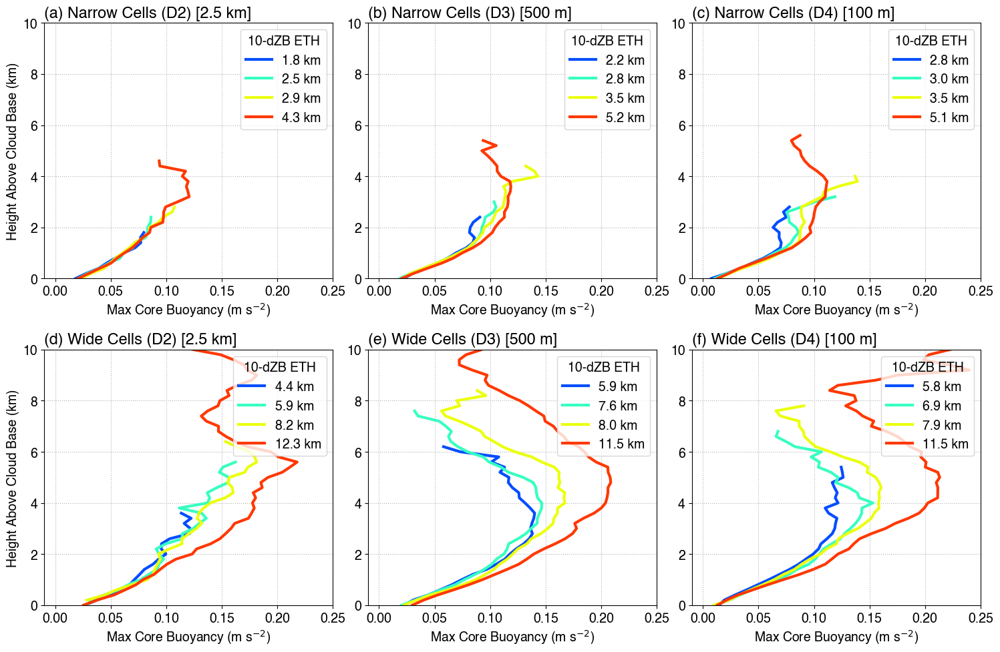

In [103]:
THRESH_w = 10
THRESH_n = 20
# THRESH_n = 10
height_wbase = MaxCoreBuoy_n_avg_d2.z / 1000.
# Median profiles
med_w_d2 = MaxCoreBuoy_w_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoy_w_d2 > THRESH_w)
med_w_d3 = MaxCoreBuoy_w_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoy_w_d3 > THRESH_w)
med_w_d4 = MaxCoreBuoy_w_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoy_w_d4 > THRESH_w)

med_n_d2 = MaxCoreBuoy_n_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoy_n_d2 > THRESH_n)
med_n_d3 = MaxCoreBuoy_n_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoy_n_d3 > THRESH_n)
med_n_d4 = MaxCoreBuoy_n_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoy_n_d4 > THRESH_n)

prof = [
    [med_n_d2, med_n_d3, med_n_d4],
    [med_w_d2, med_w_d3, med_w_d4],
]
nrow = len(prof)
ncol = len(prof[0])

# legend_text = [
#     [med_n_d2.ETH.values, med_n_d3.ETH.values, med_n_d4.ETH.values],
#     [med_w_d2.ETH.values, med_w_d3.ETH.values, med_w_d4.ETH.values],
# ]
legend_text = [
    [Wdepth_n_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d4.sel(quantile=0.75).data/1000],
    [Wdepth_w_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d4.sel(quantile=0.75).data/1000],
]

z_thresh = None

xlabels = [
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud Base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(-0.01,0.25)]*ncol,
    [(-0.01,0.25)]*ncol,
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'upper right'
legend_title = '10-dZB ETH'
cmap='jet'
cmap_range=(0.2,0.85)
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_byETH_CoreMaxBuoyancy_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof(nrow, ncol, prof, height_wbase, shade_cbase=False,
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, legend_text=legend_text, legend_title=legend_title, cmap=cmap, cmap_range=cmap_range,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
THRESH_w = 10
THRESH_n = 20
height_wbase = MaxCoreBuoyTrho_n_avg_d2.z / 1000.
# Median profiles
med_w_d2 = MaxCoreBuoyTrho_w_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoyTrho_w_d2 > THRESH_w)
med_w_d3 = MaxCoreBuoyTrho_w_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoyTrho_w_d3 > THRESH_w)
med_w_d4 = MaxCoreBuoyTrho_w_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoyTrho_w_d4 > THRESH_w)

med_n_d2 = MaxCoreBuoyTrho_n_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoyTrho_n_d2 > THRESH_n)
med_n_d3 = MaxCoreBuoyTrho_n_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoyTrho_n_d3 > THRESH_n)
med_n_d4 = MaxCoreBuoyTrho_n_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoyTrho_n_d4 > THRESH_n)

prof = [
    [med_n_d2, med_n_d3, med_n_d4],
    [med_w_d2, med_w_d3, med_w_d4],
]
nrow = len(prof)
ncol = len(prof[0])

legend_text = [
    [Wdepth_n_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d4.sel(quantile=0.75).data/1000],
    [Wdepth_w_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d4.sel(quantile=0.75).data/1000],
]

z_thresh = None

xlabels = [
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud Base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(-0.01,0.25)]*ncol,
    [(-0.01,0.25)]*ncol,
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'upper right'
legend_title = '10-dZB ETH'
cmap='jet'
cmap_range=(0.2,0.85)
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_byETH_CoreMaxBuoyancyTrho_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof(nrow, ncol, prof, height_wbase, shade_cbase=False,
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, legend_text=legend_text, legend_title=legend_title, cmap=cmap, cmap_range=cmap_range,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_byETH_CoreMaxDiameter_d2_d3_d4.png


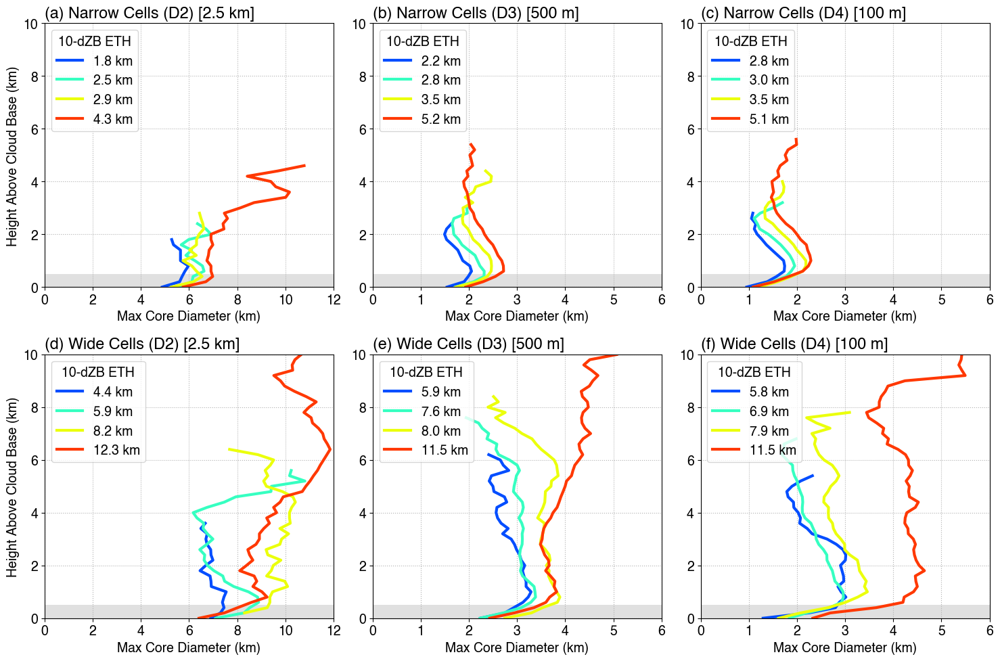

In [296]:
THRESH_w = 10
THRESH_n = 20
height_wbase = MaxCoreDiam_n_avg_d2.z / 1000.
# Median profiles
med_w_d2 = MaxCoreDiam_w_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_w_d2 > THRESH_w)
med_w_d3 = MaxCoreDiam_w_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_w_d3 > THRESH_w)
med_w_d4 = MaxCoreDiam_w_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_w_d4 > THRESH_w)

med_n_d2 = MaxCoreDiam_n_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_n_d2 > THRESH_n)
med_n_d3 = MaxCoreDiam_n_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_n_d3 > THRESH_n)
med_n_d4 = MaxCoreDiam_n_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_n_d4 > THRESH_n)

prof = [
    [med_n_d2, med_n_d3, med_n_d4],
    [med_w_d2, med_w_d3, med_w_d4],
]
nrow = len(prof)
ncol = len(prof[0])

legend_text = [
    [Wdepth_n_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d4.sel(quantile=0.75).data/1000],
    [Wdepth_w_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d4.sel(quantile=0.75).data/1000],
]

z_thresh = None

xlabels = [
    ['Max Core Diameter (km)']*ncol,
    ['Max Core Diameter (km)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud Base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(0,12),(0,6),(0,6)],
    [(0,12),(0,6),(0,6)],
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'upper left'
legend_title = '10-dZB ETH'
cmap='jet'
cmap_range=(0.2,0.85)
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_byETH_CoreMaxDiameter_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof(nrow, ncol, prof, height_wbase, shade_cbase=True,
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, legend_text=legend_text, legend_title=legend_title, cmap=cmap, cmap_range=cmap_range,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

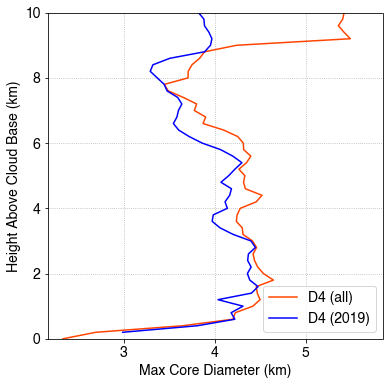

In [304]:
fig, ax = plt.subplots(figsize=(6,6))
THRESH_w = 10
med_w_d4 = MaxCoreDiam_w_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_w_d4 > THRESH_w).isel(ETH=3)
med_w_d4_2019 = MaxCoreDiam_w_inqt_d4_2019.sel(quantile=0.5).where(nsMaxCoreDiam_w_d4_2019> THRESH_w).isel(ETH=3)
ax.plot(med_w_d4, height_wbase, color='orangered', label='D4 (all)')
ax.plot(med_w_d4_2019, height_wbase, color='blue', label='D4 (2019)')
ax.legend()
ax.set_xlabel('Max Core Diameter (km)')
ax.set_ylabel('Height Above Cloud Base (km)')
ax.set_ylim(0, 10)
ax.grid(ls=':')

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_byETH_CoreMeanW_d2_d3_d4.png


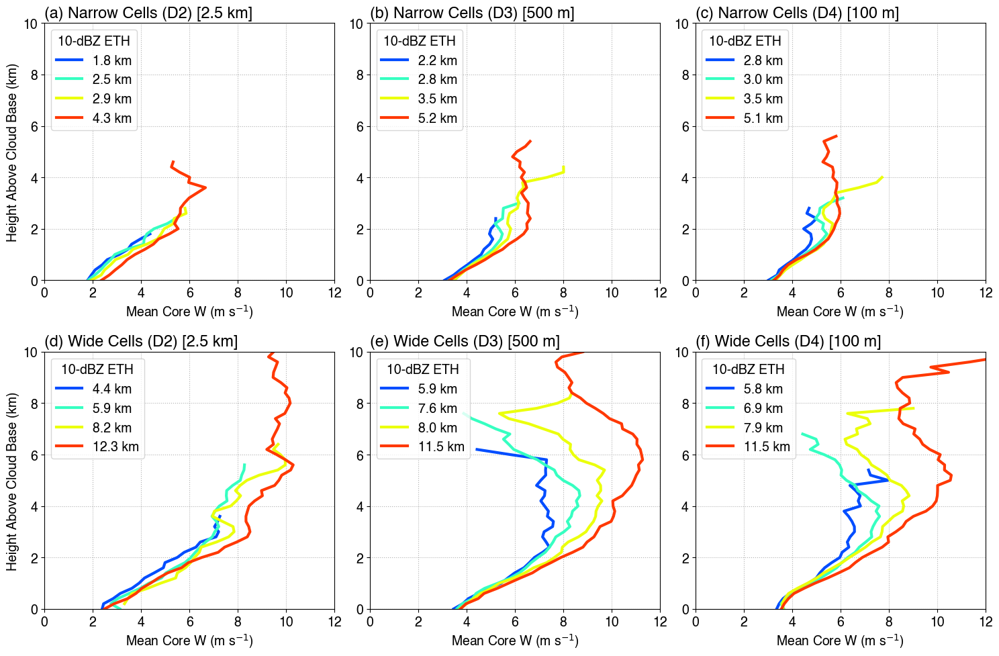

In [297]:
THRESH_w = 10
THRESH_n = 20
height_wbase = MaxCoreMeanW_n_avg_d2.z / 1000.
# Median profiles
med_w_d2 = MaxCoreMeanW_w_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMeanW_w_d2 > THRESH_w)
med_w_d3 = MaxCoreMeanW_w_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMeanW_w_d3 > THRESH_w)
med_w_d4 = MaxCoreMeanW_w_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMeanW_w_d4 > THRESH_w)

med_n_d2 = MaxCoreMeanW_n_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMeanW_n_d2 > THRESH_n)
med_n_d3 = MaxCoreMeanW_n_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMeanW_n_d3 > THRESH_n)
med_n_d4 = MaxCoreMeanW_n_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMeanW_n_d4 > THRESH_n)

prof = [
    [med_n_d2, med_n_d3, med_n_d4],
    [med_w_d2, med_w_d3, med_w_d4],
]
nrow = len(prof)
ncol = len(prof[0])

legend_text = [
    [Wdepth_n_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d4.sel(quantile=0.75).data/1000],
    [Wdepth_w_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d4.sel(quantile=0.75).data/1000],
]

z_thresh = None

xlabels = [
    ['Mean Core W (m s$^{-1}$)']*ncol,
    ['Mean Core W (m s$^{-1}$)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud Base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(0,12)]*ncol,
    [(0,12)]*ncol,
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'upper left'
legend_title = '10-dBZ ETH'
cmap='jet'
cmap_range=(0.2,0.85)
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_byETH_CoreMeanW_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof(nrow, ncol, prof, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, legend_text=legend_text, legend_title=legend_title, cmap=cmap, cmap_range=cmap_range,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_byETH_CoreMassFlux_d2_d3_d4.png


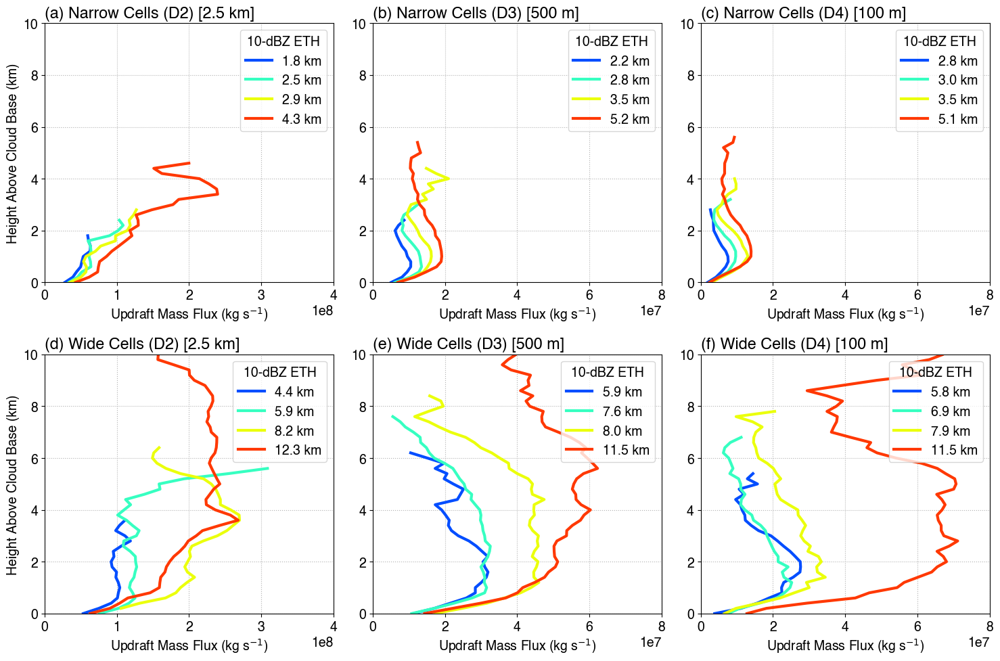

In [298]:
THRESH_w = 10
THRESH_n = 20
height_wbase = MaxCoreMassFlux_n_avg_d2.z / 1000.
# Median profiles
med_w_d2 = MaxCoreMassFlux_w_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMassFlux_w_d2 > THRESH_w)
med_w_d3 = MaxCoreMassFlux_w_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMassFlux_w_d3 > THRESH_w)
med_w_d4 = MaxCoreMassFlux_w_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMassFlux_w_d4 > THRESH_w)

med_n_d2 = MaxCoreMassFlux_n_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMassFlux_n_d2 > THRESH_n)
med_n_d3 = MaxCoreMassFlux_n_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMassFlux_n_d3 > THRESH_n)
med_n_d4 = MaxCoreMassFlux_n_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMassFlux_n_d4 > THRESH_n)

prof = [
    [med_n_d2, med_n_d3, med_n_d4],
    [med_w_d2, med_w_d3, med_w_d4],
]
nrow = len(prof)
ncol = len(prof[0])

legend_text = [
    [Wdepth_n_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d4.sel(quantile=0.75).data/1000],
    [Wdepth_w_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d4.sel(quantile=0.75).data/1000],
]

z_thresh = None

xlabels = [
    ['Updraft Mass Flux (kg s$^{-1}$)']*ncol,
    ['Updraft Mass Flux (kg s$^{-1}$)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud Base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(0,4e8),(0,0.8e8),(0,0.8e8)],
    [(0,4e8),(0,0.8e8),(0,0.8e8)],
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'upper right'
legend_title = '10-dBZ ETH'
cmap='jet'
cmap_range=(0.2,0.85)
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_byETH_CoreMassFlux_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof(nrow, ncol, prof, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, legend_text=legend_text, legend_title=legend_title, cmap=cmap, cmap_range=cmap_range,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_byETH_ShellMedianRH_d2_d3_d4.png


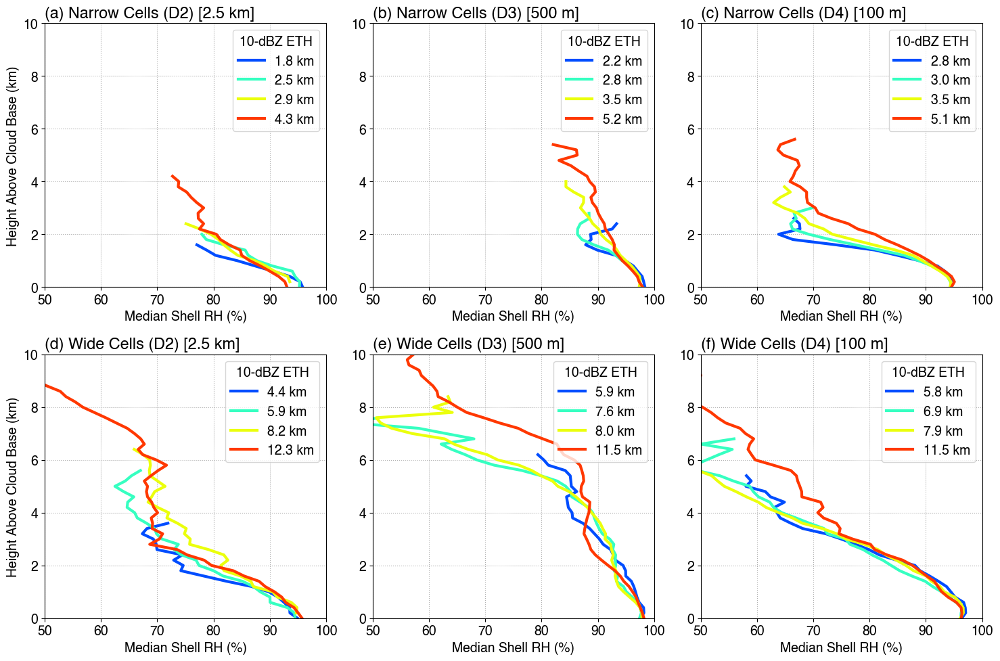

In [299]:
THRESH_w = 10
THRESH_n = 30
height_wbase = MedianShellRH_n_avg_d2.z / 1000.
# Median profiles
med_w_d2 = MedianShellRH_w_inqt_d2.sel(quantile=0.5).where(nsMedianShellRH_w_d2 > THRESH_w)
med_w_d3 = MedianShellRH_w_inqt_d3.sel(quantile=0.5).where(nsMedianShellRH_w_d3 > THRESH_w)
med_w_d4 = MedianShellRH_w_inqt_d4.sel(quantile=0.5).where(nsMedianShellRH_w_d4 > THRESH_w)

med_n_d2 = MedianShellRH_n_inqt_d2.sel(quantile=0.5).where(nsMedianShellRH_n_d2 > THRESH_n)
med_n_d3 = MedianShellRH_n_inqt_d3.sel(quantile=0.5).where(nsMedianShellRH_n_d3 > THRESH_n)
med_n_d4 = MedianShellRH_n_inqt_d4.sel(quantile=0.5).where(nsMedianShellRH_n_d4 > THRESH_n)

prof = [
    [med_n_d2, med_n_d3, med_n_d4],
    [med_w_d2, med_w_d3, med_w_d4],
]
nrow = len(prof)
ncol = len(prof[0])

legend_text = [
    [Wdepth_n_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_n_inqt_d4.sel(quantile=0.75).data/1000],
    [Wdepth_w_inqt_d2.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d3.sel(quantile=0.75).data/1000, Wdepth_w_inqt_d4.sel(quantile=0.75).data/1000],
]

z_thresh = None

xlabels = [
    ['Median Shell RH (%)']*ncol,
    ['Median Shell RH (%)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud Base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(50,100)]*ncol,
    [(50,100)]*ncol,
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'upper right'
legend_title = '10-dBZ ETH'
cmap='jet'
cmap_range=(0.2,0.85)
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_byETH_ShellMedianRH_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof(nrow, ncol, prof, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, legend_text=legend_text, legend_title=legend_title, cmap=cmap, cmap_range=cmap_range,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

### Examine why the deepest wide cells are different among the 3 LASSO resolutions

In [104]:
print(ETH_bins_w_d2)
ETH_bins_w_d2[-2], ETH_bins_w_d2[-1]

[ 3.49999646  6.7500002   8.00000678 10.00000003 15.00000688]


(10.000000034753295, 15.000006878320583)

In [105]:
print(ETH_bins_w_d3)
ETH_bins_w_d3[-2], ETH_bins_w_d3[-1]

[ 5.5000083   8.9999888   9.00001037 10.99999104 16.00000306]


(10.999991041172226, 16.000003061333516)

In [106]:
print(ETH_bins_w_d4)
ETH_bins_w_d4[-2], ETH_bins_w_d4[-1]

[ 5.99999733  7.99999705  8.99999636  9.99999582 15.00000615]


(9.999995819829136, 15.000006148803104)

In [107]:
def count_ntracks_wide_deep(ds, ETH_bins):
    """
    Count wide deep cells by dates

    Args:
        ds: Xarray DataSet
            DataSet
        ETH_bins: np.array_like
            Cell echo-top height bins
    """
    # Get mask for wide & deepest cells (ETH > last ETH bin)
    mask = (ds.CImaxETH_10dbz >= ETH_bins[-2]) & (ds.CImaxETH_10dbz < ETH_bins[-1])
    # Apply mask to tracks coordinate (keep original dimensions)
    tracks_mask = ds.tracks.where(mask, drop=False)
    # Group by unique dates for wide cells, count number of tracks
    return tracks_mask.groupby(ds.date).count()

In [108]:
ntracks_w_d_d2 = count_ntracks_wide_deep(ds_wide_d2, ETH_bins_w_d2)
ntracks_w_d_d2
ntracks_w_d_d3 = count_ntracks_wide_deep(ds_wide_d3, ETH_bins_w_d3)
ntracks_w_d_d3
ntracks_w_d_d4 = count_ntracks_wide_deep(ds_wide_d4, ETH_bins_w_d4)
ntracks_w_d_d4

<xarray.DataArray 'tracks' (date: 8)> Size: 64B
array([12,  5,  1,  3,  6, 14,  8, 10])
Coordinates:
    core     int64 8B 0
  * date     (date) datetime64[ns] 64B 2018-11-29 2018-12-04 ... 2019-02-08

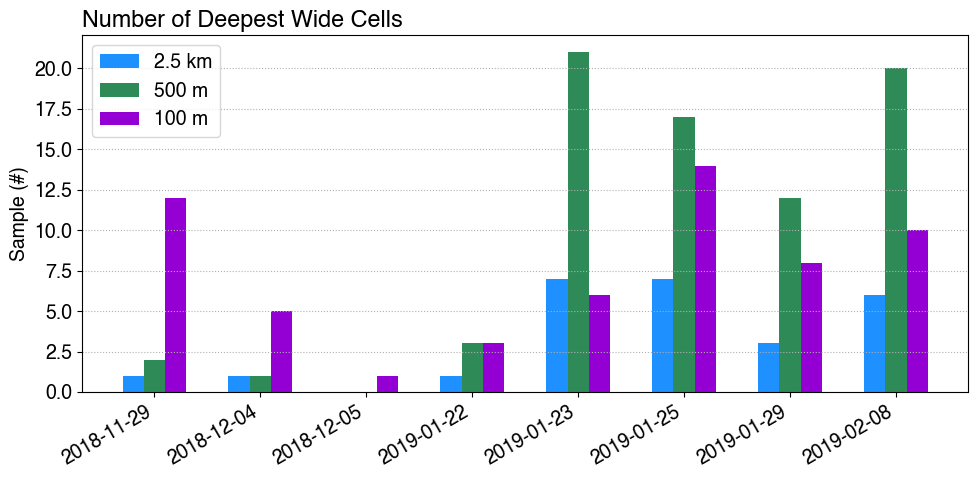

In [109]:
x = np.arange(len(unique_dates))
bar_data = {'d2':ntracks_w_d_d2, 'd3':ntracks_w_d_d3, 'd4':ntracks_w_d_d4}
ylabel = 'Sample (#)'
title = 'Number of Deepest Wide Cells'
fontsize = 14
figsize = [10,5]
figname = f'{figdir}CellNumberByDate_wide_deepest_d2_d3_d4.png'
fig = plot_bars(bar_data, xlabel=unique_dates_str, ylabel=ylabel, title=title, fontsize=fontsize, figsize=figsize, figname=figname)

In [110]:
ds_wide_d4.rainrate_avg

<xarray.DataArray 'rainrate_avg' (tracks: 195, times: 202)> Size: 158kB
array([[       nan, 0.08378786, 0.04155834, ...,        nan,        nan,
               nan],
       [       nan, 0.00417718, 0.01417249, ...,        nan,        nan,
               nan],
       [       nan, 0.10388677, 0.12615909, ...,        nan,        nan,
               nan],
       ...,
       [       nan, 0.00125888, 0.0049859 , ...,        nan,        nan,
               nan],
       [       nan, 0.21962512, 0.23128909, ...,        nan,        nan,
               nan],
       [       nan, 0.72279847, 0.7969045 , ...,        nan,        nan,
               nan]], dtype=float32)
Coordinates:
  * tracks   (tracks) int64 2kB 6 8 14 22 25 33 ... 1696 1697 1703 1705 1708
  * times    (times) int64 2kB -2 -1 0 1 2 3 4 5 ... 193 194 195 196 197 198 199
    core     int64 8B 0
Attributes:
    long_name:  RAIN RATE
    units:      mm/h

In [140]:
def subset_var_by_ETH(ds, ETH_bins, varname, times_idx):
    # Get mask for wide & deepest cells (ETH > last ETH bin)
    mask = (ds.CImaxETH_10dbz >= ETH_bins[-2]) & (ds.CImaxETH_10dbz < ETH_bins[-1])
    # Apply mask to tracks coordinate
    tracks = ds.tracks.where(mask, drop=True)
    # Subset variable
    return ds[varname].sel(tracks=tracks, times=times_idx)

In [ ]:
times_idx = -1
rainrate_p95_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'rainrate_p95', times_idx)
rainrate_p95_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'rainrate_p95', times_idx)
rainrate_p95_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'rainrate_p95', times_idx)

rainrate_avg_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'rainrate_avg', times_idx)
rainrate_avg_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'rainrate_avg', times_idx)
rainrate_avg_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'rainrate_avg', times_idx)

cellfrac_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'cell_frac', times_idx)
cellfrac_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'cell_frac', times_idx)
cellfrac_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'cell_frac', times_idx)

lwpfrac_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'lwp_frac', times_idx)
lwpfrac_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'lwp_frac', times_idx)
lwpfrac_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'lwp_frac', times_idx)

lwp_avg_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'lwp_avg', times_idx)
lwp_avg_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'lwp_avg', times_idx)
lwp_avg_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'lwp_avg', times_idx)

lwp_p95_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'lwp_p95', times_idx)
lwp_p95_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'lwp_p95', times_idx)
lwp_p95_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'lwp_p95', times_idx)

In [267]:
pCAPEmu_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'pCAPE_mu', times_idx)
pCAPEmu_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'pCAPE_mu', times_idx)
pCAPEmu_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'pCAPE_mu', times_idx)

LCLz_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'LCL_height_mu', times_idx)
LCLz_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'LCL_height_mu', times_idx)
LCLz_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'LCL_height_mu', times_idx)

pELmu_d4 = subset_var_by_ETH(ds_wide_d4, ETH_bins_w_d4, 'pEL_height_mu', times_idx)
pELmu_d3 = subset_var_by_ETH(ds_wide_d3, ETH_bins_w_d3, 'pEL_height_mu', times_idx)
pELmu_d2 = subset_var_by_ETH(ds_wide_d2, ETH_bins_w_d2, 'pEL_height_mu', times_idx)

In [199]:
def get_kde1d(data, bins, kde_bw, kde_kernel='gaussian'):
    """
    Compute 1D KDE using Ski-learn
    
    Args:
        data: np.array
            Array containing data.
        bins: np.array
            Desired bins for plotting.
        kde_bw: float
            The bandwidth of the kernel.
        kde_kernel: string
            The kernel to use.
            
    Return:
        kde_out: np.array
            KDE at the desired bins.
    """
    # Flatten array to 1D
    data1d = data.flatten()
    # Remove NaN (sklearn KDE does not handle NaN), and make a new axis
    _data = data1d[np.isfinite(data1d)][:, np.newaxis]
    # _data = data1d[~np.isnan(data1d)][:, np.newaxis]
    _bins = bins[:, np.newaxis]
    
    # Estimate 1D KDE following sklearn example
    # https://scikit-learn.org/stable/auto_examples/neighbors/plot_kde_1d.html
    kde = KernelDensity(kernel=kde_kernel, bandwidth=kde_bw).fit(_data)
    # Get KDE values based on input bins
    log_dens = kde.score_samples(_bins)
    # Get linear density
    kde_out = np.exp(log_dens)
    return kde_out

In [236]:
lwpfrac_bins = np.linspace(0.0, 1.01, 1000)
kde_lwpfrac_d4 = get_kde1d(lwpfrac_d4.data, lwpfrac_bins, kde_bw=0.1)
kde_lwpfrac_d3 = get_kde1d(lwpfrac_d3.data, lwpfrac_bins, kde_bw=0.1)
kde_lwpfrac_d2 = get_kde1d(lwpfrac_d2.data, lwpfrac_bins, kde_bw=0.1)

lwp_bins = np.linspace(0.0, 1.01, 1000)
kde_lwp_avg_d4 = get_kde1d(lwp_avg_d4.data, lwp_bins, kde_bw=0.1)
kde_lwp_avg_d3 = get_kde1d(lwp_avg_d3.data, lwp_bins, kde_bw=0.1)
kde_lwp_avg_d2 = get_kde1d(lwp_avg_d2.data, lwp_bins, kde_bw=0.1)

lwp_p95_bins = np.linspace(0.0, 3.01, 1000)
kde_lwp_p95_d4 = get_kde1d(lwp_p95_d4.data, lwp_p95_bins, kde_bw=0.3)
kde_lwp_p95_d3 = get_kde1d(lwp_p95_d3.data, lwp_p95_bins, kde_bw=0.3)
kde_lwp_p95_d2 = get_kde1d(lwp_p95_d2.data, lwp_p95_bins, kde_bw=0.3)

rr_bins = np.linspace(1e-1, 10, 1000)
kde_rainrate_p95_d4 = get_kde1d(np.log10(rainrate_p95_d4.data), rr_bins, kde_bw=0.6)
kde_rainrate_p95_d3 = get_kde1d(np.log10(rainrate_p95_d3.data), rr_bins, kde_bw=0.6)
kde_rainrate_p95_d2 = get_kde1d(np.log10(rainrate_p95_d2.data), rr_bins, kde_bw=0.6)

kde_rainrate_avg_d4 = get_kde1d(np.log10(rainrate_avg_d4.data), rr_bins, kde_bw=0.6)
kde_rainrate_avg_d3 = get_kde1d(np.log10(rainrate_avg_d3.data), rr_bins, kde_bw=0.6)
kde_rainrate_avg_d2 = get_kde1d(np.log10(rainrate_avg_d2.data), rr_bins, kde_bw=0.6)

cellfrac_bins = np.linspace(0, 0.31, 1000)
kde_cellfrac_d4 = get_kde1d(cellfrac_d4.data, cellfrac_bins, kde_bw=0.02)
kde_cellfrac_d3 = get_kde1d(cellfrac_d3.data, cellfrac_bins, kde_bw=0.02)
kde_cellfrac_d2 = get_kde1d(cellfrac_d2.data, cellfrac_bins, kde_bw=0.02)

/tmp/ipykernel_510334/2435412850.py:17: RuntimeWarning: divide by zero encountered in log10
  kde_rainrate_p95_d4 = get_kde1d(np.log10(rainrate_p95_d4.data), rr_bins, kde_bw=0.6)
/tmp/ipykernel_510334/2435412850.py:18: RuntimeWarning: divide by zero encountered in log10
  kde_rainrate_p95_d3 = get_kde1d(np.log10(rainrate_p95_d3.data), rr_bins, kde_bw=0.6)
/tmp/ipykernel_510334/2435412850.py:19: RuntimeWarning: divide by zero encountered in log10
  kde_rainrate_p95_d2 = get_kde1d(np.log10(rainrate_p95_d2.data), rr_bins, kde_bw=0.6)
/tmp/ipykernel_510334/2435412850.py:21: RuntimeWarning: divide by zero encountered in log10
  kde_rainrate_avg_d4 = get_kde1d(np.log10(rainrate_avg_d4.data), rr_bins, kde_bw=0.6)
/tmp/ipykernel_510334/2435412850.py:22: RuntimeWarning: divide by zero encountered in log10
  kde_rainrate_avg_d3 = get_kde1d(np.log10(rainrate_avg_d3.data), rr_bins, kde_bw=0.6)
/tmp/ipykernel_510334/2435412850.py:23: RuntimeWarning: divide by zero encountered in log10
  kde_rainrat

In [273]:
CAPEmu_bins = np.linspace(0, 7000, 1000)
kde_pCAPEmu_d4 = get_kde1d(pCAPEmu_d4.data, CAPEmu_bins, kde_bw=500)
kde_pCAPEmu_d3 = get_kde1d(pCAPEmu_d3.data, CAPEmu_bins, kde_bw=500)
kde_pCAPEmu_d2 = get_kde1d(pCAPEmu_d2.data, CAPEmu_bins, kde_bw=500)

LCLz_bins = np.linspace(0, 2600, 1000)
kde_LCLz_d4 = get_kde1d(LCLz_d4.data, LCLz_bins, kde_bw=200)
kde_LCLz_d3 = get_kde1d(LCLz_d3.data, LCLz_bins, kde_bw=200)
kde_LCLz_d2 = get_kde1d(LCLz_d2.data, LCLz_bins, kde_bw=200)

ELmu_bins = np.linspace(6, 20.0, 1000)
kde_pELmu_d4 = get_kde1d(pELmu_d4.data/1000, ELmu_bins, kde_bw=0.5)
kde_pELmu_d3 = get_kde1d(pELmu_d3.data/1000, ELmu_bins, kde_bw=0.5)
kde_pELmu_d2 = get_kde1d(pELmu_d2.data/1000, ELmu_bins, kde_bw=0.5)

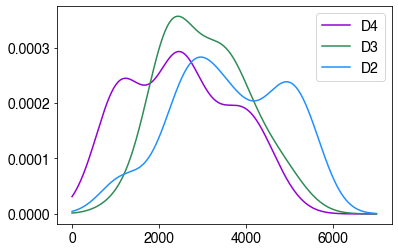

In [268]:
fig, ax = plt.subplots(1,1)
ax.plot(CAPEmu_bins, kde_pCAPEmu_d4, lcolors['d4'], label='D4')
ax.plot(CAPEmu_bins, kde_pCAPEmu_d3, lcolors['d3'], label='D3')
ax.plot(CAPEmu_bins, kde_pCAPEmu_d2, lcolors['d2'], label='D2')
ax.legend()

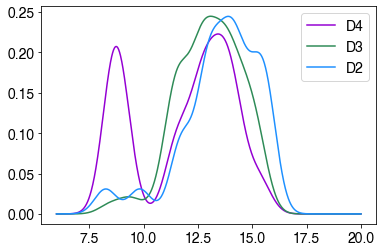

In [274]:
fig, ax = plt.subplots(1,1)
ax.plot(ELmu_bins, kde_pELmu_d4, lcolors['d4'], label='D4')
ax.plot(ELmu_bins, kde_pELmu_d3, lcolors['d3'], label='D3')
ax.plot(ELmu_bins, kde_pELmu_d2, lcolors['d2'], label='D2')
ax.legend()

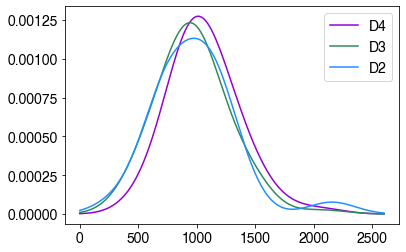

In [266]:
fig, ax = plt.subplots(1,1)
ax.plot(LCLz_bins, kde_LCLz_d4, lcolors['d4'], label='D4')
ax.plot(LCLz_bins, kde_LCLz_d3, lcolors['d3'], label='D3')
ax.plot(LCLz_bins, kde_LCLz_d2, lcolors['d2'], label='D2')
ax.legend()

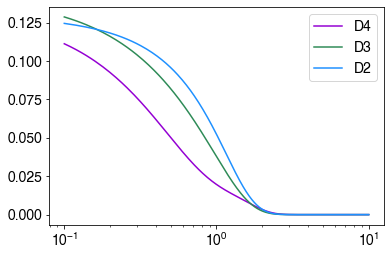

In [226]:
fig, ax = plt.subplots(1,1)
# ax.plot(rr_bins, kde_rainrate_p95_d4, lcolors['d4'], label='D4')
# ax.plot(rr_bins, kde_rainrate_p95_d3, lcolors['d3'], label='D3')
# ax.plot(rr_bins, kde_rainrate_p95_d2, lcolors['d2'], label='D2')
ax.plot(rr_bins, kde_rainrate_avg_d4, lcolors['d4'], label='D4')
ax.plot(rr_bins, kde_rainrate_avg_d3, lcolors['d3'], label='D3')
ax.plot(rr_bins, kde_rainrate_avg_d2, lcolors['d2'], label='D2')
ax.set_xscale('log')
ax.legend()

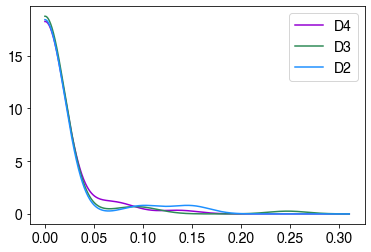

In [239]:
fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
ax.plot(cellfrac_bins, kde_cellfrac_d4, lcolors['d4'], label='D4')
ax.plot(cellfrac_bins, kde_cellfrac_d3, lcolors['d3'], label='D3')
ax.plot(cellfrac_bins, kde_cellfrac_d2, lcolors['d2'], label='D2')
# ax.set_xscale('log')
ax.legend()

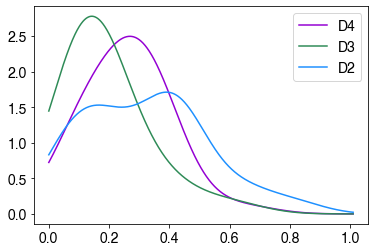

In [221]:
fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}

# lwpfrac_d4.plot.hist(bins=lwpfrac_bins, ax=ax, color=lcolors['d4'], alpha=0.5, density=True)
# lwpfrac_d3.plot.hist(bins=lwpfrac_bins, ax=ax, color=lcolors['d3'], alpha=0.5, density=True)
# lwpfrac_d2.plot.hist(bins=lwpfrac_bins, ax=ax, color=lcolors['d2'], alpha=0.5, density=True)

ax.plot(lwpfrac_bins, kde_lwpfrac_d4, lcolors['d4'], label='D4')
ax.plot(lwpfrac_bins, kde_lwpfrac_d3, lcolors['d3'], label='D3')
ax.plot(lwpfrac_bins, kde_lwpfrac_d2, lcolors['d2'], label='D2')
ax.legend()

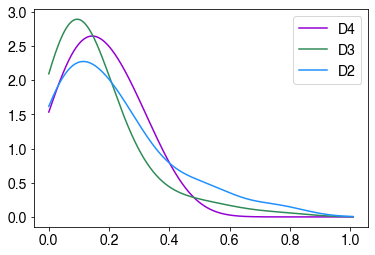

In [222]:
fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
# lwp_bins = np.arange(0.0, 0.81, 0.05)
# lwp_avg_d4.plot.hist(bins=lwp_bins, ax=ax, color=lcolors['d4'], alpha=0.5, density=True)
# lwp_avg_d3.plot.hist(bins=lwp_bins, ax=ax, color=lcolors['d3'], alpha=0.5, density=True)
# lwp_avg_d2.plot.hist(bins=lwp_bins, ax=ax, color=lcolors['d2'], alpha=0.5, density=True)

ax.plot(lwp_bins, kde_lwp_avg_d4, lcolors['d4'], label='D4')
ax.plot(lwp_bins, kde_lwp_avg_d3, lcolors['d3'], label='D3')
ax.plot(lwp_bins, kde_lwp_avg_d2, lcolors['d2'], label='D2')
ax.legend()

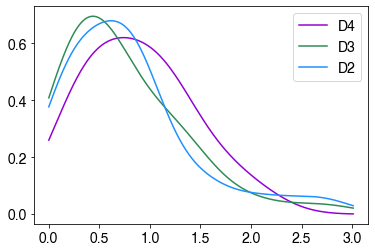

In [231]:
fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
# lwp_bins = np.arange(0.0, 3.01, 0.1)
# lwp_p95_d4.plot.hist(bins=lwp_bins, ax=ax, color=lcolors['d4'], alpha=0.5, density=True)
# lwp_p95_d3.plot.hist(bins=lwp_bins, ax=ax, color=lcolors['d3'], alpha=0.5, density=True)
# lwp_p95_d2.plot.hist(bins=lwp_bins, ax=ax, color=lcolors['d2'], alpha=0.5, density=True)

ax.plot(lwp_p95_bins, kde_lwp_p95_d4, lcolors['d4'], label='D4')
ax.plot(lwp_p95_bins, kde_lwp_p95_d3, lcolors['d3'], label='D3')
ax.plot(lwp_p95_bins, kde_lwp_p95_d2, lcolors['d2'], label='D2')
ax.legend()

(array([ 0.,  0.,  0.,  0., 25.,  0., 25.,  0.,  0.,  0.,  0.,  0.]),
 array([0.01, 0.03, 0.05, 0.07, 0.09, 0.11, 0.13, 0.15, 0.17, 0.19, 0.21,
        0.23, 0.25]),
 <BarContainer object of 12 artists>)

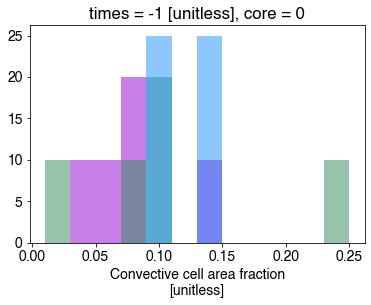

In [154]:
fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
cellfrac_bins = np.arange(0.01, 0.251, 0.02)
cellfrac_d4.plot.hist(bins=cellfrac_bins, ax=ax, color=lcolors['d4'], alpha=0.5, density=True)
cellfrac_d3.plot.hist(bins=cellfrac_bins, ax=ax, color=lcolors['d3'], alpha=0.5, density=True)
cellfrac_d2.plot.hist(bins=cellfrac_bins, ax=ax, color=lcolors['d2'], alpha=0.5, density=True)

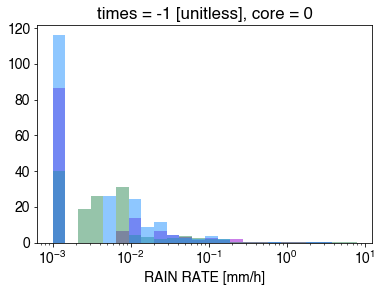

In [146]:
fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
rr_bins = np.logspace(-3, np.log10(8), num=25)
rainrate_p95_d4.plot.hist(bins=rr_bins, ax=ax, color=lcolors['d4'], alpha=0.5, density=True)
rainrate_p95_d3.plot.hist(bins=rr_bins, ax=ax, color=lcolors['d3'], alpha=0.5, density=True)
rainrate_p95_d2.plot.hist(bins=rr_bins, ax=ax, color=lcolors['d2'], alpha=0.5, density=True)
ax.set_xscale('log')

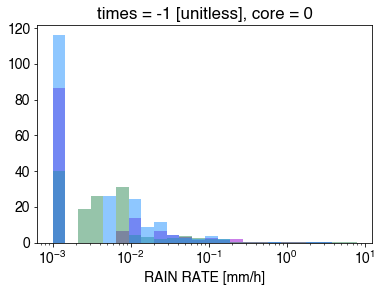

In [139]:
# Get mask for wide & deepest cells (ETH > last ETH bin)
mask_d4 = (ds_wide_d4.CImaxETH_10dbz >= ETH_bins_w_d4[-2]) & (ds_wide_d4.CImaxETH_10dbz < ETH_bins_w_d4[-1])
mask_d3 = (ds_wide_d3.CImaxETH_10dbz >= ETH_bins_w_d3[-2]) & (ds_wide_d3.CImaxETH_10dbz < ETH_bins_w_d3[-1])
mask_d2 = (ds_wide_d2.CImaxETH_10dbz >= ETH_bins_w_d2[-2]) & (ds_wide_d2.CImaxETH_10dbz < ETH_bins_w_d2[-1])
# Apply mask to tracks coordinate (keep original dimensions)
tracks_d4 = ds_wide_d4.tracks.where(mask_d4, drop=True)
tracks_d3 = ds_wide_d3.tracks.where(mask_d3, drop=True)
tracks_d2 = ds_wide_d2.tracks.where(mask_d2, drop=True)

fig, ax = plt.subplots(1,1)
lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
rr_bins = np.logspace(-3, np.log10(8), num=25)
ds_wide_d4.rainrate_p95.sel(tracks=tracks_d4, times=-1).plot.hist(bins=rr_bins, ax=ax, color=lcolors['d4'], alpha=0.5, density=True)
ds_wide_d3.rainrate_p95.sel(tracks=tracks_d3, times=-1).plot.hist(bins=rr_bins, ax=ax, color=lcolors['d3'], alpha=0.5, density=True)
ds_wide_d2.rainrate_p95.sel(tracks=tracks_d2, times=-1).plot.hist(bins=rr_bins, ax=ax, color=lcolors['d2'], alpha=0.5, density=True)
ax.set_xscale('log')

In [ ]:
ds_wide_d2.rainrate_avg.sel(tracks=tracks_d2, times=-1).plot.hist(bins=rr_bins, ax=ax, color=lcolors['d2'], alpha=0.5)

NameError: name 'lcolors' is not defined

## Composite updraft profiles by aligning to cloud base

In [151]:
def updraft_prof_cbase(ds, varname, operation=None, filter_Wmask=True, filter_muparcelht=True, quantiles=[0.25,0.5,0.75]):
    
    # Get dates
    dates = ds.date
    # Height coordinate for updraft variables
    height_core = ds.z
    # Interpolated height coordinate [m]
    height_core_interp = np.arange(0, 20000.1, 200)

    # Median 10dBZ ETH by date
    maxETH10dbz_thresh_bydate = ds["CImaxETH_10dbz"].groupby(dates).median()
    # maxETH10dbz_thresh_bydate = ds["CImaxETH_10dbz"].median()
    
    # Note: Wbase/Wtop unit is [km], convert to [m] to match original height coordinate
    # Average updraft base height
    Wbase_avg = ds['Wbase'].isel(times=slice(tidx_start, tidx_end)).mean(dim='times')*1000
    # Max updraft top height
    Wtop_max = ds['Wtop'].isel(times=slice(tidx_start, tidx_end)).max(dim='times')*1000
    # Cloud depth
    Wdepth = Wtop_max - Wbase_avg

    # Get MU parcel height prior to CI, then get the lowest parcel height
    # mu_parcel_ht = ds["mu_parcel_ht_msl"].sel(times=slice(preCI_nt,0)).min(dim='times')

    # Get variable from DataSet, mask with updraft mask, subset CI-period: filter heights below MU parcel height
    if filter_Wmask:
        VAR = ds[varname].where(ds["Wmask"] == True).isel(times=slice(tidx_start, tidx_end))
    else:
        VAR = ds[varname].isel(times=slice(tidx_start, tidx_end))
    # if filter_muparcelht:
    #     VAR = VAR.where(height_core >= mu_parcel_ht)

    # Make shallow/deep ETH thresholds by dates
    mask_shallow = ds["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
    mask_deep = ds["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate
    
    # Make shallow/deep ETH masks
    # mask_shallow = ds["CImaxETH_10dbz"] < maxETH10dbz_thresh_bydate
    # mask_deep = ds["CImaxETH_10dbz"] >= maxETH10dbz_thresh_bydate
    
    # Separate shallow/deep tracks
    # VAR_s = VAR.max(dim='times').where(mask_shallow, drop=True)
    # VAR_d = VAR.max(dim='times').where(mask_deep, drop=True)
    # Use getattr to call the operation dynamically (e.g., operation: 'max', 'mean')
    VAR_s = getattr(VAR, operation)(dim=('times')).where(mask_shallow, drop=True)
    VAR_d = getattr(VAR, operation)(dim=('times')).where(mask_deep, drop=True)
    Wbase_s = Wbase_avg.where(mask_shallow, drop=True)
    Wbase_d = Wbase_avg.where(mask_deep, drop=True)
    Wdepth_s = Wdepth.where(mask_shallow, drop=True)
    Wdepth_d = Wdepth.where(mask_deep, drop=True)
    
    # Interpolate VAR to constant-spaced height
    VAR_s_interp = VAR_s.interp(z=height_core_interp)
    VAR_d_interp = VAR_d.interp(z=height_core_interp)

    # Broadcast Wbase to match the VAR shape
    _Wbase_s = Wbase_s.broadcast_like(VAR_s_interp)
    _Wbase_d = Wbase_d.broadcast_like(VAR_d_interp)
    
    # Shift the height coordinate by Wbase height, the new coordinate 'z' will be 2D [z,tracks]
    VAR_s_shifted = VAR_s_interp.assign_coords({'z':(VAR_s_interp.coords['z'] - _Wbase_s)})
    VAR_d_shifted = VAR_d_interp.assign_coords({'z':(VAR_d_interp.coords['z'] - _Wbase_d)})
    VAR_s_shifted['z'].attrs = {'units':'m'}
    
    VAR_s_Wbase = []
    VAR_d_Wbase = []

    # Loop over each track
    for track_idx in range(len(VAR_s_shifted.coords['tracks'])):
        # Select one track at a time
        _VAR = VAR_s_shifted.isel(tracks=track_idx)
        # Interpolate again to the new common height grid
        _VAR_interp = _VAR.interp(z=height_core_interp)
        # Store the aligned profile
        VAR_s_Wbase.append(_VAR_interp)
        
    # Loop over each track
    for track_idx in range(len(VAR_d_shifted.coords['tracks'])):
        # Select one track at a time
        _VAR = VAR_d_shifted.isel(tracks=track_idx)
        # Interpolate again to the new common height grid
        _VAR_interp = _VAR.interp(z=height_core_interp)
        # Store the aligned profile
        VAR_d_Wbase.append(_VAR_interp)
        
    # Stack the aligned profiles along a new dimension
    VAR_s_Wbase = xr.concat(VAR_s_Wbase, dim='tracks')
    VAR_d_Wbase = xr.concat(VAR_d_Wbase, dim='tracks')
    
    # Compute mean
    VAR_s_mean = VAR_s_Wbase.mean(dim='tracks', keep_attrs=True)
    VAR_d_mean = VAR_d_Wbase.mean(dim='tracks', keep_attrs=True)
    # Compute quantiles
    VAR_s_inqt = VAR_s_Wbase.quantile(quantiles, dim='tracks', keep_attrs=True)
    VAR_d_inqt = VAR_d_Wbase.quantile(quantiles, dim='tracks', keep_attrs=True)
    # Get sample size profiles by dates
    ns_prof_s = (~np.isnan(VAR_s_Wbase)).sum(dim='tracks')
    ns_prof_d = (~np.isnan(VAR_d_Wbase)).sum(dim='tracks')
    # Depth statistics
    Wdepth_s_mean = Wdepth_s.mean(keep_attrs=True)
    Wdepth_d_mean = Wdepth_d.mean(keep_attrs=True)
    Wdepth_s_inqt = Wdepth_s.quantile(quantiles)
    Wdepth_d_inqt = Wdepth_d.quantile(quantiles)
    
    return VAR_s_mean, VAR_d_mean, VAR_s_inqt, VAR_d_inqt, ns_prof_s, ns_prof_d, Wdepth_s_mean, Wdepth_d_mean, Wdepth_s_inqt, Wdepth_d_inqt

In [152]:
quantiles = [0.25, 0.5, 0.75]
# Buoyancy
MaxCoreBuoy_n_s_avg_d2, MaxCoreBuoy_n_d_avg_d2, MaxCoreBuoy_n_s_inqt_d2, MaxCoreBuoy_n_d_inqt_d2, nsMaxCoreBuoy_n_s_d2, nsMaxCoreBuoy_n_d_d2, Wdepth_n_s_avg_d2, Wdepth_n_d_avg_d2, Wdepth_n_s_inqt_d2, Wdepth_n_d_inqt_d2 = \
    updraft_prof_cbase(ds_narrow_d2, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles)

MaxCoreBuoy_w_s_avg_d2, MaxCoreBuoy_w_d_avg_d2, MaxCoreBuoy_w_s_inqt_d2, MaxCoreBuoy_w_d_inqt_d2, nsMaxCoreBuoy_w_s_d2, nsMaxCoreBuoy_w_d_d2, Wdepth_w_s_avg_d2, Wdepth_w_d_avg_d2, Wdepth_w_s_inqt_d2, Wdepth_w_d_inqt_d2 = \
    updraft_prof_cbase(ds_wide_d2, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [153]:
# Buoyancy
MaxCoreBuoy_n_s_avg_d3, MaxCoreBuoy_n_d_avg_d3, MaxCoreBuoy_n_s_inqt_d3, MaxCoreBuoy_n_d_inqt_d3, nsMaxCoreBuoy_n_s_d3, nsMaxCoreBuoy_n_d_d3, Wdepth_n_s_avg_d3, Wdepth_n_d_avg_d3, Wdepth_n_s_inqt_d3, Wdepth_n_d_inqt_d3 = \
    updraft_prof_cbase(ds_narrow_d3, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles)

MaxCoreBuoy_w_s_avg_d3, MaxCoreBuoy_w_d_avg_d3, MaxCoreBuoy_w_s_inqt_d3, MaxCoreBuoy_w_d_inqt_d3, nsMaxCoreBuoy_w_s_d3, nsMaxCoreBuoy_w_d_d3, Wdepth_w_s_avg_d3, Wdepth_w_d_avg_d3, Wdepth_w_s_inqt_d3, Wdepth_w_d_inqt_d3  = \
    updraft_prof_cbase(ds_wide_d3, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [154]:
# Buoyancy
MaxCoreBuoy_n_s_avg_d4, MaxCoreBuoy_n_d_avg_d4, MaxCoreBuoy_n_s_inqt_d4, MaxCoreBuoy_n_d_inqt_d4, nsMaxCoreBuoy_n_s_d4, nsMaxCoreBuoy_n_d_d4, Wdepth_n_s_avg_d4, Wdepth_n_d_avg_d4, Wdepth_n_s_inqt_d4, Wdepth_n_d_inqt_d4 = \
    updraft_prof_cbase(ds_narrow_d4, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles)

MaxCoreBuoy_w_s_avg_d4, MaxCoreBuoy_w_d_avg_d4, MaxCoreBuoy_w_s_inqt_d4, MaxCoreBuoy_w_d_inqt_d4, nsMaxCoreBuoy_w_s_d4, nsMaxCoreBuoy_w_d_d4, Wdepth_w_s_avg_d4, Wdepth_w_d_avg_d4, Wdepth_w_s_inqt_d4, Wdepth_w_d_inqt_d4  = \
    updraft_prof_cbase(ds_wide_d4, 'CoreBuoyThtv_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [155]:
# Core width
MaxCoreArea_n_s_avg_d2, MaxCoreArea_n_d_avg_d2, MaxCoreArea_n_s_inqt_d2, MaxCoreArea_n_d_inqt_d2, nsMaxCoreDiam_n_s_d2, nsMaxCoreDiam_n_d_d2, Wdepth_n_s_avg_d2, Wdepth_n_d_avg_d2, Wdepth_n_s_inqt_d2, Wdepth_n_d_inqt_d2 = \
    updraft_prof_cbase(ds_narrow_d2, 'CoreArea_up', operation='max', quantiles=quantiles)

MaxCoreArea_w_s_avg_d2, MaxCoreArea_w_d_avg_d2, MaxCoreArea_w_s_inqt_d2, MaxCoreArea_w_d_inqt_d2, nsMaxCoreDiam_w_s_d2, nsMaxCoreDiam_w_d_d2, Wdepth_w_s_avg_d2, Wdepth_w_d_avg_d2, Wdepth_w_s_inqt_d2, Wdepth_w_d_inqt_d2 = \
    updraft_prof_cbase(ds_wide_d2, 'CoreArea_up', operation='max', quantiles=quantiles)

# Convert area to equivalent diameter
MaxCoreDiam_n_s_avg_d2 = 2*np.sqrt(MaxCoreArea_n_s_avg_d2/np.pi)
MaxCoreDiam_n_d_avg_d2 = 2*np.sqrt(MaxCoreArea_n_d_avg_d2/np.pi)
MaxCoreDiam_n_s_inqt_d2 = 2*np.sqrt(MaxCoreArea_n_s_inqt_d2/np.pi)
MaxCoreDiam_n_d_inqt_d2 = 2*np.sqrt(MaxCoreArea_n_d_inqt_d2/np.pi)

MaxCoreDiam_w_s_avg_d2 = 2*np.sqrt(MaxCoreArea_w_s_avg_d2/np.pi)
MaxCoreDiam_w_d_avg_d2 = 2*np.sqrt(MaxCoreArea_w_d_avg_d2/np.pi)
MaxCoreDiam_w_s_inqt_d2 = 2*np.sqrt(MaxCoreArea_w_s_inqt_d2/np.pi)
MaxCoreDiam_w_d_inqt_d2 = 2*np.sqrt(MaxCoreArea_w_d_inqt_d2/np.pi)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [156]:
# Core width
MaxCoreArea_n_s_avg_d3, MaxCoreArea_n_d_avg_d3, MaxCoreArea_n_s_inqt_d3, MaxCoreArea_n_d_inqt_d3, nsMaxCoreDiam_n_s_d3, nsMaxCoreDiam_n_d_d3, Wdepth_n_s_avg_d3, Wdepth_n_d_avg_d3, Wdepth_n_s_inqt_d3, Wdepth_n_d_inqt_d3 = \
    updraft_prof_cbase(ds_narrow_d3, 'CoreArea_up', operation='max', quantiles=quantiles)

MaxCoreArea_w_s_avg_d3, MaxCoreArea_w_d_avg_d3, MaxCoreArea_w_s_inqt_d3, MaxCoreArea_w_d_inqt_d3, nsMaxCoreDiam_w_s_d3, nsMaxCoreDiam_w_d_d3, Wdepth_w_s_avg_d3, Wdepth_w_d_avg_d3, Wdepth_w_s_inqt_d3, Wdepth_w_d_inqt_d3 = \
    updraft_prof_cbase(ds_wide_d3, 'CoreArea_up', operation='max', quantiles=quantiles)

# Convert area to equivalent diameter
MaxCoreDiam_n_s_avg_d3 = 2*np.sqrt(MaxCoreArea_n_s_avg_d3/np.pi)
MaxCoreDiam_n_d_avg_d3 = 2*np.sqrt(MaxCoreArea_n_d_avg_d3/np.pi)
MaxCoreDiam_n_s_inqt_d3 = 2*np.sqrt(MaxCoreArea_n_s_inqt_d3/np.pi)
MaxCoreDiam_n_d_inqt_d3 = 2*np.sqrt(MaxCoreArea_n_d_inqt_d3/np.pi)

MaxCoreDiam_w_s_avg_d3 = 2*np.sqrt(MaxCoreArea_w_s_avg_d3/np.pi)
MaxCoreDiam_w_d_avg_d3 = 2*np.sqrt(MaxCoreArea_w_d_avg_d3/np.pi)
MaxCoreDiam_w_s_inqt_d3 = 2*np.sqrt(MaxCoreArea_w_s_inqt_d3/np.pi)
MaxCoreDiam_w_d_inqt_d3 = 2*np.sqrt(MaxCoreArea_w_d_inqt_d3/np.pi)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [157]:
# Core width
MaxCoreArea_n_s_avg_d4, MaxCoreArea_n_d_avg_d4, MaxCoreArea_n_s_inqt_d4, MaxCoreArea_n_d_inqt_d4, nsMaxCoreDiam_n_s_d4, nsMaxCoreDiam_n_d_d4, Wdepth_n_s_avg_d4, Wdepth_n_d_avg_d4, Wdepth_n_s_inqt_d4, Wdepth_n_d_inqt_d4 = \
    updraft_prof_cbase(ds_narrow_d4, 'CoreArea_up', operation='max', quantiles=quantiles)

MaxCoreArea_w_s_avg_d4, MaxCoreArea_w_d_avg_d4, MaxCoreArea_w_s_inqt_d4, MaxCoreArea_w_d_inqt_d4, nsMaxCoreDiam_w_s_d4, nsMaxCoreDiam_w_d_d4, Wdepth_w_s_avg_d4, Wdepth_w_d_avg_d4, Wdepth_w_s_inqt_d4, Wdepth_w_d_inqt_d4 = \
    updraft_prof_cbase(ds_wide_d4, 'CoreArea_up', operation='max', quantiles=quantiles)

# Convert area to equivalent diameter
MaxCoreDiam_n_s_avg_d4 = 2*np.sqrt(MaxCoreArea_n_s_avg_d4/np.pi)
MaxCoreDiam_n_d_avg_d4 = 2*np.sqrt(MaxCoreArea_n_d_avg_d4/np.pi)
MaxCoreDiam_n_s_inqt_d4 = 2*np.sqrt(MaxCoreArea_n_s_inqt_d4/np.pi)
MaxCoreDiam_n_d_inqt_d4 = 2*np.sqrt(MaxCoreArea_n_d_inqt_d4/np.pi)

MaxCoreDiam_w_s_avg_d4 = 2*np.sqrt(MaxCoreArea_w_s_avg_d4/np.pi)
MaxCoreDiam_w_d_avg_d4 = 2*np.sqrt(MaxCoreArea_w_d_avg_d4/np.pi)
MaxCoreDiam_w_s_inqt_d4 = 2*np.sqrt(MaxCoreArea_w_s_inqt_d4/np.pi)
MaxCoreDiam_w_d_inqt_d4 = 2*np.sqrt(MaxCoreArea_w_d_inqt_d4/np.pi)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [158]:
# Mass flux
MaxMassFlux_n_s_avg_d2, MaxMassFlux_n_d_avg_d2, MaxMassFlux_n_s_inqt_d2, MaxMassFlux_n_d_inqt_d2, nsMaxMassFlux_n_s_d2, nsMaxMassFlux_n_d_d2, Wdepth_n_s_avg_d2, Wdepth_n_d_avg_d2, Wdepth_n_s_inqt_d2, Wdepth_n_d_inqt_d2 = \
    updraft_prof_cbase(ds_narrow_d2, 'CoreMassFlux_up', operation='max', quantiles=quantiles)

MaxMassFlux_w_s_avg_d2, MaxMassFlux_w_d_avg_d2, MaxMassFlux_w_s_inqt_d2, MaxMassFlux_w_d_inqt_d2, nsMaxMassFlux_w_s_d2, nsMaxMassFlux_w_d_d2, Wdepth_w_s_avg_d2, Wdepth_w_d_avg_d2, Wdepth_w_s_inqt_d2, Wdepth_w_d_inqt_d2 = \
    updraft_prof_cbase(ds_wide_d2, 'CoreMassFlux_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [159]:
# Mass flux
MaxMassFlux_n_s_avg_d3, MaxMassFlux_n_d_avg_d3, MaxMassFlux_n_s_inqt_d3, MaxMassFlux_n_d_inqt_d3, nsMaxMassFlux_n_s_d3, nsMaxMassFlux_n_d_d3, Wdepth_n_s_avg_d3, Wdepth_n_d_avg_d3, Wdepth_n_s_inqt_d3, Wdepth_n_d_inqt_d3 = \
    updraft_prof_cbase(ds_narrow_d3, 'CoreMassFlux_up', operation='max', quantiles=quantiles)

MaxMassFlux_w_s_avg_d3, MaxMassFlux_w_d_avg_d3, MaxMassFlux_w_s_inqt_d3, MaxMassFlux_w_d_inqt_d3, nsMaxMassFlux_w_s_d3, nsMaxMassFlux_w_d_d3, Wdepth_w_s_avg_d3, Wdepth_w_d_avg_d3, Wdepth_w_s_inqt_d3, Wdepth_w_d_inqt_d3 = \
    updraft_prof_cbase(ds_wide_d3, 'CoreMassFlux_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [160]:
# Mass flux
MaxMassFlux_n_s_avg_d4, MaxMassFlux_n_d_avg_d4, MaxMassFlux_n_s_inqt_d4, MaxMassFlux_n_d_inqt_d4, nsMaxMassFlux_n_s_d4, nsMaxMassFlux_n_d_d4, Wdepth_n_s_avg_d4, Wdepth_n_d_avg_d4, Wdepth_n_s_inqt_d4, Wdepth_n_d_inqt_d4 = \
    updraft_prof_cbase(ds_narrow_d4, 'CoreMassFlux_up', operation='max', quantiles=quantiles)

MaxMassFlux_w_s_avg_d4, MaxMassFlux_w_d_avg_d4, MaxMassFlux_w_s_inqt_d4, MaxMassFlux_w_d_inqt_d4, nsMaxMassFlux_w_s_d4, nsMaxMassFlux_w_d_d4, Wdepth_w_s_avg_d4, Wdepth_w_d_avg_d4, Wdepth_w_s_inqt_d4, Wdepth_w_d_inqt_d4 = \
    updraft_prof_cbase(ds_wide_d4, 'CoreMassFlux_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [161]:
# Mean W
MaxCoreMeanW_n_s_avg_d2, MaxCoreMeanW_n_d_avg_d2, MaxCoreMeanW_n_s_inqt_d2, MaxCoreMeanW_n_d_inqt_d2, nsMaxCoreMeanW_n_s_d2, nsMaxCoreMeanW_n_d_d2, Wdepth_n_s_avg_d2, Wdepth_n_d_avg_d2, Wdepth_n_s_inqt_d2, Wdepth_n_d_inqt_d2 = \
    updraft_prof_cbase(ds_narrow_d2, 'CoreMeanW_up', operation='max', quantiles=quantiles)

MaxCoreMeanW_w_s_avg_d2, MaxCoreMeanW_w_d_avg_d2, MaxCoreMeanW_w_s_inqt_d2, MaxCoreMeanW_w_d_inqt_d2, nsMaxCoreMeanW_w_s_d2, nsMaxCoreMeanW_w_d_d2, Wdepth_w_s_avg_d2, Wdepth_w_d_avg_d2, Wdepth_w_s_inqt_d2, Wdepth_w_d_inqt_d2 = \
    updraft_prof_cbase(ds_wide_d2, 'CoreMeanW_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [162]:
# Mean W
MaxCoreMeanW_n_s_avg_d3, MaxCoreMeanW_n_d_avg_d3, MaxCoreMeanW_n_s_inqt_d3, MaxCoreMeanW_n_d_inqt_d3, nsMaxCoreMeanW_n_s_d3, nsMaxCoreMeanW_n_d_d3, Wdepth_n_s_avg_d3, Wdepth_n_d_avg_d3, Wdepth_n_s_inqt_d3, Wdepth_n_d_inqt_d3 = \
    updraft_prof_cbase(ds_narrow_d3, 'CoreMeanW_up', operation='max', quantiles=quantiles)

MaxCoreMeanW_w_s_avg_d3, MaxCoreMeanW_w_d_avg_d3, MaxCoreMeanW_w_s_inqt_d3, MaxCoreMeanW_w_d_inqt_d3, nsMaxCoreMeanW_w_s_d3, nsMaxCoreMeanW_w_d_d3, Wdepth_w_s_avg_d3, Wdepth_w_d_avg_d3, Wdepth_w_s_inqt_d3, Wdepth_w_d_inqt_d3 = \
    updraft_prof_cbase(ds_wide_d3, 'CoreMeanW_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [163]:
# Mean W
MaxCoreMeanW_n_s_avg_d4, MaxCoreMeanW_n_d_avg_d4, MaxCoreMeanW_n_s_inqt_d4, MaxCoreMeanW_n_d_inqt_d4, nsMaxCoreMeanW_n_s_d4, nsMaxCoreMeanW_n_d_d4, Wdepth_n_s_avg_d4, Wdepth_n_d_avg_d4, Wdepth_n_s_inqt_d4, Wdepth_n_d_inqt_d4 = \
    updraft_prof_cbase(ds_narrow_d4, 'CoreMeanW_up', operation='max', quantiles=quantiles)

MaxCoreMeanW_w_s_avg_d4, MaxCoreMeanW_w_d_avg_d4, MaxCoreMeanW_w_s_inqt_d4, MaxCoreMeanW_w_d_inqt_d4, nsMaxCoreMeanW_w_s_d4, nsMaxCoreMeanW_w_d_d4, Wdepth_w_s_avg_d4, Wdepth_w_d_avg_d4, Wdepth_w_s_inqt_d4, Wdepth_w_d_inqt_d4 = \
    updraft_prof_cbase(ds_wide_d4, 'CoreMeanW_up', operation='max', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [164]:
# Mean shell RH
MeanShellRH_n_s_avg_d2, MeanShellRH_n_d_avg_d2, MeanShellRH_n_s_inqt_d2, MeanShellRH_n_d_inqt_d2, nsMeanShellRH_n_s_d2, nsMeanShellRH_n_d_d2, Wdepth_n_s_avg_d2, Wdepth_n_d_avg_d2, Wdepth_n_s_inqt_d2, Wdepth_n_d_inqt_d2 = \
    updraft_prof_cbase(ds_narrow_d2, 'CoreRhMean_prm', operation='mean', quantiles=quantiles)

MeanShellRH_w_s_avg_d2, MeanShellRH_w_d_avg_d2, MeanShellRH_w_s_inqt_d2, MeanShellRH_w_d_inqt_d2, nsMeanShellRH_w_s_d2, nsMeanShellRH_w_d_d2, Wdepth_w_s_avg_d2, Wdepth_w_d_avg_d2, Wdepth_w_s_inqt_d2, Wdepth_w_d_inqt_d2 = \
    updraft_prof_cbase(ds_wide_d2, 'CoreRhMean_prm', operation='mean', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [165]:
# Mean shell RH
MeanShellRH_n_s_avg_d3, MeanShellRH_n_d_avg_d3, MeanShellRH_n_s_inqt_d3, MeanShellRH_n_d_inqt_d3, nsMeanShellRH_n_s_d3, nsMeanShellRH_n_d_d3, Wdepth_n_s_avg_d3, Wdepth_n_d_avg_d3, Wdepth_n_s_inqt_d3, Wdepth_n_d_inqt_d3 = \
    updraft_prof_cbase(ds_narrow_d3, 'CoreRhMean_prm', operation='mean', quantiles=quantiles)

MeanShellRH_w_s_avg_d3, MeanShellRH_w_d_avg_d3, MeanShellRH_w_s_inqt_d3, MeanShellRH_w_d_inqt_d3, nsMeanShellRH_w_s_d3, nsMeanShellRH_w_d_d3, Wdepth_w_s_avg_d3, Wdepth_w_d_avg_d3, Wdepth_w_s_inqt_d3, Wdepth_w_d_inqt_d3 = \
    updraft_prof_cbase(ds_wide_d3, 'CoreRhMean_prm', operation='mean', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [166]:
# Mean shell RH
MeanShellRH_n_s_avg_d4, MeanShellRH_n_d_avg_d4, MeanShellRH_n_s_inqt_d4, MeanShellRH_n_d_inqt_d4, nsMeanShellRH_n_s_d4, nsMeanShellRH_n_d_d4, Wdepth_n_s_avg_d4, Wdepth_n_d_avg_d4, Wdepth_n_s_inqt_d4, Wdepth_n_d_inqt_d4 = \
    updraft_prof_cbase(ds_narrow_d4, 'CoreRhMean_prm', operation='mean', quantiles=quantiles)

MeanShellRH_w_s_avg_d4, MeanShellRH_w_d_avg_d4, MeanShellRH_w_s_inqt_d4, MeanShellRH_w_d_inqt_d4, nsMeanShellRH_w_s_d4, nsMeanShellRH_w_d_d4, Wdepth_w_s_avg_d4, Wdepth_w_d_avg_d4, Wdepth_w_s_inqt_d4, Wdepth_w_d_inqt_d4 = \
    updraft_prof_cbase(ds_wide_d4, 'CoreRhMean_prm', operation='mean', quantiles=quantiles)

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


(-0.05, 0.2)

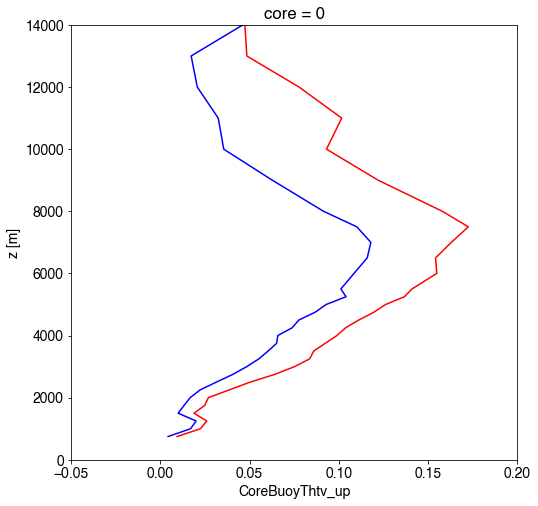

In [167]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ds_narrow_d2.CoreBuoyThtv_up.isel(times=slice(tidx_start, tidx_end)).max(dim='times').median(dim='tracks').plot.line(y='z', color='b', label='Narrow', ax=ax)
ds_wide_d2.CoreBuoyThtv_up.isel(times=slice(tidx_start, tidx_end)).max(dim='times').median(dim='tracks').plot.line(y='z', color='r', label='Wide', ax=ax)
ax.set_ylim(0,14000)
ax.set_xlim(-0.05, 0.2)

## Function to plot MxN profiles with shading

In [168]:
Wdepth_n_s_inqt_d2

<xarray.DataArray (quantile: 3)> Size: 24B
array([ 750., 1250., 1750.])
Coordinates:
  * quantile  (quantile) float64 24B 0.25 0.5 0.75

In [169]:
def plot_mxn_prof_shading(nrow, ncol, prof, inqt, height, 
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None, name_map=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    name_map = {'d':'Deep', 's':'Shallow'}
    lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'-', 'max':'-'}
    lw = 3
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof_data = prof[row][col]
            inqt_data = inqt[row][col]
            ax.plot(prof_data['s'], height, color=lcolors['s'], label=name_map['s'], lw=lw, ls=lstyles['min'])
            ax.plot(prof_data['d'], height, color=lcolors['d'], label=name_map['d'], lw=lw, ls=lstyles['min'])
            ax.fill_betweenx(height, inqt_data['s'][0], inqt_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
            ax.fill_betweenx(height, inqt_data['d'][0], inqt_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                ax.axhline(_z_thresh, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_CoreMaxBuoyancy_d2_d3_d4.png


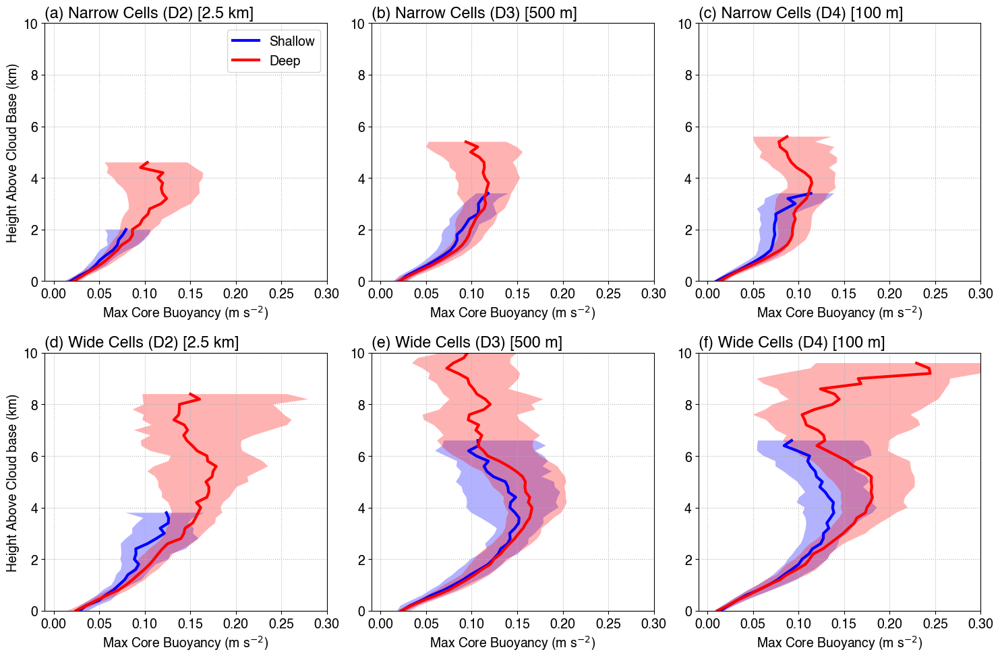

In [170]:
THRESH = 20
height_wbase = MaxCoreBuoy_n_s_avg_d2.z / 1000.
# Median profiles
med_w_d_d2 = MaxCoreBuoy_w_d_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoy_w_d_d2 > THRESH)
med_w_d_d3 = MaxCoreBuoy_w_d_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoy_w_d_d3 > THRESH)
med_w_d_d4 = MaxCoreBuoy_w_d_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoy_w_d_d4 > THRESH)
med_w_s_d2 = MaxCoreBuoy_w_s_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoy_w_s_d2 > THRESH)
med_w_s_d3 = MaxCoreBuoy_w_s_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoy_w_s_d3 > THRESH)
med_w_s_d4 = MaxCoreBuoy_w_s_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoy_w_s_d4 > THRESH)

med_n_d_d2 = MaxCoreBuoy_n_d_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoy_n_d_d2 > THRESH)
med_n_d_d3 = MaxCoreBuoy_n_d_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoy_n_d_d3 > THRESH)
med_n_d_d4 = MaxCoreBuoy_n_d_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoy_n_d_d4 > THRESH)
med_n_s_d2 = MaxCoreBuoy_n_s_inqt_d2.sel(quantile=0.5).where(nsMaxCoreBuoy_n_s_d2 > THRESH)
med_n_s_d3 = MaxCoreBuoy_n_s_inqt_d3.sel(quantile=0.5).where(nsMaxCoreBuoy_n_s_d3 > THRESH)
med_n_s_d4 = MaxCoreBuoy_n_s_inqt_d4.sel(quantile=0.5).where(nsMaxCoreBuoy_n_s_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
# prof = [
#     [{'d':MaxCoreBuoy_n_d_avg_d2.where(nsMaxCoreBuoy_n_d_d2 > THRESH), 's':MaxCoreBuoy_n_s_avg_d2.where(nsMaxCoreBuoy_n_s_d2 > THRESH)},
#      {'d':MaxCoreBuoy_n_d_avg_d3.where(nsMaxCoreBuoy_n_d_d3 > THRESH), 's':MaxCoreBuoy_n_s_avg_d3.where(nsMaxCoreBuoy_n_s_d3 > THRESH)},
#      {'d':MaxCoreBuoy_n_d_avg_d4.where(nsMaxCoreBuoy_n_d_d4 > THRESH), 's':MaxCoreBuoy_n_s_avg_d4.where(nsMaxCoreBuoy_n_s_d4 > THRESH)},],
#     [{'d':MaxCoreBuoy_w_d_avg_d2.where(nsMaxCoreBuoy_w_d_d2 > THRESH), 's':MaxCoreBuoy_w_s_avg_d2.where(nsMaxCoreBuoy_w_s_d2 > THRESH)},
#      {'d':MaxCoreBuoy_w_d_avg_d3.where(nsMaxCoreBuoy_w_d_d3 > THRESH), 's':MaxCoreBuoy_w_s_avg_d3.where(nsMaxCoreBuoy_w_s_d3 > THRESH)},
#      {'d':MaxCoreBuoy_w_d_avg_d4.where(nsMaxCoreBuoy_w_d_d4 > THRESH), 's':MaxCoreBuoy_w_s_avg_d4.where(nsMaxCoreBuoy_w_s_d4 > THRESH)},],
# ]
z_thresh = None
inqt25_w_d_d2 = MaxCoreBuoy_w_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreBuoy_w_d_d2 > THRESH)
inqt75_w_d_d2 = MaxCoreBuoy_w_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreBuoy_w_d_d2 > THRESH)
inqt25_w_s_d2 = MaxCoreBuoy_w_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreBuoy_w_s_d2 > THRESH)
inqt75_w_s_d2 = MaxCoreBuoy_w_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreBuoy_w_s_d2 > THRESH)
inqt25_n_d_d2 = MaxCoreBuoy_n_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreBuoy_n_d_d2 > THRESH)
inqt75_n_d_d2 = MaxCoreBuoy_n_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreBuoy_n_d_d2 > THRESH)
inqt25_n_s_d2 = MaxCoreBuoy_n_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreBuoy_n_s_d2 > THRESH)
inqt75_n_s_d2 = MaxCoreBuoy_n_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreBuoy_n_s_d2 > THRESH)

inqt25_w_d_d3 = MaxCoreBuoy_w_d_inqt_d3.sel(quantile=0.25).where(nsMaxCoreBuoy_w_d_d3 > THRESH)
inqt75_w_d_d3 = MaxCoreBuoy_w_d_inqt_d3.sel(quantile=0.75).where(nsMaxCoreBuoy_w_d_d3 > THRESH)
inqt25_w_s_d3 = MaxCoreBuoy_w_s_inqt_d3.sel(quantile=0.25).where(nsMaxCoreBuoy_w_s_d3 > THRESH)
inqt75_w_s_d3 = MaxCoreBuoy_w_s_inqt_d3.sel(quantile=0.75).where(nsMaxCoreBuoy_w_s_d3 > THRESH)
inqt25_n_d_d3 = MaxCoreBuoy_n_d_inqt_d3.sel(quantile=0.25).where(nsMaxCoreBuoy_n_d_d3 > THRESH)
inqt75_n_d_d3 = MaxCoreBuoy_n_d_inqt_d3.sel(quantile=0.75).where(nsMaxCoreBuoy_n_d_d3 > THRESH)
inqt25_n_s_d3 = MaxCoreBuoy_n_s_inqt_d3.sel(quantile=0.25).where(nsMaxCoreBuoy_n_s_d3 > THRESH)
inqt75_n_s_d3 = MaxCoreBuoy_n_s_inqt_d3.sel(quantile=0.75).where(nsMaxCoreBuoy_n_s_d3 > THRESH)

inqt25_w_d_d4 = MaxCoreBuoy_w_d_inqt_d4.sel(quantile=0.25).where(nsMaxCoreBuoy_w_d_d4 > THRESH)
inqt75_w_d_d4 = MaxCoreBuoy_w_d_inqt_d4.sel(quantile=0.75).where(nsMaxCoreBuoy_w_d_d4 > THRESH)
inqt25_w_s_d4 = MaxCoreBuoy_w_s_inqt_d4.sel(quantile=0.25).where(nsMaxCoreBuoy_w_s_d4 > THRESH)
inqt75_w_s_d4 = MaxCoreBuoy_w_s_inqt_d4.sel(quantile=0.75).where(nsMaxCoreBuoy_w_s_d4 > THRESH)
inqt25_n_d_d4 = MaxCoreBuoy_n_d_inqt_d4.sel(quantile=0.25).where(nsMaxCoreBuoy_n_d_d4 > THRESH)
inqt75_n_d_d4 = MaxCoreBuoy_n_d_inqt_d4.sel(quantile=0.75).where(nsMaxCoreBuoy_n_d_d4 > THRESH)
inqt25_n_s_d4 = MaxCoreBuoy_n_s_inqt_d4.sel(quantile=0.25).where(nsMaxCoreBuoy_n_s_d4 > THRESH)
inqt75_n_s_d4 = MaxCoreBuoy_n_s_inqt_d4.sel(quantile=0.75).where(nsMaxCoreBuoy_n_s_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]

xlabels = [
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(-0.01,0.3)]*ncol,
    [(-0.01,0.3)]*ncol,
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_CoreMaxBuoyancy_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_CoreMaxDiam_d2_d3_d4.png


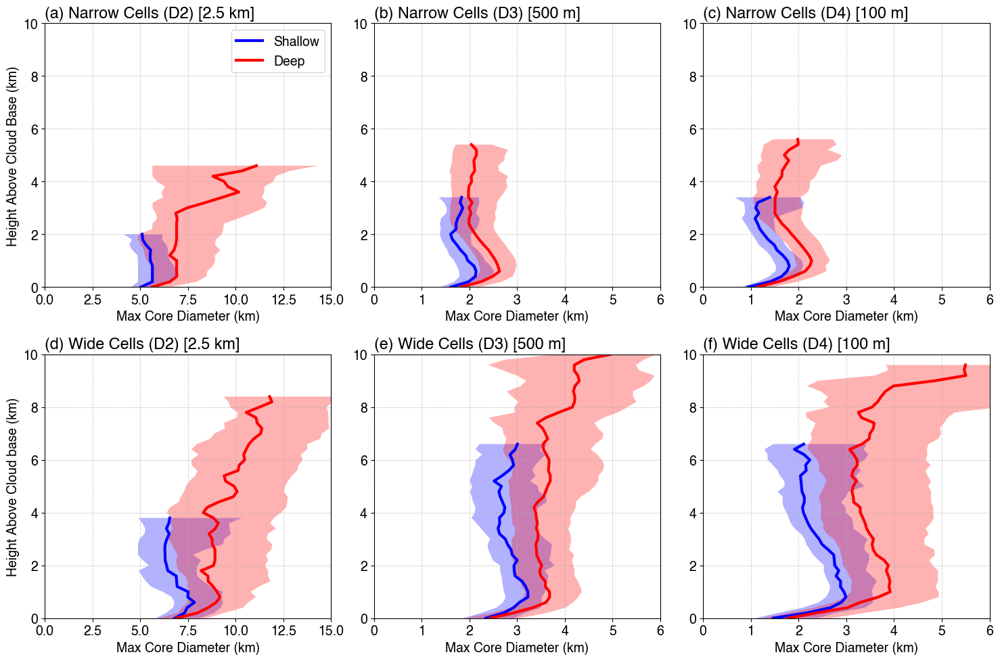

In [171]:
THRESH = 20
height_wbase = MaxCoreDiam_n_s_avg_d2.z / 1000.
# Median profiles
med_w_d_d2 = MaxCoreDiam_w_d_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_w_d_d2 > THRESH)
med_w_d_d3 = MaxCoreDiam_w_d_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_w_d_d3 > THRESH)
med_w_d_d4 = MaxCoreDiam_w_d_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_w_d_d4 > THRESH)
med_w_s_d2 = MaxCoreDiam_w_s_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_w_s_d2 > THRESH)
med_w_s_d3 = MaxCoreDiam_w_s_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_w_s_d3 > THRESH)
med_w_s_d4 = MaxCoreDiam_w_s_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_w_s_d4 > THRESH)

med_n_d_d2 = MaxCoreDiam_n_d_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_n_d_d2 > THRESH)
med_n_d_d3 = MaxCoreDiam_n_d_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_n_d_d3 > THRESH)
med_n_d_d4 = MaxCoreDiam_n_d_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_n_d_d4 > THRESH)
med_n_s_d2 = MaxCoreDiam_n_s_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_n_s_d2 > THRESH)
med_n_s_d3 = MaxCoreDiam_n_s_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_n_s_d3 > THRESH)
med_n_s_d4 = MaxCoreDiam_n_s_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_n_s_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
# prof = [
#     [{'d':MaxCoreDiam_n_d_avg_d2.where(nsMaxCoreDiam_n_d_d2 > THRESH), 's':MaxCoreDiam_n_s_avg_d2.where(nsMaxCoreDiam_n_s_d2 > THRESH)},
#      {'d':MaxCoreDiam_n_d_avg_d3.where(nsMaxCoreDiam_n_d_d3 > THRESH), 's':MaxCoreDiam_n_s_avg_d3.where(nsMaxCoreDiam_n_s_d3 > THRESH)},
#      {'d':MaxCoreDiam_n_d_avg_d4.where(nsMaxCoreDiam_n_d_d4 > THRESH), 's':MaxCoreDiam_n_s_avg_d4.where(nsMaxCoreDiam_n_s_d4 > THRESH)},],
#     [{'d':MaxCoreDiam_w_d_avg_d2.where(nsMaxCoreDiam_w_d_d2 > THRESH), 's':MaxCoreDiam_w_s_avg_d2.where(nsMaxCoreDiam_w_s_d2 > THRESH)},
#      {'d':MaxCoreDiam_w_d_avg_d3.where(nsMaxCoreDiam_w_d_d3 > THRESH), 's':MaxCoreDiam_w_s_avg_d3.where(nsMaxCoreDiam_w_s_d3 > THRESH)},
#      {'d':MaxCoreDiam_w_d_avg_d4.where(nsMaxCoreDiam_w_d_d4 > THRESH), 's':MaxCoreDiam_w_s_avg_d4.where(nsMaxCoreDiam_w_s_d4 > THRESH)},],
# ]
z_thresh = None
inqt25_w_d_d2 = MaxCoreDiam_w_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_w_d_d2 > THRESH)
inqt75_w_d_d2 = MaxCoreDiam_w_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_w_d_d2 > THRESH)
inqt25_w_s_d2 = MaxCoreDiam_w_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_w_s_d2 > THRESH)
inqt75_w_s_d2 = MaxCoreDiam_w_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_w_s_d2 > THRESH)
inqt25_n_d_d2 = MaxCoreDiam_n_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_n_d_d2 > THRESH)
inqt75_n_d_d2 = MaxCoreDiam_n_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_n_d_d2 > THRESH)
inqt25_n_s_d2 = MaxCoreDiam_n_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_n_s_d2 > THRESH)
inqt75_n_s_d2 = MaxCoreDiam_n_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_n_s_d2 > THRESH)

inqt25_w_d_d3 = MaxCoreDiam_w_d_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_w_d_d3 > THRESH)
inqt75_w_d_d3 = MaxCoreDiam_w_d_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_w_d_d3 > THRESH)
inqt25_w_s_d3 = MaxCoreDiam_w_s_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_w_s_d3 > THRESH)
inqt75_w_s_d3 = MaxCoreDiam_w_s_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_w_s_d3 > THRESH)
inqt25_n_d_d3 = MaxCoreDiam_n_d_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_n_d_d3 > THRESH)
inqt75_n_d_d3 = MaxCoreDiam_n_d_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_n_d_d3 > THRESH)
inqt25_n_s_d3 = MaxCoreDiam_n_s_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_n_s_d3 > THRESH)
inqt75_n_s_d3 = MaxCoreDiam_n_s_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_n_s_d3 > THRESH)

inqt25_w_d_d4 = MaxCoreDiam_w_d_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_w_d_d4 > THRESH)
inqt75_w_d_d4 = MaxCoreDiam_w_d_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_w_d_d4 > THRESH)
inqt25_w_s_d4 = MaxCoreDiam_w_s_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_w_s_d4 > THRESH)
inqt75_w_s_d4 = MaxCoreDiam_w_s_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_w_s_d4 > THRESH)
inqt25_n_d_d4 = MaxCoreDiam_n_d_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_n_d_d4 > THRESH)
inqt75_n_d_d4 = MaxCoreDiam_n_d_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_n_d_d4 > THRESH)
inqt25_n_s_d4 = MaxCoreDiam_n_s_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_n_s_d4 > THRESH)
inqt75_n_s_d4 = MaxCoreDiam_n_s_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_n_s_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]

xlabels = [
    ['Max Core Diameter (km)']*ncol,
    ['Max Core Diameter (km)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(0,15),(0,6),(0,6)],
    [(0,15),(0,6),(0,6)],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_CoreMaxDiam_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMax_CbaseProfile_NarrowWide_CoreMeanW_d2_d3_d4.png


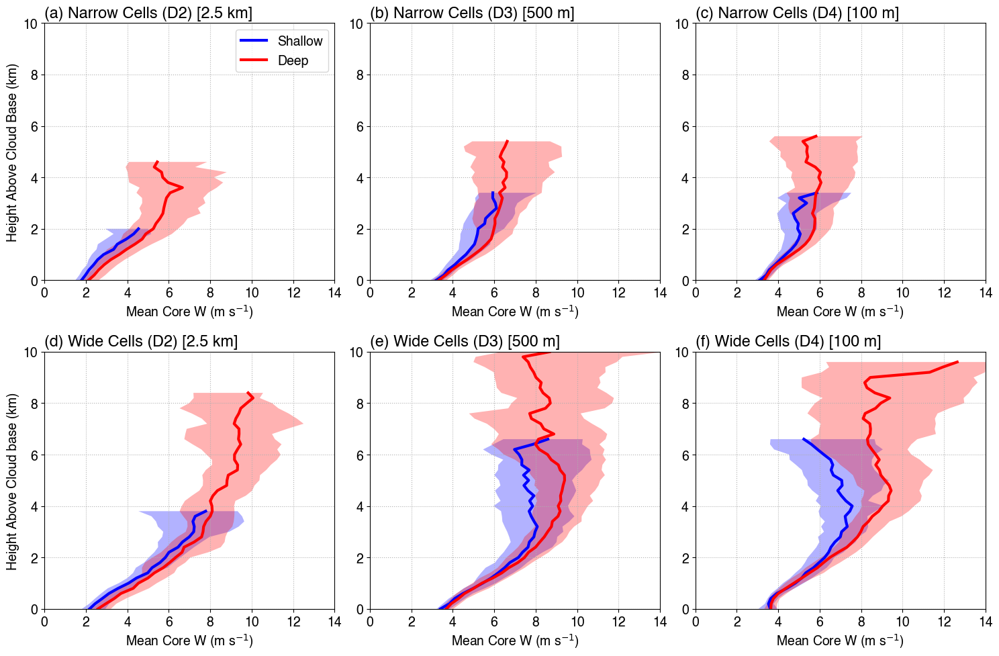

In [172]:
THRESH = 20
height_wbase = MaxCoreMeanW_n_s_avg_d2.z / 1000.
# Median profiles
med_w_d_d2 = MaxCoreMeanW_w_d_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMeanW_w_d_d2 > THRESH)
med_w_d_d3 = MaxCoreMeanW_w_d_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMeanW_w_d_d3 > THRESH)
med_w_d_d4 = MaxCoreMeanW_w_d_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMeanW_w_d_d4 > THRESH)
med_w_s_d2 = MaxCoreMeanW_w_s_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMeanW_w_s_d2 > THRESH)
med_w_s_d3 = MaxCoreMeanW_w_s_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMeanW_w_s_d3 > THRESH)
med_w_s_d4 = MaxCoreMeanW_w_s_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMeanW_w_s_d4 > THRESH)

med_n_d_d2 = MaxCoreMeanW_n_d_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMeanW_n_d_d2 > THRESH)
med_n_d_d3 = MaxCoreMeanW_n_d_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMeanW_n_d_d3 > THRESH)
med_n_d_d4 = MaxCoreMeanW_n_d_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMeanW_n_d_d4 > THRESH)
med_n_s_d2 = MaxCoreMeanW_n_s_inqt_d2.sel(quantile=0.5).where(nsMaxCoreMeanW_n_s_d2 > THRESH)
med_n_s_d3 = MaxCoreMeanW_n_s_inqt_d3.sel(quantile=0.5).where(nsMaxCoreMeanW_n_s_d3 > THRESH)
med_n_s_d4 = MaxCoreMeanW_n_s_inqt_d4.sel(quantile=0.5).where(nsMaxCoreMeanW_n_s_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
# prof = [
#     [{'d':MaxCoreMeanW_n_d_avg_d2.where(nsMaxCoreMeanW_n_d_d2 > THRESH), 's':MaxCoreMeanW_n_s_avg_d2.where(nsMaxCoreMeanW_n_s_d2 > THRESH)},
#      {'d':MaxCoreMeanW_n_d_avg_d3.where(nsMaxCoreMeanW_n_d_d3 > THRESH), 's':MaxCoreMeanW_n_s_avg_d3.where(nsMaxCoreMeanW_n_s_d3 > THRESH)},
#      {'d':MaxCoreMeanW_n_d_avg_d4.where(nsMaxCoreMeanW_n_d_d4 > THRESH), 's':MaxCoreMeanW_n_s_avg_d4.where(nsMaxCoreMeanW_n_s_d4 > THRESH)},],
#     [{'d':MaxCoreMeanW_w_d_avg_d2.where(nsMaxCoreMeanW_w_d_d2 > THRESH), 's':MaxCoreMeanW_w_s_avg_d2.where(nsMaxCoreMeanW_w_s_d2 > THRESH)},
#      {'d':MaxCoreMeanW_w_d_avg_d3.where(nsMaxCoreMeanW_w_d_d3 > THRESH), 's':MaxCoreMeanW_w_s_avg_d3.where(nsMaxCoreMeanW_w_s_d3 > THRESH)},
#      {'d':MaxCoreMeanW_w_d_avg_d4.where(nsMaxCoreMeanW_w_d_d4 > THRESH), 's':MaxCoreMeanW_w_s_avg_d4.where(nsMaxCoreMeanW_w_s_d4 > THRESH)},],
# ]
z_thresh = None
inqt25_w_d_d2 = MaxCoreMeanW_w_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreMeanW_w_d_d2 > THRESH)
inqt75_w_d_d2 = MaxCoreMeanW_w_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreMeanW_w_d_d2 > THRESH)
inqt25_w_s_d2 = MaxCoreMeanW_w_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreMeanW_w_s_d2 > THRESH)
inqt75_w_s_d2 = MaxCoreMeanW_w_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreMeanW_w_s_d2 > THRESH)
inqt25_n_d_d2 = MaxCoreMeanW_n_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreMeanW_n_d_d2 > THRESH)
inqt75_n_d_d2 = MaxCoreMeanW_n_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreMeanW_n_d_d2 > THRESH)
inqt25_n_s_d2 = MaxCoreMeanW_n_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreMeanW_n_s_d2 > THRESH)
inqt75_n_s_d2 = MaxCoreMeanW_n_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreMeanW_n_s_d2 > THRESH)

inqt25_w_d_d3 = MaxCoreMeanW_w_d_inqt_d3.sel(quantile=0.25).where(nsMaxCoreMeanW_w_d_d3 > THRESH)
inqt75_w_d_d3 = MaxCoreMeanW_w_d_inqt_d3.sel(quantile=0.75).where(nsMaxCoreMeanW_w_d_d3 > THRESH)
inqt25_w_s_d3 = MaxCoreMeanW_w_s_inqt_d3.sel(quantile=0.25).where(nsMaxCoreMeanW_w_s_d3 > THRESH)
inqt75_w_s_d3 = MaxCoreMeanW_w_s_inqt_d3.sel(quantile=0.75).where(nsMaxCoreMeanW_w_s_d3 > THRESH)
inqt25_n_d_d3 = MaxCoreMeanW_n_d_inqt_d3.sel(quantile=0.25).where(nsMaxCoreMeanW_n_d_d3 > THRESH)
inqt75_n_d_d3 = MaxCoreMeanW_n_d_inqt_d3.sel(quantile=0.75).where(nsMaxCoreMeanW_n_d_d3 > THRESH)
inqt25_n_s_d3 = MaxCoreMeanW_n_s_inqt_d3.sel(quantile=0.25).where(nsMaxCoreMeanW_n_s_d3 > THRESH)
inqt75_n_s_d3 = MaxCoreMeanW_n_s_inqt_d3.sel(quantile=0.75).where(nsMaxCoreMeanW_n_s_d3 > THRESH)

inqt25_w_d_d4 = MaxCoreMeanW_w_d_inqt_d4.sel(quantile=0.25).where(nsMaxCoreMeanW_w_d_d4 > THRESH)
inqt75_w_d_d4 = MaxCoreMeanW_w_d_inqt_d4.sel(quantile=0.75).where(nsMaxCoreMeanW_w_d_d4 > THRESH)
inqt25_w_s_d4 = MaxCoreMeanW_w_s_inqt_d4.sel(quantile=0.25).where(nsMaxCoreMeanW_w_s_d4 > THRESH)
inqt75_w_s_d4 = MaxCoreMeanW_w_s_inqt_d4.sel(quantile=0.75).where(nsMaxCoreMeanW_w_s_d4 > THRESH)
inqt25_n_d_d4 = MaxCoreMeanW_n_d_inqt_d4.sel(quantile=0.25).where(nsMaxCoreMeanW_n_d_d4 > THRESH)
inqt75_n_d_d4 = MaxCoreMeanW_n_d_inqt_d4.sel(quantile=0.75).where(nsMaxCoreMeanW_n_d_d4 > THRESH)
inqt25_n_s_d4 = MaxCoreMeanW_n_s_inqt_d4.sel(quantile=0.25).where(nsMaxCoreMeanW_n_s_d4 > THRESH)
inqt75_n_s_d4 = MaxCoreMeanW_n_s_inqt_d4.sel(quantile=0.75).where(nsMaxCoreMeanW_n_s_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]

xlabels = [
    ['Mean Core W (m s$^{-1}$)']*ncol,
    ['Mean Core W (m s$^{-1}$)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(0,14), (0,14), (0,14),],
    [(0,14), (0,14), (0,14),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_CbaseProfile_NarrowWide_CoreMeanW_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv20km/narrow_wide_CI+2h_fixshell/CIMean_CbaseProfile_NarrowWide_ShellMeanRH_d2_d3_d4.png


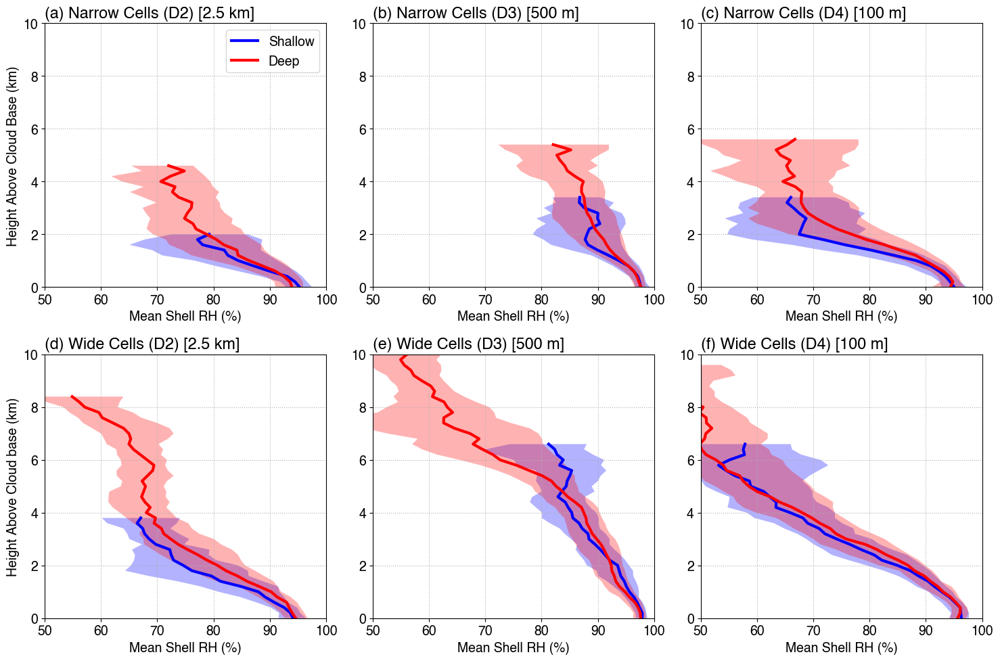

In [173]:
THRESH = 20
height_wbase = MeanShellRH_n_s_avg_d2.z / 1000.
# Median profiles
med_w_d_d2 = MeanShellRH_w_d_inqt_d2.sel(quantile=0.5).where(nsMeanShellRH_w_d_d2 > THRESH)
med_w_d_d3 = MeanShellRH_w_d_inqt_d3.sel(quantile=0.5).where(nsMeanShellRH_w_d_d3 > THRESH)
med_w_d_d4 = MeanShellRH_w_d_inqt_d4.sel(quantile=0.5).where(nsMeanShellRH_w_d_d4 > THRESH)
med_w_s_d2 = MeanShellRH_w_s_inqt_d2.sel(quantile=0.5).where(nsMeanShellRH_w_s_d2 > THRESH)
med_w_s_d3 = MeanShellRH_w_s_inqt_d3.sel(quantile=0.5).where(nsMeanShellRH_w_s_d3 > THRESH)
med_w_s_d4 = MeanShellRH_w_s_inqt_d4.sel(quantile=0.5).where(nsMeanShellRH_w_s_d4 > THRESH)

med_n_d_d2 = MeanShellRH_n_d_inqt_d2.sel(quantile=0.5).where(nsMeanShellRH_n_d_d2 > THRESH)
med_n_d_d3 = MeanShellRH_n_d_inqt_d3.sel(quantile=0.5).where(nsMeanShellRH_n_d_d3 > THRESH)
med_n_d_d4 = MeanShellRH_n_d_inqt_d4.sel(quantile=0.5).where(nsMeanShellRH_n_d_d4 > THRESH)
med_n_s_d2 = MeanShellRH_n_s_inqt_d2.sel(quantile=0.5).where(nsMeanShellRH_n_s_d2 > THRESH)
med_n_s_d3 = MeanShellRH_n_s_inqt_d3.sel(quantile=0.5).where(nsMeanShellRH_n_s_d3 > THRESH)
med_n_s_d4 = MeanShellRH_n_s_inqt_d4.sel(quantile=0.5).where(nsMeanShellRH_n_s_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
# prof = [
#     [{'d':MeanShellRH_n_d_avg_d2.where(nsMeanShellRH_n_d_d2 > THRESH), 's':MeanShellRH_n_s_avg_d2.where(nsMeanShellRH_n_s_d2 > THRESH)},
#      {'d':MeanShellRH_n_d_avg_d3.where(nsMeanShellRH_n_d_d3 > THRESH), 's':MeanShellRH_n_s_avg_d3.where(nsMeanShellRH_n_s_d3 > THRESH)},
#      {'d':MeanShellRH_n_d_avg_d4.where(nsMeanShellRH_n_d_d4 > THRESH), 's':MeanShellRH_n_s_avg_d4.where(nsMeanShellRH_n_s_d4 > THRESH)},],
#     [{'d':MeanShellRH_w_d_avg_d2.where(nsMeanShellRH_w_d_d2 > THRESH), 's':MeanShellRH_w_s_avg_d2.where(nsMeanShellRH_w_s_d2 > THRESH)},
#      {'d':MeanShellRH_w_d_avg_d3.where(nsMeanShellRH_w_d_d3 > THRESH), 's':MeanShellRH_w_s_avg_d3.where(nsMeanShellRH_w_s_d3 > THRESH)},
#      {'d':MeanShellRH_w_d_avg_d4.where(nsMeanShellRH_w_d_d4 > THRESH), 's':MeanShellRH_w_s_avg_d4.where(nsMeanShellRH_w_s_d4 > THRESH)},],
# ]
z_thresh = None
inqt25_w_d_d2 = MeanShellRH_w_d_inqt_d2.sel(quantile=0.25).where(nsMeanShellRH_w_d_d2 > THRESH)
inqt75_w_d_d2 = MeanShellRH_w_d_inqt_d2.sel(quantile=0.75).where(nsMeanShellRH_w_d_d2 > THRESH)
inqt25_w_s_d2 = MeanShellRH_w_s_inqt_d2.sel(quantile=0.25).where(nsMeanShellRH_w_s_d2 > THRESH)
inqt75_w_s_d2 = MeanShellRH_w_s_inqt_d2.sel(quantile=0.75).where(nsMeanShellRH_w_s_d2 > THRESH)
inqt25_n_d_d2 = MeanShellRH_n_d_inqt_d2.sel(quantile=0.25).where(nsMeanShellRH_n_d_d2 > THRESH)
inqt75_n_d_d2 = MeanShellRH_n_d_inqt_d2.sel(quantile=0.75).where(nsMeanShellRH_n_d_d2 > THRESH)
inqt25_n_s_d2 = MeanShellRH_n_s_inqt_d2.sel(quantile=0.25).where(nsMeanShellRH_n_s_d2 > THRESH)
inqt75_n_s_d2 = MeanShellRH_n_s_inqt_d2.sel(quantile=0.75).where(nsMeanShellRH_n_s_d2 > THRESH)

inqt25_w_d_d3 = MeanShellRH_w_d_inqt_d3.sel(quantile=0.25).where(nsMeanShellRH_w_d_d3 > THRESH)
inqt75_w_d_d3 = MeanShellRH_w_d_inqt_d3.sel(quantile=0.75).where(nsMeanShellRH_w_d_d3 > THRESH)
inqt25_w_s_d3 = MeanShellRH_w_s_inqt_d3.sel(quantile=0.25).where(nsMeanShellRH_w_s_d3 > THRESH)
inqt75_w_s_d3 = MeanShellRH_w_s_inqt_d3.sel(quantile=0.75).where(nsMeanShellRH_w_s_d3 > THRESH)
inqt25_n_d_d3 = MeanShellRH_n_d_inqt_d3.sel(quantile=0.25).where(nsMeanShellRH_n_d_d3 > THRESH)
inqt75_n_d_d3 = MeanShellRH_n_d_inqt_d3.sel(quantile=0.75).where(nsMeanShellRH_n_d_d3 > THRESH)
inqt25_n_s_d3 = MeanShellRH_n_s_inqt_d3.sel(quantile=0.25).where(nsMeanShellRH_n_s_d3 > THRESH)
inqt75_n_s_d3 = MeanShellRH_n_s_inqt_d3.sel(quantile=0.75).where(nsMeanShellRH_n_s_d3 > THRESH)

inqt25_w_d_d4 = MeanShellRH_w_d_inqt_d4.sel(quantile=0.25).where(nsMeanShellRH_w_d_d4 > THRESH)
inqt75_w_d_d4 = MeanShellRH_w_d_inqt_d4.sel(quantile=0.75).where(nsMeanShellRH_w_d_d4 > THRESH)
inqt25_w_s_d4 = MeanShellRH_w_s_inqt_d4.sel(quantile=0.25).where(nsMeanShellRH_w_s_d4 > THRESH)
inqt75_w_s_d4 = MeanShellRH_w_s_inqt_d4.sel(quantile=0.75).where(nsMeanShellRH_w_s_d4 > THRESH)
inqt25_n_d_d4 = MeanShellRH_n_d_inqt_d4.sel(quantile=0.25).where(nsMeanShellRH_n_d_d4 > THRESH)
inqt75_n_d_d4 = MeanShellRH_n_d_inqt_d4.sel(quantile=0.75).where(nsMeanShellRH_n_d_d4 > THRESH)
inqt25_n_s_d4 = MeanShellRH_n_s_inqt_d4.sel(quantile=0.25).where(nsMeanShellRH_n_s_d4 > THRESH)
inqt75_n_s_d4 = MeanShellRH_n_s_inqt_d4.sel(quantile=0.75).where(nsMeanShellRH_n_s_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]

xlabels = [
    ['Mean Shell RH (%)']*ncol,
    ['Mean Shell RH (%)']*ncol,
]
ylabels = [
    ['Height Above Cloud Base (km)', '', ''],
    ['Height Above Cloud base (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (0,10)
xlims = [
    [(50,100)]*ncol,
    [(50,100)]*ncol,
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMean_CbaseProfile_NarrowWide_ShellMeanRH_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_wbase, 
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [174]:
# # VAR_s_Wbase
# fig, ax = plt.subplots(1,1,figsize=(8,8))
# THRESH = 20
# MaxCoreBuoy_n_s_avg_d2.where(nsMaxCoreBuoy_n_s_d2 > THRESH).plot.line(y='z', color='b', ax=ax)
# MaxCoreBuoy_n_d_avg_d2.where(nsMaxCoreBuoy_n_d_d2 > THRESH).plot.line(y='z', color='r', ax=ax)
# inqt_s_l = MaxCoreBuoy_n_s_inqt_d2.sel(quantile=0.25).where(nsMaxCoreBuoy_n_s_d2 > THRESH)
# inqt_s_h = MaxCoreBuoy_n_s_inqt_d2.sel(quantile=0.75).where(nsMaxCoreBuoy_n_s_d2 > THRESH)
# inqt_d_l = MaxCoreBuoy_n_d_inqt_d2.sel(quantile=0.25).where(nsMaxCoreBuoy_n_d_d2 > THRESH)
# inqt_d_h = MaxCoreBuoy_n_d_inqt_d2.sel(quantile=0.75).where(nsMaxCoreBuoy_n_d_d2 > THRESH)
# ax.fill_betweenx(nsMaxCoreBuoy_n_s_d2.z, inqt_s_l, inqt_s_h, facecolor='b', alpha=0.3)
# ax.fill_betweenx(nsMaxCoreBuoy_n_d_d2.z, inqt_d_l, inqt_d_h, facecolor='r', alpha=0.3)
# Wdepth_l = Wdepth_n_s_inqt_d2.sel(quantile=0.25)
# Wdepth_h = Wdepth_n_s_inqt_d2.sel(quantile=0.75)
# ax.axhline(y=Wdepth_n_s_avg_d2, ls='--', color='k')
# ax.axhspan(Wdepth_l, Wdepth_h, facecolor='gray', alpha=0.3)

In [175]:
def preCI_prof_composite(ds, varname, preCI_nt=None, time_env=None):
    # Get dates
    dates = ds.date                    

    # Median 10dBZ ETH by date
    maxETH10dbz_thresh_bydate = ds["CImaxETH_10dbz"].groupby(dates).median()

    # Get MU parcel height prior to CI
    # mu_parcel_ht = ds["mu_parcel_ht_msl"].sel(times=slice(preCI_nt,0))
    # Get variable from DataSet, filter heights below MU parcel height, select a preCI time
    # VAR = ds[varname].where(height >= mu_parcel_ht).sel(times=time_env)
    VAR = ds[varname].sel(times=time_env)

    # Make shallow/deep ETH thresholds by dates
    mask_shallow = ds["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
    mask_deep = ds["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate
    
    # # Get sample size by dates
    # ns_shallow = mask_shallow.groupby(dates).sum()
    # ns_deep = mask_deep.groupby(dates).sum()

    # Separate shallow/deep, then take the median
    VAR_shallow_med = VAR.where(mask_shallow == True).median(dim='tracks')
    VAR_deep_med = VAR.where(mask_deep == True).median(dim='tracks')
    
    # Get sample size profiles by dates
    ns_prof_shallow = (~np.isnan(VAR.where(mask_shallow == True))).sum(dim='tracks')
    ns_prof_deep = (~np.isnan(VAR.where(mask_deep == True))).sum(dim='tracks')
    
    return (VAR_shallow_med, VAR_deep_med, ns_prof_shallow, ns_prof_deep)

In [176]:
ThetaE_narrow_shallow_med_d2, ThetaE_narrow_deep_med_d2, nsThetaE_narrow_shallow_d2, nsThetaE_narrow_deep_d2 = \
    preCI_prof_composite(ds_narrow_d2, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

ThetaE_wide_shallow_med_d2, ThetaE_wide_deep_med_d2, nsThetaE_wide_shallow_d2, nsThetaE_wide_deep_d2 = \
    preCI_prof_composite(ds_wide_d2, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

In [177]:
ThetaE_narrow_shallow_med_d3, ThetaE_narrow_deep_med_d3, nsThetaE_narrow_shallow_d3, nsThetaE_narrow_deep_d3 = \
    preCI_prof_composite(ds_narrow_d3, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

ThetaE_wide_shallow_med_d3, ThetaE_wide_deep_med_d3, nsThetaE_wide_shallow_d3, nsThetaE_wide_deep_d3 = \
    preCI_prof_composite(ds_wide_d3, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

In [178]:
def CImax_prof_composite(ds, varname, preCI_nt=None, time_env=None):
    # Get dates
    dates = ds.date                    

    # Median 10dBZ ETH by date
    maxETH10dbz_thresh_bydate = ds["CImaxETH_10dbz"].groupby(dates).median()
    
    # Make shallow/deep ETH thresholds by dates
    mask_shallow = ds["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
    mask_deep = ds["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate
    
    # Get variable from DataSet, subset CI-period: 
    VAR = ds[varname].isel(times=slice(tidx_start, tidx_end))
    
    # Separate shallow/deep, take max during CI period, then take the median
    VAR_shallow_med = VAR.where(mask_shallow == True).max(dim='times').median(dim='tracks')
    VAR_deep_med = VAR.where(mask_deep == True).max(dim='times').median(dim='tracks')
    
    # Get sample size profiles by dates
    ns_prof_shallow = (~np.isnan(VAR.where(mask_shallow == True).max(dim='times'))).sum(dim='tracks')
    ns_prof_deep = (~np.isnan(VAR.where(mask_deep == True).max(dim='times'))).sum(dim='tracks')
    
    return VAR_shallow_med, VAR_deep_med, ns_prof_shallow, ns_prof_deep

In [179]:
MaxThetaE_narrow_shallow_med_d2, MaxThetaE_narrow_deep_med_d2, nsMaxThetaE_narrow_shallow_d2, nsMaxThetaE_narrow_deep_d2 = \
    CImax_prof_composite(ds_narrow_d2, 'CoreThteMax_Bolton_up')

MaxThetaE_wide_shallow_med_d2, MaxThetaE_wide_deep_med_d2, nsMaxThetaE_wide_shallow_d2, nsMaxThetaE_wide_deep_d2 = \
    CImax_prof_composite(ds_wide_d2, 'CoreThteMax_Bolton_up')

In [180]:
MaxThetaE_narrow_shallow_med_d3, MaxThetaE_narrow_deep_med_d3, nsMaxThetaE_narrow_shallow_d3, nsMaxThetaE_narrow_deep_d3 = \
    CImax_prof_composite(ds_narrow_d3, 'CoreThteMax_Bolton_up')

MaxThetaE_wide_shallow_med_d3, MaxThetaE_wide_deep_med_d3, nsMaxThetaE_wide_shallow_d3, nsMaxThetaE_wide_deep_d3 = \
    CImax_prof_composite(ds_wide_d3, 'CoreThteMax_Bolton_up')

Text(0.5, 1.0, 'D3 Wide')

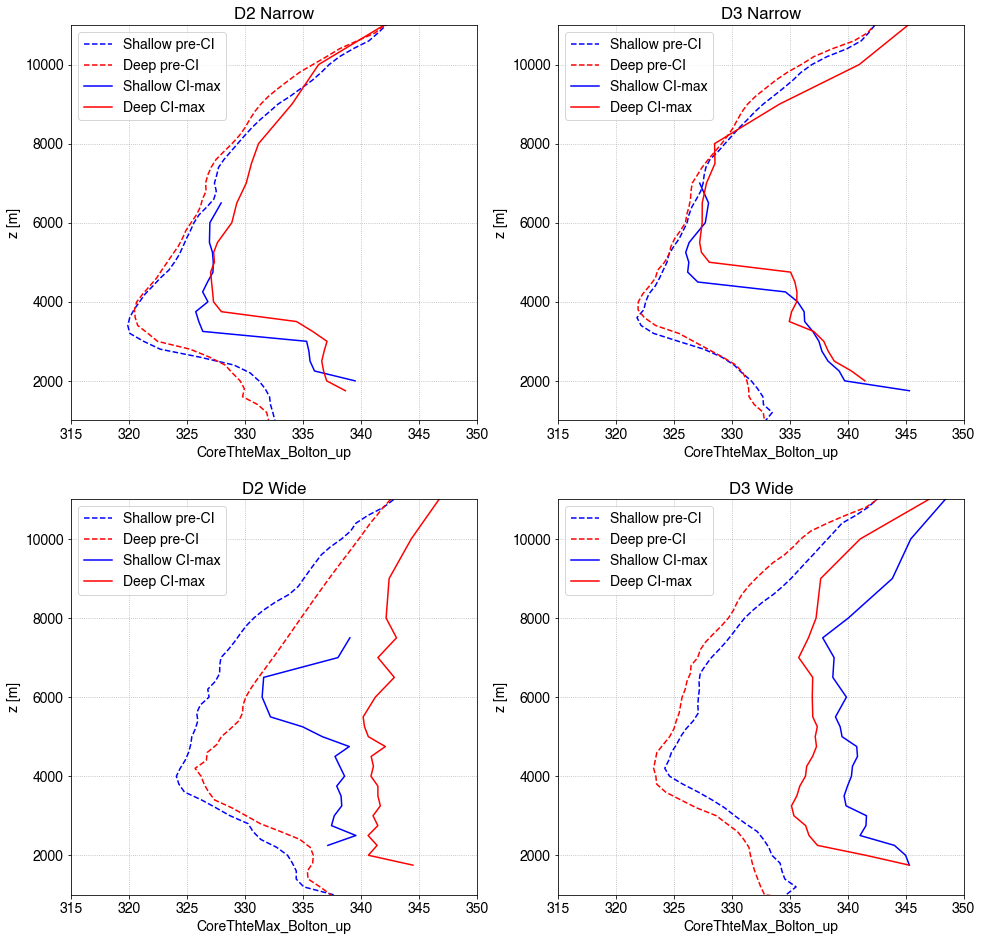

In [181]:
fig, axes = plt.subplots(2,2, figsize=[16,16])

ax = axes[0,0]
THRESH = 30
ThetaE_narrow_shallow_med_d2.where(nsThetaE_narrow_shallow_d2 > THRESH).plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
ThetaE_narrow_deep_med_d2.where(nsThetaE_narrow_deep_d2 > THRESH).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)

MaxThetaE_narrow_shallow_med_d2.where(nsMaxThetaE_narrow_shallow_d2 > THRESH).plot.line(y='z', color='b', label='Shallow CI-max', ax=ax)
MaxThetaE_narrow_deep_med_d2.where(nsMaxThetaE_narrow_deep_d2 > THRESH).plot.line(y='z', color='r', label='Deep CI-max', ax=ax)
# ax.axhline(maxETH10dbz_thresh_bydate.median()*1000, color='k', ls='--')
ax.set_ylim(1000,11000)
ax.set_xlim(315,350)
ax.grid(ls=':')
ax.legend()
ax.set_title('D2 Narrow')

ax = axes[1,0]
THRESH = 20
ThetaE_wide_shallow_med_d2.where(nsThetaE_wide_shallow_d2 > THRESH).plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
ThetaE_wide_deep_med_d2.where(nsThetaE_wide_deep_d2 > THRESH).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)

MaxThetaE_wide_shallow_med_d2.where(nsMaxThetaE_wide_shallow_d2 > THRESH).plot.line(y='z', color='b', label='Shallow CI-max', ax=ax)
MaxThetaE_wide_deep_med_d2.where(nsMaxThetaE_wide_deep_d2 > THRESH).plot.line(y='z', color='r', label='Deep CI-max', ax=ax)
# ax.axhline(maxETH10dbz_thresh_bydate.median()*1000, color='k', ls='--')
ax.set_ylim(1000,11000)
ax.set_xlim(315,350)
ax.grid(ls=':')
ax.legend()
ax.set_title('D2 Wide')

ax = axes[0,1]
THRESH = 30
ThetaE_narrow_shallow_med_d3.where(nsThetaE_narrow_shallow_d3 > THRESH).plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
ThetaE_narrow_deep_med_d3.where(nsThetaE_narrow_deep_d3 > THRESH).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)

MaxThetaE_narrow_shallow_med_d3.where(nsMaxThetaE_narrow_shallow_d3 > THRESH).plot.line(y='z', color='b', label='Shallow CI-max', ax=ax)
MaxThetaE_narrow_deep_med_d3.where(nsMaxThetaE_narrow_deep_d3 > THRESH).plot.line(y='z', color='r', label='Deep CI-max', ax=ax)
# ax.axhline(maxETH10dbz_thresh_bydate.median()*1000, color='k', ls='--')
ax.set_ylim(1000,11000)
ax.set_xlim(315,350)
ax.grid(ls=':')
ax.legend()
ax.set_title('D3 Narrow')

ax = axes[1,1]
THRESH = 20
ThetaE_wide_shallow_med_d3.where(nsThetaE_wide_shallow_d3 > THRESH).plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
ThetaE_wide_deep_med_d3.where(nsThetaE_wide_deep_d3 > THRESH).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)

MaxThetaE_wide_shallow_med_d3.where(nsMaxThetaE_wide_shallow_d3 > THRESH).plot.line(y='z', color='b', label='Shallow CI-max', ax=ax)
MaxThetaE_wide_deep_med_d3.where(nsMaxThetaE_wide_deep_d3 > THRESH).plot.line(y='z', color='r', label='Deep CI-max', ax=ax)
# ax.axhline(maxETH10dbz_thresh_bydate.median()*1000, color='k', ls='--')
ax.set_ylim(1000,11000)
ax.set_xlim(315,350)
ax.grid(ls=':')
ax.legend()
ax.set_title('D3 Wide')

Text(0.5, 1.0, '2.5 km Deep')

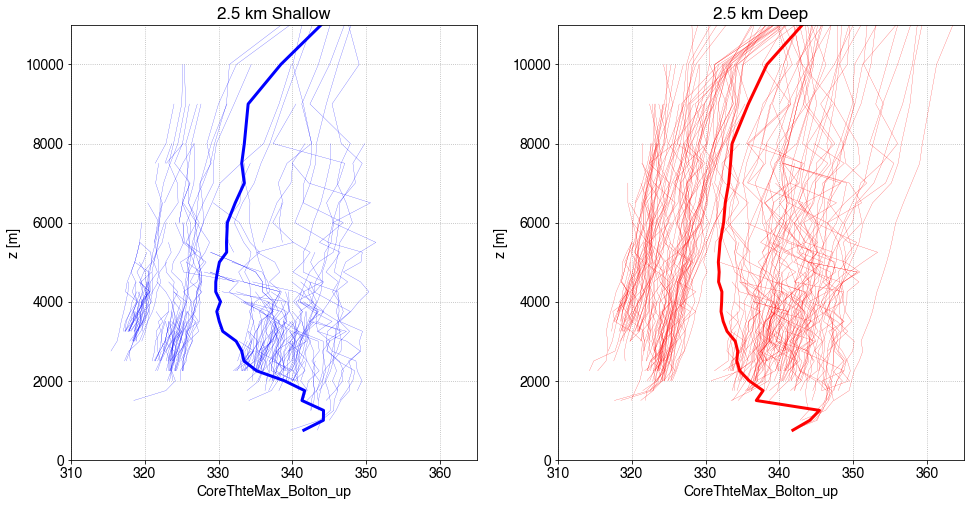

In [182]:
fig, axes = plt.subplots(1,2, figsize=[16,8])
dates = ds_narrow_d2.date
maxETH10dbz_thresh_bydate = ds_narrow_d2["CImaxETH_10dbz"].groupby(dates).median()
mask_shallow = ds_narrow_d2["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
mask_deep = ds_narrow_d2["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate

ax = axes[0]
ds_narrow_d2.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').plot.line(y='z', color='b', ls='-', lw=0.2, ax=ax, add_legend=False)
ds_narrow_d2.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').mean(dim='tracks').plot.line(y='z', color='b', ls='-', lw=3, label='Shallow CI-Max', ax=ax, add_legend=False)
# ds_narrow_d2.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).plot.line(y='height', color='b', ls='-', lw=0.2, label='Shallow pre-CI', ax=ax, add_legend=False)
# ds_narrow_d2.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='b', ls='-', lw=3, label='Shallow pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,365)
ax.grid(ls=':')
ax.set_title('2.5 km Shallow')

ax = axes[1]
ds_narrow_d2.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').plot.line(y='z', color='r', ls='-', lw=0.2, ax=ax, add_legend=False)
ds_narrow_d2.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').mean(dim='tracks').plot.line(y='z', color='r', ls='-', lw=3, label='Deep CI-Max', ax=ax, add_legend=False)
# ds_narrow_d2.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).plot.line(y='height', color='r', ls='-', lw=0.2, label='Deep pre-CI', ax=ax, add_legend=False)
# ds_narrow_d2.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='r', ls='-', lw=3, label='Deep pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,365)
ax.grid(ls=':')
ax.set_title('2.5 km Deep')
# ax.legend()

Text(0.5, 1.0, '500 m Deep')

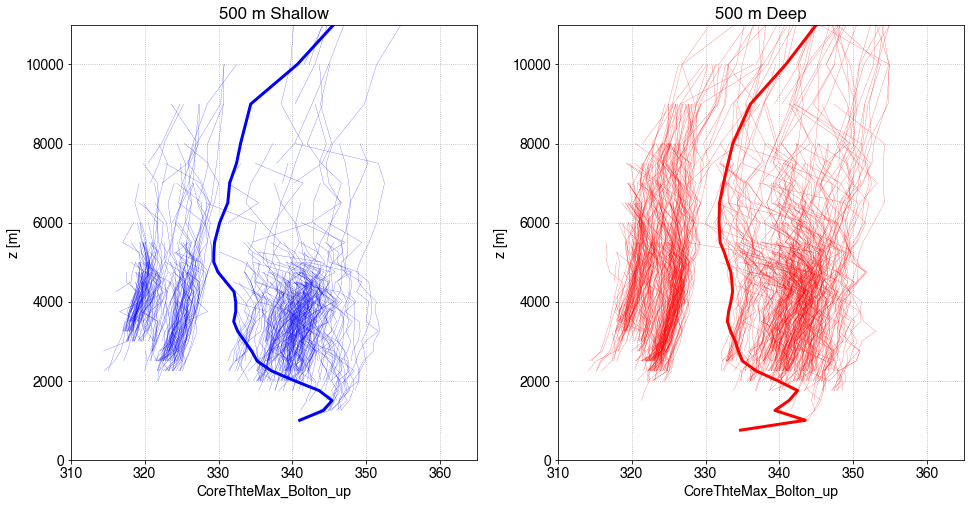

In [183]:
fig, axes = plt.subplots(1,2, figsize=[16,8])
dates = ds_narrow_d3.date
maxETH10dbz_thresh_bydate = ds_narrow_d3["CImaxETH_10dbz"].groupby(dates).median()
mask_shallow = ds_narrow_d3["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
mask_deep = ds_narrow_d3["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate

ax = axes[0]
ds_narrow_d3.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').plot.line(y='z', color='b', ls='-', lw=0.2, ax=ax, add_legend=False)
ds_narrow_d3.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').mean(dim='tracks').plot.line(y='z', color='b', ls='-', lw=3, label='Shallow CI-Max', ax=ax, add_legend=False)
# ds_narrow_d3.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).plot.line(y='height', color='b', ls='-', lw=0.2, label='Shallow pre-CI', ax=ax, add_legend=False)
# ds_narrow_d3.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='b', ls='-', lw=3, label='Shallow pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,365)
ax.grid(ls=':')
ax.set_title('500 m Shallow')

ax = axes[1]
ds_narrow_d3.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').plot.line(y='z', color='r', ls='-', lw=0.2, ax=ax, add_legend=False)
ds_narrow_d3.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').mean(dim='tracks').plot.line(y='z', color='r', ls='-', lw=3, label='Deep CI-Max', ax=ax, add_legend=False)
# ds_narrow_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).plot.line(y='height', color='r', ls='-', lw=0.2, label='Deep pre-CI', ax=ax, add_legend=False)
# ds_narrow_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='r', ls='-', lw=3, label='Deep pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,365)
ax.grid(ls=':')
ax.set_title('500 m Deep')
# ax.legend()

Text(0.5, 1.0, '500 m Deep Updraft')

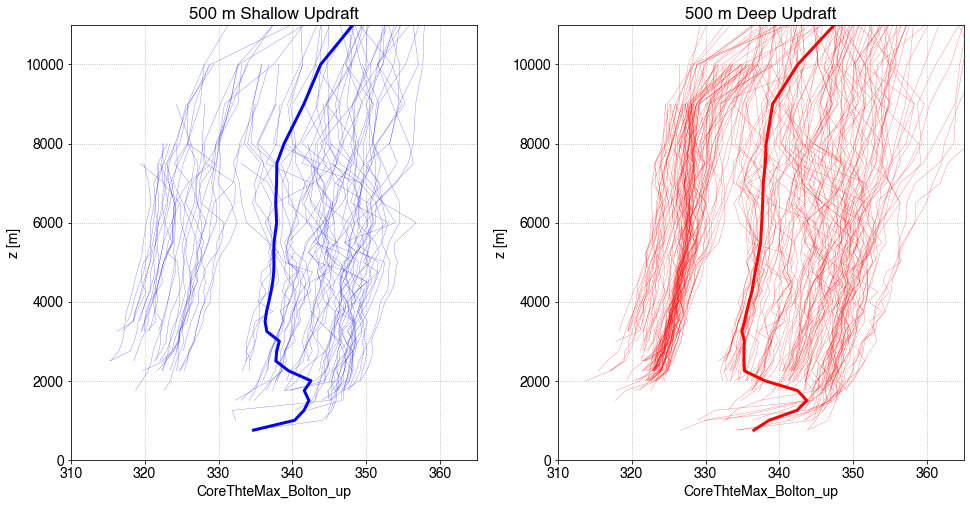

In [184]:
fig, axes = plt.subplots(1,2, figsize=[16,8])
dates = ds_wide_d3.date
maxETH10dbz_thresh_bydate = ds_wide_d3["CImaxETH_10dbz"].groupby(dates).median()
mask_shallow = ds_wide_d3["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
mask_deep = ds_wide_d3["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate

ax = axes[0]
ds_wide_d3.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').plot.line(y='z', color='b', ls='-', lw=0.2, ax=ax, add_legend=False)
ds_wide_d3.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').mean(dim='tracks').plot.line(y='z', color='b', ls='-', lw=3, label='Shallow CI-Max', ax=ax, add_legend=False)
# ds_wide_d3.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).plot.line(y='height', color='b', ls='-', lw=0.2, label='Shallow pre-CI', ax=ax, add_legend=False)
# ds_wide_d3.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='b', ls='-', lw=3, label='Shallow pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,365)
ax.grid(ls=':')
ax.set_title('500 m Shallow Updraft')

ax = axes[1]
ds_wide_d3.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').plot.line(y='z', color='r', ls='-', lw=0.2, ax=ax, add_legend=False)
ds_wide_d3.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').mean(dim='tracks').plot.line(y='z', color='r', ls='-', lw=3, label='Deep CI-Max', ax=ax, add_legend=False)
# ds_wide_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).plot.line(y='height', color='r', ls='-', lw=0.2, label='Deep pre-CI', ax=ax, add_legend=False)
# ds_wide_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='r', ls='-', lw=3, label='Deep pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,365)
ax.grid(ls=':')
ax.set_title('500 m Deep Updraft')
# ax.legend()

Text(0.5, 1.0, '500 m Deep PreCI')

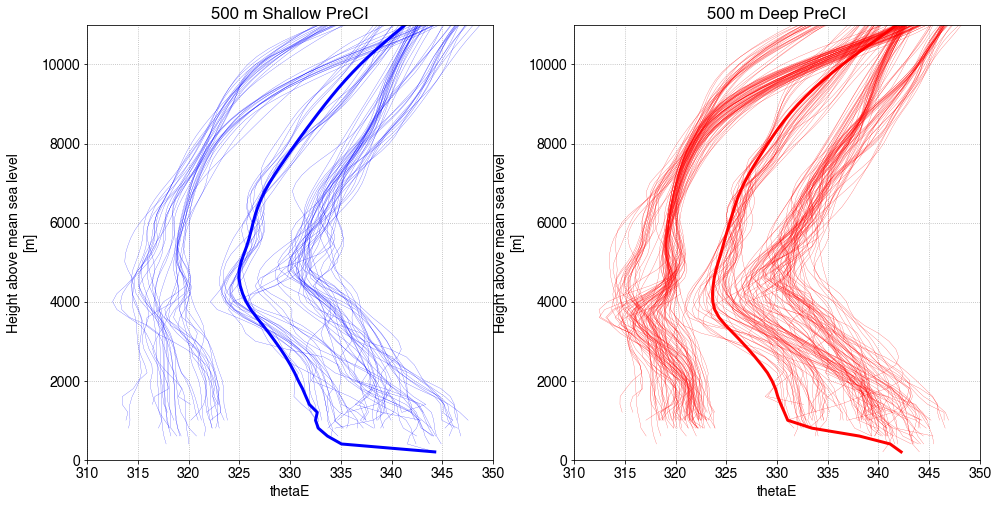

In [185]:
fig, axes = plt.subplots(1,2, figsize=[16,8])
dates = ds_wide_d3.date
maxETH10dbz_thresh_bydate = ds_wide_d3["CImaxETH_10dbz"].groupby(dates).median()
mask_shallow = ds_wide_d3["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
mask_deep = ds_wide_d3["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate

ax = axes[0]
# ds_wide_d3.thetaE.where(mask_shallow == True).sel(times=time_env)
ds_wide_d3.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).plot.line(y='height', color='b', ls='-', lw=0.2, label='Shallow pre-CI', ax=ax, add_legend=False)
ds_wide_d3.thetaE.where(mask_shallow == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='b', ls='-', lw=3, label='Shallow pre-CI', ax=ax, add_legend=False)
# ds_wide_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax, add_legend=False)
# ds_wide_d3.thetaE.sel(times=time_env).where(mask_shallow == True).median(dim='tracks').plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
# ds_wide_d3.thetaE.sel(times=time_env).where(mask_deep == True).median(dim='tracks').plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)
ax.set_ylim(0,11000)
ax.set_xlim(310,350)
ax.grid(ls=':')
ax.set_title('500 m Shallow PreCI')

ax = axes[1]
ds_wide_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).plot.line(y='height', color='r', ls='-', lw=0.2, label='Deep pre-CI', ax=ax, add_legend=False)
ds_wide_d3.thetaE.where(mask_deep == True, drop=True).sel(times=time_env).mean(dim='tracks').plot.line(y='height', color='r', ls='-', lw=3, label='Deep pre-CI', ax=ax, add_legend=False)
ax.set_ylim(0,11000)
ax.set_xlim(310,350)
ax.grid(ls=':')
ax.set_title('500 m Deep PreCI')

In [186]:
# fig, ax = plt.subplots(1,1, figsize=[8,8])
# THRESH = 10
# nsThE_n_d_d2 = nsThetaE_narrow_deep_d2.sum(dim='date')
# nsThE_n_s_d2 = nsThetaE_narrow_shallow_d2.sum(dim='date')

# ds_narrow_d2.thetaE.where(mask_shallow == True).sel(times=time_env).median(dim='tracks').where(nsThE_n_s_d2 > THRESH).plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
# ds_narrow_d2.thetaE.where(mask_deep == True).sel(times=time_env).median(dim='tracks').where(nsThE_n_d_d2 > THRESH).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)

# nsMaxThE_n_s_d2 = nsMaxThetaE_narrow_shallow_d2.sum(dim='date')
# nsMaxThE_n_d_d2 = nsMaxThetaE_narrow_deep_d2.sum(dim='date')

# ds_narrow_d2.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').median(dim='tracks').where(nsMaxThE_n_s_d2 > THRESH).plot.line(y='z', color='b', label='Shallow CI-max', ax=ax)
# ds_narrow_d2.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').median(dim='tracks').where(nsMaxThE_n_d_d2 > THRESH).plot.line(y='z', color='r', label='Deep CI-max', ax=ax)
# ax.axhline(maxETH10dbz_thresh_bydate.median()*1000, color='k', ls='--')
# ax.set_ylim(1000,11000)
# ax.set_xlim(315,350)
# ax.grid(ls=':')
# ax.legend()

In [187]:
# # nsMaxThetaE_wide_shallow_d2.plot.line(y='z', add_legend=False)
# dates = ds_wide_d2.date
# maxETH10dbz_thresh_bydate = ds_wide_d2["CImaxETH_10dbz"].groupby(dates).median()
# mask_shallow = ds_wide_d2["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
# mask_deep = ds_wide_d2["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate

In [188]:
# fig, ax = plt.subplots(1,1, figsize=[8,8])
# THRESH = 5
# nsThE_w_d_d2 = nsThetaE_wide_deep_d2.sum(dim='date')
# nsThE_w_s_d2 = nsThetaE_wide_shallow_d2.sum(dim='date')

# ds_wide_d2.thetaE.where(mask_shallow == True).sel(times=time_env).median(dim='tracks').where(nsThE_w_s_d2 > THRESH).plot.line(y='height', color='b', ls='--', label='Shallow pre-CI', ax=ax)
# ds_wide_d2.thetaE.where(mask_deep == True).sel(times=time_env).median(dim='tracks').where(nsThE_w_d_d2 > THRESH).plot.line(y='height', color='r', ls='--', label='Deep pre-CI', ax=ax)

# nsMaxThE_w_s_d2 = nsMaxThetaE_wide_shallow_d2.sum(dim='date')
# nsMaxThE_w_d_d2 = nsMaxThetaE_wide_deep_d2.sum(dim='date')

# ds_wide_d2.CoreThteMax_Bolton_up.where(mask_shallow == True).max(dim='times').median(dim='tracks').where(nsMaxThE_w_s_d2 > THRESH).plot.line(y='z', color='b', label='Shallow CI-max', ax=ax)
# ds_wide_d2.CoreThteMax_Bolton_up.where(mask_deep == True).max(dim='times').median(dim='tracks').where(nsMaxThE_w_d_d2 > THRESH).plot.line(y='z', color='r', label='Deep CI-max', ax=ax)
# ax.axhline(maxETH10dbz_thresh_bydate.median()*1000, color='k', ls='--')
# ax.set_ylim(1000,11000)
# ax.set_xlim(315,350)
# ax.grid(ls=':')
# ax.legend()

## Function to plot MxN panel profiles by dates

In [189]:
def plot_mxn_profs_dates(nrow, ncol, prof1, prof2, height, nsamples,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, 
                  legend_show=None, legend_loc=None, legend_fs=None,
                  titles=None, fontsize=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    # Use a colormap to generate 8 distinct colors
    # colors = plt.cm.tab10(np.linspace(0, 1, len(unique_dates)))  # 'tab10' provides 10 distinct colors, suitable for small numbers
    lcolors = plt.cm.jet(np.linspace(0, 1, len(unique_dates)))
    # lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'--', 'max':'-'}
    lw = 2
    alpha = 0.5
    date_fmt = '%b %d'
    # date_fmt = '%Y-%m-%d'
    name_map1 = {'d':'Deep preCI', 's':'Shallow preCI'}
    name_map2 = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
   
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof1_data = prof1[row][col]
            prof2_data = prof2[row][col]
            ns_data = nsamples[row][col]
            # Loop over each date
            for i, date in enumerate(unique_dates):
                color = lcolors[i]  # Assign a unique color to each date
                idate = pd.to_datetime(date).strftime(date_fmt)
                ns_s = ns_data['s'].sel(date=date).item()
                ns_d = ns_data['d'].sel(date=date).item()
                ilabel = f"{idate} ({ns_s}, {ns_d})"
                
                ax.plot(prof1_data['s'].sel(date=date), height, ls="--", color=color, lw=lw)
                ax.plot(prof1_data['d'].sel(date=date), height, ls="-", color=color, lw=lw, label=f"{ilabel}")
                
                # ax.plot(prof1_data['s'], height, color=lcolors['s'], label=name_map1['s'], lw=lw, ls=lstyles['min'])
                # ax.plot(prof1_data['d'], height, color=lcolors['d'], label=name_map1['d'], lw=lw, ls=lstyles['min'])
                # # if col == 0:
                # ax.plot(prof2_data['s'], height_core, color=lcolors['s'], label=name_map2['s'], lw=lw, ls=lstyles['max'])
                # ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])

            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(title="(Shallow, Deep)", loc=legend_loc, fontsize=legend_fs)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                _z_fill = [_z_thresh.quantile(0.25), _z_thresh.quantile(0.75)]
                _z_med = _z_thresh.median()
                ax.axhspan(_z_fill[0], _z_fill[1], facecolor='silver', alpha=alpha)
                ax.axhline(_z_med, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

In [190]:
# Get median ETH thresholds by date
narrow_maxETH10dbz_thresh_bydate_d2 = ds_narrow_d2["CImaxETH_10dbz"].groupby(ds_narrow_d2.date).median()
wide_maxETH10dbz_thresh_bydate_d2 = ds_wide_d2["CImaxETH_10dbz"].groupby(ds_wide_d2.date).median()

narrow_maxETH10dbz_thresh_bydate_d3 = ds_narrow_d3["CImaxETH_10dbz"].groupby(ds_narrow_d3.date).median()
wide_maxETH10dbz_thresh_bydate_d3 = ds_wide_d3["CImaxETH_10dbz"].groupby(ds_wide_d3.date).median()

narrow_maxETH10dbz_thresh_bydate_d4 = ds_narrow_d4["CImaxETH_10dbz"].groupby(ds_narrow_d4.date).median()
wide_maxETH10dbz_thresh_bydate_d4 = ds_wide_d4["CImaxETH_10dbz"].groupby(ds_wide_d4.date).median()

In [191]:
THRESH = 3
# THRESH = 2

prof1 = [
    [{'d':ThetaE_narrow_deep_med_dates_d2.where(nsThetaE_narrow_deep_d2 > THRESH), 's':ThetaE_narrow_shallow_med_dates_d2.where(nsThetaE_narrow_shallow_d2 > THRESH)},
     {'d':ThetaE_narrow_deep_med_dates_d3.where(nsThetaE_narrow_deep_d3 > THRESH), 's':ThetaE_narrow_shallow_med_dates_d3.where(nsThetaE_narrow_shallow_d3 > THRESH)},
     {'d':ThetaE_narrow_deep_med_dates_d4.where(nsThetaE_narrow_deep_d4 > THRESH), 's':ThetaE_narrow_shallow_med_dates_d4.where(nsThetaE_narrow_shallow_d4 > THRESH)},],
    [{'d':ThetaE_wide_deep_med_dates_d2.where(nsThetaE_wide_deep_d2 > THRESH), 's':ThetaE_wide_shallow_med_dates_d2.where(nsThetaE_wide_shallow_d2 > THRESH)},
     {'d':ThetaE_wide_deep_med_dates_d3.where(nsThetaE_wide_deep_d3 > THRESH), 's':ThetaE_wide_shallow_med_dates_d3.where(nsThetaE_wide_shallow_d3 > THRESH)},
     {'d':ThetaE_wide_deep_med_dates_d4.where(nsThetaE_wide_deep_d4 > THRESH), 's':ThetaE_wide_shallow_med_dates_d4.where(nsThetaE_wide_shallow_d4 > THRESH)},],
]
prof2 = prof1
nsamples = [
    [{'d':ns_narrow_deep_d2, 's':ns_narrow_shallow_d2},
     {'d':ns_narrow_deep_d3, 's':ns_narrow_shallow_d3},
     {'d':ns_narrow_deep_d4, 's':ns_narrow_shallow_d4},],
    [{'d':ns_wide_deep_d2, 's':ns_wide_shallow_d2},
     {'d':ns_wide_deep_d3, 's':ns_wide_shallow_d3},
     {'d':ns_wide_deep_d4, 's':ns_wide_shallow_d4},]
]
z_thresh = [[narrow_maxETH10dbz_thresh_bydate_d2, narrow_maxETH10dbz_thresh_bydate_d3, narrow_maxETH10dbz_thresh_bydate_d4], 
            [wide_maxETH10dbz_thresh_bydate_d2, wide_maxETH10dbz_thresh_bydate_d3, wide_maxETH10dbz_thresh_bydate_d4]]
nrow = len(prof1)
ncol = len(prof1[0])
# nrow, ncol
xlabels = [
    [r'pre-CI Environmental $\theta_e$ (K)']*ncol,
    [r'pre-CI Environmental $\theta_e$ (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]

ylims = (1,11)
xlims = [
    [(310,365)]*ncol,
    [(310,365)]*ncol,
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'best'
legend_fs = 9
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}PreCI_Profile_NarrowWide_ThetaE_byDates_d2_d3_d4.png'
print(figname)
fig = plot_mxn_profs_dates(nrow, ncol, prof1, prof2, height/1e3, nsamples, z_thresh=z_thresh, 
                           legend_show=legend_show, legend_loc=legend_loc, legend_fs=legend_fs,
                           xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

NameError: name 'ThetaE_narrow_deep_med_dates_d2' is not defined

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/CIMax_Profile_NarrowWide_CoreMaxThetaE_byDates_d2_d3_d4.png


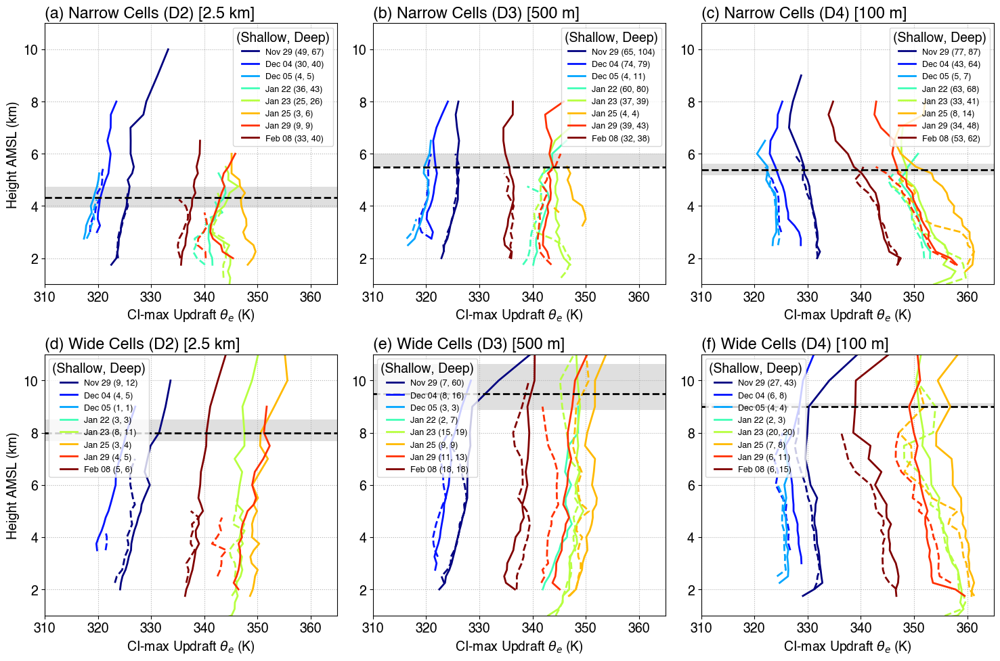

In [ ]:
THRESH = 3
# THRESH = 2

prof1 = [
    [{'d':MaxThetaE_narrow_deep_med_dates_d2.where(nsMaxThetaE_narrow_deep_d2 > THRESH), 's':MaxThetaE_narrow_shallow_med_dates_d2.where(nsMaxThetaE_narrow_shallow_d2 > THRESH)},
     {'d':MaxThetaE_narrow_deep_med_dates_d3.where(nsMaxThetaE_narrow_deep_d3 > THRESH), 's':MaxThetaE_narrow_shallow_med_dates_d3.where(nsMaxThetaE_narrow_shallow_d3 > THRESH)},
     {'d':MaxThetaE_narrow_deep_med_dates_d4.where(nsMaxThetaE_narrow_deep_d4 > THRESH), 's':MaxThetaE_narrow_shallow_med_dates_d4.where(nsMaxThetaE_narrow_shallow_d4 > THRESH)},],
    [{'d':MaxThetaE_wide_deep_med_dates_d2.where(nsMaxThetaE_wide_deep_d2 > THRESH), 's':MaxThetaE_wide_shallow_med_dates_d2.where(nsMaxThetaE_wide_shallow_d2 > THRESH)},
     {'d':MaxThetaE_wide_deep_med_dates_d3.where(nsMaxThetaE_wide_deep_d3 > THRESH), 's':MaxThetaE_wide_shallow_med_dates_d3.where(nsMaxThetaE_wide_shallow_d3 > THRESH)},
     {'d':MaxThetaE_wide_deep_med_dates_d4.where(nsMaxThetaE_wide_deep_d4 > THRESH), 's':MaxThetaE_wide_shallow_med_dates_d4.where(nsMaxThetaE_wide_shallow_d4 > THRESH)},],
]
prof2 = prof1
nsamples = [
    [{'d':ns_narrow_deep_d2, 's':ns_narrow_shallow_d2},
     {'d':ns_narrow_deep_d3, 's':ns_narrow_shallow_d3},
     {'d':ns_narrow_deep_d4, 's':ns_narrow_shallow_d4},],
    [{'d':ns_wide_deep_d2, 's':ns_wide_shallow_d2},
     {'d':ns_wide_deep_d3, 's':ns_wide_shallow_d3},
     {'d':ns_wide_deep_d4, 's':ns_wide_shallow_d4},]
]
z_thresh = [[narrow_maxETH10dbz_thresh_bydate_d2, narrow_maxETH10dbz_thresh_bydate_d3, narrow_maxETH10dbz_thresh_bydate_d4], 
            [wide_maxETH10dbz_thresh_bydate_d2, wide_maxETH10dbz_thresh_bydate_d3, wide_maxETH10dbz_thresh_bydate_d4]]
nrow = len(prof1)
ncol = len(prof1[0])
# nrow, ncol
xlabels = [
    [r'CI-max Updraft $\theta_e$ (K)']*ncol,
    [r'CI-max Updraft $\theta_e$ (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]

ylims = (1,11)
xlims = [
    [(310,365)]*ncol,
    [(310,365)]*ncol,
]
legend_show = [[True]*ncol,[True]*ncol]
legend_loc = 'best'
legend_fs = 9
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMaxThetaE_byDates_d2_d3_d4.png'
print(figname)
fig = plot_mxn_profs_dates(nrow, ncol, prof1, prof2, height_core/1e3, nsamples, z_thresh=z_thresh, 
                           legend_show=legend_show, legend_loc=legend_loc, legend_fs=legend_fs,
                           xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# Z_lowlevel = 3000. # [m]

# # Find low-level max value for each date
# max_ThetaE_ll = ThetaE_narrow_deep_med_dates_d2.where(height < Z_lowlevel, drop=True).max(dim='height')
# # Compute the mean of these max values across all dates
# mean_max_ThetaE_ll = max_ThetaE_ll.mean(dim='date')
# # Compute the difference for each profile
# shift_amount = max_ThetaE_ll - mean_max_ThetaE_ll
# # Shift the entire profile by subtracting the difference
# scaled_ThetaE_narrow_deep_med_dates_d2 = ThetaE_narrow_deep_med_dates_d2 - shift_amount

## Group preCI profiles by dates and compute statistics

In [ ]:
def preCI_prof_by_dates(ds, varname, preCI_nt=None, time_env=None):
    # Get dates
    dates = ds.date                    

    # Median 10dBZ ETH by date
    maxETH10dbz_thresh_bydate = ds["CImaxETH_10dbz"].groupby(dates).median()

    # Get MU parcel height prior to CI
    mu_parcel_ht = ds["mu_parcel_ht_msl"].sel(times=slice(preCI_nt,0))
    # Get variable from DataSet, filter heights below MU parcel height, select a preCI time
    VAR = ds[varname].where(height >= mu_parcel_ht).sel(times=time_env)

    # Make shallow/deep ETH thresholds by dates
    mask_shallow = ds["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
    mask_deep = ds["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate
    
    # Get sample size by dates
    ns_shallow = mask_shallow.groupby(dates).sum()
    ns_deep = mask_deep.groupby(dates).sum()

    # Separate shallow/deep by date, then groupby date and take the median
    VAR_shallow_med = VAR.where(mask_shallow == True).groupby(dates).median()
    VAR_deep_med = VAR.where(mask_deep == True).groupby(dates).median()
    
    # Get sample size profiles by dates
    ns_prof_shallow = (~np.isnan(VAR.where(mask_shallow == True))).groupby(dates).sum(dim='tracks')
    ns_prof_deep = (~np.isnan(VAR.where(mask_deep == True))).groupby(dates).sum(dim='tracks')
    
    return (VAR_shallow_med, VAR_deep_med, ns_shallow, ns_deep, ns_prof_shallow, ns_prof_deep)

In [ ]:
ThetaE_narrow_shallow_med_dates_d2, ThetaE_narrow_deep_med_dates_d2, ns_narrow_shallow_d2, ns_narrow_deep_d2, nsThetaE_narrow_shallow_d2, nsThetaE_narrow_deep_d2 = \
    preCI_prof_by_dates(ds_narrow_d2, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

ThetaE_wide_shallow_med_dates_d2, ThetaE_wide_deep_med_dates_d2, ns_wide_shallow_d2, ns_wide_deep_d2, nsThetaE_wide_shallow_d2, nsThetaE_wide_deep_d2 = \
    preCI_prof_by_dates(ds_wide_d2, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

In [ ]:
ThetaE_narrow_shallow_med_dates_d3, ThetaE_narrow_deep_med_dates_d3, ns_narrow_shallow_d3, ns_narrow_deep_d3, nsThetaE_narrow_shallow_d3, nsThetaE_narrow_deep_d3 = \
    preCI_prof_by_dates(ds_narrow_d3, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

ThetaE_wide_shallow_med_dates_d3, ThetaE_wide_deep_med_dates_d3, ns_wide_shallow_d3, ns_wide_deep_d3, nsThetaE_wide_shallow_d3, nsThetaE_wide_deep_d3 = \
    preCI_prof_by_dates(ds_wide_d3, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

In [ ]:
ThetaE_narrow_shallow_med_dates_d4, ThetaE_narrow_deep_med_dates_d4, ns_narrow_shallow_d4, ns_narrow_deep_d4, nsThetaE_narrow_shallow_d4, nsThetaE_narrow_deep_d4 = \
    preCI_prof_by_dates(ds_narrow_d4, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

ThetaE_wide_shallow_med_dates_d4, ThetaE_wide_deep_med_dates_d4, ns_wide_shallow_d4, ns_wide_deep_d4, nsThetaE_wide_shallow_d4, nsThetaE_wide_deep_d4 = \
    preCI_prof_by_dates(ds_wide_d4, 'thetaE', preCI_nt=preCI_nt, time_env=time_env)

## Group CImax updraft profiles by date and compute statistics

In [ ]:
def CImax_prof_by_dates(ds, varname, preCI_nt=None, time_env=None, filter_Wmask=True, filter_muparcelht=True):
    # Get dates
    dates = ds.date
    # Height coordinate for updraft variables
    height_core = ds.z

    # Median 10dBZ ETH by date
    maxETH10dbz_thresh_bydate = ds["CImaxETH_10dbz"].groupby(dates).median()
    
    # Get MU parcel height prior to CI, then get the lowest parcel height
    mu_parcel_ht = ds["mu_parcel_ht_msl"].sel(times=slice(preCI_nt,0)).min(dim='times')
    
    # Get variable from DataSet, mask with updraft mask, subset CI-period: filter heights below MU parcel height
    if filter_Wmask:
        VAR = ds[varname].where(ds["Wmask"] == True).isel(times=slice(tidx_start, tidx_end))
    else:
        VAR = ds[varname].isel(times=slice(tidx_start, tidx_end))
    if filter_muparcelht:
        VAR = VAR.where(height_core >= mu_parcel_ht)
    
    # Make shallow/deep ETH thresholds by dates
    mask_shallow = ds["CImaxETH_10dbz"].groupby(dates) < maxETH10dbz_thresh_bydate
    mask_deep = ds["CImaxETH_10dbz"].groupby(dates) >= maxETH10dbz_thresh_bydate
    
    # Get sample size by dates
    ns_shallow = mask_shallow.groupby(dates).sum()
    ns_deep = mask_deep.groupby(dates).sum()
    
    # Separate shallow/deep by date, take max during CI period, then groupby date and take the median
    # VAR_shallow_mean = VAR.where(mask_shallow == True).max(dim='times').groupby(dates).mean()
    # VAR_deep_mean = VAR.where(mask_deep == True).max(dim='times').groupby(dates).mean()
    VAR_shallow_median = VAR.where(mask_shallow == True).max(dim='times').groupby(dates).median()
    VAR_deep_median = VAR.where(mask_deep == True).max(dim='times').groupby(dates).median()
    
    # Get sample size profiles by dates
    ns_prof_shallow = (~np.isnan(VAR.where(mask_shallow == True).max(dim='times'))).groupby(dates).sum(dim='tracks')
    ns_prof_deep = (~np.isnan(VAR.where(mask_deep == True).max(dim='times'))).groupby(dates).sum(dim='tracks')
        
    return (VAR_shallow_median, VAR_deep_median, ns_shallow, ns_deep, ns_prof_shallow, ns_prof_deep)

In [ ]:
# MaxThetaE_narrow_shallow_med_dates_d2, MaxThetaE_narrow_deep_med_dates_d2, ns_narrow_shallow_d2, ns_narrow_deep_d2, nsMaxThetaE_narrow_shallow_d2, nsMaxThetaE_narrow_deep_d2 = \
#     CImax_prof_by_dates(ds_narrow_d2, 'CoreThteMax_up')

# MaxThetaE_wide_shallow_med_dates_d2, MaxThetaE_wide_deep_med_dates_d2, ns_wide_shallow_d2, ns_wide_deep_d2, nsMaxThetaE_wide_shallow_d2, nsMaxThetaE_wide_deep_d2 = \
#     CImax_prof_by_dates(ds_wide_d2, 'CoreThteMax_up')

In [ ]:
# MaxThetaE_narrow_shallow_med_dates_d3, MaxThetaE_narrow_deep_med_dates_d3, ns_narrow_shallow_d3, ns_narrow_deep_d3, nsMaxThetaE_narrow_shallow_d3, nsMaxThetaE_narrow_deep_d3 = \
#     CImax_prof_by_dates(ds_narrow_d3, 'CoreThteMax_up')

# MaxThetaE_wide_shallow_med_dates_d3, MaxThetaE_wide_deep_med_dates_d3, ns_wide_shallow_d3, ns_wide_deep_d3, nsMaxThetaE_wide_shallow_d3, nsMaxThetaE_wide_deep_d3 = \
#     CImax_prof_by_dates(ds_wide_d3, 'CoreThteMax_up')

In [ ]:
MaxThetaE_narrow_shallow_med_dates_d2, MaxThetaE_narrow_deep_med_dates_d2, ns_narrow_shallow_d2, ns_narrow_deep_d2, nsMaxThetaE_narrow_shallow_d2, nsMaxThetaE_narrow_deep_d2 = \
    CImax_prof_by_dates(ds_narrow_d2, 'CoreThteMax_Bolton_up', filter_Wmask=True, filter_muparcelht=True)

MaxThetaE_wide_shallow_med_dates_d2, MaxThetaE_wide_deep_med_dates_d2, ns_wide_shallow_d2, ns_wide_deep_d2, nsMaxThetaE_wide_shallow_d2, nsMaxThetaE_wide_deep_d2 = \
    CImax_prof_by_dates(ds_wide_d2, 'CoreThteMax_Bolton_up', filter_Wmask=True, filter_muparcelht=True)

In [ ]:
MaxThetaE_narrow_shallow_med_dates_d3, MaxThetaE_narrow_deep_med_dates_d3, ns_narrow_shallow_d3, ns_narrow_deep_d3, nsMaxThetaE_narrow_shallow_d3, nsMaxThetaE_narrow_deep_d3 = \
    CImax_prof_by_dates(ds_narrow_d3, 'CoreThteMax_Bolton_up', filter_Wmask=True, filter_muparcelht=True)

MaxThetaE_wide_shallow_med_dates_d3, MaxThetaE_wide_deep_med_dates_d3, ns_wide_shallow_d3, ns_wide_deep_d3, nsMaxThetaE_wide_shallow_d3, nsMaxThetaE_wide_deep_d3 = \
    CImax_prof_by_dates(ds_wide_d3, 'CoreThteMax_Bolton_up', filter_Wmask=True, filter_muparcelht=True)

In [ ]:
MaxThetaE_narrow_shallow_med_dates_d4, MaxThetaE_narrow_deep_med_dates_d4, ns_narrow_shallow_d4, ns_narrow_deep_d4, nsMaxThetaE_narrow_shallow_d4, nsMaxThetaE_narrow_deep_d4 = \
    CImax_prof_by_dates(ds_narrow_d4, 'CoreThteMax_up', filter_Wmask=True, filter_muparcelht=True)

MaxThetaE_wide_shallow_med_dates_d4, MaxThetaE_wide_deep_med_dates_d4, ns_wide_shallow_d4, ns_wide_deep_d4, nsMaxThetaE_wide_shallow_d4, nsMaxThetaE_wide_deep_d4 = \
    CImax_prof_by_dates(ds_wide_d4, 'CoreThteMax_up', filter_Wmask=True, filter_muparcelht=True)

## Scale profiles across dates

In [ ]:
def scaled_profiles(da, ns, Z_dimname=None, Z_thresh=3000., ns_thresh=None):
    """
    Scale profiles by matching the low-level max-value across dates.
    """    
    # Filter DataArray with sample size <= ns_thresh
    da_filt = da.where(ns > ns_thresh)    
    # Find low-level max value for each date
    max_ll = da_filt.where(da_filt[Z_dimname] < Z_thresh, drop=True).max(dim=Z_dimname)
    # Compute the reference (mean/median) of these max values across all dates
    ref_max_ll = max_ll.mean(dim='date')
    # ref_max_ll = max_ll.median(dim='date')
    # Compute the difference for each profile
    shift_amount = max_ll - ref_max_ll
    # Shift the entire profile by subtracting the difference
    scaled_da = da_filt - shift_amount
    
    return scaled_da

In [ ]:
# Height threshold to compute low-level max ThetaE
Z_thresh = 4000.0  # [m]
# Sample size (# of cells) threshold for each date
ns_thresh = 3
# ns_thresh = 2
# Narrow
scaled_ThetaE_narrow_shallow_med_dates_d2 = scaled_profiles(ThetaE_narrow_shallow_med_dates_d2, nsThetaE_narrow_shallow_d2, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_ThetaE_narrow_deep_med_dates_d2 = scaled_profiles(ThetaE_narrow_deep_med_dates_d2, nsThetaE_narrow_deep_d2, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

scaled_MaxThetaE_narrow_shallow_med_dates_d2 = scaled_profiles(MaxThetaE_narrow_shallow_med_dates_d2, nsMaxThetaE_narrow_shallow_d2, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_MaxThetaE_narrow_deep_med_dates_d2 = scaled_profiles(MaxThetaE_narrow_deep_med_dates_d2, nsMaxThetaE_narrow_deep_d2, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

# Wide
scaled_ThetaE_wide_shallow_med_dates_d2 = scaled_profiles(ThetaE_wide_shallow_med_dates_d2, nsThetaE_wide_shallow_d2, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_ThetaE_wide_deep_med_dates_d2 = scaled_profiles(ThetaE_wide_deep_med_dates_d2, nsThetaE_wide_deep_d2, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

scaled_MaxThetaE_wide_shallow_med_dates_d2 = scaled_profiles(MaxThetaE_wide_shallow_med_dates_d2, nsMaxThetaE_wide_shallow_d2, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_MaxThetaE_wide_deep_med_dates_d2 = scaled_profiles(MaxThetaE_wide_deep_med_dates_d2, nsMaxThetaE_wide_deep_d2, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

In [ ]:
# Narrow
scaled_ThetaE_narrow_shallow_med_dates_d3 = scaled_profiles(ThetaE_narrow_shallow_med_dates_d3, nsThetaE_narrow_shallow_d3, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_ThetaE_narrow_deep_med_dates_d3 = scaled_profiles(ThetaE_narrow_deep_med_dates_d3, nsThetaE_narrow_deep_d3, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

scaled_MaxThetaE_narrow_shallow_med_dates_d3 = scaled_profiles(MaxThetaE_narrow_shallow_med_dates_d3, nsMaxThetaE_narrow_shallow_d3, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_MaxThetaE_narrow_deep_med_dates_d3 = scaled_profiles(MaxThetaE_narrow_deep_med_dates_d3, nsMaxThetaE_narrow_deep_d3, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

# Wide
scaled_ThetaE_wide_shallow_med_dates_d3 = scaled_profiles(ThetaE_wide_shallow_med_dates_d3, nsThetaE_wide_shallow_d3, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_ThetaE_wide_deep_med_dates_d3 = scaled_profiles(ThetaE_wide_deep_med_dates_d3, nsThetaE_wide_deep_d3, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

scaled_MaxThetaE_wide_shallow_med_dates_d3 = scaled_profiles(MaxThetaE_wide_shallow_med_dates_d3, nsMaxThetaE_wide_shallow_d3, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_MaxThetaE_wide_deep_med_dates_d3 = scaled_profiles(MaxThetaE_wide_deep_med_dates_d3, nsMaxThetaE_wide_deep_d3, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

In [ ]:
# Narrow
scaled_ThetaE_narrow_shallow_med_dates_d4 = scaled_profiles(ThetaE_narrow_shallow_med_dates_d4, nsThetaE_narrow_shallow_d4, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_ThetaE_narrow_deep_med_dates_d4 = scaled_profiles(ThetaE_narrow_deep_med_dates_d4, nsThetaE_narrow_deep_d4, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

scaled_MaxThetaE_narrow_shallow_med_dates_d4 = scaled_profiles(MaxThetaE_narrow_shallow_med_dates_d4, nsMaxThetaE_narrow_shallow_d4, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_MaxThetaE_narrow_deep_med_dates_d4 = scaled_profiles(MaxThetaE_narrow_deep_med_dates_d4, nsMaxThetaE_narrow_deep_d4, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

# Wide
scaled_ThetaE_wide_shallow_med_dates_d4 = scaled_profiles(ThetaE_wide_shallow_med_dates_d4, nsThetaE_wide_shallow_d4, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_ThetaE_wide_deep_med_dates_d4 = scaled_profiles(ThetaE_wide_deep_med_dates_d4, nsThetaE_wide_deep_d4, Z_dimname='height', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

scaled_MaxThetaE_wide_shallow_med_dates_d4 = scaled_profiles(MaxThetaE_wide_shallow_med_dates_d4, nsMaxThetaE_wide_shallow_d4, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)
scaled_MaxThetaE_wide_deep_med_dates_d4 = scaled_profiles(MaxThetaE_wide_deep_med_dates_d4, nsMaxThetaE_wide_deep_d4, Z_dimname='z', Z_thresh=Z_thresh, ns_thresh=ns_thresh)

### Get statistics from the scaled profiles

In [ ]:
# Narrow
# Average across dates
scaled_ThetaE_narrow_shallow_avg_d2 = scaled_ThetaE_narrow_shallow_med_dates_d2.mean(dim='date')
scaled_ThetaE_narrow_deep_avg_d2 = scaled_ThetaE_narrow_deep_med_dates_d2.mean(dim='date')

scaled_MaxThetaE_narrow_shallow_med_d2 = scaled_MaxThetaE_narrow_shallow_med_dates_d2.mean(dim='date')
scaled_MaxThetaE_narrow_deep_med_d2 = scaled_MaxThetaE_narrow_deep_med_dates_d2.mean(dim='date')

# Quantiles across dates
quantile = [0.25, 0.5, 0.75]
scaled_ThetaE_narrow_shallow_inqt_d2 = scaled_ThetaE_narrow_shallow_med_dates_d2.quantile(quantile, dim='date')
scaled_ThetaE_narrow_deep_inqt_d2 = scaled_ThetaE_narrow_deep_med_dates_d2.quantile(quantile, dim='date')

scaled_MaxThetaE_narrow_shallow_inqt_d2 = scaled_MaxThetaE_narrow_shallow_med_dates_d2.quantile(quantile, dim='date')
scaled_MaxThetaE_narrow_deep_inqt_d2 = scaled_MaxThetaE_narrow_deep_med_dates_d2.quantile(quantile, dim='date')

# Wide
# Average across dates
scaled_ThetaE_wide_shallow_avg_d2 = scaled_ThetaE_wide_shallow_med_dates_d2.mean(dim='date')
scaled_ThetaE_wide_deep_avg_d2 = scaled_ThetaE_wide_deep_med_dates_d2.mean(dim='date')

scaled_MaxThetaE_wide_shallow_med_d2 = scaled_MaxThetaE_wide_shallow_med_dates_d2.mean(dim='date')
scaled_MaxThetaE_wide_deep_med_d2 = scaled_MaxThetaE_wide_deep_med_dates_d2.mean(dim='date')

# Quantiles across dates
scaled_ThetaE_wide_shallow_inqt_d2 = scaled_ThetaE_wide_shallow_med_dates_d2.quantile(quantile, dim='date')
scaled_ThetaE_wide_deep_inqt_d2 = scaled_ThetaE_wide_deep_med_dates_d2.quantile(quantile, dim='date')

scaled_MaxThetaE_wide_shallow_inqt_d2 = scaled_MaxThetaE_wide_shallow_med_dates_d2.quantile(quantile, dim='date')
scaled_MaxThetaE_wide_deep_inqt_d2 = scaled_MaxThetaE_wide_deep_med_dates_d2.quantile(quantile, dim='date')

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [ ]:
# Narrow
# Average across dates
scaled_ThetaE_narrow_shallow_avg_d3 = scaled_ThetaE_narrow_shallow_med_dates_d3.mean(dim='date')
scaled_ThetaE_narrow_deep_avg_d3 = scaled_ThetaE_narrow_deep_med_dates_d3.mean(dim='date')

scaled_MaxThetaE_narrow_shallow_med_d3 = scaled_MaxThetaE_narrow_shallow_med_dates_d3.mean(dim='date')
scaled_MaxThetaE_narrow_deep_med_d3 = scaled_MaxThetaE_narrow_deep_med_dates_d3.mean(dim='date')

# Quantiles across dates
quantile = [0.25, 0.5, 0.75]
scaled_ThetaE_narrow_shallow_inqt_d3 = scaled_ThetaE_narrow_shallow_med_dates_d3.quantile(quantile, dim='date')
scaled_ThetaE_narrow_deep_inqt_d3 = scaled_ThetaE_narrow_deep_med_dates_d3.quantile(quantile, dim='date')

scaled_MaxThetaE_narrow_shallow_inqt_d3 = scaled_MaxThetaE_narrow_shallow_med_dates_d3.quantile(quantile, dim='date')
scaled_MaxThetaE_narrow_deep_inqt_d3 = scaled_MaxThetaE_narrow_deep_med_dates_d3.quantile(quantile, dim='date')

# Wide
# Average across dates
scaled_ThetaE_wide_shallow_avg_d3 = scaled_ThetaE_wide_shallow_med_dates_d3.mean(dim='date')
scaled_ThetaE_wide_deep_avg_d3 = scaled_ThetaE_wide_deep_med_dates_d3.mean(dim='date')

scaled_MaxThetaE_wide_shallow_med_d3 = scaled_MaxThetaE_wide_shallow_med_dates_d3.mean(dim='date')
scaled_MaxThetaE_wide_deep_med_d3 = scaled_MaxThetaE_wide_deep_med_dates_d3.mean(dim='date')

# Quantiles across dates
scaled_ThetaE_wide_shallow_inqt_d3 = scaled_ThetaE_wide_shallow_med_dates_d3.quantile(quantile, dim='date')
scaled_ThetaE_wide_deep_inqt_d3 = scaled_ThetaE_wide_deep_med_dates_d3.quantile(quantile, dim='date')

scaled_MaxThetaE_wide_shallow_inqt_d3 = scaled_MaxThetaE_wide_shallow_med_dates_d3.quantile(quantile, dim='date')
scaled_MaxThetaE_wide_deep_inqt_d3 = scaled_MaxThetaE_wide_deep_med_dates_d3.quantile(quantile, dim='date')

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [ ]:
# Narrow
# Average across dates
scaled_ThetaE_narrow_shallow_avg_d4 = scaled_ThetaE_narrow_shallow_med_dates_d4.mean(dim='date')
scaled_ThetaE_narrow_deep_avg_d4 = scaled_ThetaE_narrow_deep_med_dates_d4.mean(dim='date')

scaled_MaxThetaE_narrow_shallow_med_d4 = scaled_MaxThetaE_narrow_shallow_med_dates_d4.mean(dim='date')
scaled_MaxThetaE_narrow_deep_med_d4 = scaled_MaxThetaE_narrow_deep_med_dates_d4.mean(dim='date')

# Quantiles across dates
quantile = [0.25, 0.5, 0.75]
scaled_ThetaE_narrow_shallow_inqt_d4 = scaled_ThetaE_narrow_shallow_med_dates_d4.quantile(quantile, dim='date')
scaled_ThetaE_narrow_deep_inqt_d4 = scaled_ThetaE_narrow_deep_med_dates_d4.quantile(quantile, dim='date')

scaled_MaxThetaE_narrow_shallow_inqt_d4 = scaled_MaxThetaE_narrow_shallow_med_dates_d4.quantile(quantile, dim='date')
scaled_MaxThetaE_narrow_deep_inqt_d4 = scaled_MaxThetaE_narrow_deep_med_dates_d4.quantile(quantile, dim='date')

# Wide
# Average across dates
scaled_ThetaE_wide_shallow_avg_d4 = scaled_ThetaE_wide_shallow_med_dates_d4.mean(dim='date')
scaled_ThetaE_wide_deep_avg_d4 = scaled_ThetaE_wide_deep_med_dates_d4.mean(dim='date')

scaled_MaxThetaE_wide_shallow_med_d4 = scaled_MaxThetaE_wide_shallow_med_dates_d4.mean(dim='date')
scaled_MaxThetaE_wide_deep_med_d4 = scaled_MaxThetaE_wide_deep_med_dates_d4.mean(dim='date')

# Quantiles across dates
scaled_ThetaE_wide_shallow_inqt_d4 = scaled_ThetaE_wide_shallow_med_dates_d4.quantile(quantile, dim='date')
scaled_ThetaE_wide_deep_inqt_d4 = scaled_ThetaE_wide_deep_med_dates_d4.quantile(quantile, dim='date')

scaled_MaxThetaE_wide_shallow_inqt_d4 = scaled_MaxThetaE_wide_shallow_med_dates_d4.quantile(quantile, dim='date')
scaled_MaxThetaE_wide_deep_inqt_d4 = scaled_MaxThetaE_wide_deep_med_dates_d4.quantile(quantile, dim='date')

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


## Plot MxN panels 2-pair composite profiles & shading

In [ ]:
def plot_mxn_2profs_shade(nrow, ncol, prof1, prof2, height, height_core, inqt1=None, inqt2=None,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'--', 'max':'-'}
    lw = 3
    name_map1 = {'d':'Deep pre-CI', 's':'Shallow pre-CI'}
    name_map2 = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof1_data = prof1[row][col]
            prof2_data = prof2[row][col]
            # Profile1
            ax.plot(prof1_data['s'], height, color=lcolors['s'], label=name_map1['s'], lw=lw, ls=lstyles['min'])
            ax.plot(prof1_data['d'], height, color=lcolors['d'], label=name_map1['d'], lw=lw, ls=lstyles['min'])
            # Profile2
            ax.plot(prof2_data['s'], height_core, color=lcolors['s'], label=name_map2['s'], lw=lw, ls=lstyles['max'])
            ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])
            # Shadings
            if inqt1 is not None:
                inqt1_data = inqt1[row][col]
                ax.fill_betweenx(height, inqt1_data['s'][0], inqt1_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
                ax.fill_betweenx(height, inqt1_data['d'][0], inqt1_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if inqt2 is not None:
                inqt2_data = inqt2[row][col]
                ax.fill_betweenx(height_core, inqt2_data['s'][0], inqt2_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
                ax.fill_betweenx(height_core, inqt2_data['d'][0], inqt2_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                _z_fill = [_z_thresh.quantile(0.25), _z_thresh.quantile(0.75)]
                _z_med = _z_thresh.median()
                ax.axhspan(_z_fill[0], _z_fill[1], facecolor='gray', alpha=alpha)
                ax.axhline(_z_med, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

In [ ]:
# Sum sample size profiles across all dates
# preCI environment
nsThetaE_n_d_d2 = nsThetaE_narrow_deep_d2.sum(dim='date')
nsThetaE_n_s_d2 = nsThetaE_narrow_shallow_d2.sum(dim='date')
nsThetaE_w_d_d2 = nsThetaE_wide_deep_d2.sum(dim='date')
nsThetaE_w_s_d2 = nsThetaE_wide_shallow_d2.sum(dim='date')

nsThetaE_n_d_d3 = nsThetaE_narrow_deep_d3.sum(dim='date')
nsThetaE_n_s_d3 = nsThetaE_narrow_shallow_d3.sum(dim='date')
nsThetaE_w_d_d3 = nsThetaE_wide_deep_d3.sum(dim='date')
nsThetaE_w_s_d3 = nsThetaE_wide_shallow_d3.sum(dim='date')

nsThetaE_n_d_d4 = nsThetaE_narrow_deep_d4.sum(dim='date')
nsThetaE_n_s_d4 = nsThetaE_narrow_shallow_d4.sum(dim='date')
nsThetaE_w_d_d4 = nsThetaE_wide_deep_d4.sum(dim='date')
nsThetaE_w_s_d4 = nsThetaE_wide_shallow_d4.sum(dim='date')

# Updraft max
nsMaxThetaE_n_d_d2 = nsMaxThetaE_narrow_deep_d2.sum(dim='date')
nsMaxThetaE_n_s_d2 = nsMaxThetaE_narrow_shallow_d2.sum(dim='date')
nsMaxThetaE_w_d_d2 = nsMaxThetaE_wide_deep_d2.sum(dim='date')
nsMaxThetaE_w_s_d2 = nsMaxThetaE_wide_shallow_d2.sum(dim='date')

nsMaxThetaE_n_d_d3 = nsMaxThetaE_narrow_deep_d3.sum(dim='date')
nsMaxThetaE_n_s_d3 = nsMaxThetaE_narrow_shallow_d3.sum(dim='date')
nsMaxThetaE_w_d_d3 = nsMaxThetaE_wide_deep_d3.sum(dim='date')
nsMaxThetaE_w_s_d3 = nsMaxThetaE_wide_shallow_d3.sum(dim='date')

nsMaxThetaE_n_d_d4 = nsMaxThetaE_narrow_deep_d4.sum(dim='date')
nsMaxThetaE_n_s_d4 = nsMaxThetaE_narrow_shallow_d4.sum(dim='date')
nsMaxThetaE_w_d_d4 = nsMaxThetaE_wide_deep_d4.sum(dim='date')
nsMaxThetaE_w_s_d4 = nsMaxThetaE_wide_shallow_d4.sum(dim='date')

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/PreCI_CIMax_ScaledProfile_NarrowWide_ThetaE_d2_d3_d4.png


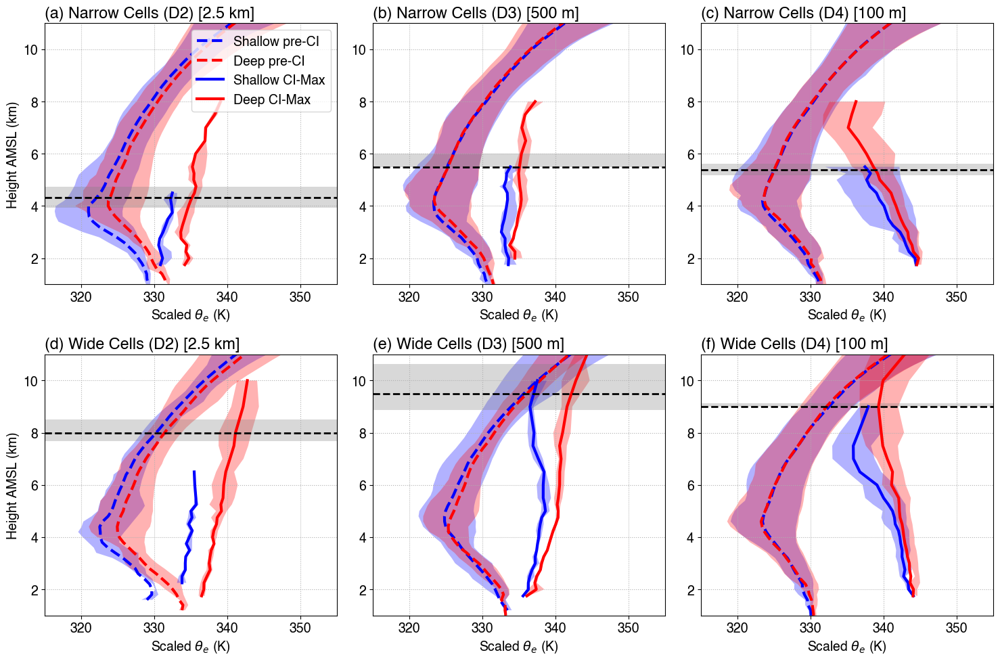

In [ ]:
THRESH = 20
# Profiles
prof1 = [
    [{'d':scaled_ThetaE_narrow_deep_avg_d2.where(nsThetaE_n_d_d2 > THRESH), 's':scaled_ThetaE_narrow_shallow_avg_d2.where(nsThetaE_n_s_d2 > THRESH)},
     {'d':scaled_ThetaE_narrow_deep_avg_d3.where(nsThetaE_n_d_d3 > THRESH), 's':scaled_ThetaE_narrow_shallow_avg_d3.where(nsThetaE_n_s_d3 > THRESH)},
     {'d':scaled_ThetaE_narrow_deep_avg_d4.where(nsThetaE_n_d_d4 > THRESH), 's':scaled_ThetaE_narrow_shallow_avg_d4.where(nsThetaE_n_s_d4 > THRESH)},],
    [{'d':scaled_ThetaE_wide_deep_avg_d2.where(nsThetaE_w_d_d2 > THRESH), 's':scaled_ThetaE_wide_shallow_avg_d2.where(nsThetaE_w_s_d2 > THRESH)},
     {'d':scaled_ThetaE_wide_deep_avg_d3.where(nsThetaE_w_d_d3 > THRESH), 's':scaled_ThetaE_wide_shallow_avg_d3.where(nsThetaE_w_s_d3 > THRESH)},
     {'d':scaled_ThetaE_wide_deep_avg_d4.where(nsThetaE_w_d_d4 > THRESH), 's':scaled_ThetaE_wide_shallow_avg_d4.where(nsThetaE_w_s_d4 > THRESH)},],
]
prof2 = [
    [{'d':scaled_MaxThetaE_narrow_deep_med_d2.where(nsMaxThetaE_n_d_d2 > THRESH), 's':scaled_MaxThetaE_narrow_shallow_med_d2.where(nsMaxThetaE_n_s_d2 > THRESH)},
     {'d':scaled_MaxThetaE_narrow_deep_med_d3.where(nsMaxThetaE_n_d_d3 > THRESH), 's':scaled_MaxThetaE_narrow_shallow_med_d3.where(nsMaxThetaE_n_s_d3 > THRESH)},
     {'d':scaled_MaxThetaE_narrow_deep_med_d4.where(nsMaxThetaE_n_d_d4 > THRESH), 's':scaled_MaxThetaE_narrow_shallow_med_d4.where(nsMaxThetaE_n_s_d4 > THRESH)},
     ],
    [{'d':scaled_MaxThetaE_wide_deep_med_d2.where(nsMaxThetaE_w_d_d2 > THRESH), 's':scaled_MaxThetaE_wide_shallow_med_d2.where(nsMaxThetaE_w_s_d2 > THRESH)},
     {'d':scaled_MaxThetaE_wide_deep_med_d3.where(nsMaxThetaE_w_d_d3 > THRESH), 's':scaled_MaxThetaE_wide_shallow_med_d3.where(nsMaxThetaE_w_s_d3 > THRESH)},
     {'d':scaled_MaxThetaE_wide_deep_med_d4.where(nsMaxThetaE_w_d_d4 > THRESH), 's':scaled_MaxThetaE_wide_shallow_med_d4.where(nsMaxThetaE_w_s_d4 > THRESH)},],
]
nrow = len(prof1)
ncol = len(prof1[0])
# Shading: get IQR for environment
ThE_inqt25_w_d_d2 = scaled_ThetaE_wide_deep_inqt_d2.sel(quantile=0.25).where(nsThetaE_w_d_d2 > THRESH)
ThE_inqt75_w_d_d2 = scaled_ThetaE_wide_deep_inqt_d2.sel(quantile=0.75).where(nsThetaE_w_d_d2 > THRESH)
ThE_inqt25_w_s_d2 = scaled_ThetaE_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsThetaE_w_s_d2 > THRESH)
ThE_inqt75_w_s_d2 = scaled_ThetaE_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsThetaE_w_s_d2 > THRESH)
ThE_inqt25_n_d_d2 = scaled_ThetaE_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsThetaE_n_d_d2 > THRESH)
ThE_inqt75_n_d_d2 = scaled_ThetaE_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsThetaE_n_d_d2 > THRESH)
ThE_inqt25_n_s_d2 = scaled_ThetaE_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsThetaE_n_s_d2 > THRESH)
ThE_inqt75_n_s_d2 = scaled_ThetaE_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsThetaE_n_s_d2 > THRESH)

ThE_inqt25_w_d_d3 = scaled_ThetaE_wide_deep_inqt_d3.sel(quantile=0.25).where(nsThetaE_w_d_d3 > THRESH)
ThE_inqt75_w_d_d3 = scaled_ThetaE_wide_deep_inqt_d3.sel(quantile=0.75).where(nsThetaE_w_d_d3 > THRESH)
ThE_inqt25_w_s_d3 = scaled_ThetaE_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsThetaE_w_s_d3 > THRESH)
ThE_inqt75_w_s_d3 = scaled_ThetaE_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsThetaE_w_s_d3 > THRESH)
ThE_inqt25_n_d_d3 = scaled_ThetaE_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsThetaE_n_d_d3 > THRESH)
ThE_inqt75_n_d_d3 = scaled_ThetaE_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsThetaE_n_d_d3 > THRESH)
ThE_inqt25_n_s_d3 = scaled_ThetaE_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsThetaE_n_s_d3 > THRESH)
ThE_inqt75_n_s_d3 = scaled_ThetaE_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsThetaE_n_s_d3 > THRESH)

ThE_inqt25_w_d_d4 = scaled_ThetaE_wide_deep_inqt_d4.sel(quantile=0.25).where(nsThetaE_w_d_d4 > THRESH)
ThE_inqt75_w_d_d4 = scaled_ThetaE_wide_deep_inqt_d4.sel(quantile=0.75).where(nsThetaE_w_d_d4 > THRESH)
ThE_inqt25_w_s_d4 = scaled_ThetaE_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsThetaE_w_s_d4 > THRESH)
ThE_inqt75_w_s_d4 = scaled_ThetaE_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsThetaE_w_s_d4 > THRESH)
ThE_inqt25_n_d_d4 = scaled_ThetaE_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsThetaE_n_d_d4 > THRESH)
ThE_inqt75_n_d_d4 = scaled_ThetaE_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsThetaE_n_d_d4 > THRESH)
ThE_inqt25_n_s_d4 = scaled_ThetaE_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsThetaE_n_s_d4 > THRESH)
ThE_inqt75_n_s_d4 = scaled_ThetaE_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsThetaE_n_s_d4 > THRESH)

inqt1 = [[{'d':(ThE_inqt25_n_d_d2, ThE_inqt75_n_d_d2), 's':(ThE_inqt25_n_s_d2, ThE_inqt75_n_s_d2)}, 
          {'d':(ThE_inqt25_n_d_d3, ThE_inqt75_n_d_d3), 's':(ThE_inqt25_n_s_d3, ThE_inqt75_n_s_d3)},
          {'d':(ThE_inqt25_n_d_d4, ThE_inqt75_n_d_d4), 's':(ThE_inqt25_n_s_d4, ThE_inqt75_n_s_d4)},],
         [{'d':(ThE_inqt25_w_d_d2, ThE_inqt75_w_d_d2), 's':(ThE_inqt25_w_s_d2, ThE_inqt75_w_s_d2)}, 
          {'d':(ThE_inqt25_w_d_d3, ThE_inqt75_w_d_d3), 's':(ThE_inqt25_w_s_d3, ThE_inqt75_w_s_d3)},
          {'d':(ThE_inqt25_w_d_d4, ThE_inqt75_w_d_d4), 's':(ThE_inqt25_w_s_d4, ThE_inqt75_w_s_d4)},]]

# Shading: get IQR for updraft
MaxThE_inqt25_w_d_d2 = scaled_MaxThetaE_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxThetaE_w_d_d2 > THRESH)
MaxThE_inqt75_w_d_d2 = scaled_MaxThetaE_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxThetaE_w_d_d2 > THRESH)
MaxThE_inqt25_w_s_d2 = scaled_MaxThetaE_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxThetaE_w_s_d2 > THRESH)
MaxThE_inqt75_w_s_d2 = scaled_MaxThetaE_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxThetaE_w_s_d2 > THRESH)
MaxThE_inqt25_n_d_d2 = scaled_MaxThetaE_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxThetaE_n_d_d2 > THRESH)
MaxThE_inqt75_n_d_d2 = scaled_MaxThetaE_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxThetaE_n_d_d2 > THRESH)
MaxThE_inqt25_n_s_d2 = scaled_MaxThetaE_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxThetaE_n_s_d2 > THRESH)
MaxThE_inqt75_n_s_d2 = scaled_MaxThetaE_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxThetaE_n_s_d2 > THRESH)

MaxThE_inqt25_w_d_d3 = scaled_MaxThetaE_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxThetaE_w_d_d3 > THRESH)
MaxThE_inqt75_w_d_d3 = scaled_MaxThetaE_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxThetaE_w_d_d3 > THRESH)
MaxThE_inqt25_w_s_d3 = scaled_MaxThetaE_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxThetaE_w_s_d3 > THRESH)
MaxThE_inqt75_w_s_d3 = scaled_MaxThetaE_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxThetaE_w_s_d3 > THRESH)
MaxThE_inqt25_n_d_d3 = scaled_MaxThetaE_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxThetaE_n_d_d3 > THRESH)
MaxThE_inqt75_n_d_d3 = scaled_MaxThetaE_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxThetaE_n_d_d3 > THRESH)
MaxThE_inqt25_n_s_d3 = scaled_MaxThetaE_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxThetaE_n_s_d3 > THRESH)
MaxThE_inqt75_n_s_d3 = scaled_MaxThetaE_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxThetaE_n_s_d3 > THRESH)

MaxThE_inqt25_w_d_d4 = scaled_MaxThetaE_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxThetaE_w_d_d4 > THRESH)
MaxThE_inqt75_w_d_d4 = scaled_MaxThetaE_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxThetaE_w_d_d4 > THRESH)
MaxThE_inqt25_w_s_d4 = scaled_MaxThetaE_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxThetaE_w_s_d4 > THRESH)
MaxThE_inqt75_w_s_d4 = scaled_MaxThetaE_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxThetaE_w_s_d4 > THRESH)
MaxThE_inqt25_n_d_d4 = scaled_MaxThetaE_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxThetaE_n_d_d4 > THRESH)
MaxThE_inqt75_n_d_d4 = scaled_MaxThetaE_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxThetaE_n_d_d4 > THRESH)
MaxThE_inqt25_n_s_d4 = scaled_MaxThetaE_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxThetaE_n_s_d4 > THRESH)
MaxThE_inqt75_n_s_d4 = scaled_MaxThetaE_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxThetaE_n_s_d4 > THRESH)

inqt2 = [[{'d':(MaxThE_inqt25_n_d_d2, MaxThE_inqt75_n_d_d2), 's':(MaxThE_inqt25_n_s_d2, MaxThE_inqt75_n_s_d2)}, 
          {'d':(MaxThE_inqt25_n_d_d3, MaxThE_inqt75_n_d_d3), 's':(MaxThE_inqt25_n_s_d3, MaxThE_inqt75_n_s_d3)},
          {'d':(MaxThE_inqt25_n_d_d4, MaxThE_inqt75_n_d_d4), 's':(MaxThE_inqt25_n_s_d4, MaxThE_inqt75_n_s_d4)},],
         [{'d':(MaxThE_inqt25_w_d_d2, MaxThE_inqt75_w_d_d2), 's':(MaxThE_inqt25_w_s_d2, MaxThE_inqt75_w_s_d2)}, 
          {'d':(MaxThE_inqt25_w_d_d3, MaxThE_inqt75_w_d_d3), 's':(MaxThE_inqt25_w_s_d3, MaxThE_inqt75_w_s_d3)},
          {'d':(MaxThE_inqt25_w_d_d4, MaxThE_inqt75_w_d_d4), 's':(MaxThE_inqt25_w_s_d4, MaxThE_inqt75_w_s_d4)},]]
# ETH thresholds
z_thresh = [[narrow_maxETH10dbz_thresh_bydate_d2, narrow_maxETH10dbz_thresh_bydate_d3, narrow_maxETH10dbz_thresh_bydate_d4], 
            [wide_maxETH10dbz_thresh_bydate_d2, wide_maxETH10dbz_thresh_bydate_d3, wide_maxETH10dbz_thresh_bydate_d4]]
# Axes & labels
xlabels = [
    [r'Scaled $\theta_e$ (K)']*ncol,
    [r'Scaled $\theta_e$ (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (1,11)
xlims = [
    [(315,355)]*ncol,
    [(315,355)]*ncol,
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}PreCI_CIMax_ScaledProfile_NarrowWide_ThetaE_d2_d3_d4.png'
print(figname)
fig = plot_mxn_2profs_shade(nrow, ncol, prof1, prof2, height/1e3, height_core/1e3, inqt1=inqt1, inqt2=inqt2,
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

## Calculate profile differences by dates, then composite across dates

In [ ]:
quantile = [0.25, 0.5, 0.75]
# Threshold for sample size
THRESH = 20
# Filter DataArray with total sample size profiles (from individual tracks)
diffThetaE_narrow_med_dates_d2 = ThetaE_narrow_deep_med_dates_d2.where(nsThetaE_n_d_d2 > THRESH) - ThetaE_narrow_shallow_med_dates_d2.where(nsThetaE_n_s_d2 > THRESH)
diffMaxThetaE_narrow_med_dates_d2 = MaxThetaE_narrow_deep_med_dates_d2.where(nsMaxThetaE_n_d_d2 > THRESH) - MaxThetaE_narrow_shallow_med_dates_d2.where(nsMaxThetaE_n_s_d2 > THRESH)
diffThetaE_wide_med_dates_d2 = ThetaE_wide_deep_med_dates_d2.where(nsThetaE_w_d_d2 > THRESH) - ThetaE_wide_shallow_med_dates_d2.where(nsThetaE_w_s_d2 > THRESH)
diffMaxThetaE_wide_med_dates_d2 = MaxThetaE_wide_deep_med_dates_d2.where(nsMaxThetaE_w_d_d2 > THRESH) - MaxThetaE_wide_shallow_med_dates_d2.where(nsMaxThetaE_w_s_d2 > THRESH)
# Average across dates
diffThetaE_narrow_avg_d2 = diffThetaE_narrow_med_dates_d2.mean(dim='date')
diffMaxThetaE_narrow_med_d2 = diffMaxThetaE_narrow_med_dates_d2.mean(dim='date')
diffThetaE_wide_avg_d2 = diffThetaE_wide_med_dates_d2.mean(dim='date')
diffMaxThetaE_wide_med_d2 = diffMaxThetaE_wide_med_dates_d2.mean(dim='date')
# Quantiles across dates
diffThetaE_narrow_inqt_d2 = diffThetaE_narrow_med_dates_d2.quantile(quantile, dim='date')
diffMaxThetaE_narrow_inqt_d2 = diffMaxThetaE_narrow_med_dates_d2.quantile(quantile, dim='date')
diffThetaE_wide_inqt_d2 = diffThetaE_wide_med_dates_d2.quantile(quantile, dim='date')
diffMaxThetaE_wide_inqt_d2 = diffMaxThetaE_wide_med_dates_d2.quantile(quantile, dim='date')

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [ ]:
# Filter DataArray with total sample size profiles (from individual tracks)
diffThetaE_narrow_med_dates_d3 = ThetaE_narrow_deep_med_dates_d3.where(nsThetaE_n_d_d3 > THRESH) - ThetaE_narrow_shallow_med_dates_d3.where(nsThetaE_n_s_d3 > THRESH)
diffMaxThetaE_narrow_med_dates_d3 = MaxThetaE_narrow_deep_med_dates_d3.where(nsMaxThetaE_n_d_d3 > THRESH) - MaxThetaE_narrow_shallow_med_dates_d3.where(nsMaxThetaE_n_s_d3 > THRESH)
diffThetaE_wide_med_dates_d3 = ThetaE_wide_deep_med_dates_d3.where(nsThetaE_w_d_d3 > THRESH) - ThetaE_wide_shallow_med_dates_d3.where(nsThetaE_w_s_d3 > THRESH)
diffMaxThetaE_wide_med_dates_d3 = MaxThetaE_wide_deep_med_dates_d3.where(nsMaxThetaE_w_d_d3 > THRESH) - MaxThetaE_wide_shallow_med_dates_d3.where(nsMaxThetaE_w_s_d3 > THRESH)
# Average across dates
diffThetaE_narrow_avg_d3 = diffThetaE_narrow_med_dates_d3.mean(dim='date')
diffMaxThetaE_narrow_med_d3 = diffMaxThetaE_narrow_med_dates_d3.mean(dim='date')
diffThetaE_wide_avg_d3 = diffThetaE_wide_med_dates_d3.mean(dim='date')
diffMaxThetaE_wide_med_d3 = diffMaxThetaE_wide_med_dates_d3.mean(dim='date')
# Quantiles across dates
diffThetaE_narrow_inqt_d3 = diffThetaE_narrow_med_dates_d3.quantile(quantile, dim='date')
diffMaxThetaE_narrow_inqt_d3 = diffMaxThetaE_narrow_med_dates_d3.quantile(quantile, dim='date')
diffThetaE_wide_inqt_d3 = diffThetaE_wide_med_dates_d3.quantile(quantile, dim='date')
diffMaxThetaE_wide_inqt_d3 = diffMaxThetaE_wide_med_dates_d3.quantile(quantile, dim='date')

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [ ]:
# Filter DataArray with total sample size profiles (from individual tracks)
diffThetaE_narrow_med_dates_d4 = ThetaE_narrow_deep_med_dates_d4.where(nsThetaE_n_d_d4 > THRESH) - ThetaE_narrow_shallow_med_dates_d4.where(nsThetaE_n_s_d4 > THRESH)
diffMaxThetaE_narrow_med_dates_d4 = MaxThetaE_narrow_deep_med_dates_d4.where(nsMaxThetaE_n_d_d4 > THRESH) - MaxThetaE_narrow_shallow_med_dates_d4.where(nsMaxThetaE_n_s_d4 > THRESH)
diffThetaE_wide_med_dates_d4 = ThetaE_wide_deep_med_dates_d4.where(nsThetaE_w_d_d4 > THRESH) - ThetaE_wide_shallow_med_dates_d4.where(nsThetaE_w_s_d4 > THRESH)
diffMaxThetaE_wide_med_dates_d4 = MaxThetaE_wide_deep_med_dates_d4.where(nsMaxThetaE_w_d_d4 > THRESH) - MaxThetaE_wide_shallow_med_dates_d4.where(nsMaxThetaE_w_s_d4 > THRESH)
# Average across dates
diffThetaE_narrow_avg_d4 = diffThetaE_narrow_med_dates_d4.mean(dim='date')
diffMaxThetaE_narrow_med_d4 = diffMaxThetaE_narrow_med_dates_d4.mean(dim='date')
diffThetaE_wide_avg_d4 = diffThetaE_wide_med_dates_d4.mean(dim='date')
diffMaxThetaE_wide_med_d4 = diffMaxThetaE_wide_med_dates_d4.mean(dim='date')
# Quantiles across dates
diffThetaE_narrow_inqt_d4 = diffThetaE_narrow_med_dates_d4.quantile(quantile, dim='date')
diffMaxThetaE_narrow_inqt_d4 = diffMaxThetaE_narrow_med_dates_d4.quantile(quantile, dim='date')
diffThetaE_wide_inqt_d4 = diffThetaE_wide_med_dates_d4.quantile(quantile, dim='date')
diffMaxThetaE_wide_inqt_d4 = diffMaxThetaE_wide_med_dates_d4.quantile(quantile, dim='date')

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [ ]:
# quantile = [0.25, 0.5, 0.75]
# # Filter DataArray with sample size <= ns_thresh
# diffThetaE_narrow_med_dates_d2 = ThetaE_narrow_deep_med_dates_d2.where(nsThetaE_narrow_deep_d2 > ns_thresh) - ThetaE_narrow_shallow_med_dates_d2.where(nsThetaE_narrow_shallow_d2 > ns_thresh)
# diffMaxThetaE_narrow_med_dates_d2 = MaxThetaE_narrow_deep_med_dates_d2.where(nsMaxThetaE_narrow_deep_d2 > ns_thresh) - MaxThetaE_narrow_shallow_med_dates_d2.where(nsMaxThetaE_narrow_shallow_d2 > ns_thresh)
# diffThetaE_wide_med_dates_d2 = ThetaE_wide_deep_med_dates_d2.where(nsThetaE_wide_deep_d2 > ns_thresh) - ThetaE_wide_shallow_med_dates_d2.where(nsThetaE_wide_shallow_d2 > ns_thresh)
# diffMaxThetaE_wide_med_dates_d2 = MaxThetaE_wide_deep_med_dates_d2.where(nsMaxThetaE_wide_deep_d2 > ns_thresh) - MaxThetaE_wide_shallow_med_dates_d2.where(nsMaxThetaE_wide_shallow_d2 > ns_thresh)
# # Average across dates
# diffThetaE_narrow_avg_d2 = diffThetaE_narrow_med_dates_d2.mean(dim='date')
# diffMaxThetaE_narrow_med_d2 = diffMaxThetaE_narrow_med_dates_d2.mean(dim='date')
# diffThetaE_wide_avg_d2 = diffThetaE_wide_med_dates_d2.mean(dim='date')
# diffMaxThetaE_wide_med_d2 = diffMaxThetaE_wide_med_dates_d2.mean(dim='date')
# # Quantiles across dates
# diffThetaE_narrow_inqt_d2 = diffThetaE_narrow_med_dates_d2.quantile(quantile, dim='date')
# diffMaxThetaE_narrow_inqt_d2 = diffMaxThetaE_narrow_med_dates_d2.quantile(quantile, dim='date')
# diffThetaE_wide_inqt_d2 = diffThetaE_wide_med_dates_d2.quantile(quantile, dim='date')
# diffMaxThetaE_wide_inqt_d2 = diffMaxThetaE_wide_med_dates_d2.quantile(quantile, dim='date')

## Plot MxN panel profile & shading

In [ ]:
def plot_mxn_profs_shade(nrow, ncol, prof1, prof2, height, height_core, inqt1=None, inqt2=None,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    lcolors = {'up': 'red', 'env': 'blue'}
    lstyles = {'up': '-', 'env': '-'}
    lw = 3
    name_map = {'up':'CI-Max', 'env':'pre-CI'}
    # name_map2 = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof1_data = prof1[row][col]
            prof2_data = prof2[row][col]
            # Profile1
            ax.plot(prof1_data, height, color=lcolors['env'], label=name_map['env'], lw=lw, ls=lstyles['env'])
            # ax.plot(prof1_data['d'], height, color=lcolors['d'], label=name_map1['d'], lw=lw, ls=lstyles['min'])
            # Profile2
            ax.plot(prof2_data, height_core, color=lcolors['up'], label=name_map['up'], lw=lw, ls=lstyles['up'])
            # ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])
            # Shadings
            if inqt1 is not None:
                inqt1_data = inqt1[row][col]
                ax.fill_betweenx(height, inqt1_data[0], inqt1_data[1], facecolor=lcolors['env'], alpha=alpha)
                # ax.fill_betweenx(height, inqt1_data['d'][0], inqt1_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if inqt2 is not None:
                inqt2_data = inqt2[row][col]
                ax.fill_betweenx(height_core, inqt2_data[0], inqt2_data[1], facecolor=lcolors['up'], alpha=alpha)
                # ax.fill_betweenx(height_core, inqt2_data['d'][0], inqt2_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                _z_fill = [_z_thresh.quantile(0.25), _z_thresh.quantile(0.75)]
                _z_med = _z_thresh.median()
                ax.axhspan(_z_fill[0], _z_fill[1], facecolor='gray', alpha=alpha)
                ax.axhline(_z_med, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.axvline(x=0, lw=2, color='k')
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/PreCI_CIMax_Profile_NarrowWide_ThetaEdiff_d2_d3_d4.png


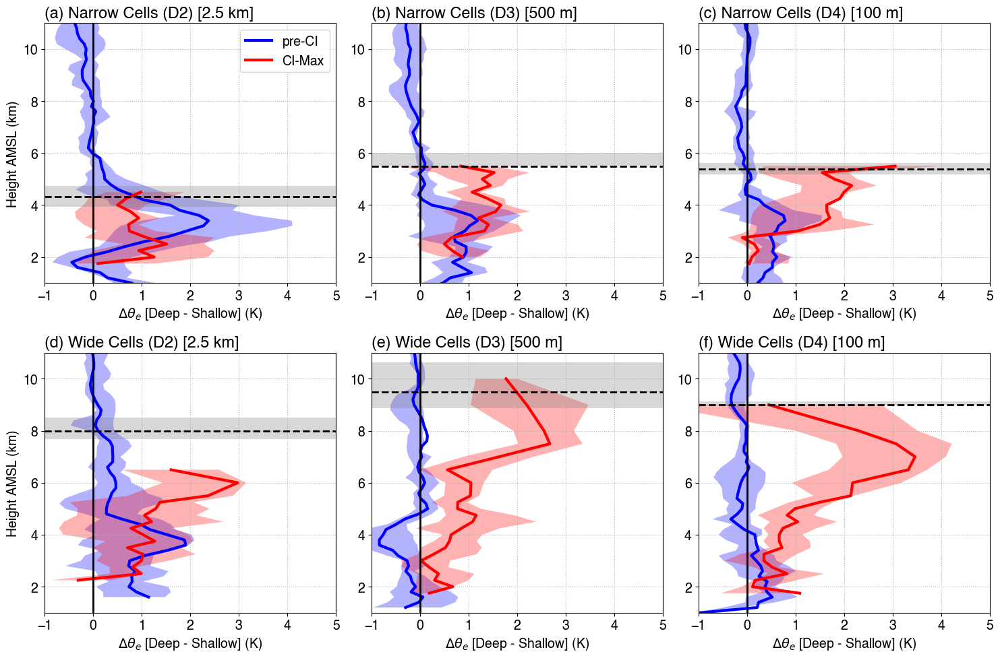

In [ ]:
# Profiles
prof1 = [
    [diffThetaE_narrow_avg_d2, diffThetaE_narrow_avg_d3, diffThetaE_narrow_avg_d4],
    [diffThetaE_wide_avg_d2, diffThetaE_wide_avg_d3, diffThetaE_wide_avg_d4],
]
prof2 = [
    [diffMaxThetaE_narrow_med_d2, diffMaxThetaE_narrow_med_d3, diffMaxThetaE_narrow_med_d4],
    [diffMaxThetaE_wide_med_d2, diffMaxThetaE_wide_med_d3, diffMaxThetaE_wide_med_d4],
]
nrow = len(prof1)
ncol = len(prof1[0])
# Shading: get IQR for environment
ThE_inqt25_n_d2 = diffThetaE_narrow_inqt_d2.sel(quantile=0.25)
ThE_inqt75_n_d2 = diffThetaE_narrow_inqt_d2.sel(quantile=0.75)
ThE_inqt25_n_d3 = diffThetaE_narrow_inqt_d3.sel(quantile=0.25)
ThE_inqt75_n_d3 = diffThetaE_narrow_inqt_d3.sel(quantile=0.75)
ThE_inqt25_n_d4 = diffThetaE_narrow_inqt_d4.sel(quantile=0.25)
ThE_inqt75_n_d4 = diffThetaE_narrow_inqt_d4.sel(quantile=0.75)

ThE_inqt25_w_d2 = diffThetaE_wide_inqt_d2.sel(quantile=0.25)
ThE_inqt75_w_d2 = diffThetaE_wide_inqt_d2.sel(quantile=0.75)
ThE_inqt25_w_d3 = diffThetaE_wide_inqt_d3.sel(quantile=0.25)
ThE_inqt75_w_d3 = diffThetaE_wide_inqt_d3.sel(quantile=0.75)
ThE_inqt25_w_d4 = diffThetaE_wide_inqt_d4.sel(quantile=0.25)
ThE_inqt75_w_d4 = diffThetaE_wide_inqt_d4.sel(quantile=0.75)

inqt1 = [
    [(ThE_inqt25_n_d2, ThE_inqt75_n_d2), (ThE_inqt25_n_d3, ThE_inqt75_n_d3), (ThE_inqt25_n_d4, ThE_inqt75_n_d4)],
    [(ThE_inqt25_w_d2, ThE_inqt75_w_d2), (ThE_inqt25_w_d3, ThE_inqt75_w_d3), (ThE_inqt25_w_d4, ThE_inqt75_w_d4)],
]

MaxThE_inqt25_n_d2 = diffMaxThetaE_narrow_inqt_d2.sel(quantile=0.25)
MaxThE_inqt75_n_d2 = diffMaxThetaE_narrow_inqt_d2.sel(quantile=0.75)
MaxThE_inqt25_n_d3 = diffMaxThetaE_narrow_inqt_d3.sel(quantile=0.25)
MaxThE_inqt75_n_d3 = diffMaxThetaE_narrow_inqt_d3.sel(quantile=0.75)
MaxThE_inqt25_n_d4 = diffMaxThetaE_narrow_inqt_d4.sel(quantile=0.25)
MaxThE_inqt75_n_d4 = diffMaxThetaE_narrow_inqt_d4.sel(quantile=0.75)

MaxThE_inqt25_w_d2 = diffMaxThetaE_wide_inqt_d2.sel(quantile=0.25)
MaxThE_inqt75_w_d2 = diffMaxThetaE_wide_inqt_d2.sel(quantile=0.75)
MaxThE_inqt25_w_d3 = diffMaxThetaE_wide_inqt_d3.sel(quantile=0.25)
MaxThE_inqt75_w_d3 = diffMaxThetaE_wide_inqt_d3.sel(quantile=0.75)
MaxThE_inqt25_w_d4 = diffMaxThetaE_wide_inqt_d4.sel(quantile=0.25)
MaxThE_inqt75_w_d4 = diffMaxThetaE_wide_inqt_d4.sel(quantile=0.75)

inqt2 = [
    [(MaxThE_inqt25_n_d2, MaxThE_inqt75_n_d2), (MaxThE_inqt25_n_d3, MaxThE_inqt75_n_d3), (MaxThE_inqt25_n_d4, MaxThE_inqt75_n_d4)],
    [(MaxThE_inqt25_w_d2, MaxThE_inqt75_w_d2), (MaxThE_inqt25_w_d3, MaxThE_inqt75_w_d3), (MaxThE_inqt25_w_d4, MaxThE_inqt75_w_d4)],
]

# ETH thresholds
z_thresh = [[narrow_maxETH10dbz_thresh_bydate_d2, narrow_maxETH10dbz_thresh_bydate_d3, narrow_maxETH10dbz_thresh_bydate_d4], 
            [wide_maxETH10dbz_thresh_bydate_d2, wide_maxETH10dbz_thresh_bydate_d3, wide_maxETH10dbz_thresh_bydate_d4]]
# Axes & labels
xlabels = [
    [r'$\Delta\theta_e$ [Deep - Shallow] (K)']*ncol,
    [r'$\Delta\theta_e$ [Deep - Shallow] (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
ylims = (1,11)
xlims = [
    [(-1,5)]*ncol,
    [(-1,5)]*ncol,
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}PreCI_CIMax_Profile_NarrowWide_ThetaEdiff_d2_d3_d4.png'
print(figname)
fig = plot_mxn_profs_shade(nrow, ncol, prof1, prof2, height/1e3, height_core/1e3, inqt1=inqt1, inqt2=inqt2,
                     z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

## Functions to calculate ThetaE

In [ ]:
def theta_e_bolton(TEMPERATURE, QVAPOR, PRESSURE):
    # theta-e following Bolton (1980); error of < 0.3 K between -35 and 35C; from Thompson scheme
    # more accurate formula from Emanuel could be implemented; ice effects also excluded
    es = PRESSURE*QVAPOR/(0.622*QVAPOR)
    TDEW = (35.86*np.log(es) - 4947.2325)/(np.log(es) - 23.6837)
    TLCL = 1/(1/(TDEW - 56) + np.log(TEMPERATURE/TDEW)/800) + 56
    p1 = 3.376/TLCL - 0.00254
    p2 = 1e3*QVAPOR*(1 + 0.81*QVAPOR)
    THETAE_Bolton = (TEMPERATURE*(100000./PRESSURE)**(0.2854*(1 - 0.28*QVAPOR)))*np.exp(p1*p2) #K
    return THETAE_Bolton

In [ ]:
def calc_thetas(ds, preCI_nt):
    # Get T, P, Qv profiles pre-CI
    temp = ds.temperature.sel(times=slice(preCI_nt,0))
    pres = ds.pressure.sel(times=slice(preCI_nt,0))
    qv = ds.qv.sel(times=slice(preCI_nt,0))
    # Compute Theta
    Theta = temp * (1e5 / pres)**0.286
    # Compute ThetaE
    ThetaE = theta_e_bolton(temp, qv, pres)
    return (Theta, ThetaE)

In [ ]:
# # Get domain min Theta, ThetaE
# Theta_narrow_deep_d2 = ds_narrow_deep_d2.theta_min.sel(times=slice(preCI_nt,0))
# ThetaE_narrow_deep_d2 = ds_narrow_deep_d2.thetaE_min.sel(times=slice(preCI_nt,0))
# Theta_narrow_shallow_d2 = ds_narrow_shallow_d2.theta_min.sel(times=slice(preCI_nt,0))
# ThetaE_narrow_shallow_d2 = ds_narrow_shallow_d2.thetaE_min.sel(times=slice(preCI_nt,0))

In [ ]:
# # Calculate Theta & ThetaE
# Theta_wide_deep_d2, ThetaE_wide_deep_d2 = calc_thetas(ds_wide_deep_d2, preCI_nt)
# Theta_wide_shallow_d2, ThetaE_wide_shallow_d2 = calc_thetas(ds_wide_shallow_d2, preCI_nt)
# Get domain min Theta, ThetaE
Theta_wide_deep_d2 = ds_wide_deep_d2.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_wide_deep_d2 = ds_wide_deep_d2.thetaE_min.sel(times=slice(preCI_nt,0))
Theta_wide_shallow_d2 = ds_wide_shallow_d2.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_wide_shallow_d2 = ds_wide_shallow_d2.thetaE_min.sel(times=slice(preCI_nt,0))
# Number of samples in the tracks composite
ns_wide_deep_d2 = (ds_wide_deep_d2.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')
ns_wide_shallow_d2 = (ds_wide_shallow_d2.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')

# # Calculate Theta & ThetaE
# Theta_narrow_deep_d2, ThetaE_narrow_deep_d2 = calc_thetas(ds_narrow_deep_d2, preCI_nt)
# Theta_narrow_shallow_d2, ThetaE_narrow_shallow_d2 = calc_thetas(ds_narrow_shallow_d2, preCI_nt)
# Get domain min Theta, ThetaE
Theta_narrow_deep_d2 = ds_narrow_deep_d2.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_narrow_deep_d2 = ds_narrow_deep_d2.thetaE_min.sel(times=slice(preCI_nt,0))
Theta_narrow_shallow_d2 = ds_narrow_shallow_d2.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_narrow_shallow_d2 = ds_narrow_shallow_d2.thetaE_min.sel(times=slice(preCI_nt,0))
# Number of samples in the tracks composite
ns_narrow_deep_d2 = (ds_narrow_deep_d2.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')
ns_narrow_shallow_d2 = (ds_narrow_shallow_d2.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')

In [ ]:
# # Calculate Theta & ThetaE
# Theta_wide_deep_d3, ThetaE_wide_deep_d3 = calc_thetas(ds_wide_deep_d3, preCI_nt)
# Theta_wide_shallow_d3, ThetaE_wide_shallow_d3 = calc_thetas(ds_wide_shallow_d3, preCI_nt)
# Get domain min Theta, ThetaE
Theta_wide_deep_d3 = ds_wide_deep_d3.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_wide_deep_d3 = ds_wide_deep_d3.thetaE_min.sel(times=slice(preCI_nt,0))
Theta_wide_shallow_d3 = ds_wide_shallow_d3.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_wide_shallow_d3 = ds_wide_shallow_d3.thetaE_min.sel(times=slice(preCI_nt,0))
# Number of samples in the tracks composite
ns_wide_deep_d3 = (ds_wide_deep_d3.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')
ns_wide_shallow_d3 = (ds_wide_shallow_d3.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')

# # Calculate Theta & ThetaE
# Theta_narrow_deep_d3, ThetaE_narrow_deep_d3 = calc_thetas(ds_narrow_deep_d3, preCI_nt)
# Theta_narrow_shallow_d3, ThetaE_narrow_shallow_d3 = calc_thetas(ds_narrow_shallow_d3, preCI_nt)
# Get domain min Theta, ThetaE
Theta_narrow_deep_d3 = ds_narrow_deep_d3.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_narrow_deep_d3 = ds_narrow_deep_d3.thetaE_min.sel(times=slice(preCI_nt,0))
Theta_narrow_shallow_d3 = ds_narrow_shallow_d3.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_narrow_shallow_d3 = ds_narrow_shallow_d3.thetaE_min.sel(times=slice(preCI_nt,0))
# Number of samples in the tracks composite
ns_narrow_deep_d3 = (ds_narrow_deep_d3.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')
ns_narrow_shallow_d3 = (ds_narrow_shallow_d3.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')

In [ ]:
# # Calculate Theta & ThetaE
# Theta_wide_deep_d4, ThetaE_wide_deep_d4 = calc_thetas(ds_wide_deep_d4, preCI_nt)
# Theta_wide_shallow_d4, ThetaE_wide_shallow_d4 = calc_thetas(ds_wide_shallow_d4, preCI_nt)
# Get domain min Theta, ThetaE
Theta_wide_deep_d4 = ds_wide_deep_d4.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_wide_deep_d4 = ds_wide_deep_d4.thetaE_min.sel(times=slice(preCI_nt,0))
Theta_wide_shallow_d4 = ds_wide_shallow_d4.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_wide_shallow_d4 = ds_wide_shallow_d4.thetaE_min.sel(times=slice(preCI_nt,0))
# Number of samples in the tracks composite
ns_wide_deep_d4 = (ds_wide_deep_d4.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')
ns_wide_shallow_d4 = (ds_wide_shallow_d4.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')

# # Calculate Theta & ThetaE
# Theta_narrow_deep_d4, ThetaE_narrow_deep_d4 = calc_thetas(ds_narrow_deep_d4, preCI_nt)
# Theta_narrow_shallow_d4, ThetaE_narrow_shallow_d4 = calc_thetas(ds_narrow_shallow_d4, preCI_nt)
# Get domain min Theta, ThetaE
Theta_narrow_deep_d4 = ds_narrow_deep_d4.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_narrow_deep_d4 = ds_narrow_deep_d4.thetaE_min.sel(times=slice(preCI_nt,0))
Theta_narrow_shallow_d4 = ds_narrow_shallow_d4.theta_min.sel(times=slice(preCI_nt,0))
ThetaE_narrow_shallow_d4 = ds_narrow_shallow_d4.thetaE_min.sel(times=slice(preCI_nt,0))
# Number of samples in the tracks composite
ns_narrow_deep_d4 = (ds_narrow_deep_d4.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')
ns_narrow_shallow_d4 = (ds_narrow_shallow_d4.temperature.sel(times=slice(preCI_nt,0)) > 0).sum(dim='tracks')

In [ ]:
# height

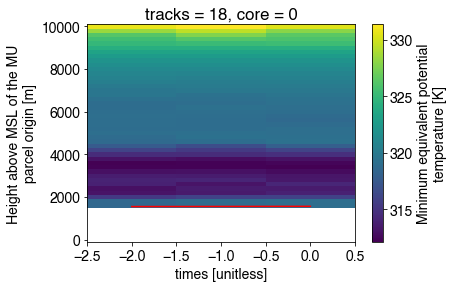

In [ ]:
itrack = 1
ThetaE_wide_deep_d3.isel(tracks=itrack).where(height >= ds_wide_deep_d3.mu_parcel_ht_msl.isel(tracks=itrack)).transpose().sel(height=slice(0,10000)).plot()
ds_wide_deep_d3.mu_parcel_ht_msl.isel(tracks=itrack).plot(color='r')

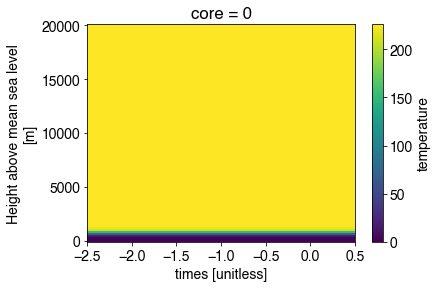

In [ ]:
ns_narrow_shallow_d2.transpose().plot()

## Get domain min Qv & RH (most hostile moisture environments)

In [ ]:
qv_wide_deep_d2 = ds_wide_deep_d2.qv_min.sel(times=slice(preCI_nt,0))
qv_wide_shallow_d2 = ds_wide_shallow_d2.qv_min.sel(times=slice(preCI_nt,0))

RHmin_wide_deep_d2 = ds_wide_deep_d2.rh_min.sel(times=slice(preCI_nt,0))
RHmin_wide_shallow_d2 = ds_wide_shallow_d2.rh_min.sel(times=slice(preCI_nt,0))

RHavg_wide_deep_d2 = ds_wide_deep_d2.rh.sel(times=slice(preCI_nt,0))
RHavg_wide_shallow_d2 = ds_wide_shallow_d2.rh.sel(times=slice(preCI_nt,0))

qv_narrow_deep_d2 = ds_narrow_deep_d2.qv_min.sel(times=slice(preCI_nt,0))
qv_narrow_shallow_d2 = ds_narrow_shallow_d2.qv_min.sel(times=slice(preCI_nt,0))

RHmin_narrow_deep_d2 = ds_narrow_deep_d2.rh_min.sel(times=slice(preCI_nt,0))
RHmin_narrow_shallow_d2 = ds_narrow_shallow_d2.rh_min.sel(times=slice(preCI_nt,0))

RHavg_narrow_deep_d2 = ds_narrow_deep_d2.rh.sel(times=slice(preCI_nt,0))
RHavg_narrow_shallow_d2 = ds_narrow_shallow_d2.rh.sel(times=slice(preCI_nt,0))

In [ ]:
qv_wide_deep_d3 = ds_wide_deep_d3.qv_min.sel(times=slice(preCI_nt,0))
qv_wide_shallow_d3 = ds_wide_shallow_d3.qv_min.sel(times=slice(preCI_nt,0))

RHmin_wide_deep_d3 = ds_wide_deep_d3.rh_min.sel(times=slice(preCI_nt,0))
RHmin_wide_shallow_d3 = ds_wide_shallow_d3.rh_min.sel(times=slice(preCI_nt,0))

RHavg_wide_deep_d3 = ds_wide_deep_d3.rh.sel(times=slice(preCI_nt,0))
RHavg_wide_shallow_d3 = ds_wide_shallow_d3.rh.sel(times=slice(preCI_nt,0))

qv_narrow_deep_d3 = ds_narrow_deep_d3.qv_min.sel(times=slice(preCI_nt,0))
qv_narrow_shallow_d3 = ds_narrow_shallow_d3.qv_min.sel(times=slice(preCI_nt,0))

RHmin_narrow_deep_d3 = ds_narrow_deep_d3.rh_min.sel(times=slice(preCI_nt,0))
RHmin_narrow_shallow_d3 = ds_narrow_shallow_d3.rh_min.sel(times=slice(preCI_nt,0))

RHavg_narrow_deep_d3 = ds_narrow_deep_d3.rh.sel(times=slice(preCI_nt,0))
RHavg_narrow_shallow_d3 = ds_narrow_shallow_d3.rh.sel(times=slice(preCI_nt,0))

In [ ]:
qv_wide_deep_d4 = ds_wide_deep_d4.qv_min.sel(times=slice(preCI_nt,0))
qv_wide_shallow_d4 = ds_wide_shallow_d4.qv_min.sel(times=slice(preCI_nt,0))

RHmin_wide_deep_d4 = ds_wide_deep_d4.rh_min.sel(times=slice(preCI_nt,0))
RHmin_wide_shallow_d4 = ds_wide_shallow_d4.rh_min.sel(times=slice(preCI_nt,0))

RHavg_wide_deep_d4 = ds_wide_deep_d4.rh.sel(times=slice(preCI_nt,0))
RHavg_wide_shallow_d4 = ds_wide_shallow_d4.rh.sel(times=slice(preCI_nt,0))

qv_narrow_deep_d4 = ds_narrow_deep_d4.qv_min.sel(times=slice(preCI_nt,0))
qv_narrow_shallow_d4 = ds_narrow_shallow_d4.qv_min.sel(times=slice(preCI_nt,0))

RHmin_narrow_deep_d4 = ds_narrow_deep_d4.rh_min.sel(times=slice(preCI_nt,0))
RHmin_narrow_shallow_d4 = ds_narrow_shallow_d4.rh_min.sel(times=slice(preCI_nt,0))

RHavg_narrow_deep_d4 = ds_narrow_deep_d4.rh.sel(times=slice(preCI_nt,0))
RHavg_narrow_shallow_d4 = ds_narrow_shallow_d4.rh.sel(times=slice(preCI_nt,0))

## Domain mean Qv & RH

In [ ]:
# qv_wide_deep_d2 = ds_wide_deep_d2.qv.sel(times=slice(preCI_nt,0))
# qv_wide_shallow_d2 = ds_wide_shallow_d2.qv.sel(times=slice(preCI_nt,0))

# rh_wide_deep_d2 = ds_wide_deep_d2.rh.sel(times=slice(preCI_nt,0))
# rh_wide_shallow_d2 = ds_wide_shallow_d2.rh.sel(times=slice(preCI_nt,0))

# qv_narrow_deep_d2 = ds_narrow_deep_d2.qv.sel(times=slice(preCI_nt,0))
# qv_narrow_shallow_d2 = ds_narrow_shallow_d2.qv.sel(times=slice(preCI_nt,0))

# rh_narrow_deep_d2 = ds_narrow_deep_d2.rh.sel(times=slice(preCI_nt,0))
# rh_narrow_shallow_d2 = ds_narrow_shallow_d2.rh.sel(times=slice(preCI_nt,0))

In [ ]:
# qv_wide_deep_d3 = ds_wide_deep_d3.qv.sel(times=slice(preCI_nt,0))
# qv_wide_shallow_d3 = ds_wide_shallow_d3.qv.sel(times=slice(preCI_nt,0))

# rh_wide_deep_d3 = ds_wide_deep_d3.rh.sel(times=slice(preCI_nt,0))
# rh_wide_shallow_d3 = ds_wide_shallow_d3.rh.sel(times=slice(preCI_nt,0))

# qv_narrow_deep_d3 = ds_narrow_deep_d3.qv.sel(times=slice(preCI_nt,0))
# qv_narrow_shallow_d3 = ds_narrow_shallow_d3.qv.sel(times=slice(preCI_nt,0))

# rh_narrow_deep_d3 = ds_narrow_deep_d3.rh.sel(times=slice(preCI_nt,0))
# rh_narrow_shallow_d3 = ds_narrow_shallow_d3.rh.sel(times=slice(preCI_nt,0))

In [ ]:
# qv_wide_deep_d4 = ds_wide_deep_d4.qv.sel(times=slice(preCI_nt,0))
# qv_wide_shallow_d4 = ds_wide_shallow_d4.qv.sel(times=slice(preCI_nt,0))

# rh_wide_deep_d4 = ds_wide_deep_d4.rh.sel(times=slice(preCI_nt,0))
# rh_wide_shallow_d4 = ds_wide_shallow_d4.rh.sel(times=slice(preCI_nt,0))

# qv_narrow_deep_d4 = ds_narrow_deep_d4.qv.sel(times=slice(preCI_nt,0))
# qv_narrow_shallow_d4 = ds_narrow_shallow_d4.qv.sel(times=slice(preCI_nt,0))

# rh_narrow_deep_d4 = ds_narrow_deep_d4.rh.sel(times=slice(preCI_nt,0))
# rh_narrow_shallow_d4 = ds_narrow_shallow_d4.rh.sel(times=slice(preCI_nt,0))

In [ ]:
# ThetaE_wide_deep_d2.isel(tracks=itrack).where(height >= ds_wide_deep_d2.mu_parcel_ht_msl.isel(tracks=itrack))
ThetaE_wide_deep_d2.shape, ds_wide_deep_d2.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0)).shape

((38, 3, 101), (38, 3))

## Calculate composite preCI environmental profiles

### D2 wide cells preCI environment

In [ ]:
tidx_start, tidx_end

(2, 14)

In [ ]:
preCI_nt, time_env

(-2, -1)

In [ ]:
prof_quantiles = [0.25, 0.5, 0.75]

# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')
    
    # Get MU parcel height prior to CI
    mu_parcel_ht_wide_deep_d2 = ds_wide_deep_d2.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
    mu_parcel_ht_wide_shallow_d2 = ds_wide_shallow_d2.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))

    # Filter heights below MU parcel height, select a preCI time, then calculate median over the tracks
    ThetaE_wide_deep_med_d2 = ThetaE_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    ThetaE_wide_shallow_med_d2 = ThetaE_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).median(dim='tracks').compute()

    Theta_wide_deep_med_d2 = Theta_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    Theta_wide_shallow_med_d2 = Theta_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).median(dim='tracks').compute()

    qv_wide_deep_med_d2 = qv_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    qv_wide_shallow_med_d2 = qv_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).median(dim='tracks').compute()

    RHmin_wide_deep_med_d2 = RHmin_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    RHmin_wide_shallow_med_d2 = RHmin_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).median(dim='tracks').compute()
    
    RHavg_wide_deep_med_d2 = RHavg_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    RHavg_wide_shallow_med_d2 = RHavg_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).median(dim='tracks').compute()
    
    # Mean
    ThetaE_wide_deep_avg_d2 = ThetaE_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    ThetaE_wide_shallow_avg_d2 = ThetaE_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()

    Theta_wide_deep_avg_d2 = Theta_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    Theta_wide_shallow_avg_d2 = Theta_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()

    qv_wide_deep_avg_d2 = qv_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    qv_wide_shallow_avg_d2 = qv_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()

    RHmin_wide_deep_avg_d2 = RHmin_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    RHmin_wide_shallow_avg_d2 = RHmin_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()
    
    RHavg_wide_deep_avg_d2 = RHavg_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    RHavg_wide_shallow_avg_d2 = RHavg_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()
    
    # Get profile number of samples 
    ns_wide_deep_prof_d2 = (Theta_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env) > 0).sum(dim='tracks').compute()
    ns_wide_shallow_prof_d2 = (Theta_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    ThetaE_wide_deep_inqt_d2 = ThetaE_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    ThetaE_wide_shallow_inqt_d2 = ThetaE_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    Theta_wide_deep_inqt_d2 = Theta_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    Theta_wide_shallow_inqt_d2 = Theta_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    qv_wide_deep_inqt_d2 = qv_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    qv_wide_shallow_inqt_d2 = qv_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHmin_wide_deep_inqt_d2 = RHmin_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHmin_wide_shallow_inqt_d2 = RHmin_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHavg_wide_deep_inqt_d2 = RHavg_wide_deep_d2.where(height >= mu_parcel_ht_wide_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHavg_wide_shallow_inqt_d2 = RHavg_wide_shallow_d2.where(height >= mu_parcel_ht_wide_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D2 wide cells CI in-cloud properties

In [ ]:
# Height coordinate for updraft variables
height_core = ds_d2.z

# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')

    # Get lowest MU parcel height preCI period
    min_mu_parcel_ht_wide_deep_d2 = mu_parcel_ht_wide_deep_d2.min(dim='times')
    min_mu_parcel_ht_wide_shallow_d2 = mu_parcel_ht_wide_shallow_d2.min(dim='times')
    
    # Undiluted max ThetaE in updraft cores during CI-period: filter heights below MU parcel height
    # CoreThetaEMax_wide_deep_d2 = ds_wide_deep_d2.CoreThteMax_up.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    # CoreThetaEMax_wide_shallow_d2 = ds_wide_shallow_d2.CoreThteMax_up.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    CoreThetaEMax_wide_deep_d2 = ds_wide_deep_d2.CoreThteMax_Bolton_up.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreThetaEMax_wide_shallow_d2 = ds_wide_shallow_d2.CoreThteMax_Bolton_up.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    # Updraft properties during CI-period: filter heights below MU parcel height
    CoreArea_wide_deep_d2 = ds_wide_deep_d2.CoreArea_up.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreArea_wide_shallow_d2 = ds_wide_shallow_d2.CoreArea_up.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    CoreMeanW_wide_deep_d2 = ds_wide_deep_d2.CoreMeanW_up.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreMeanW_wide_shallow_d2 = ds_wide_shallow_d2.CoreMeanW_up.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    CoreBuoyThtv_wide_deep_d2 = ds_wide_deep_d2.CoreBuoyThtv_up.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreBuoyThtv_wide_shallow_d2 = ds_wide_shallow_d2.CoreBuoyThtv_up.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    MassFlux_wide_deep_d2 = ds_wide_deep_d2.MassFlux_up.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    MassFlux_wide_shallow_d2 = ds_wide_shallow_d2.MassFlux_up.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    # Updraft core perimeter variables
    CoreRHprm_wide_deep_d2 = ds_wide_deep_d2.CoreRhMean_prm.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreRHprm_wide_shallow_d2 = ds_wide_shallow_d2.CoreRhMean_prm.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    CoreThtvprm_wide_deep_d2 = ds_wide_deep_d2.CoreThtvMean_prm.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreThtvprm_wide_shallow_d2 = ds_wide_shallow_d2.CoreThtvMean_prm.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    CoreThteprm_wide_deep_d2 = ds_wide_deep_d2.CoreThteMean_prm.where(ds_wide_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d2)
    CoreThteprm_wide_shallow_d2 = ds_wide_shallow_d2.CoreThteMean_prm.where(ds_wide_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d2)
    
    # Take max over times, average over tracks
    MaxThetaE_wide_deep_med_d2 = CoreThetaEMax_wide_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxThetaE_wide_shallow_avg_d2 = CoreThetaEMax_wide_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreDiam_wide_deep_avg_d2 = 2 * np.sqrt(CoreArea_wide_deep_d2.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_shallow_avg_d2 = 2 * np.sqrt(CoreArea_wide_shallow_d2.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreMeanW_wide_deep_avg_d2 = CoreMeanW_wide_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreMeanW_wide_shallow_avg_d2 = CoreMeanW_wide_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_wide_deep_avg_d2 = CoreBuoyThtv_wide_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_wide_shallow_avg_d2 = CoreBuoyThtv_wide_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_wide_deep_avg_d2 = MassFlux_wide_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_wide_shallow_avg_d2 = MassFlux_wide_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    # Take mean over times, average over tracks
    AvgCoreRHprm_wide_deep_avg_d2 = CoreRHprm_wide_deep_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreRHprm_wide_shallow_avg_d2 = CoreRHprm_wide_shallow_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_wide_deep_avg_d2 = CoreThtvprm_wide_deep_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_wide_shallow_avg_d2 = CoreThtvprm_wide_shallow_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_wide_deep_avg_d2 = CoreThteprm_wide_deep_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_wide_shallow_avg_d2 = CoreThteprm_wide_shallow_d2.mean(dim='times').mean(dim='tracks').compute()
    # Take CI time, average over tracks
    CICoreDiam_wide_deep_avg_d2 = 2 * np.sqrt(CoreArea_wide_deep_d2.sel(times=0).mean(dim='tracks').compute() / np.pi)
    CICoreDiam_wide_shallow_avg_d2 = 2 * np.sqrt(CoreArea_wide_shallow_d2.sel(times=0).mean(dim='tracks').compute() / np.pi)

    # Number of samples
    nsMaxThetaE_wide_deep_prof_d2 = (CoreThetaEMax_wide_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxThetaE_wide_shallow_prof_d2 = (CoreThetaEMax_wide_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_wide_deep_prof_d2 = (CoreArea_wide_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_wide_shallow_prof_d2 = (CoreArea_wide_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_wide_deep_prof_d2 = (MassFlux_wide_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_wide_shallow_prof_d2 = (MassFlux_wide_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_wide_deep_prof_d2 = (CoreBuoyThtv_wide_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_wide_shallow_prof_d2 = (CoreBuoyThtv_wide_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_wide_deep_prof_d2 = (CoreRHprm_wide_deep_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_wide_shallow_prof_d2 = (CoreRHprm_wide_shallow_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_wide_deep_prof_d2 = (CoreThtvprm_wide_deep_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_wide_shallow_prof_d2 = (CoreThtvprm_wide_shallow_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_wide_deep_prof_d2 = (CoreThteprm_wide_deep_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_wide_shallow_prof_d2 = (CoreThteprm_wide_shallow_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsCICoreDiam_wide_deep_prof_d2 = (CoreArea_wide_deep_d2.sel(times=0) > 0).sum(dim='tracks').compute()
    nsCICoreDiam_wide_shallow_prof_d2 = (CoreArea_wide_shallow_d2.sel(times=0) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    CICoreDiam_wide_deep_inqt_d2 = 2 * np.sqrt(CoreArea_wide_deep_d2.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    CICoreDiam_wide_shallow_inqt_d2 = 2 * np.sqrt(CoreArea_wide_shallow_d2.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_deep_inqt_d2 = 2 * np.sqrt(CoreArea_wide_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_shallow_inqt_d2 = 2 * np.sqrt(CoreArea_wide_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreMeanW_wide_deep_inqt_d2 = CoreMeanW_wide_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreMeanW_wide_shallow_inqt_d2 = CoreMeanW_wide_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_wide_deep_inqt_d2 = CoreBuoyThtv_wide_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_wide_shallow_inqt_d2 = CoreBuoyThtv_wide_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_wide_deep_inqt_d2 = MassFlux_wide_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_wide_shallow_inqt_d2 = MassFlux_wide_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    # Updraft core perimeter variables
    AvgCoreRHprm_wide_deep_inqt_d2 = CoreRHprm_wide_deep_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreRHprm_wide_shallow_inqt_d2 = CoreRHprm_wide_shallow_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_wide_deep_inqt_d2 = CoreThtvprm_wide_deep_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_wide_shallow_inqt_d2 = CoreThtvprm_wide_shallow_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_wide_deep_inqt_d2 = CoreThteprm_wide_deep_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_wide_shallow_inqt_d2 = CoreThteprm_wide_shallow_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D2 narrow cells preCI environments

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')
    
    # Get MU parcel height prior to CI
    mu_parcel_ht_narrow_deep_d2 = ds_narrow_deep_d2.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
    mu_parcel_ht_narrow_shallow_d2 = ds_narrow_shallow_d2.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))

    # Filter heights below MU parcel height, select a preCI time, then calculate median over the tracks
    ThetaE_narrow_deep_med_d2 = ThetaE_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    ThetaE_narrow_shallow_med_d2 = ThetaE_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).median(dim='tracks').compute()

    Theta_narrow_deep_med_d2 = Theta_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    Theta_narrow_shallow_med_d2 = Theta_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).median(dim='tracks').compute()

    qv_narrow_deep_med_d2 = qv_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    qv_narrow_shallow_med_d2 = qv_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).median(dim='tracks').compute()

    RHmin_narrow_deep_med_d2 = RHmin_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    RHmin_narrow_shallow_med_d2 = RHmin_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).median(dim='tracks').compute()
    
    RHavg_narrow_deep_med_d2 = RHavg_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).median(dim='tracks').compute()
    RHavg_narrow_shallow_med_d2 = RHavg_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).median(dim='tracks').compute()
    
    # Mean
    ThetaE_narrow_deep_avg_d2 = ThetaE_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    ThetaE_narrow_shallow_avg_d2 = ThetaE_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()

    Theta_narrow_deep_avg_d2 = Theta_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    Theta_narrow_shallow_avg_d2 = Theta_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()

    qv_narrow_deep_avg_d2 = qv_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    qv_narrow_shallow_avg_d2 = qv_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()

    RHmin_narrow_deep_avg_d2 = RHmin_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    RHmin_narrow_shallow_avg_d2 = RHmin_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()
    
    RHavg_narrow_deep_avg_d2 = RHavg_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).mean(dim='tracks').compute()
    RHavg_narrow_shallow_avg_d2 = RHavg_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).mean(dim='tracks').compute()
    
    # Get profile number of samples 
    ns_narrow_deep_prof_d2 = (Theta_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env) > 0).sum(dim='tracks').compute()
    ns_narrow_shallow_prof_d2 = (Theta_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    ThetaE_narrow_deep_inqt_d2 = ThetaE_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    ThetaE_narrow_shallow_inqt_d2 = ThetaE_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    Theta_narrow_deep_inqt_d2 = Theta_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    Theta_narrow_shallow_inqt_d2 = Theta_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    qv_narrow_deep_inqt_d2 = qv_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    qv_narrow_shallow_inqt_d2 = qv_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHmin_narrow_deep_inqt_d2 = RHmin_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHmin_narrow_shallow_inqt_d2 = RHmin_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHavg_narrow_deep_inqt_d2 = RHavg_narrow_deep_d2.where(height >= mu_parcel_ht_narrow_deep_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHavg_narrow_shallow_inqt_d2 = RHavg_narrow_shallow_d2.where(height >= mu_parcel_ht_narrow_shallow_d2).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D2 narrow cells CI in-cloud properties

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')

    # Get lowest MU parcel height preCI period
    min_mu_parcel_ht_narrow_deep_d2 = mu_parcel_ht_narrow_deep_d2.min(dim='times')
    min_mu_parcel_ht_narrow_shallow_d2 = mu_parcel_ht_narrow_shallow_d2.min(dim='times')
    
    # Undiluted max ThetaE in updraft cores during CI-period: filter heights below MU parcel height
    # CoreThetaEMax_narrow_deep_d2 = ds_narrow_deep_d2.CoreThteMax_up.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    # CoreThetaEMax_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreThteMax_up.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    CoreThetaEMax_narrow_deep_d2 = ds_narrow_deep_d2.CoreThteMax_Bolton_up.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreThetaEMax_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreThteMax_Bolton_up.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    # Updraft properties during CI-period: filter heights below MU parcel height
    CoreArea_narrow_deep_d2 = ds_narrow_deep_d2.CoreArea_up.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreArea_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreArea_up.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    CoreMeanW_narrow_deep_d2 = ds_narrow_deep_d2.CoreMeanW_up.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreMeanW_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreMeanW_up.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    CoreBuoyThtv_narrow_deep_d2 = ds_narrow_deep_d2.CoreBuoyThtv_up.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreBuoyThtv_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreBuoyThtv_up.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    MassFlux_narrow_deep_d2 = ds_narrow_deep_d2.MassFlux_up.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    MassFlux_narrow_shallow_d2 = ds_narrow_shallow_d2.MassFlux_up.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    # Updraft core perimeter variables
    CoreRHprm_narrow_deep_d2 = ds_narrow_deep_d2.CoreRhMean_prm.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreRHprm_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreRhMean_prm.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    CoreThtvprm_narrow_deep_d2 = ds_narrow_deep_d2.CoreThtvMean_prm.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreThtvprm_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreThtvMean_prm.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    CoreThteprm_narrow_deep_d2 = ds_narrow_deep_d2.CoreThteMean_prm.where(ds_narrow_deep_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d2)
    CoreThteprm_narrow_shallow_d2 = ds_narrow_shallow_d2.CoreThteMean_prm.where(ds_narrow_shallow_d2.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d2)
    
    # Take max over times, average over tracks
    MaxThetaE_narrow_deep_avg_d2 = CoreThetaEMax_narrow_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxThetaE_narrow_shallow_avg_d2 = CoreThetaEMax_narrow_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreDiam_narrow_deep_avg_d2 = 2 * np.sqrt(CoreArea_narrow_deep_d2.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_shallow_avg_d2 = 2 * np.sqrt(CoreArea_narrow_shallow_d2.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreMeanW_narrow_deep_avg_d2 = CoreMeanW_narrow_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreMeanW_narrow_shallow_avg_d2 = CoreMeanW_narrow_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_deep_avg_d2 = CoreBuoyThtv_narrow_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_shallow_avg_d2 = CoreBuoyThtv_narrow_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_narrow_deep_avg_d2 = MassFlux_narrow_deep_d2.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_narrow_shallow_avg_d2 = MassFlux_narrow_shallow_d2.max(dim='times').mean(dim='tracks').compute()
    # Take mean over times, average over tracks
    AvgCoreRHprm_narrow_deep_avg_d2 = CoreRHprm_narrow_deep_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreRHprm_narrow_shallow_avg_d2 = CoreRHprm_narrow_shallow_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_narrow_deep_avg_d2 = CoreThtvprm_narrow_deep_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_narrow_shallow_avg_d2 = CoreThtvprm_narrow_shallow_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_narrow_deep_avg_d2 = CoreThteprm_narrow_deep_d2.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_narrow_shallow_avg_d2 = CoreThteprm_narrow_shallow_d2.mean(dim='times').mean(dim='tracks').compute()
    # Take CI time, average over tracks
    CICoreDiam_narrow_deep_avg_d2 = 2 * np.sqrt(CoreArea_narrow_deep_d2.sel(times=0).mean(dim='tracks').compute() / np.pi)
    CICoreDiam_narrow_shallow_avg_d2 = 2 * np.sqrt(CoreArea_narrow_shallow_d2.sel(times=0).mean(dim='tracks').compute() / np.pi)

    # Number of samples
    nsMaxThetaE_narrow_deep_prof_d2 = (CoreThetaEMax_narrow_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxThetaE_narrow_shallow_prof_d2 = (CoreThetaEMax_narrow_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_narrow_deep_prof_d2 = (CoreArea_narrow_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_narrow_shallow_prof_d2 = (CoreArea_narrow_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_narrow_deep_prof_d2 = (MassFlux_narrow_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_narrow_shallow_prof_d2 = (MassFlux_narrow_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_narrow_deep_prof_d2 = (CoreBuoyThtv_narrow_deep_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_narrow_shallow_prof_d2 = (CoreBuoyThtv_narrow_shallow_d2.max(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_narrow_deep_prof_d2 = (CoreRHprm_narrow_deep_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_narrow_shallow_prof_d2 = (CoreRHprm_narrow_shallow_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_narrow_deep_prof_d2 = (CoreThtvprm_narrow_deep_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_narrow_shallow_prof_d2 = (CoreThtvprm_narrow_shallow_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_narrow_deep_prof_d2 = (CoreThteprm_narrow_deep_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_narrow_shallow_prof_d2 = (CoreThteprm_narrow_shallow_d2.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsCICoreDiam_narrow_deep_prof_d2 = (CoreArea_narrow_deep_d2.sel(times=0) > 0).sum(dim='tracks').compute()
    nsCICoreDiam_narrow_shallow_prof_d2 = (CoreArea_narrow_shallow_d2.sel(times=0) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    CICoreDiam_narrow_deep_inqt_d2 = 2 * np.sqrt(CoreArea_narrow_deep_d2.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    CICoreDiam_narrow_shallow_inqt_d2 = 2 * np.sqrt(CoreArea_narrow_shallow_d2.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_deep_inqt_d2 = 2 * np.sqrt(CoreArea_narrow_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_shallow_inqt_d2 = 2 * np.sqrt(CoreArea_narrow_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreMeanW_narrow_deep_inqt_d2 = CoreMeanW_narrow_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreMeanW_narrow_shallow_inqt_d2 = CoreMeanW_narrow_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_deep_inqt_d2 = CoreBuoyThtv_narrow_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_shallow_inqt_d2 = CoreBuoyThtv_narrow_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_narrow_deep_inqt_d2 = MassFlux_narrow_deep_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_narrow_shallow_inqt_d2 = MassFlux_narrow_shallow_d2.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    # Updraft core perimeter variables
    AvgCoreRHprm_narrow_deep_inqt_d2 = CoreRHprm_narrow_deep_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreRHprm_narrow_shallow_inqt_d2 = CoreRHprm_narrow_shallow_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_narrow_deep_inqt_d2 = CoreThtvprm_narrow_deep_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_narrow_shallow_inqt_d2 = CoreThtvprm_narrow_shallow_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_narrow_deep_inqt_d2 = CoreThteprm_narrow_deep_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_narrow_shallow_inqt_d2 = CoreThteprm_narrow_shallow_d2.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### Quicklook at profiles

/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/ccsopen/home/zhe1feng1/anaconda3/envs/py310/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


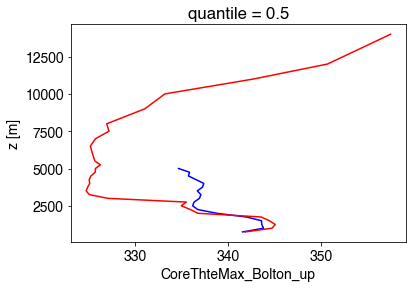

In [ ]:
CoreThetaEMax_narrow_shallow_d2.max(dim='times').quantile(0.5, dim='tracks').plot.line(y='z', color='b', label='Shallow CI-Max')
CoreThetaEMax_narrow_deep_d2.max(dim='times').quantile(0.5, dim='tracks').plot.line(y='z', color='r', label='Deep CI-Max')

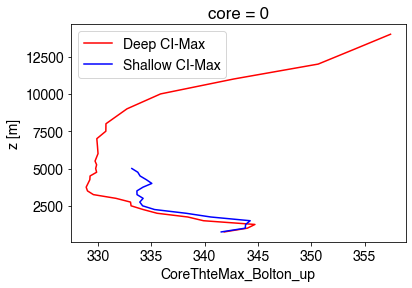

In [ ]:
min_ns = 20
MaxThetaE_narrow_deep_avg_d2.plot.line(y='z', color='r', label='Deep CI-Max')
MaxThetaE_narrow_shallow_avg_d2.plot.line(y='z', color='b', label='Shallow CI-Max')
# MaxThetaE_narrow_deep_avg_d2.where(nsMaxThetaE_narrow_deep_prof_d2 > min_ns).plot.line(y='z', color='r', label='Deep CI-Max')
# MaxThetaE_narrow_shallow_avg_d2.where(nsMaxThetaE_narrow_shallow_prof_d2 > min_ns).plot.line(y='z', color='b', label='Shallow CI-Max')
plt.legend()

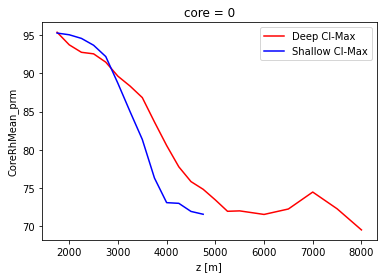

In [ ]:
min_ns = 20

AvgCoreRHprm_narrow_deep_avg_d2.where(nsAvgCoreRHprm_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
AvgCoreRHprm_narrow_shallow_avg_d2.where(nsAvgCoreRHprm_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

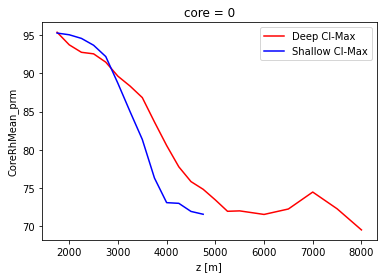

In [ ]:
min_ns = 20

AvgCoreRHprm_narrow_deep_avg_d2.where(nsAvgCoreRHprm_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
AvgCoreRHprm_narrow_shallow_avg_d2.where(nsAvgCoreRHprm_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

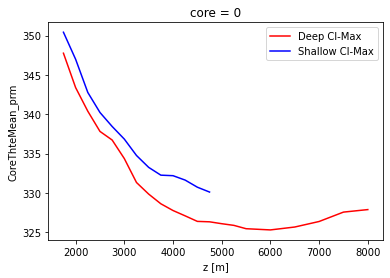

In [ ]:
min_ns = 20

AvgCoreThteprm_narrow_deep_avg_d2.where(nsAvgCoreThteprm_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
AvgCoreThteprm_narrow_shallow_avg_d2.where(nsAvgCoreThteprm_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

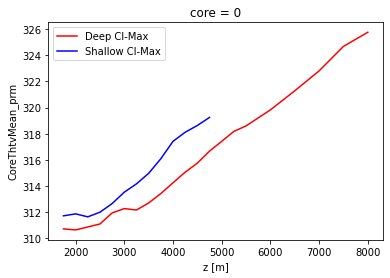

In [ ]:
min_ns = 20

AvgCoreThtvprm_narrow_deep_avg_d2.where(nsAvgCoreThtvprm_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
AvgCoreThtvprm_narrow_shallow_avg_d2.where(nsAvgCoreThtvprm_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

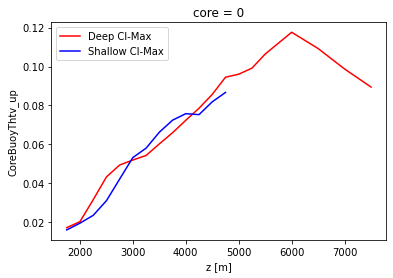

In [ ]:
min_ns = 20

MaxCoreBuoyThtv_narrow_deep_avg_d2.where(nsMaxCoreBuoyThtv_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
MaxCoreBuoyThtv_narrow_shallow_avg_d2.where(nsMaxCoreBuoyThtv_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

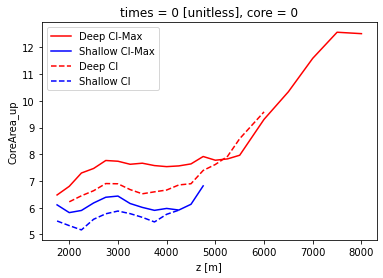

In [ ]:
min_ns = 20

MaxCoreDiam_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
MaxCoreDiam_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
CICoreDiam_narrow_deep_avg_d2.where(nsCICoreDiam_narrow_deep_prof_d2 > min_ns).plot(color='r', ls='--', label='Deep CI')
CICoreDiam_narrow_shallow_avg_d2.where(nsCICoreDiam_narrow_shallow_prof_d2 > min_ns).plot(color='b', ls='--', label='Shallow CI')
plt.legend()

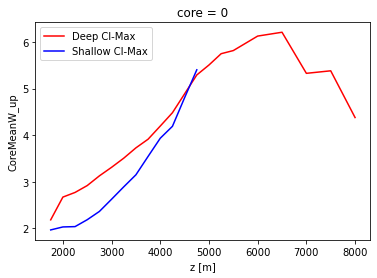

In [ ]:
min_ns = 20
MaxCoreMeanW_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
MaxCoreMeanW_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

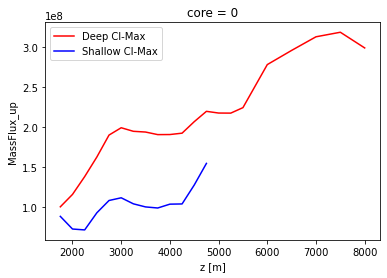

In [ ]:
min_ns = 20
MaxMassFlux_narrow_deep_avg_d2.where(nsMaxMassFlux_narrow_deep_prof_d2 > min_ns).plot(color='r', label='Deep CI-Max')
MaxMassFlux_narrow_shallow_avg_d2.where(nsMaxMassFlux_narrow_shallow_prof_d2 > min_ns).plot(color='b', label='Shallow CI-Max')
plt.legend()

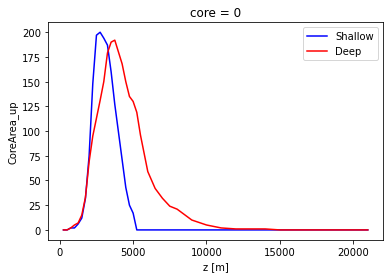

In [ ]:
nsMaxCoreDiam_narrow_shallow_prof_d2.plot(color='b', label='Shallow')
nsMaxCoreDiam_narrow_deep_prof_d2.plot(color='r', label='Deep')
plt.legend()

In [ ]:
# fig, axes = plt.subplots(1, 2, figsize=(8,4), dpi=100)
# ax0 = axes[0]
# ax0.plot(MaxThetaE_wide_deep_avg_d2, height_core, color='r')
# ax0.plot(MaxThetaE_wide_shallow_avg_d2, height_core, color='b')
# ax0.set_xlim(320, 365)
# ax0.set_ylim(0,12000)

# ax1 = axes[1]
# ax1.plot(MaxThetaE_narrow_deep_avg_d2, height_core, color='r')
# ax1.plot(MaxThetaE_narrow_shallow_avg_d2, height_core, color='b')
# ax1.set_xlim(320, 365)
# ax1.set_ylim(0,12000)

### D3 wide cells preCI environments

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')
    
    # Get MU parcel height prior to CI
    mu_parcel_ht_wide_deep_d3 = ds_wide_deep_d3.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
    mu_parcel_ht_wide_shallow_d3 = ds_wide_shallow_d3.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))

    # Filter heights below MU parcel height, select a preCI time, then calculate median over the tracks
    ThetaE_wide_deep_med_d3 = ThetaE_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    ThetaE_wide_shallow_med_d3 = ThetaE_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).median(dim='tracks').compute()

    Theta_wide_deep_med_d3 = Theta_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    Theta_wide_shallow_med_d3 = Theta_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).median(dim='tracks').compute()

    qv_wide_deep_med_d3 = qv_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    qv_wide_shallow_med_d3 = qv_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).median(dim='tracks').compute()

    RHmin_wide_deep_med_d3 = RHmin_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    RHmin_wide_shallow_med_d3 = RHmin_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).median(dim='tracks').compute()
    
    RHavg_wide_deep_med_d3 = RHavg_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    RHavg_wide_shallow_med_d3 = RHavg_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).median(dim='tracks').compute()
    
    # Mean
    ThetaE_wide_deep_avg_d3 = ThetaE_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    ThetaE_wide_shallow_avg_d3 = ThetaE_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()

    Theta_wide_deep_avg_d3 = Theta_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    Theta_wide_shallow_avg_d3 = Theta_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()

    qv_wide_deep_avg_d3 = qv_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    qv_wide_shallow_avg_d3 = qv_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()

    RHmin_wide_deep_avg_d3 = RHmin_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    RHmin_wide_shallow_avg_d3 = RHmin_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()
    
    RHavg_wide_deep_avg_d3 = RHavg_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    RHavg_wide_shallow_avg_d3 = RHavg_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()
    
    # Get profile number of samples 
    ns_wide_deep_prof_d3 = (Theta_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env) > 0).sum(dim='tracks').compute()
    ns_wide_shallow_prof_d3 = (Theta_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    ThetaE_wide_deep_inqt_d3 = ThetaE_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    ThetaE_wide_shallow_inqt_d3 = ThetaE_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    Theta_wide_deep_inqt_d3 = Theta_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    Theta_wide_shallow_inqt_d3 = Theta_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    qv_wide_deep_inqt_d3 = qv_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    qv_wide_shallow_inqt_d3 = qv_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHmin_wide_deep_inqt_d3 = RHmin_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHmin_wide_shallow_inqt_d3 = RHmin_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHavg_wide_deep_inqt_d3 = RHavg_wide_deep_d3.where(height >= mu_parcel_ht_wide_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHavg_wide_shallow_inqt_d3 = RHavg_wide_shallow_d3.where(height >= mu_parcel_ht_wide_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D3 wide cells in-cloud properties

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')

    # Get lowest MU parcel height preCI period
    min_mu_parcel_ht_wide_deep_d3 = mu_parcel_ht_wide_deep_d3.min(dim='times')
    min_mu_parcel_ht_wide_shallow_d3 = mu_parcel_ht_wide_shallow_d3.min(dim='times')
    
    # Undiluted max ThetaE in updraft cores during CI-period: filter heights below MU parcel height
    CoreThetaEMax_wide_deep_d3 = ds_wide_deep_d3.CoreThteMax_up.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreThetaEMax_wide_shallow_d3 = ds_wide_shallow_d3.CoreThteMax_up.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    # Updraft properties during CI-period: filter heights below MU parcel height
    CoreArea_wide_deep_d3 = ds_wide_deep_d3.CoreArea_up.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreArea_wide_shallow_d3 = ds_wide_shallow_d3.CoreArea_up.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    CoreMeanW_wide_deep_d3 = ds_wide_deep_d3.CoreMeanW_up.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreMeanW_wide_shallow_d3 = ds_wide_shallow_d3.CoreMeanW_up.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    CoreBuoyThtv_wide_deep_d3 = ds_wide_deep_d3.CoreBuoyThtv_up.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreBuoyThtv_wide_shallow_d3 = ds_wide_shallow_d3.CoreBuoyThtv_up.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    MassFlux_wide_deep_d3 = ds_wide_deep_d3.MassFlux_up.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    MassFlux_wide_shallow_d3 = ds_wide_shallow_d3.MassFlux_up.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    # Updraft core perimeter variables
    CoreRHprm_wide_deep_d3 = ds_wide_deep_d3.CoreRhMean_prm.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreRHprm_wide_shallow_d3 = ds_wide_shallow_d3.CoreRhMean_prm.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    CoreThtvprm_wide_deep_d3 = ds_wide_deep_d3.CoreThtvMean_prm.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreThtvprm_wide_shallow_d3 = ds_wide_shallow_d3.CoreThtvMean_prm.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    CoreThteprm_wide_deep_d3 = ds_wide_deep_d3.CoreThteMean_prm.where(ds_wide_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d3)
    CoreThteprm_wide_shallow_d3 = ds_wide_shallow_d3.CoreThteMean_prm.where(ds_wide_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d3)
    
    # Take max over times, average over tracks
    MaxThetaE_wide_deep_avg_d3 = CoreThetaEMax_wide_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxThetaE_wide_shallow_avg_d3 = CoreThetaEMax_wide_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreDiam_wide_deep_avg_d3 = 2 * np.sqrt(CoreArea_wide_deep_d3.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_shallow_avg_d3 = 2 * np.sqrt(CoreArea_wide_shallow_d3.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreMeanW_wide_deep_avg_d3 = CoreMeanW_wide_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreMeanW_wide_shallow_avg_d3 = CoreMeanW_wide_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_wide_deep_avg_d3 = CoreBuoyThtv_wide_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_wide_shallow_avg_d3 = CoreBuoyThtv_wide_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_wide_deep_avg_d3 = MassFlux_wide_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_wide_shallow_avg_d3 = MassFlux_wide_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    # Take mean over times, average over tracks
    AvgCoreRHprm_wide_deep_avg_d3 = CoreRHprm_wide_deep_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreRHprm_wide_shallow_avg_d3 = CoreRHprm_wide_shallow_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_wide_deep_avg_d3 = CoreThtvprm_wide_deep_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_wide_shallow_avg_d3 = CoreThtvprm_wide_shallow_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_wide_deep_avg_d3 = CoreThteprm_wide_deep_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_wide_shallow_avg_d3 = CoreThteprm_wide_shallow_d3.mean(dim='times').mean(dim='tracks').compute()
    # Take CI time, average over tracks
    CICoreDiam_wide_deep_avg_d3 = 2 * np.sqrt(CoreArea_wide_deep_d3.sel(times=0).mean(dim='tracks').compute() / np.pi)
    CICoreDiam_wide_shallow_avg_d3 = 2 * np.sqrt(CoreArea_wide_shallow_d3.sel(times=0).mean(dim='tracks').compute() / np.pi)

    # Number of samples
    nsMaxThetaE_wide_deep_prof_d3 = (CoreThetaEMax_wide_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxThetaE_wide_shallow_prof_d3 = (CoreThetaEMax_wide_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_wide_deep_prof_d3 = (CoreArea_wide_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_wide_shallow_prof_d3 = (CoreArea_wide_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_wide_deep_prof_d3 = (MassFlux_wide_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_wide_shallow_prof_d3 = (MassFlux_wide_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_wide_deep_prof_d3 = (CoreBuoyThtv_wide_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_wide_shallow_prof_d3 = (CoreBuoyThtv_wide_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_wide_deep_prof_d3 = (CoreRHprm_wide_deep_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_wide_shallow_prof_d3 = (CoreRHprm_wide_shallow_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_wide_deep_prof_d3 = (CoreThtvprm_wide_deep_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_wide_shallow_prof_d3 = (CoreThtvprm_wide_shallow_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_wide_deep_prof_d3 = (CoreThteprm_wide_deep_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_wide_shallow_prof_d3 = (CoreThteprm_wide_shallow_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsCICoreDiam_wide_deep_prof_d3 = (CoreArea_wide_deep_d3.sel(times=0) > 0).sum(dim='tracks').compute()
    nsCICoreDiam_wide_shallow_prof_d3 = (CoreArea_wide_shallow_d3.sel(times=0) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    CICoreDiam_wide_deep_inqt_d3 = 2 * np.sqrt(CoreArea_wide_deep_d3.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    CICoreDiam_wide_shallow_inqt_d3 = 2 * np.sqrt(CoreArea_wide_shallow_d3.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_deep_inqt_d3 = 2 * np.sqrt(CoreArea_wide_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_shallow_inqt_d3 = 2 * np.sqrt(CoreArea_wide_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreMeanW_wide_deep_inqt_d3 = CoreMeanW_wide_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreMeanW_wide_shallow_inqt_d3 = CoreMeanW_wide_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_wide_deep_inqt_d3 = CoreBuoyThtv_wide_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_wide_shallow_inqt_d3 = CoreBuoyThtv_wide_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_wide_deep_inqt_d3 = MassFlux_wide_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_wide_shallow_inqt_d3 = MassFlux_wide_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    # Updraft core perimeter variables
    AvgCoreRHprm_wide_deep_inqt_d3 = CoreRHprm_wide_deep_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreRHprm_wide_shallow_inqt_d3 = CoreRHprm_wide_shallow_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_wide_deep_inqt_d3 = CoreThtvprm_wide_deep_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_wide_shallow_inqt_d3 = CoreThtvprm_wide_shallow_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_wide_deep_inqt_d3 = CoreThteprm_wide_deep_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_wide_shallow_inqt_d3 = CoreThteprm_wide_shallow_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D3 narrow cells preCI environments

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')
    
    # Get MU parcel height prior to CI
    mu_parcel_ht_narrow_deep_d3 = ds_narrow_deep_d3.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
    mu_parcel_ht_narrow_shallow_d3 = ds_narrow_shallow_d3.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))

    # Filter heights below MU parcel height, select a preCI time, then calculate median over the tracks
    ThetaE_narrow_deep_med_d3 = ThetaE_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    ThetaE_narrow_shallow_med_d3 = ThetaE_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).median(dim='tracks').compute()

    Theta_narrow_deep_med_d3 = Theta_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    Theta_narrow_shallow_med_d3 = Theta_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).median(dim='tracks').compute()

    qv_narrow_deep_med_d3 = qv_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    qv_narrow_shallow_med_d3 = qv_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).median(dim='tracks').compute()

    RHmin_narrow_deep_med_d3 = RHmin_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    RHmin_narrow_shallow_med_d3 = RHmin_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).median(dim='tracks').compute()
    
    RHavg_narrow_deep_med_d3 = RHavg_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).median(dim='tracks').compute()
    RHavg_narrow_shallow_med_d3 = RHavg_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).median(dim='tracks').compute()
    
    # Mean
    ThetaE_narrow_deep_avg_d3 = ThetaE_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    ThetaE_narrow_shallow_avg_d3 = ThetaE_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()

    Theta_narrow_deep_avg_d3 = Theta_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    Theta_narrow_shallow_avg_d3 = Theta_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()

    qv_narrow_deep_avg_d3 = qv_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    qv_narrow_shallow_avg_d3 = qv_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()

    RHmin_narrow_deep_avg_d3 = RHmin_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    RHmin_narrow_shallow_avg_d3 = RHmin_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()
    
    RHavg_narrow_deep_avg_d3 = RHavg_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).mean(dim='tracks').compute()
    RHavg_narrow_shallow_avg_d3 = RHavg_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).mean(dim='tracks').compute()
    
    # Get profile number of samples 
    ns_narrow_deep_prof_d3 = (Theta_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env) > 0).sum(dim='tracks').compute()
    ns_narrow_shallow_prof_d3 = (Theta_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    ThetaE_narrow_deep_inqt_d3 = ThetaE_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    ThetaE_narrow_shallow_inqt_d3 = ThetaE_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    Theta_narrow_deep_inqt_d3 = Theta_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    Theta_narrow_shallow_inqt_d3 = Theta_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    qv_narrow_deep_inqt_d3 = qv_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    qv_narrow_shallow_inqt_d3 = qv_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHmin_narrow_deep_inqt_d3 = RHmin_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHmin_narrow_shallow_inqt_d3 = RHmin_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHavg_narrow_deep_inqt_d3 = RHavg_narrow_deep_d3.where(height >= mu_parcel_ht_narrow_deep_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHavg_narrow_shallow_inqt_d3 = RHavg_narrow_shallow_d3.where(height >= mu_parcel_ht_narrow_shallow_d3).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D3 narrow cells in-cloud properties

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')

    # Get lowest MU parcel height preCI period
    min_mu_parcel_ht_narrow_deep_d3 = mu_parcel_ht_narrow_deep_d3.min(dim='times')
    min_mu_parcel_ht_narrow_shallow_d3 = mu_parcel_ht_narrow_shallow_d3.min(dim='times')
    
    # Undiluted max ThetaE in updraft cores during CI-period: filter heights below MU parcel height
    CoreThetaEMax_narrow_deep_d3 = ds_narrow_deep_d3.CoreThteMax_up.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreThetaEMax_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreThteMax_up.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    # Updraft properties during CI-period: filter heights below MU parcel height
    CoreArea_narrow_deep_d3 = ds_narrow_deep_d3.CoreArea_up.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreArea_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreArea_up.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    CoreMeanW_narrow_deep_d3 = ds_narrow_deep_d3.CoreMeanW_up.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreMeanW_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreMeanW_up.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    CoreBuoyThtv_narrow_deep_d3 = ds_narrow_deep_d3.CoreBuoyThtv_up.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreBuoyThtv_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreBuoyThtv_up.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    MassFlux_narrow_deep_d3 = ds_narrow_deep_d3.MassFlux_up.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    MassFlux_narrow_shallow_d3 = ds_narrow_shallow_d3.MassFlux_up.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    # Updraft core perimeter variables
    CoreRHprm_narrow_deep_d3 = ds_narrow_deep_d3.CoreRhMean_prm.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreRHprm_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreRhMean_prm.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    CoreThtvprm_narrow_deep_d3 = ds_narrow_deep_d3.CoreThtvMean_prm.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreThtvprm_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreThtvMean_prm.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    CoreThteprm_narrow_deep_d3 = ds_narrow_deep_d3.CoreThteMean_prm.where(ds_narrow_deep_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d3)
    CoreThteprm_narrow_shallow_d3 = ds_narrow_shallow_d3.CoreThteMean_prm.where(ds_narrow_shallow_d3.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d3)
    
    # Take max over times, average over tracks
    MaxThetaE_narrow_deep_avg_d3 = CoreThetaEMax_narrow_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxThetaE_narrow_shallow_avg_d3 = CoreThetaEMax_narrow_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreDiam_narrow_deep_avg_d3 = 2 * np.sqrt(CoreArea_narrow_deep_d3.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_shallow_avg_d3 = 2 * np.sqrt(CoreArea_narrow_shallow_d3.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreMeanW_narrow_deep_avg_d3 = CoreMeanW_narrow_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreMeanW_narrow_shallow_avg_d3 = CoreMeanW_narrow_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_deep_avg_d3 = CoreBuoyThtv_narrow_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_shallow_avg_d3 = CoreBuoyThtv_narrow_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_narrow_deep_avg_d3 = MassFlux_narrow_deep_d3.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_narrow_shallow_avg_d3 = MassFlux_narrow_shallow_d3.max(dim='times').mean(dim='tracks').compute()
    # Take mean over times, average over tracks
    AvgCoreRHprm_narrow_deep_avg_d3 = CoreRHprm_narrow_deep_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreRHprm_narrow_shallow_avg_d3 = CoreRHprm_narrow_shallow_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_narrow_deep_avg_d3 = CoreThtvprm_narrow_deep_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_narrow_shallow_avg_d3 = CoreThtvprm_narrow_shallow_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_narrow_deep_avg_d3 = CoreThteprm_narrow_deep_d3.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_narrow_shallow_avg_d3 = CoreThteprm_narrow_shallow_d3.mean(dim='times').mean(dim='tracks').compute()
    # Take CI time, average over tracks
    CICoreDiam_narrow_deep_avg_d3 = 2 * np.sqrt(CoreArea_narrow_deep_d3.sel(times=0).mean(dim='tracks').compute() / np.pi)
    CICoreDiam_narrow_shallow_avg_d3 = 2 * np.sqrt(CoreArea_narrow_shallow_d3.sel(times=0).mean(dim='tracks').compute() / np.pi)

    # Number of samples
    nsMaxThetaE_narrow_deep_prof_d3 = (CoreThetaEMax_narrow_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxThetaE_narrow_shallow_prof_d3 = (CoreThetaEMax_narrow_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_narrow_deep_prof_d3 = (CoreArea_narrow_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_narrow_shallow_prof_d3 = (CoreArea_narrow_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_narrow_deep_prof_d3 = (MassFlux_narrow_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_narrow_shallow_prof_d3 = (MassFlux_narrow_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_narrow_deep_prof_d3 = (CoreBuoyThtv_narrow_deep_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_narrow_shallow_prof_d3 = (CoreBuoyThtv_narrow_shallow_d3.max(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_narrow_deep_prof_d3 = (CoreRHprm_narrow_deep_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_narrow_shallow_prof_d3 = (CoreRHprm_narrow_shallow_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_narrow_deep_prof_d3 = (CoreThtvprm_narrow_deep_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_narrow_shallow_prof_d3 = (CoreThtvprm_narrow_shallow_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_narrow_deep_prof_d3 = (CoreThteprm_narrow_deep_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_narrow_shallow_prof_d3 = (CoreThteprm_narrow_shallow_d3.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsCICoreDiam_narrow_deep_prof_d3 = (CoreArea_narrow_deep_d3.sel(times=0) > 0).sum(dim='tracks').compute()
    nsCICoreDiam_narrow_shallow_prof_d3 = (CoreArea_narrow_shallow_d3.sel(times=0) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    CICoreDiam_narrow_deep_inqt_d3 = 2 * np.sqrt(CoreArea_narrow_deep_d3.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    CICoreDiam_narrow_shallow_inqt_d3 = 2 * np.sqrt(CoreArea_narrow_shallow_d3.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_deep_inqt_d3 = 2 * np.sqrt(CoreArea_narrow_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_shallow_inqt_d3 = 2 * np.sqrt(CoreArea_narrow_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreMeanW_narrow_deep_inqt_d3 = CoreMeanW_narrow_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreMeanW_narrow_shallow_inqt_d3 = CoreMeanW_narrow_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_deep_inqt_d3 = CoreBuoyThtv_narrow_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_shallow_inqt_d3 = CoreBuoyThtv_narrow_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_narrow_deep_inqt_d3 = MassFlux_narrow_deep_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_narrow_shallow_inqt_d3 = MassFlux_narrow_shallow_d3.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    # Updraft core perimeter variables
    AvgCoreRHprm_narrow_deep_inqt_d3 = CoreRHprm_narrow_deep_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreRHprm_narrow_shallow_inqt_d3 = CoreRHprm_narrow_shallow_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_narrow_deep_inqt_d3 = CoreThtvprm_narrow_deep_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_narrow_shallow_inqt_d3 = CoreThtvprm_narrow_shallow_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_narrow_deep_inqt_d3 = CoreThteprm_narrow_deep_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_narrow_shallow_inqt_d3 = CoreThteprm_narrow_shallow_d3.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D4 wide cells preCI environments

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')
    
    # Get MU parcel height prior to CI
    mu_parcel_ht_wide_deep_d4 = ds_wide_deep_d4.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
    mu_parcel_ht_wide_shallow_d4 = ds_wide_shallow_d4.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))

    # Filter heights below MU parcel height, select a preCI time, then calculate median over the tracks
    ThetaE_wide_deep_med_d4 = ThetaE_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    ThetaE_wide_shallow_med_d4 = ThetaE_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).median(dim='tracks').compute()

    Theta_wide_deep_med_d4 = Theta_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    Theta_wide_shallow_med_d4 = Theta_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).median(dim='tracks').compute()

    qv_wide_deep_med_d4 = qv_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    qv_wide_shallow_med_d4 = qv_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).median(dim='tracks').compute()

    RHmin_wide_deep_med_d4 = RHmin_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    RHmin_wide_shallow_med_d4 = RHmin_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).median(dim='tracks').compute()
    
    RHavg_wide_deep_med_d4 = RHavg_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    RHavg_wide_shallow_med_d4 = RHavg_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).median(dim='tracks').compute()
    
    # Mean
    ThetaE_wide_deep_avg_d4 = ThetaE_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    ThetaE_wide_shallow_avg_d4 = ThetaE_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()

    Theta_wide_deep_avg_d4 = Theta_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    Theta_wide_shallow_avg_d4 = Theta_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()

    qv_wide_deep_avg_d4 = qv_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    qv_wide_shallow_avg_d4 = qv_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()

    RHmin_wide_deep_avg_d4 = RHmin_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    RHmin_wide_shallow_avg_d4 = RHmin_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()
    
    RHavg_wide_deep_avg_d4 = RHavg_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    RHavg_wide_shallow_avg_d4 = RHavg_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()
    
    # Get profile number of samples 
    ns_wide_deep_prof_d4 = (Theta_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env) > 0).sum(dim='tracks').compute()
    ns_wide_shallow_prof_d4 = (Theta_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    ThetaE_wide_deep_inqt_d4 = ThetaE_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    ThetaE_wide_shallow_inqt_d4 = ThetaE_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    Theta_wide_deep_inqt_d4 = Theta_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    Theta_wide_shallow_inqt_d4 = Theta_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    qv_wide_deep_inqt_d4 = qv_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    qv_wide_shallow_inqt_d4 = qv_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHmin_wide_deep_inqt_d4 = RHmin_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHmin_wide_shallow_inqt_d4 = RHmin_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHavg_wide_deep_inqt_d4 = RHavg_wide_deep_d4.where(height >= mu_parcel_ht_wide_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHavg_wide_shallow_inqt_d4 = RHavg_wide_shallow_d4.where(height >= mu_parcel_ht_wide_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D4 wide cells in-cloud properties

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')

    # Get lowest MU parcel height preCI period
    min_mu_parcel_ht_wide_deep_d4 = mu_parcel_ht_wide_deep_d4.min(dim='times')
    min_mu_parcel_ht_wide_shallow_d4 = mu_parcel_ht_wide_shallow_d4.min(dim='times')
    
    # Undiluted max ThetaE in updraft cores during CI-period: filter heights below MU parcel height
    CoreThetaEMax_wide_deep_d4 = ds_wide_deep_d4.CoreThteMax_up.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreThetaEMax_wide_shallow_d4 = ds_wide_shallow_d4.CoreThteMax_up.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    # Updraft properties during CI-period: filter heights below MU parcel height
    CoreArea_wide_deep_d4 = ds_wide_deep_d4.CoreArea_up.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreArea_wide_shallow_d4 = ds_wide_shallow_d4.CoreArea_up.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    CoreMeanW_wide_deep_d4 = ds_wide_deep_d4.CoreMeanW_up.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreMeanW_wide_shallow_d4 = ds_wide_shallow_d4.CoreMeanW_up.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    CoreBuoyThtv_wide_deep_d4 = ds_wide_deep_d4.CoreBuoyThtv_up.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreBuoyThtv_wide_shallow_d4 = ds_wide_shallow_d4.CoreBuoyThtv_up.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    MassFlux_wide_deep_d4 = ds_wide_deep_d4.MassFlux_up.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    MassFlux_wide_shallow_d4 = ds_wide_shallow_d4.MassFlux_up.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    # Updraft core perimeter variables
    CoreRHprm_wide_deep_d4 = ds_wide_deep_d4.CoreRhMean_prm.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreRHprm_wide_shallow_d4 = ds_wide_shallow_d4.CoreRhMean_prm.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    CoreThtvprm_wide_deep_d4 = ds_wide_deep_d4.CoreThtvMean_prm.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreThtvprm_wide_shallow_d4 = ds_wide_shallow_d4.CoreThtvMean_prm.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    CoreThteprm_wide_deep_d4 = ds_wide_deep_d4.CoreThteMean_prm.where(ds_wide_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_deep_d4)
    CoreThteprm_wide_shallow_d4 = ds_wide_shallow_d4.CoreThteMean_prm.where(ds_wide_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_wide_shallow_d4)
    
    # Take max over times, average over tracks
    MaxThetaE_wide_deep_avg_d4 = CoreThetaEMax_wide_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxThetaE_wide_shallow_avg_d4 = CoreThetaEMax_wide_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreDiam_wide_deep_avg_d4 = 2 * np.sqrt(CoreArea_wide_deep_d4.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_shallow_avg_d4 = 2 * np.sqrt(CoreArea_wide_shallow_d4.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreMeanW_wide_deep_avg_d4 = CoreMeanW_wide_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreMeanW_wide_shallow_avg_d4 = CoreMeanW_wide_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_wide_deep_avg_d4 = CoreBuoyThtv_wide_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_wide_shallow_avg_d4 = CoreBuoyThtv_wide_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_wide_deep_avg_d4 = MassFlux_wide_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_wide_shallow_avg_d4 = MassFlux_wide_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    # Take mean over times, average over tracks
    AvgCoreRHprm_wide_deep_avg_d4 = CoreRHprm_wide_deep_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreRHprm_wide_shallow_avg_d4 = CoreRHprm_wide_shallow_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_wide_deep_avg_d4 = CoreThtvprm_wide_deep_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_wide_shallow_avg_d4 = CoreThtvprm_wide_shallow_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_wide_deep_avg_d4 = CoreThteprm_wide_deep_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_wide_shallow_avg_d4 = CoreThteprm_wide_shallow_d4.mean(dim='times').mean(dim='tracks').compute()
    # Take CI time, average over tracks
    CICoreDiam_wide_deep_avg_d4 = 2 * np.sqrt(CoreArea_wide_deep_d4.sel(times=0).mean(dim='tracks').compute() / np.pi)
    CICoreDiam_wide_shallow_avg_d4 = 2 * np.sqrt(CoreArea_wide_shallow_d4.sel(times=0).mean(dim='tracks').compute() / np.pi)

    # Number of samples
    nsMaxThetaE_wide_deep_prof_d4 = (CoreThetaEMax_wide_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxThetaE_wide_shallow_prof_d4 = (CoreThetaEMax_wide_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_wide_deep_prof_d4 = (CoreArea_wide_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_wide_shallow_prof_d4 = (CoreArea_wide_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_wide_deep_prof_d4 = (MassFlux_wide_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_wide_shallow_prof_d4 = (MassFlux_wide_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_wide_deep_prof_d4 = (CoreBuoyThtv_wide_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_wide_shallow_prof_d4 = (CoreBuoyThtv_wide_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_wide_deep_prof_d4 = (CoreRHprm_wide_deep_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_wide_shallow_prof_d4 = (CoreRHprm_wide_shallow_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_wide_deep_prof_d4 = (CoreThtvprm_wide_deep_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_wide_shallow_prof_d4 = (CoreThtvprm_wide_shallow_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_wide_deep_prof_d4 = (CoreThteprm_wide_deep_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_wide_shallow_prof_d4 = (CoreThteprm_wide_shallow_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsCICoreDiam_wide_deep_prof_d4 = (CoreArea_wide_deep_d4.sel(times=0) > 0).sum(dim='tracks').compute()
    nsCICoreDiam_wide_shallow_prof_d4 = (CoreArea_wide_shallow_d4.sel(times=0) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    CICoreDiam_wide_deep_inqt_d4 = 2 * np.sqrt(CoreArea_wide_deep_d4.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    CICoreDiam_wide_shallow_inqt_d4 = 2 * np.sqrt(CoreArea_wide_shallow_d4.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_deep_inqt_d4 = 2 * np.sqrt(CoreArea_wide_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_wide_shallow_inqt_d4 = 2 * np.sqrt(CoreArea_wide_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreMeanW_wide_deep_inqt_d4 = CoreMeanW_wide_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreMeanW_wide_shallow_inqt_d4 = CoreMeanW_wide_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_wide_deep_inqt_d4 = CoreBuoyThtv_wide_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_wide_shallow_inqt_d4 = CoreBuoyThtv_wide_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_wide_deep_inqt_d4 = MassFlux_wide_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_wide_shallow_inqt_d4 = MassFlux_wide_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    # Updraft core perimeter variables
    AvgCoreRHprm_wide_deep_inqt_d4 = CoreRHprm_wide_deep_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreRHprm_wide_shallow_inqt_d4 = CoreRHprm_wide_shallow_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_wide_deep_inqt_d4 = CoreThtvprm_wide_deep_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_wide_shallow_inqt_d4 = CoreThtvprm_wide_shallow_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_wide_deep_inqt_d4 = CoreThteprm_wide_deep_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_wide_shallow_inqt_d4 = CoreThteprm_wide_shallow_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D4 narrow cells preCI environments

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')
    
    # Get MU parcel height prior to CI
    mu_parcel_ht_narrow_deep_d4 = ds_narrow_deep_d4.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))
    mu_parcel_ht_narrow_shallow_d4 = ds_narrow_shallow_d4.mu_parcel_ht_msl.sel(times=slice(preCI_nt,0))

    # Filter heights below MU parcel height, select a preCI time, then calculate median over the tracks
    ThetaE_narrow_deep_med_d4 = ThetaE_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    ThetaE_narrow_shallow_med_d4 = ThetaE_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).median(dim='tracks').compute()

    Theta_narrow_deep_med_d4 = Theta_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    Theta_narrow_shallow_med_d4 = Theta_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).median(dim='tracks').compute()

    qv_narrow_deep_med_d4 = qv_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    qv_narrow_shallow_med_d4 = qv_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).median(dim='tracks').compute()

    RHmin_narrow_deep_med_d4 = RHmin_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    RHmin_narrow_shallow_med_d4 = RHmin_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).median(dim='tracks').compute()
    
    RHavg_narrow_deep_med_d4 = RHavg_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).median(dim='tracks').compute()
    RHavg_narrow_shallow_med_d4 = RHavg_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).median(dim='tracks').compute()
    
    # Mean
    ThetaE_narrow_deep_avg_d4 = ThetaE_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    ThetaE_narrow_shallow_avg_d4 = ThetaE_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()

    Theta_narrow_deep_avg_d4 = Theta_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    Theta_narrow_shallow_avg_d4 = Theta_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()

    qv_narrow_deep_avg_d4 = qv_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    qv_narrow_shallow_avg_d4 = qv_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()

    RHmin_narrow_deep_avg_d4 = RHmin_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    RHmin_narrow_shallow_avg_d4 = RHmin_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()
    
    RHavg_narrow_deep_avg_d4 = RHavg_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).mean(dim='tracks').compute()
    RHavg_narrow_shallow_avg_d4 = RHavg_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).mean(dim='tracks').compute()
    
    # Get profile number of samples 
    ns_narrow_deep_prof_d4 = (Theta_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env) > 0).sum(dim='tracks').compute()
    ns_narrow_shallow_prof_d4 = (Theta_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    ThetaE_narrow_deep_inqt_d4 = ThetaE_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    ThetaE_narrow_shallow_inqt_d4 = ThetaE_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    Theta_narrow_deep_inqt_d4 = Theta_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    Theta_narrow_shallow_inqt_d4 = Theta_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    qv_narrow_deep_inqt_d4 = qv_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    qv_narrow_shallow_inqt_d4 = qv_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHmin_narrow_deep_inqt_d4 = RHmin_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHmin_narrow_shallow_inqt_d4 = RHmin_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    
    RHavg_narrow_deep_inqt_d4 = RHavg_narrow_deep_d4.where(height >= mu_parcel_ht_narrow_deep_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    RHavg_narrow_shallow_inqt_d4 = RHavg_narrow_shallow_d4.where(height >= mu_parcel_ht_narrow_shallow_d4).sel(times=time_env).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

### D4 narrow cells in-cloud properties

In [ ]:
# Suppress the "All-NaN slice encountered" warning
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', r'All-NaN slice encountered')

    # Get lowest MU parcel height preCI period
    min_mu_parcel_ht_narrow_deep_d4 = mu_parcel_ht_narrow_deep_d4.min(dim='times')
    min_mu_parcel_ht_narrow_shallow_d4 = mu_parcel_ht_narrow_shallow_d4.min(dim='times')
    
    # Undiluted max ThetaE in updraft cores during CI-period: filter heights below MU parcel height
    CoreThetaEMax_narrow_deep_d4 = ds_narrow_deep_d4.CoreThteMax_up.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreThetaEMax_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreThteMax_up.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    # Updraft properties during CI-period: filter heights below MU parcel height
    CoreArea_narrow_deep_d4 = ds_narrow_deep_d4.CoreArea_up.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreArea_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreArea_up.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    CoreMeanW_narrow_deep_d4 = ds_narrow_deep_d4.CoreMeanW_up.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreMeanW_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreMeanW_up.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    CoreBuoyThtv_narrow_deep_d4 = ds_narrow_deep_d4.CoreBuoyThtv_up.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreBuoyThtv_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreBuoyThtv_up.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    MassFlux_narrow_deep_d4 = ds_narrow_deep_d4.MassFlux_up.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    MassFlux_narrow_shallow_d4 = ds_narrow_shallow_d4.MassFlux_up.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    # Updraft core perimeter variables
    CoreRHprm_narrow_deep_d4 = ds_narrow_deep_d4.CoreRhMean_prm.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreRHprm_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreRhMean_prm.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    CoreThtvprm_narrow_deep_d4 = ds_narrow_deep_d4.CoreThtvMean_prm.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreThtvprm_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreThtvMean_prm.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    CoreThteprm_narrow_deep_d4 = ds_narrow_deep_d4.CoreThteMean_prm.where(ds_narrow_deep_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_deep_d4)
    CoreThteprm_narrow_shallow_d4 = ds_narrow_shallow_d4.CoreThteMean_prm.where(ds_narrow_shallow_d4.Wmask == True).isel(times=slice(tidx_start, tidx_end)).where(height_core >= min_mu_parcel_ht_narrow_shallow_d4)
    
    # Take max over times, average over tracks
    MaxThetaE_narrow_deep_avg_d4 = CoreThetaEMax_narrow_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxThetaE_narrow_shallow_avg_d4 = CoreThetaEMax_narrow_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreDiam_narrow_deep_avg_d4 = 2 * np.sqrt(CoreArea_narrow_deep_d4.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_shallow_avg_d4 = 2 * np.sqrt(CoreArea_narrow_shallow_d4.max(dim='times').mean(dim='tracks').compute() / np.pi)
    MaxCoreMeanW_narrow_deep_avg_d4 = CoreMeanW_narrow_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreMeanW_narrow_shallow_avg_d4 = CoreMeanW_narrow_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_deep_avg_d4 = CoreBuoyThtv_narrow_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_shallow_avg_d4 = CoreBuoyThtv_narrow_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_narrow_deep_avg_d4 = MassFlux_narrow_deep_d4.max(dim='times').mean(dim='tracks').compute()
    MaxMassFlux_narrow_shallow_avg_d4 = MassFlux_narrow_shallow_d4.max(dim='times').mean(dim='tracks').compute()
    # Take mean over times, average over tracks
    AvgCoreRHprm_narrow_deep_avg_d4 = CoreRHprm_narrow_deep_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreRHprm_narrow_shallow_avg_d4 = CoreRHprm_narrow_shallow_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_narrow_deep_avg_d4 = CoreThtvprm_narrow_deep_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThtvprm_narrow_shallow_avg_d4 = CoreThtvprm_narrow_shallow_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_narrow_deep_avg_d4 = CoreThteprm_narrow_deep_d4.mean(dim='times').mean(dim='tracks').compute()
    AvgCoreThteprm_narrow_shallow_avg_d4 = CoreThteprm_narrow_shallow_d4.mean(dim='times').mean(dim='tracks').compute()
    # Take CI time, average over tracks
    CICoreDiam_narrow_deep_avg_d4 = 2 * np.sqrt(CoreArea_narrow_deep_d4.sel(times=0).mean(dim='tracks').compute() / np.pi)
    CICoreDiam_narrow_shallow_avg_d4 = 2 * np.sqrt(CoreArea_narrow_shallow_d4.sel(times=0).mean(dim='tracks').compute() / np.pi)

    # Number of samples
    nsMaxThetaE_narrow_deep_prof_d4 = (CoreThetaEMax_narrow_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxThetaE_narrow_shallow_prof_d4 = (CoreThetaEMax_narrow_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_narrow_deep_prof_d4 = (CoreArea_narrow_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreDiam_narrow_shallow_prof_d4 = (CoreArea_narrow_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_narrow_deep_prof_d4 = (MassFlux_narrow_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxMassFlux_narrow_shallow_prof_d4 = (MassFlux_narrow_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_narrow_deep_prof_d4 = (CoreBuoyThtv_narrow_deep_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsMaxCoreBuoyThtv_narrow_shallow_prof_d4 = (CoreBuoyThtv_narrow_shallow_d4.max(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_narrow_deep_prof_d4 = (CoreRHprm_narrow_deep_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreRHprm_narrow_shallow_prof_d4 = (CoreRHprm_narrow_shallow_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_narrow_deep_prof_d4 = (CoreThtvprm_narrow_deep_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThtvprm_narrow_shallow_prof_d4 = (CoreThtvprm_narrow_shallow_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_narrow_deep_prof_d4 = (CoreThteprm_narrow_deep_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsAvgCoreThteprm_narrow_shallow_prof_d4 = (CoreThteprm_narrow_shallow_d4.mean(dim='times') > 0).sum(dim='tracks').compute()
    nsCICoreDiam_narrow_deep_prof_d4 = (CoreArea_narrow_deep_d4.sel(times=0) > 0).sum(dim='tracks').compute()
    nsCICoreDiam_narrow_shallow_prof_d4 = (CoreArea_narrow_shallow_d4.sel(times=0) > 0).sum(dim='tracks').compute()
    
    # Calculate interquartile range
    CICoreDiam_narrow_deep_inqt_d4 = 2 * np.sqrt(CoreArea_narrow_deep_d4.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    CICoreDiam_narrow_shallow_inqt_d4 = 2 * np.sqrt(CoreArea_narrow_shallow_d4.sel(times=0).chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_deep_inqt_d4 = 2 * np.sqrt(CoreArea_narrow_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreDiam_narrow_shallow_inqt_d4 = 2 * np.sqrt(CoreArea_narrow_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute() / np.pi)
    MaxCoreMeanW_narrow_deep_inqt_d4 = CoreMeanW_narrow_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreMeanW_narrow_shallow_inqt_d4 = CoreMeanW_narrow_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_deep_inqt_d4 = CoreBuoyThtv_narrow_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxCoreBuoyThtv_narrow_shallow_inqt_d4 = CoreBuoyThtv_narrow_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_narrow_deep_inqt_d4 = MassFlux_narrow_deep_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    MaxMassFlux_narrow_shallow_inqt_d4 = MassFlux_narrow_shallow_d4.max(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    # Updraft core perimeter variables
    AvgCoreRHprm_narrow_deep_inqt_d4 = CoreRHprm_narrow_deep_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreRHprm_narrow_shallow_inqt_d4 = CoreRHprm_narrow_shallow_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_narrow_deep_inqt_d4 = CoreThtvprm_narrow_deep_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThtvprm_narrow_shallow_inqt_d4 = CoreThtvprm_narrow_shallow_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_narrow_deep_inqt_d4 = CoreThteprm_narrow_deep_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()
    AvgCoreThteprm_narrow_shallow_inqt_d4 = CoreThteprm_narrow_shallow_d4.mean(dim='times').chunk(dict(tracks=-1)).quantile(prof_quantiles, dim='tracks').compute()

## Function to plot profiles in MxN panels

In [ ]:
def plot_mxn_profs(nrow, ncol, prof1, prof2, height, height_core, inqt=None,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'--', 'max':'-'}
    lw = 3
    name_map1 = {'d':'Deep preCI', 's':'Shallow preCI'}
    name_map2 = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof1_data = prof1[row][col]
            prof2_data = prof2[row][col]
            # inqt_data = inqt[row]
            ax.plot(prof1_data['s'], height, color=lcolors['s'], label=name_map1['s'], lw=lw, ls=lstyles['min'])
            ax.plot(prof1_data['d'], height, color=lcolors['d'], label=name_map1['d'], lw=lw, ls=lstyles['min'])
            # if col == 0:
            ax.plot(prof2_data['s'], height_core, color=lcolors['s'], label=name_map2['s'], lw=lw, ls=lstyles['max'])
            ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])
                # ax.fill_betweenx(height, inqt_data['s'][0], inqt_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
                # ax.fill_betweenx(height, inqt_data['d'][0], inqt_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                ax.axhline(_z_thresh, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/PreCI_CIMax_Profile_NarrowWide_ThetaE_d2_d3_d4.png


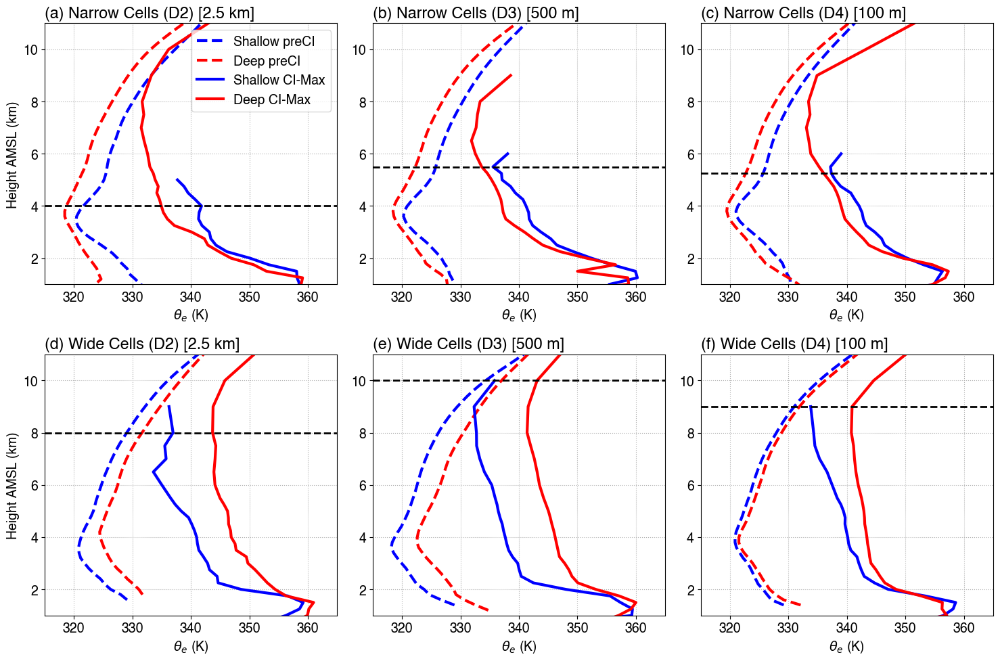

In [ ]:
min_ns_prof = 30

prof1 = [
    [{'d':ThetaE_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > min_ns_prof), 's':ThetaE_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > min_ns_prof)},
     {'d':ThetaE_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > min_ns_prof), 's':ThetaE_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > min_ns_prof)},
     {'d':ThetaE_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > min_ns_prof), 's':ThetaE_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > min_ns_prof)}],
    [{'d':ThetaE_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > min_ns_prof), 's':ThetaE_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > min_ns_prof)},
     {'d':ThetaE_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > min_ns_prof), 's':ThetaE_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > min_ns_prof)},
     {'d':ThetaE_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > min_ns_prof), 's':ThetaE_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > min_ns_prof)},],
]
prof2 = [
    [{'d':MaxThetaE_narrow_deep_avg_d2, 's':MaxThetaE_narrow_shallow_avg_d2},
     {'d':MaxThetaE_narrow_deep_avg_d3, 's':MaxThetaE_narrow_shallow_avg_d3},
     {'d':MaxThetaE_narrow_deep_avg_d4, 's':MaxThetaE_narrow_shallow_avg_d4},
     ],
    [{'d':MaxThetaE_wide_deep_avg_d2, 's':MaxThetaE_wide_shallow_avg_d2},
     {'d':MaxThetaE_wide_deep_avg_d3, 's':MaxThetaE_wide_shallow_avg_d3},
     {'d':MaxThetaE_wide_deep_avg_d4, 's':MaxThetaE_wide_shallow_avg_d4},],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
nrow = len(prof1)
ncol = len(prof1[0])
# nrow, ncol
xlabels = [
    [r'$\theta_e$ (K)']*ncol,
    [r'$\theta_e$ (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]

ylims = (1,11)
xlims = [
    [(315,365)]*ncol,
    [(315,365)]*ncol,
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'upper right'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}PreCI_CIMax_Profile_NarrowWide_ThetaE_d2_d3_d4.png'
print(figname)
fig = plot_mxn_profs(nrow, ncol, prof1, prof2, height/1e3, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

## Function to plot a single resolution with sample size profiles

In [ ]:
def plot_mxn_profs(nrow, ncol, prof1, prof2, height, height_core, inqt=None,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    # lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
    lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'--', 'max':'-'}
    lw = 3
    name_map1 = {'d':'Deep preCI', 's':'Shallow preCI'}
    name_map2 = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof1_data = prof1[row][col]
            prof2_data = prof2[row][col]
            # inqt_data = inqt[row]
            ax.plot(prof1_data['s'], height, color=lcolors['s'], label=name_map1['s'], lw=lw, ls=lstyles['min'])
            ax.plot(prof1_data['d'], height, color=lcolors['d'], label=name_map1['d'], lw=lw, ls=lstyles['min'])
            if col == 0:
                ax.plot(prof2_data['s'], height_core, color=lcolors['s'], label=name_map2['s'], lw=lw, ls=lstyles['max'])
                ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])
                # ax.fill_betweenx(height, inqt_data['s'][0], inqt_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
                # ax.fill_betweenx(height, inqt_data['d'][0], inqt_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                ax.axhline(_z_thresh, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/PreCI_CIMax_Profile_NarrowWide_ThetaE_d2.png


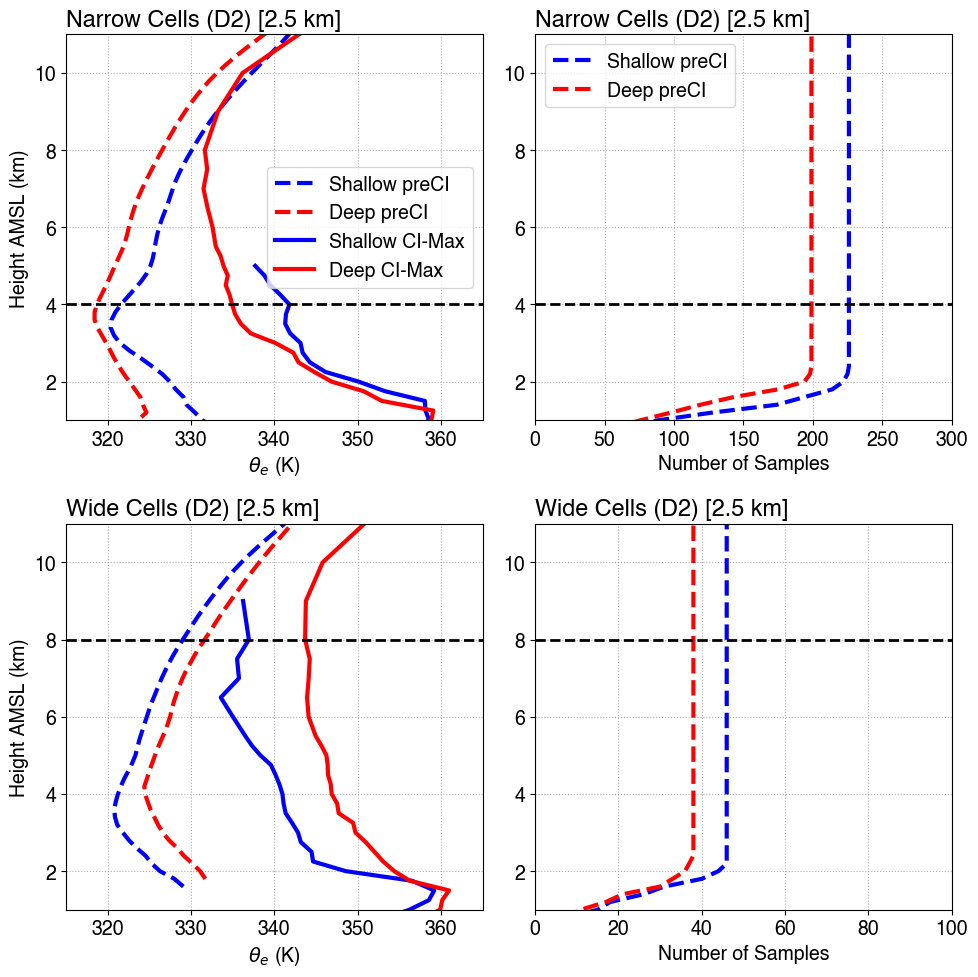

In [ ]:
# min_ns_prof = 50
min_ns_prof = 30

prof1 = [
    [{'d':ThetaE_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > min_ns_prof), 's':ThetaE_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > min_ns_prof)},
     {'d':ns_narrow_deep_prof_d2, 's':ns_narrow_shallow_prof_d2}],
    [{'d':ThetaE_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > min_ns_prof), 's':ThetaE_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > min_ns_prof)},
     {'d':ns_wide_deep_prof_d2, 's':ns_wide_shallow_prof_d2}],
]
prof2 = [
    [{'d':MaxThetaE_narrow_deep_avg_d2, 's':MaxThetaE_narrow_shallow_avg_d2},
     {'d':nsMaxThetaE_narrow_deep_prof_d2, 's':nsMaxThetaE_narrow_shallow_prof_d2}],
    [{'d':MaxThetaE_wide_deep_avg_d2, 's':MaxThetaE_wide_shallow_avg_d2},
     {'d':nsMaxThetaE_wide_deep_prof_d2, 's':nsMaxThetaE_wide_shallow_prof_d2}],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d2],
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]]
# prof = [
#     [{'d':ThetaE_narrow_deep_med_d2.where(ns_narrow_deep_prof_d2 > min_ns_prof), 's':ThetaE_narrow_shallow_med_d2.where(ns_narrow_shallow_prof_d2 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d2, 's':ns_narrow_shallow_prof_d2}],
#     [{'d':ThetaE_wide_deep_med_d2.where(ns_wide_deep_prof_d2 > min_ns_prof), 's':ThetaE_wide_shallow_med_d2.where(ns_wide_shallow_prof_d2 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d2, 's':ns_wide_shallow_prof_d2}],
# ]
# inqt25_w_d = ThetaE_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > min_ns_prof)
# inqt75_w_d = ThetaE_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > min_ns_prof)
# inqt25_w_s = ThetaE_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > min_ns_prof)
# inqt75_w_s = ThetaE_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > min_ns_prof)
# inqt25_n_d = ThetaE_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > min_ns_prof)
# inqt75_n_d = ThetaE_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > min_ns_prof)
# inqt25_n_s = ThetaE_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > min_ns_prof)
# inqt75_n_s = ThetaE_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof1)
ncol = len(prof1[0])
# nrow, ncol
xlabels = [
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
    ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
]
ylims = (1,11)
xlims = [
    [(315, 365), (0,300)],
    [(315, 365), (0,100)],
]
legend_show = [[True,True],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}PreCI_CIMax_Profile_NarrowWide_ThetaE_d2.png'
print(figname)
fig = plot_mxn_profs(nrow, ncol, prof1, prof2, height/1e3, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

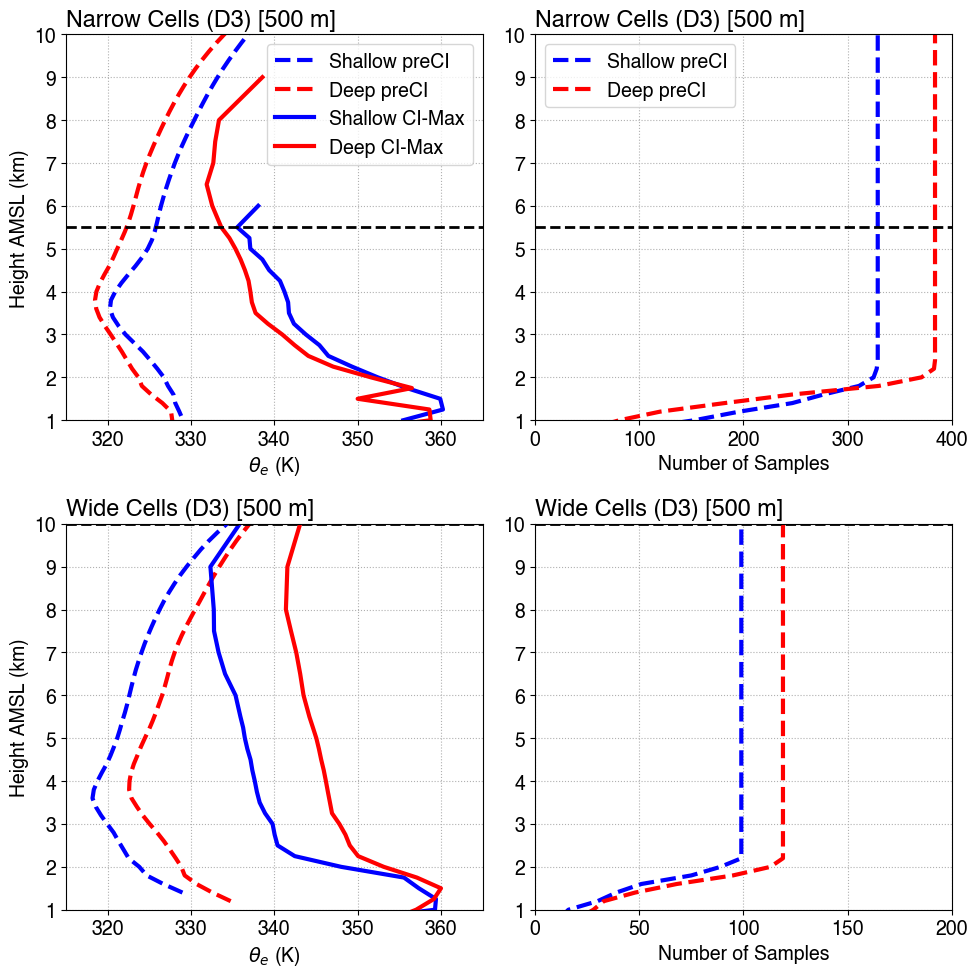

In [ ]:
prof1 = [
    [{'d':ThetaE_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > min_ns_prof), 's':ThetaE_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > min_ns_prof)},
     {'d':ns_narrow_deep_prof_d3, 's':ns_narrow_shallow_prof_d3}],
    [{'d':ThetaE_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > min_ns_prof), 's':ThetaE_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > min_ns_prof)},
     {'d':ns_wide_deep_prof_d3, 's':ns_wide_shallow_prof_d3}],
]
prof2 = [
    [{'d':MaxThetaE_narrow_deep_avg_d3, 's':MaxThetaE_narrow_shallow_avg_d3},
     {'d':nsMaxThetaE_narrow_deep_prof_d3, 's':nsMaxThetaE_narrow_shallow_prof_d3}],
    [{'d':MaxThetaE_wide_deep_avg_d3, 's':MaxThetaE_wide_shallow_avg_d3},
     {'d':nsMaxThetaE_wide_deep_prof_d3, 's':nsMaxThetaE_wide_shallow_prof_d3}],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d3],
            [wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]]
nrow = len(prof1)
ncol = len(prof1[0])
# nrow, ncol
xlabels = [
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
    ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
]
ylims = (1,10)
xlims = [
    [(315, 365), (0,400)],
    [(315, 365), (0,200)],
]
legend_show = [[True,True],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}PreCI_CIMax_Profile_NarrowWide_ThetaE_d3.png'
fig = plot_mxn_profs(nrow, ncol, prof1, prof2, height/1e3, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

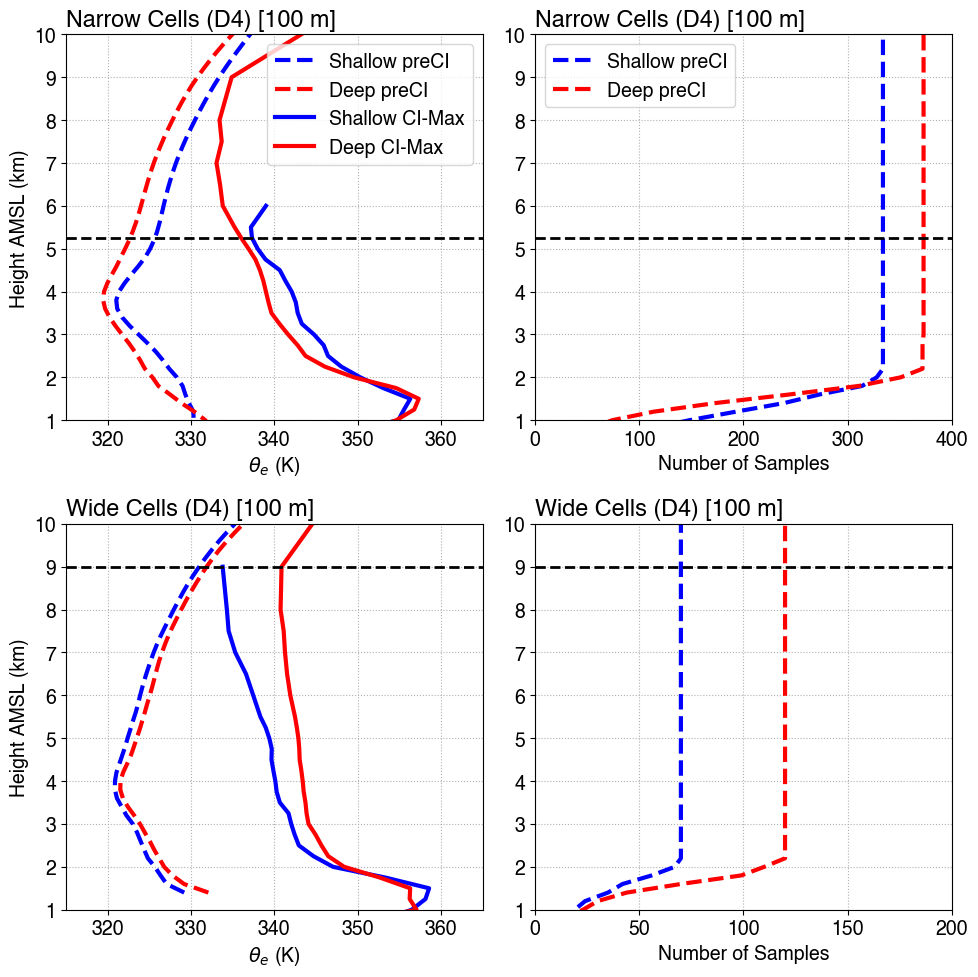

In [ ]:
prof1 = [
    [{'d':ThetaE_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > min_ns_prof), 's':ThetaE_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > min_ns_prof)},
     {'d':ns_narrow_deep_prof_d4, 's':ns_narrow_shallow_prof_d4}],
    [{'d':ThetaE_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > min_ns_prof), 's':ThetaE_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > min_ns_prof)},
     {'d':ns_wide_deep_prof_d4, 's':ns_wide_shallow_prof_d4}],
]
prof2 = [
    [{'d':MaxThetaE_narrow_deep_avg_d4, 's':MaxThetaE_narrow_shallow_avg_d4},
     {'d':nsMaxThetaE_narrow_deep_prof_d4, 's':nsMaxThetaE_narrow_shallow_prof_d4}],
    [{'d':MaxThetaE_wide_deep_avg_d4, 's':MaxThetaE_wide_shallow_avg_d4},
     {'d':nsMaxThetaE_wide_deep_prof_d4, 's':nsMaxThetaE_wide_shallow_prof_d4}],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d4, narrow_maxETH10dbz_thresh_d4],
            [wide_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]]
nrow = len(prof1)
ncol = len(prof1[0])
# nrow, ncol
xlabels = [
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
    ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
]
ylims = (1,10)
xlims = [
    [(315, 365), (0,400)],
    [(315, 365), (0,200)],
]
legend_show = [[True,True],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}PreCI_CIMax_Profile_NarrowWide_ThetaE_d4.png'
fig = plot_mxn_profs(nrow, ncol, prof1, prof2, height/1e3, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

## Function to plot MxN panel profiles & shading

In [ ]:
def plot_mxn_prof_shading(nrow, ncol, prof, inqt, height, 
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None, name_map=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    # lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
    lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'-', 'max':'-'}
    lw = 3
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof_data = prof[row][col]
            # prof2_data = prof2[row][col]
            inqt_data = inqt[row][col]
            ax.plot(prof_data['s'], height, color=lcolors['s'], label=name_map['s'], lw=lw, ls=lstyles['min'])
            ax.plot(prof_data['d'], height, color=lcolors['d'], label=name_map['d'], lw=lw, ls=lstyles['min'])
            # if col == 0:
                # ax.plot(prof2_data['s'], height_core, color=lcolors['s'], label=name_map2['s'], lw=lw, ls=lstyles['max'])
                # ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])
            ax.fill_betweenx(height, inqt_data['s'][0], inqt_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
            ax.fill_betweenx(height, inqt_data['d'][0], inqt_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row][col]
                ax.axhline(_z_thresh, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

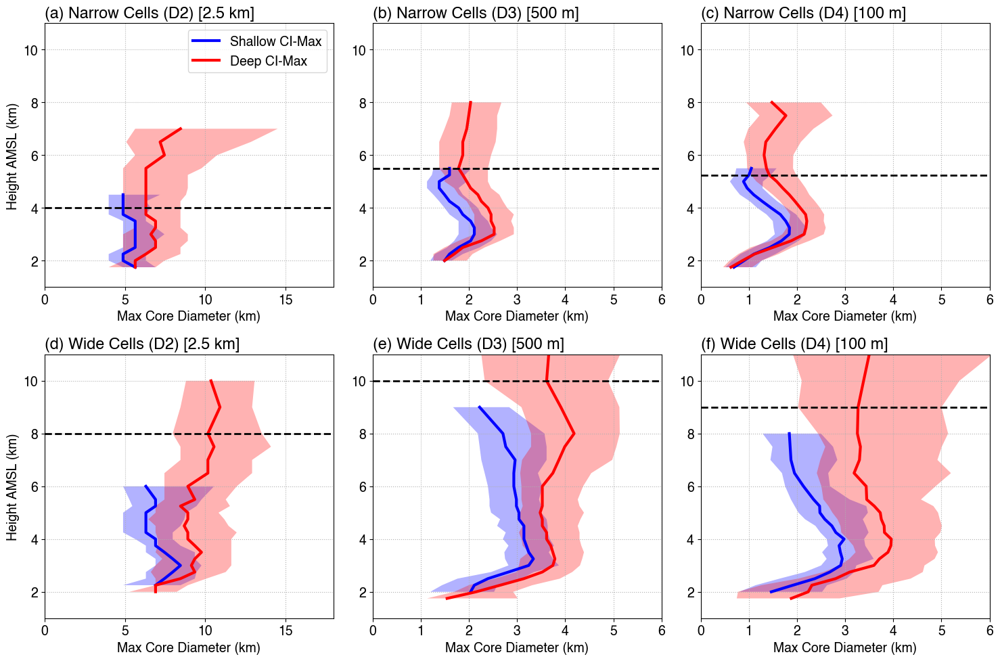

In [ ]:
THRESH = 30

# Median profiles
med_w_d_d2 = MaxCoreDiam_wide_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
med_w_d_d3 = MaxCoreDiam_wide_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
med_w_d_d4 = MaxCoreDiam_wide_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
med_w_s_d2 = MaxCoreDiam_wide_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
med_w_s_d3 = MaxCoreDiam_wide_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
med_w_s_d4 = MaxCoreDiam_wide_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)

med_n_d_d2 = MaxCoreDiam_narrow_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
med_n_d_d3 = MaxCoreDiam_narrow_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
med_n_d_d4 = MaxCoreDiam_narrow_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
med_n_s_d2 = MaxCoreDiam_narrow_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
med_n_s_d3 = MaxCoreDiam_narrow_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
med_n_s_d4 = MaxCoreDiam_narrow_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
# prof = [
#     [{'d':MaxCoreDiam_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH), 's':MaxCoreDiam_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)},
#      {'d':MaxCoreDiam_narrow_deep_avg_d3.where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH), 's':MaxCoreDiam_narrow_shallow_avg_d3.where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)},
#      {'d':MaxCoreDiam_narrow_deep_avg_d4.where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH), 's':MaxCoreDiam_narrow_shallow_avg_d4.where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)},],
#     [{'d':MaxCoreDiam_wide_deep_avg_d2.where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH), 's':MaxCoreDiam_wide_shallow_avg_d2.where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)},
#      {'d':MaxCoreDiam_wide_deep_avg_d3.where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH), 's':MaxCoreDiam_wide_shallow_avg_d3.where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)},
#      {'d':MaxCoreDiam_wide_deep_avg_d4.where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH), 's':MaxCoreDiam_wide_shallow_avg_d4.where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)},],
# ]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = MaxCoreDiam_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = MaxCoreDiam_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = MaxCoreDiam_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = MaxCoreDiam_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = MaxCoreDiam_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = MaxCoreDiam_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = MaxCoreDiam_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = MaxCoreDiam_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = MaxCoreDiam_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = MaxCoreDiam_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = MaxCoreDiam_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = MaxCoreDiam_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = MaxCoreDiam_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = MaxCoreDiam_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = MaxCoreDiam_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = MaxCoreDiam_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = MaxCoreDiam_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = MaxCoreDiam_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = MaxCoreDiam_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = MaxCoreDiam_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = MaxCoreDiam_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = MaxCoreDiam_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = MaxCoreDiam_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = MaxCoreDiam_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['Max Core Diameter (km)']*ncol,
    ['Max Core Diameter (km)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
ylims = (1,11)
xlims = [
    [(0, 18), (0,6), (0,6),],
    [(0, 18), (0,6), (0,6),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreDiam_d2_d3_d4.png'
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

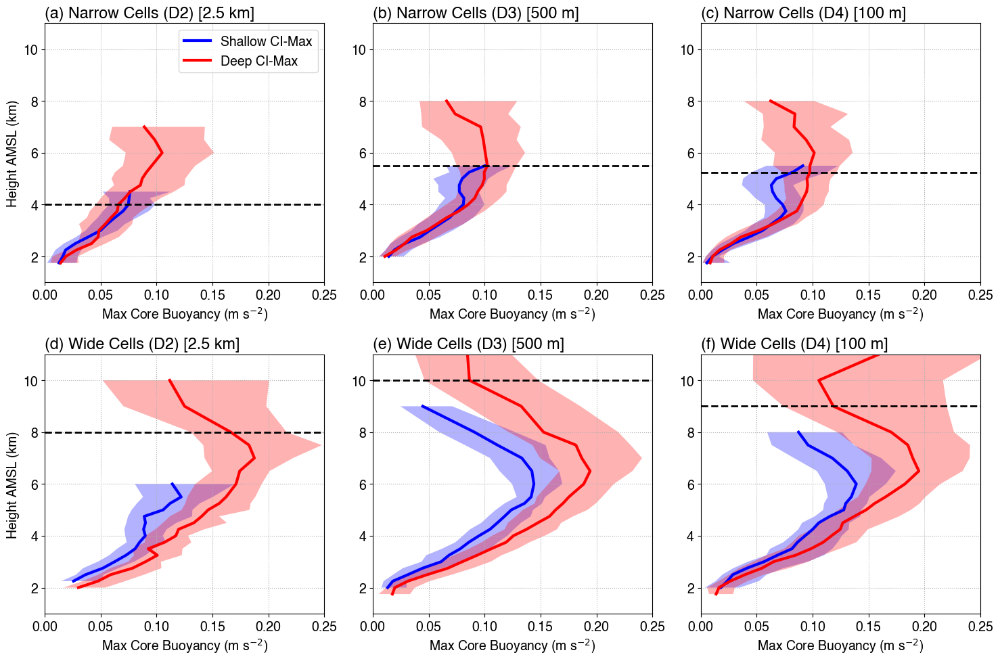

In [ ]:
THRESH = 30
# Median profiles
med_w_d_d2 = MaxCoreBuoyThtv_wide_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
med_w_d_d3 = MaxCoreBuoyThtv_wide_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
med_w_d_d4 = MaxCoreBuoyThtv_wide_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
med_w_s_d2 = MaxCoreBuoyThtv_wide_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
med_w_s_d3 = MaxCoreBuoyThtv_wide_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
med_w_s_d4 = MaxCoreBuoyThtv_wide_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)

med_n_d_d2 = MaxCoreBuoyThtv_narrow_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
med_n_d_d3 = MaxCoreBuoyThtv_narrow_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
med_n_d_d4 = MaxCoreBuoyThtv_narrow_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
med_n_s_d2 = MaxCoreBuoyThtv_narrow_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
med_n_s_d3 = MaxCoreBuoyThtv_narrow_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
med_n_s_d4 = MaxCoreBuoyThtv_narrow_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = MaxCoreBuoyThtv_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = MaxCoreBuoyThtv_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = MaxCoreBuoyThtv_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = MaxCoreBuoyThtv_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = MaxCoreBuoyThtv_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = MaxCoreBuoyThtv_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = MaxCoreBuoyThtv_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = MaxCoreBuoyThtv_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = MaxCoreBuoyThtv_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = MaxCoreBuoyThtv_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = MaxCoreBuoyThtv_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = MaxCoreBuoyThtv_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = MaxCoreBuoyThtv_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = MaxCoreBuoyThtv_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = MaxCoreBuoyThtv_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = MaxCoreBuoyThtv_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = MaxCoreBuoyThtv_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = MaxCoreBuoyThtv_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = MaxCoreBuoyThtv_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = MaxCoreBuoyThtv_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = MaxCoreBuoyThtv_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = MaxCoreBuoyThtv_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = MaxCoreBuoyThtv_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = MaxCoreBuoyThtv_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
    ['Max Core Buoyancy (m s$^{-2}$)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
ylims = (1,11)
xlims = [
    [(0,0.25), (0,0.25), (0,0.25),],
    [(0,0.25), (0,0.25), (0,0.25),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMaxBuoyancy_d2_d3_d4.png'
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

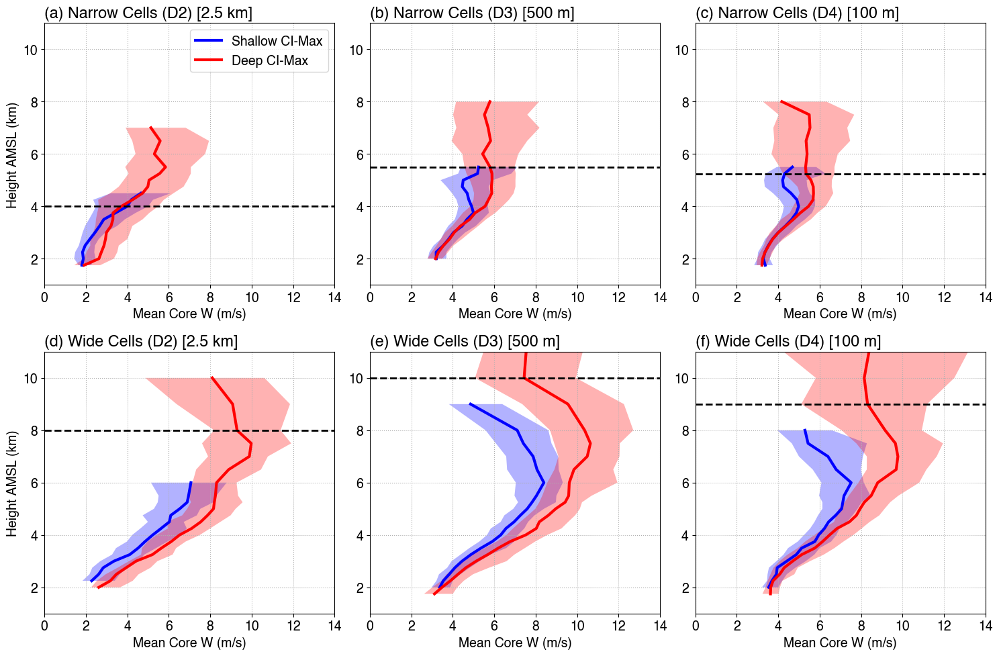

In [ ]:
THRESH = 30
# Median profiles
med_w_d_d2 = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
med_w_d_d3 = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
med_w_d_d4 = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
med_w_s_d2 = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
med_w_s_d3 = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
med_w_s_d4 = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)

med_n_d_d2 = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
med_n_d_d3 = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
med_n_d_d4 = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
med_n_s_d2 = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
med_n_s_d3 = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
med_n_s_d4 = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['Mean Core W (m/s)']*ncol,
    ['Mean Core W (m/s)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
ylims = (1,11)
xlims = [
    [(0,14), (0,14), (0,14),],
    [(0,14), (0,14), (0,14),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMeanW_d2_d3_d4.png'
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# THRESH = 30
# prof = [
#     [{'d':MaxCoreMeanW_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH), 's':MaxCoreMeanW_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)},
#      {'d':MaxCoreMeanW_narrow_deep_avg_d3.where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH), 's':MaxCoreMeanW_narrow_shallow_avg_d3.where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)},
#      {'d':MaxCoreMeanW_narrow_deep_avg_d4.where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH), 's':MaxCoreMeanW_narrow_shallow_avg_d4.where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)},],
#     [{'d':MaxCoreMeanW_wide_deep_avg_d2.where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH), 's':MaxCoreMeanW_wide_shallow_avg_d2.where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)},
#      {'d':MaxCoreMeanW_wide_deep_avg_d3.where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH), 's':MaxCoreMeanW_wide_shallow_avg_d3.where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)},
#      {'d':MaxCoreMeanW_wide_deep_avg_d4.where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH), 's':MaxCoreMeanW_wide_shallow_avg_d4.where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)},],
# ]
# z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
#             [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
# inqt25_w_d_d2 = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
# inqt75_w_d_d2 = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
# inqt25_w_s_d2 = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
# inqt75_w_s_d2 = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
# inqt25_n_d_d2 = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
# inqt75_n_d_d2 = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
# inqt25_n_s_d2 = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
# inqt75_n_s_d2 = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)

# inqt25_w_d_d3 = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
# inqt75_w_d_d3 = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
# inqt25_w_s_d3 = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
# inqt75_w_s_d3 = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
# inqt25_n_d_d3 = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
# inqt75_n_d_d3 = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
# inqt25_n_s_d3 = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
# inqt75_n_s_d3 = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)

# inqt25_w_d_d4 = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
# inqt75_w_d_d4 = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
# inqt25_w_s_d4 = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
# inqt75_w_s_d4 = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
# inqt25_n_d_d4 = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
# inqt75_n_d_d4 = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
# inqt25_n_s_d4 = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
# inqt75_n_s_d4 = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

# inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
#          {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
#          {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
#         [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
#          {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
#          {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Core Mean W (m/s)']*ncol,
#     ['Core Mean W (m/s)']*ncol,
# ]
# ylabels = [
#     ['Height AMSL (km)', '', ''],
#     ['Height AMSL (km)', '', ''],
# ]
# titles = [
#     ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
#     ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
# ]
# name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
# ylims = (1,10)
# xlims = [
#     [(0,14), (0,14), (0,14),],
#     [(0,14), (0,14), (0,14),],
# ]
# fontsize = 14
# figsize = [15, 10]
# figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMeanW_d2_d3_d4.png'
# fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/CIMax_Profile_NarrowWide_MassFlux_d2_d3_d4.png


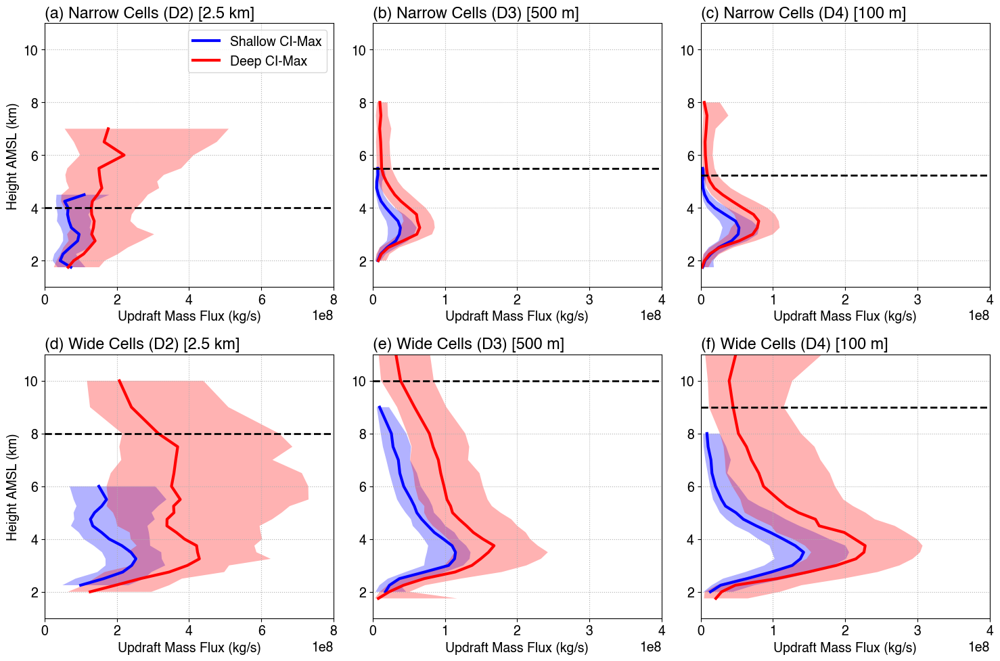

In [ ]:
THRESH = 30
# Median profiles
med_w_d_d2 = MaxMassFlux_wide_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
med_w_d_d3 = MaxMassFlux_wide_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
med_w_d_d4 = MaxMassFlux_wide_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
med_w_s_d2 = MaxMassFlux_wide_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
med_w_s_d3 = MaxMassFlux_wide_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
med_w_s_d4 = MaxMassFlux_wide_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)

med_n_d_d2 = MaxMassFlux_narrow_deep_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
med_n_d_d3 = MaxMassFlux_narrow_deep_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
med_n_d_d4 = MaxMassFlux_narrow_deep_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
med_n_s_d2 = MaxMassFlux_narrow_shallow_inqt_d2.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
med_n_s_d3 = MaxMassFlux_narrow_shallow_inqt_d3.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
med_n_s_d4 = MaxMassFlux_narrow_shallow_inqt_d4.sel(quantile=0.5).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]
# prof = [
#     [{'d':MaxMassFlux_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH), 's':MaxMassFlux_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)},
#      {'d':MaxMassFlux_narrow_deep_avg_d3.where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH), 's':MaxMassFlux_narrow_shallow_avg_d3.where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)},
#      {'d':MaxMassFlux_narrow_deep_avg_d4.where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH), 's':MaxMassFlux_narrow_shallow_avg_d4.where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)},],
#     [{'d':MaxMassFlux_wide_deep_avg_d2.where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH), 's':MaxMassFlux_wide_shallow_avg_d2.where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)},
#      {'d':MaxMassFlux_wide_deep_avg_d3.where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH), 's':MaxMassFlux_wide_shallow_avg_d3.where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)},
#      {'d':MaxMassFlux_wide_deep_avg_d4.where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH), 's':MaxMassFlux_wide_shallow_avg_d4.where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)},],
# ]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = MaxMassFlux_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = MaxMassFlux_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = MaxMassFlux_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = MaxMassFlux_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = MaxMassFlux_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = MaxMassFlux_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = MaxMassFlux_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = MaxMassFlux_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = MaxMassFlux_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = MaxMassFlux_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = MaxMassFlux_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = MaxMassFlux_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = MaxMassFlux_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = MaxMassFlux_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = MaxMassFlux_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = MaxMassFlux_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = MaxMassFlux_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = MaxMassFlux_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = MaxMassFlux_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = MaxMassFlux_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = MaxMassFlux_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = MaxMassFlux_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = MaxMassFlux_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = MaxMassFlux_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['Updraft Mass Flux (kg/s)']*ncol,
    ['Updraft Mass Flux (kg/s)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
ylims = (1,11)
xlims = [
    [(0,8e8), (0,4e8), (0,4e8),],
    [(0,8e8), (0,4e8), (0,4e8),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_MassFlux_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# min_ns_prof = 20
# prof = [
#     [{'d':MaxMassFlux_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > min_ns_prof), 's':MaxMassFlux_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > min_ns_prof)},
#      {'d':MaxMassFlux_narrow_deep_avg_d3.where(nsMaxCoreDiam_narrow_deep_prof_d3 > min_ns_prof), 's':MaxMassFlux_narrow_shallow_avg_d3.where(nsMaxCoreDiam_narrow_shallow_prof_d3 > min_ns_prof)},
#      {'d':MaxMassFlux_narrow_deep_avg_d4.where(nsMaxCoreDiam_narrow_deep_prof_d4 > min_ns_prof), 's':MaxMassFlux_narrow_shallow_avg_d4.where(nsMaxCoreDiam_narrow_shallow_prof_d4 > min_ns_prof)},],
#     [{'d':MaxMassFlux_wide_deep_avg_d2.where(nsMaxCoreDiam_wide_deep_prof_d2 > min_ns_prof), 's':MaxMassFlux_wide_shallow_avg_d2.where(nsMaxCoreDiam_wide_shallow_prof_d2 > min_ns_prof)},
#      {'d':MaxMassFlux_wide_deep_avg_d3.where(nsMaxCoreDiam_wide_deep_prof_d3 > min_ns_prof), 's':MaxMassFlux_wide_shallow_avg_d3.where(nsMaxCoreDiam_wide_shallow_prof_d3 > min_ns_prof)},
#      {'d':MaxMassFlux_wide_deep_avg_d4.where(nsMaxCoreDiam_wide_deep_prof_d4 > min_ns_prof), 's':MaxMassFlux_wide_shallow_avg_d4.where(nsMaxCoreDiam_wide_shallow_prof_d4 > min_ns_prof)},],
# ]
# z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
#             [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
# inqt25_w_d_d2 = MaxMassFlux_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > min_ns_prof)
# inqt75_w_d_d2 = MaxMassFlux_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > min_ns_prof)
# inqt25_w_s_d2 = MaxMassFlux_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > min_ns_prof)
# inqt75_w_s_d2 = MaxMassFlux_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > min_ns_prof)
# inqt25_n_d_d2 = MaxMassFlux_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > min_ns_prof)
# inqt75_n_d_d2 = MaxMassFlux_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > min_ns_prof)
# inqt25_n_s_d2 = MaxMassFlux_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > min_ns_prof)
# inqt75_n_s_d2 = MaxMassFlux_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > min_ns_prof)

# inqt25_w_d_d3 = MaxMassFlux_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > min_ns_prof)
# inqt75_w_d_d3 = MaxMassFlux_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > min_ns_prof)
# inqt25_w_s_d3 = MaxMassFlux_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > min_ns_prof)
# inqt75_w_s_d3 = MaxMassFlux_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > min_ns_prof)
# inqt25_n_d_d3 = MaxMassFlux_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > min_ns_prof)
# inqt75_n_d_d3 = MaxMassFlux_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > min_ns_prof)
# inqt25_n_s_d3 = MaxMassFlux_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > min_ns_prof)
# inqt75_n_s_d3 = MaxMassFlux_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > min_ns_prof)

# inqt25_w_d_d4 = MaxMassFlux_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > min_ns_prof)
# inqt75_w_d_d4 = MaxMassFlux_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > min_ns_prof)
# inqt25_w_s_d4 = MaxMassFlux_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > min_ns_prof)
# inqt75_w_s_d4 = MaxMassFlux_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > min_ns_prof)
# inqt25_n_d_d4 = MaxMassFlux_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > min_ns_prof)
# inqt75_n_d_d4 = MaxMassFlux_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > min_ns_prof)
# inqt25_n_s_d4 = MaxMassFlux_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > min_ns_prof)
# inqt75_n_s_d4 = MaxMassFlux_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > min_ns_prof)

# inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
#          {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
#          {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
#         [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
#          {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
#          {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Mass Flux (kg/s)']*ncol,
#     ['Mass Flux (kg/s)']*ncol,
# ]
# ylabels = [
#     ['Height AMSL (km)', '', ''],
#     ['Height AMSL (km)', '', ''],
# ]
# titles = [
#     ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
#     ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
# ]
# name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
# ylims = (1,10)
# xlims = [
#     [(0,8e8), (0,4e8), (0,4e8),],
#     [(0,8e8), (0,4e8), (0,4e8),],
# ]
# fontsize = 14
# figsize = [15, 10]
# figname = f'{figdir}CIMax_Profile_NarrowWide_MassFlux_d2_d3_d4.png'
# print(figname)
# fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/PreCI_Profile_NarrowWide_RHmin_d2_d3_d4.png


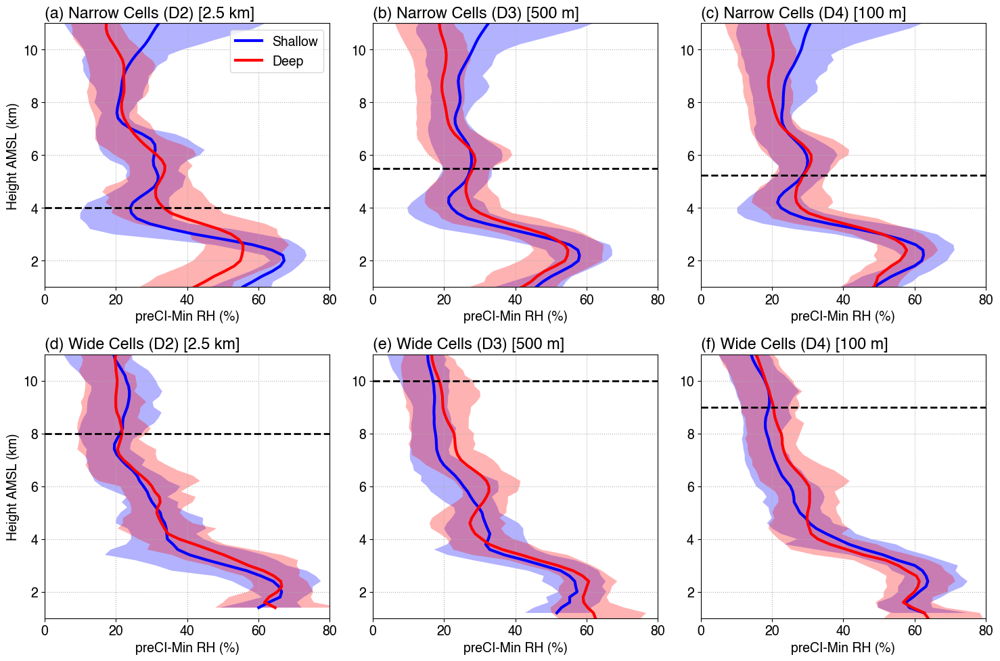

In [ ]:
THRESH = 20
prof = [
    [{'d':RHmin_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > THRESH), 's':RHmin_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > THRESH)},
     {'d':RHmin_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > THRESH), 's':RHmin_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > THRESH)},
     {'d':RHmin_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > THRESH), 's':RHmin_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > THRESH)},],
    [{'d':RHmin_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > THRESH), 's':RHmin_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > THRESH)},
     {'d':RHmin_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > THRESH), 's':RHmin_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > THRESH)},
     {'d':RHmin_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > THRESH), 's':RHmin_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > THRESH)},],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = RHmin_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = RHmin_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = RHmin_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = RHmin_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = RHmin_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = RHmin_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = RHmin_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = RHmin_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = RHmin_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = RHmin_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = RHmin_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = RHmin_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = RHmin_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = RHmin_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = RHmin_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = RHmin_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = RHmin_wide_deep_inqt_d4.sel(quantile=0.25).where(ns_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = RHmin_wide_deep_inqt_d4.sel(quantile=0.75).where(ns_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = RHmin_wide_shallow_inqt_d4.sel(quantile=0.25).where(ns_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = RHmin_wide_shallow_inqt_d4.sel(quantile=0.75).where(ns_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = RHmin_narrow_deep_inqt_d4.sel(quantile=0.25).where(ns_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = RHmin_narrow_deep_inqt_d4.sel(quantile=0.75).where(ns_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = RHmin_narrow_shallow_inqt_d4.sel(quantile=0.25).where(ns_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = RHmin_narrow_shallow_inqt_d4.sel(quantile=0.75).where(ns_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['preCI-Min RH (%)']*ncol,
    ['preCI-Min RH (%)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep', 's':'Shallow'}
ylims = (1,11)
xlims = [
    [(0,80), (0,80), (0,80),],
    [(0,80), (0,80), (0,80),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}PreCI_Profile_NarrowWide_RHmin_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/PreCI_Profile_NarrowWide_RHavg_d2_d3_d4.png


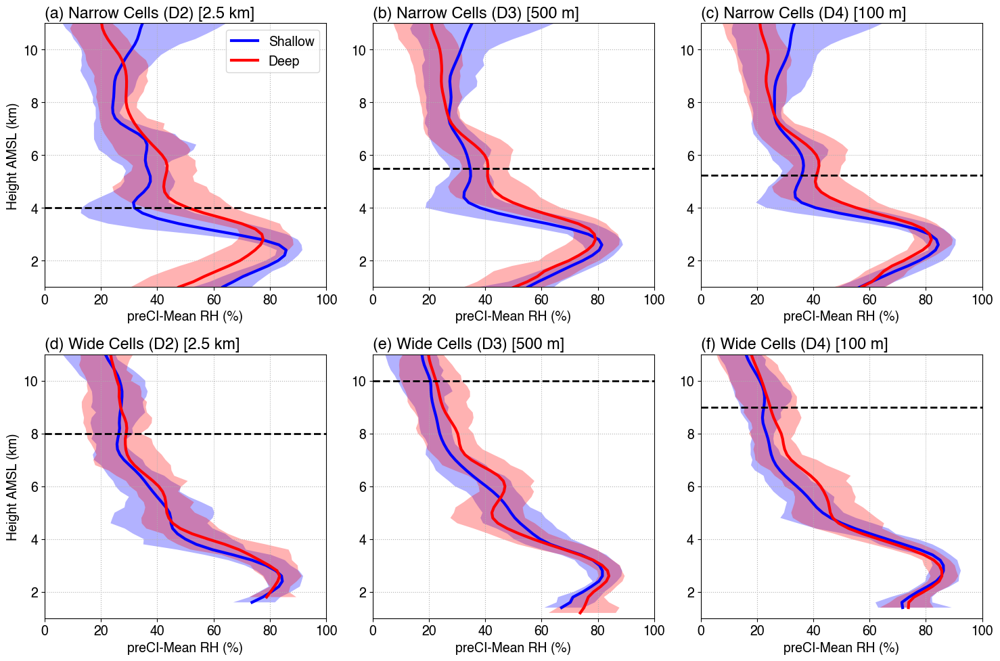

In [ ]:
THRESH = 30
prof = [
    [{'d':RHavg_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > THRESH), 's':RHavg_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > THRESH)},
     {'d':RHavg_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > THRESH), 's':RHavg_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > THRESH)},
     {'d':RHavg_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > THRESH), 's':RHavg_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > THRESH)},],
    [{'d':RHavg_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > THRESH), 's':RHavg_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > THRESH)},
     {'d':RHavg_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > THRESH), 's':RHavg_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > THRESH)},
     {'d':RHavg_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > THRESH), 's':RHavg_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > THRESH)},],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = RHavg_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = RHavg_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = RHavg_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = RHavg_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = RHavg_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = RHavg_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = RHavg_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = RHavg_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = RHavg_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = RHavg_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = RHavg_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = RHavg_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = RHavg_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = RHavg_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = RHavg_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = RHavg_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = RHavg_wide_deep_inqt_d4.sel(quantile=0.25).where(ns_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = RHavg_wide_deep_inqt_d4.sel(quantile=0.75).where(ns_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = RHavg_wide_shallow_inqt_d4.sel(quantile=0.25).where(ns_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = RHavg_wide_shallow_inqt_d4.sel(quantile=0.75).where(ns_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = RHavg_narrow_deep_inqt_d4.sel(quantile=0.25).where(ns_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = RHavg_narrow_deep_inqt_d4.sel(quantile=0.75).where(ns_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = RHavg_narrow_shallow_inqt_d4.sel(quantile=0.25).where(ns_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = RHavg_narrow_shallow_inqt_d4.sel(quantile=0.75).where(ns_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['preCI-Mean RH (%)']*ncol,
    ['preCI-Mean RH (%)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep', 's':'Shallow'}
ylims = (1,11)
xlims = [
    [(0,100), (0,100), (0,100),],
    [(0,100), (0,100), (0,100),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}PreCI_Profile_NarrowWide_RHavg_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/CIMean_Profile_NarrowWide_CoreShellRH_d2_d3_d4.png


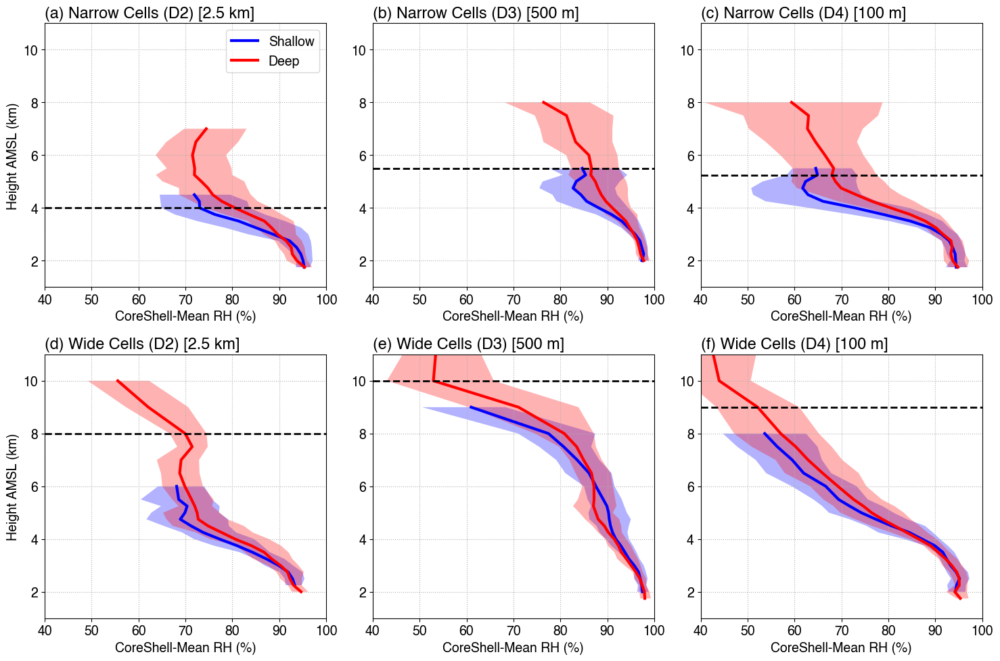

In [ ]:
THRESH = 30
prof = [
    [{'d':AvgCoreRHprm_narrow_deep_avg_d2.where(nsAvgCoreRHprm_narrow_deep_prof_d2 > THRESH), 's':AvgCoreRHprm_narrow_shallow_avg_d2.where(nsAvgCoreRHprm_narrow_shallow_prof_d2 > THRESH)},
     {'d':AvgCoreRHprm_narrow_deep_avg_d3.where(nsAvgCoreRHprm_narrow_deep_prof_d3 > THRESH), 's':AvgCoreRHprm_narrow_shallow_avg_d3.where(nsAvgCoreRHprm_narrow_shallow_prof_d3 > THRESH)},
     {'d':AvgCoreRHprm_narrow_deep_avg_d4.where(nsAvgCoreRHprm_narrow_deep_prof_d4 > THRESH), 's':AvgCoreRHprm_narrow_shallow_avg_d4.where(nsAvgCoreRHprm_narrow_shallow_prof_d4 > THRESH)},],
    [{'d':AvgCoreRHprm_wide_deep_avg_d2.where(nsAvgCoreRHprm_wide_deep_prof_d2 > THRESH), 's':AvgCoreRHprm_wide_shallow_avg_d2.where(nsAvgCoreRHprm_wide_shallow_prof_d2 > THRESH)},
     {'d':AvgCoreRHprm_wide_deep_avg_d3.where(nsAvgCoreRHprm_wide_deep_prof_d3 > THRESH), 's':AvgCoreRHprm_wide_shallow_avg_d3.where(nsAvgCoreRHprm_wide_shallow_prof_d3 > THRESH)},
     {'d':AvgCoreRHprm_wide_deep_avg_d4.where(nsAvgCoreRHprm_wide_deep_prof_d4 > THRESH), 's':AvgCoreRHprm_wide_shallow_avg_d4.where(nsAvgCoreRHprm_wide_shallow_prof_d4 > THRESH)},],
]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = AvgCoreRHprm_wide_deep_inqt_d2.sel(quantile=0.25).where(nsAvgCoreRHprm_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = AvgCoreRHprm_wide_deep_inqt_d2.sel(quantile=0.75).where(nsAvgCoreRHprm_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = AvgCoreRHprm_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsAvgCoreRHprm_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = AvgCoreRHprm_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsAvgCoreRHprm_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = AvgCoreRHprm_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsAvgCoreRHprm_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = AvgCoreRHprm_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsAvgCoreRHprm_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = AvgCoreRHprm_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsAvgCoreRHprm_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = AvgCoreRHprm_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsAvgCoreRHprm_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = AvgCoreRHprm_wide_deep_inqt_d3.sel(quantile=0.25).where(nsAvgCoreRHprm_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = AvgCoreRHprm_wide_deep_inqt_d3.sel(quantile=0.75).where(nsAvgCoreRHprm_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = AvgCoreRHprm_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsAvgCoreRHprm_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = AvgCoreRHprm_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsAvgCoreRHprm_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = AvgCoreRHprm_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsAvgCoreRHprm_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = AvgCoreRHprm_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsAvgCoreRHprm_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = AvgCoreRHprm_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsAvgCoreRHprm_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = AvgCoreRHprm_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsAvgCoreRHprm_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = AvgCoreRHprm_wide_deep_inqt_d4.sel(quantile=0.25).where(nsAvgCoreRHprm_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = AvgCoreRHprm_wide_deep_inqt_d4.sel(quantile=0.75).where(nsAvgCoreRHprm_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = AvgCoreRHprm_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsAvgCoreRHprm_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = AvgCoreRHprm_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsAvgCoreRHprm_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = AvgCoreRHprm_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsAvgCoreRHprm_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = AvgCoreRHprm_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsAvgCoreRHprm_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = AvgCoreRHprm_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsAvgCoreRHprm_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = AvgCoreRHprm_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsAvgCoreRHprm_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['CoreShell-Mean RH (%)']*ncol,
    ['CoreShell-Mean RH (%)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep', 's':'Shallow'}
ylims = (1,11)
xlims = [
    [(40,100), (40,100), (40,100),],
    [(40,100), (40,100), (40,100),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMean_Profile_NarrowWide_CoreShellRH_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/CIMean_Profile_NarrowWide_CoreShellThetaE_d2_d3_d4.png


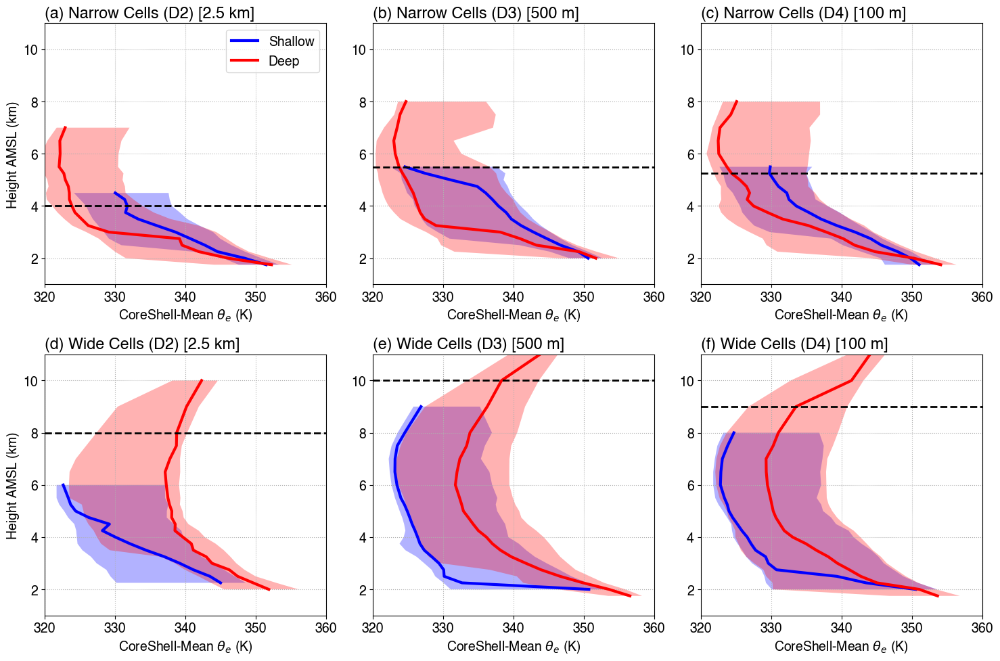

In [ ]:
THRESH = 30

# Median profiles
med_w_d_d2 = AvgCoreThteprm_wide_deep_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThteprm_wide_deep_prof_d2 > THRESH)
med_w_d_d3 = AvgCoreThteprm_wide_deep_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThteprm_wide_deep_prof_d3 > THRESH)
med_w_d_d4 = AvgCoreThteprm_wide_deep_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThteprm_wide_deep_prof_d4 > THRESH)
med_w_s_d2 = AvgCoreThteprm_wide_shallow_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThteprm_wide_shallow_prof_d2 > THRESH)
med_w_s_d3 = AvgCoreThteprm_wide_shallow_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThteprm_wide_shallow_prof_d3 > THRESH)
med_w_s_d4 = AvgCoreThteprm_wide_shallow_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThteprm_wide_shallow_prof_d4 > THRESH)

med_n_d_d2 = AvgCoreThteprm_narrow_deep_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThteprm_narrow_deep_prof_d2 > THRESH)
med_n_d_d3 = AvgCoreThteprm_narrow_deep_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThteprm_narrow_deep_prof_d3 > THRESH)
med_n_d_d4 = AvgCoreThteprm_narrow_deep_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThteprm_narrow_deep_prof_d4 > THRESH)
med_n_s_d2 = AvgCoreThteprm_narrow_shallow_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThteprm_narrow_shallow_prof_d2 > THRESH)
med_n_s_d3 = AvgCoreThteprm_narrow_shallow_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThteprm_narrow_shallow_prof_d3 > THRESH)
med_n_s_d4 = AvgCoreThteprm_narrow_shallow_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThteprm_narrow_shallow_prof_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]

# prof = [
#     [{'d':AvgCoreThteprm_narrow_deep_avg_d2.where(nsAvgCoreThteprm_narrow_deep_prof_d2 > THRESH), 's':AvgCoreThteprm_narrow_shallow_avg_d2.where(nsAvgCoreThteprm_narrow_shallow_prof_d2 > THRESH)},
#      {'d':AvgCoreThteprm_narrow_deep_avg_d3.where(nsAvgCoreThteprm_narrow_deep_prof_d3 > THRESH), 's':AvgCoreThteprm_narrow_shallow_avg_d3.where(nsAvgCoreThteprm_narrow_shallow_prof_d3 > THRESH)},
#      {'d':AvgCoreThteprm_narrow_deep_avg_d4.where(nsAvgCoreThteprm_narrow_deep_prof_d4 > THRESH), 's':AvgCoreThteprm_narrow_shallow_avg_d4.where(nsAvgCoreThteprm_narrow_shallow_prof_d4 > THRESH)},],
#     [{'d':AvgCoreThteprm_wide_deep_avg_d2.where(nsAvgCoreThteprm_wide_deep_prof_d2 > THRESH), 's':AvgCoreThteprm_wide_shallow_avg_d2.where(nsAvgCoreThteprm_wide_shallow_prof_d2 > THRESH)},
#      {'d':AvgCoreThteprm_wide_deep_avg_d3.where(nsAvgCoreThteprm_wide_deep_prof_d3 > THRESH), 's':AvgCoreThteprm_wide_shallow_avg_d3.where(nsAvgCoreThteprm_wide_shallow_prof_d3 > THRESH)},
#      {'d':AvgCoreThteprm_wide_deep_avg_d4.where(nsAvgCoreThteprm_wide_deep_prof_d4 > THRESH), 's':AvgCoreThteprm_wide_shallow_avg_d4.where(nsAvgCoreThteprm_wide_shallow_prof_d4 > THRESH)},],
# ]
z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = AvgCoreThteprm_wide_deep_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThteprm_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = AvgCoreThteprm_wide_deep_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThteprm_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = AvgCoreThteprm_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThteprm_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = AvgCoreThteprm_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThteprm_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = AvgCoreThteprm_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThteprm_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = AvgCoreThteprm_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThteprm_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = AvgCoreThteprm_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThteprm_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = AvgCoreThteprm_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThteprm_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = AvgCoreThteprm_wide_deep_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThteprm_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = AvgCoreThteprm_wide_deep_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThteprm_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = AvgCoreThteprm_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThteprm_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = AvgCoreThteprm_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThteprm_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = AvgCoreThteprm_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThteprm_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = AvgCoreThteprm_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThteprm_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = AvgCoreThteprm_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThteprm_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = AvgCoreThteprm_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThteprm_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = AvgCoreThteprm_wide_deep_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThteprm_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = AvgCoreThteprm_wide_deep_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThteprm_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = AvgCoreThteprm_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThteprm_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = AvgCoreThteprm_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThteprm_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = AvgCoreThteprm_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThteprm_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = AvgCoreThteprm_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThteprm_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = AvgCoreThteprm_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThteprm_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = AvgCoreThteprm_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThteprm_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['CoreShell-Mean '+r'$\theta_e$ (K)']*ncol,
    ['CoreShell-Mean '+r'$\theta_e$ (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep', 's':'Shallow'}
ylims = (1,11)
xlims = [
    [(320,360), (320,360), (320,360),],
    [(320,360), (320,360), (320,360),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMean_Profile_NarrowWide_CoreShellThetaE_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

/gpfs/wolf2/arm/atm131/proj-shared/zfeng/cacti/les/figures_avgenv40km/narrow_wide_CI_2.5km+2h_fixshell/CIMean_Profile_NarrowWide_CoreShellThetaV_d2_d3_d4.png


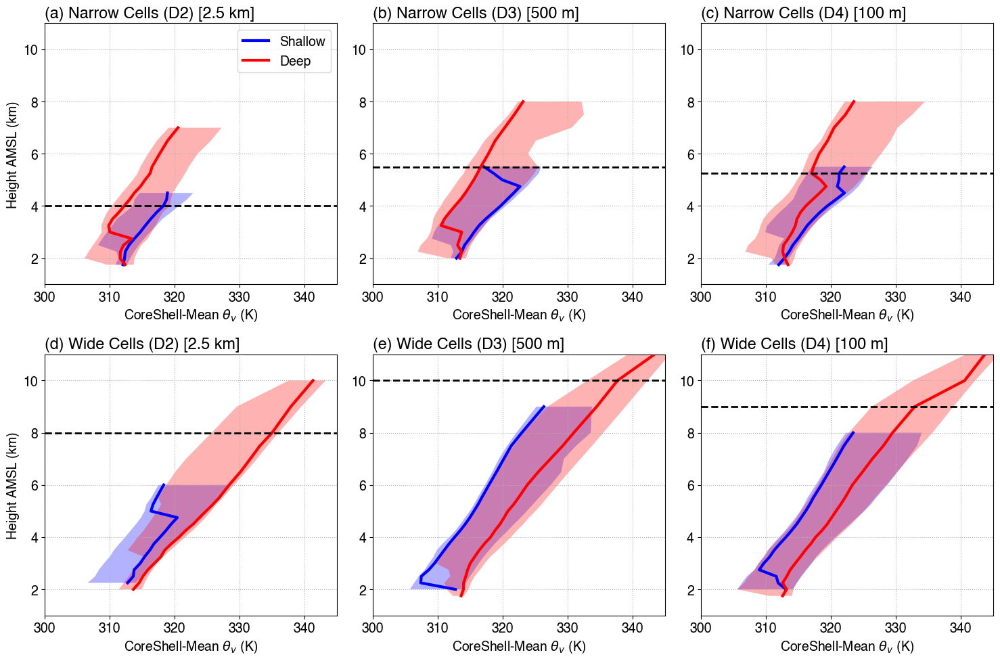

In [ ]:
THRESH = 30

# Median profiles
med_w_d_d2 = AvgCoreThtvprm_wide_deep_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThtvprm_wide_deep_prof_d2 > THRESH)
med_w_d_d3 = AvgCoreThtvprm_wide_deep_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThtvprm_wide_deep_prof_d3 > THRESH)
med_w_d_d4 = AvgCoreThtvprm_wide_deep_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThtvprm_wide_deep_prof_d4 > THRESH)
med_w_s_d2 = AvgCoreThtvprm_wide_shallow_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThtvprm_wide_shallow_prof_d2 > THRESH)
med_w_s_d3 = AvgCoreThtvprm_wide_shallow_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThtvprm_wide_shallow_prof_d3 > THRESH)
med_w_s_d4 = AvgCoreThtvprm_wide_shallow_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThtvprm_wide_shallow_prof_d4 > THRESH)

med_n_d_d2 = AvgCoreThtvprm_narrow_deep_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThtvprm_narrow_deep_prof_d2 > THRESH)
med_n_d_d3 = AvgCoreThtvprm_narrow_deep_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThtvprm_narrow_deep_prof_d3 > THRESH)
med_n_d_d4 = AvgCoreThtvprm_narrow_deep_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThtvprm_narrow_deep_prof_d4 > THRESH)
med_n_s_d2 = AvgCoreThtvprm_narrow_shallow_inqt_d2.sel(quantile=0.5).where(nsAvgCoreThtvprm_narrow_shallow_prof_d2 > THRESH)
med_n_s_d3 = AvgCoreThtvprm_narrow_shallow_inqt_d3.sel(quantile=0.5).where(nsAvgCoreThtvprm_narrow_shallow_prof_d3 > THRESH)
med_n_s_d4 = AvgCoreThtvprm_narrow_shallow_inqt_d4.sel(quantile=0.5).where(nsAvgCoreThtvprm_narrow_shallow_prof_d4 > THRESH)

prof = [
    [{'d':med_n_d_d2, 's':med_n_s_d2},
     {'d':med_n_d_d3, 's':med_n_s_d3},
     {'d':med_n_d_d4, 's':med_n_s_d4},],
    [{'d':med_w_d_d2, 's':med_w_s_d2},
     {'d':med_w_d_d3, 's':med_w_s_d3},
     {'d':med_w_d_d4, 's':med_w_s_d4},],
]

z_thresh = [[narrow_maxETH10dbz_thresh_d2, narrow_maxETH10dbz_thresh_d3, narrow_maxETH10dbz_thresh_d4], 
            [wide_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d4]]
inqt25_w_d_d2 = AvgCoreThtvprm_wide_deep_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThtvprm_wide_deep_prof_d2 > THRESH)
inqt75_w_d_d2 = AvgCoreThtvprm_wide_deep_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThtvprm_wide_deep_prof_d2 > THRESH)
inqt25_w_s_d2 = AvgCoreThtvprm_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThtvprm_wide_shallow_prof_d2 > THRESH)
inqt75_w_s_d2 = AvgCoreThtvprm_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThtvprm_wide_shallow_prof_d2 > THRESH)
inqt25_n_d_d2 = AvgCoreThtvprm_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThtvprm_narrow_deep_prof_d2 > THRESH)
inqt75_n_d_d2 = AvgCoreThtvprm_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThtvprm_narrow_deep_prof_d2 > THRESH)
inqt25_n_s_d2 = AvgCoreThtvprm_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsAvgCoreThtvprm_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s_d2 = AvgCoreThtvprm_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsAvgCoreThtvprm_narrow_shallow_prof_d2 > THRESH)

inqt25_w_d_d3 = AvgCoreThtvprm_wide_deep_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThtvprm_wide_deep_prof_d3 > THRESH)
inqt75_w_d_d3 = AvgCoreThtvprm_wide_deep_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThtvprm_wide_deep_prof_d3 > THRESH)
inqt25_w_s_d3 = AvgCoreThtvprm_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThtvprm_wide_shallow_prof_d3 > THRESH)
inqt75_w_s_d3 = AvgCoreThtvprm_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThtvprm_wide_shallow_prof_d3 > THRESH)
inqt25_n_d_d3 = AvgCoreThtvprm_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThtvprm_narrow_deep_prof_d3 > THRESH)
inqt75_n_d_d3 = AvgCoreThtvprm_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThtvprm_narrow_deep_prof_d3 > THRESH)
inqt25_n_s_d3 = AvgCoreThtvprm_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsAvgCoreThtvprm_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s_d3 = AvgCoreThtvprm_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsAvgCoreThtvprm_narrow_shallow_prof_d3 > THRESH)

inqt25_w_d_d4 = AvgCoreThtvprm_wide_deep_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThtvprm_wide_deep_prof_d4 > THRESH)
inqt75_w_d_d4 = AvgCoreThtvprm_wide_deep_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThtvprm_wide_deep_prof_d4 > THRESH)
inqt25_w_s_d4 = AvgCoreThtvprm_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThtvprm_wide_shallow_prof_d4 > THRESH)
inqt75_w_s_d4 = AvgCoreThtvprm_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThtvprm_wide_shallow_prof_d4 > THRESH)
inqt25_n_d_d4 = AvgCoreThtvprm_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThtvprm_narrow_deep_prof_d4 > THRESH)
inqt75_n_d_d4 = AvgCoreThtvprm_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThtvprm_narrow_deep_prof_d4 > THRESH)
inqt25_n_s_d4 = AvgCoreThtvprm_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsAvgCoreThtvprm_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s_d4 = AvgCoreThtvprm_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsAvgCoreThtvprm_narrow_shallow_prof_d4 > THRESH)

inqt = [[{'d':(inqt25_n_d_d2, inqt75_n_d_d2), 's':(inqt25_n_s_d2, inqt75_n_s_d2)}, 
         {'d':(inqt25_n_d_d3, inqt75_n_d_d3), 's':(inqt25_n_s_d3, inqt75_n_s_d3)},
         {'d':(inqt25_n_d_d4, inqt75_n_d_d4), 's':(inqt25_n_s_d4, inqt75_n_s_d4)},],
        [{'d':(inqt25_w_d_d2, inqt75_w_d_d2), 's':(inqt25_w_s_d2, inqt75_w_s_d2)}, 
         {'d':(inqt25_w_d_d3, inqt75_w_d_d3), 's':(inqt25_w_s_d3, inqt75_w_s_d3)},
         {'d':(inqt25_w_d_d4, inqt75_w_d_d4), 's':(inqt25_w_s_d4, inqt75_w_s_d4)},]]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    ['CoreShell-Mean '+r'$\theta_v$ (K)']*ncol,
    ['CoreShell-Mean '+r'$\theta_v$ (K)']*ncol,
]
ylabels = [
    ['Height AMSL (km)', '', ''],
    ['Height AMSL (km)', '', ''],
]
titles = [
    ['(a) Narrow Cells (D2) [2.5 km]', '(b) Narrow Cells (D3) [500 m]', '(c) Narrow Cells (D4) [100 m]'],
    ['(d) Wide Cells (D2) [2.5 km]', '(e) Wide Cells (D3) [500 m]', '(f) Wide Cells (D4) [100 m]'],
]
name_map = {'d':'Deep', 's':'Shallow'}
ylims = (1,11)
xlims = [
    [(300,345), (300,345), (300,345),],
    [(300,345), (300,345), (300,345),],
]
legend_show = [[True,False,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [15, 10]
figname = f'{figdir}CIMean_Profile_NarrowWide_CoreShellThetaV_d2_d3_d4.png'
print(figname)
fig = plot_mxn_prof_shading(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

## Function to plot profiles & sample sizes

In [ ]:
def plot_mxn_prof(nrow, ncol, prof, inqt, height, name_map=None,
                  xlabels=None, ylabels=None, xlims=None, ylims=None, z_thresh=None, legend_show=None, legend_loc=None,
                  titles=None, fontsize=None, figsize=None, figname=None):

    mpl.rcParams['font.size'] = fontsize
    mpl.rcParams['font.family'] = 'Helvetica'
    
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, dpi=100)
    # lcolors = {'d2':'dodgerblue', 'd3':'seagreen', 'd4':'darkviolet'}
    lcolors = {'d': 'red', 's': 'blue'}
    lstyles = {'min':'-', 'max':'-'}
    lw = 3
    # name_map1 = {'d':'Deep preCI', 's':'Shallow preCI'}
    # name_map2 = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
    alpha = 0.3
    
    for row in range(nrow):
        for col in range(ncol):
            ax = axes[row][col]
            prof_data = prof[row][col]
            # prof2_data = prof2[row][col]
            inqt_data = inqt[row]
            ax.plot(prof_data['s'], height, color=lcolors['s'], label=name_map['s'], lw=lw, ls=lstyles['min'])
            ax.plot(prof_data['d'], height, color=lcolors['d'], label=name_map['d'], lw=lw, ls=lstyles['min'])
            if col == 0:
                # ax.plot(prof2_data['s'], height_core, color=lcolors['s'], label=name_map2['s'], lw=lw, ls=lstyles['max'])
                # ax.plot(prof2_data['d'], height_core, color=lcolors['d'], label=name_map2['d'], lw=lw, ls=lstyles['max'])
                ax.fill_betweenx(height, inqt_data['s'][0], inqt_data['s'][1], facecolor=lcolors['s'], alpha=alpha)
                ax.fill_betweenx(height, inqt_data['d'][0], inqt_data['d'][1], facecolor=lcolors['d'], alpha=alpha)
            if (legend_show is not None):
                if (legend_show[row][col]): ax.legend(loc=legend_loc)
            if (z_thresh is not None): 
                _z_thresh = z_thresh[row]
                ax.axhline(_z_thresh, linestyle='--', lw=2, color='k')
            if (xlims is not None): ax.set_xlim(min(xlims[row][col]), max(xlims[row][col]))
            if (ylims is not None): ax.set_ylim(min(ylims), max(ylims))
            ax.set_xlabel(xlabels[row][col])
            ax.set_ylabel(ylabels[row][col])
            ax.set_title(titles[row][col], loc='left')
            ax.grid(ls=':')
            
    fig.tight_layout()
    fig.savefig(figname, bbox_inches='tight', dpi=300, facecolor='w')
    return fig

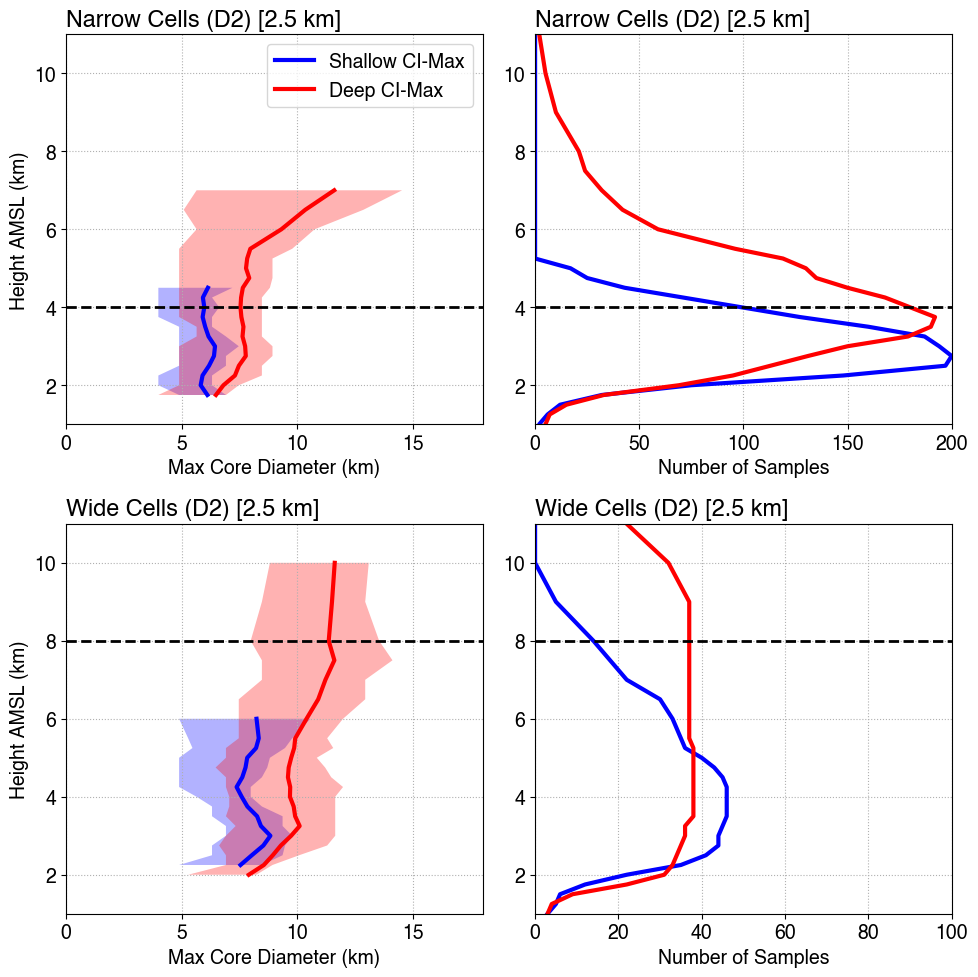

In [ ]:
THRESH = 30
prof = [
    [{'d':MaxCoreDiam_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH), 's':MaxCoreDiam_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)},
     {'d':nsMaxCoreDiam_narrow_deep_prof_d2, 's':nsMaxCoreDiam_narrow_shallow_prof_d2}],
    [{'d':MaxCoreDiam_wide_deep_avg_d2.where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH), 's':MaxCoreDiam_wide_shallow_avg_d2.where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)},
     {'d':nsMaxCoreDiam_wide_deep_prof_d2, 's':nsMaxCoreDiam_wide_shallow_prof_d2}],
]
z_thresh = [narrow_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]
inqt25_w_d = MaxCoreDiam_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt75_w_d = MaxCoreDiam_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
inqt25_w_s = MaxCoreDiam_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt75_w_s = MaxCoreDiam_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
inqt25_n_d = MaxCoreDiam_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt75_n_d = MaxCoreDiam_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
inqt25_n_s = MaxCoreDiam_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s = MaxCoreDiam_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
# name_map = {'d':'Deep preCI', 's':'Shallow preCI'}
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
xlabels = [
    ['Max Core Diameter (km)', 'Number of Samples'],
    ['Max Core Diameter (km)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
    ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
]

ylims = (1,11)
xlims = [
    [(0, 18), (0,200)],
    [(0, 18), (0,100)],
]
legend_show = [[True,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreDiam_d2.png'
fig = plot_mxn_prof(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, name_map=name_map,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

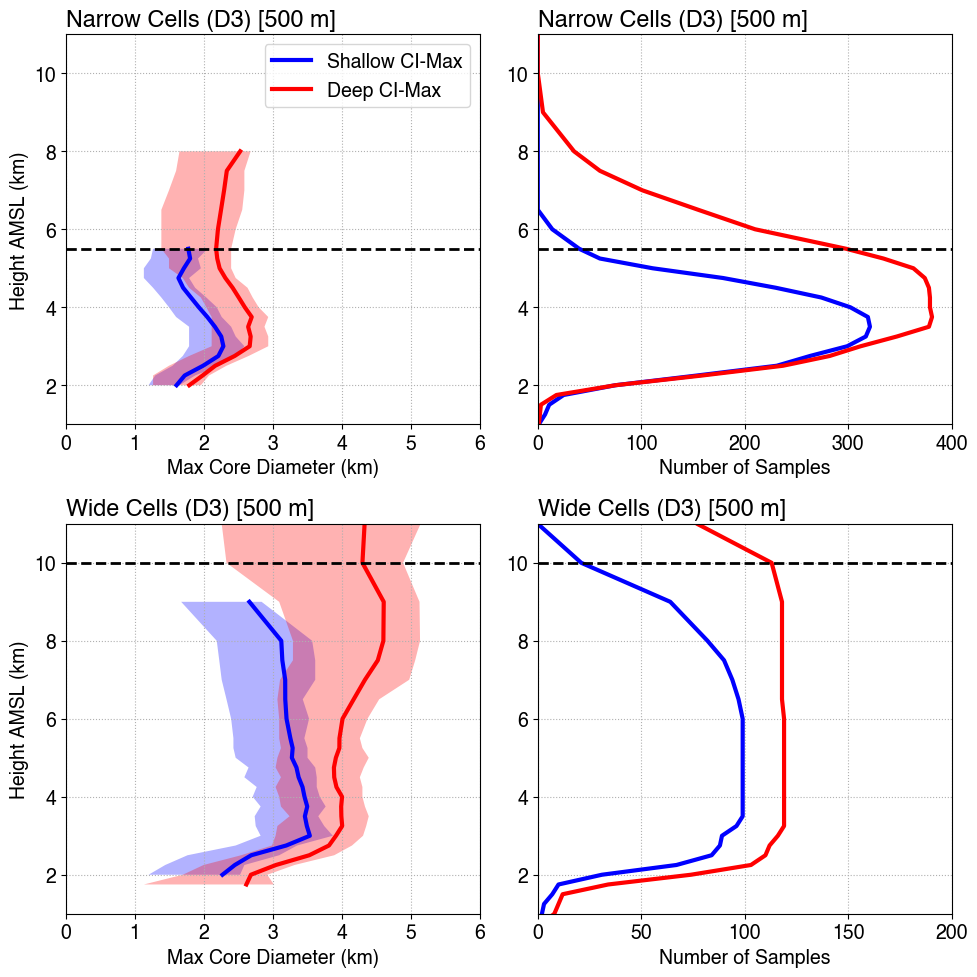

In [ ]:
THRESH = 30
prof = [
    [{'d':MaxCoreDiam_narrow_deep_avg_d3.where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH), 's':MaxCoreDiam_narrow_shallow_avg_d3.where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)},
     {'d':nsMaxCoreDiam_narrow_deep_prof_d3, 's':nsMaxCoreDiam_narrow_shallow_prof_d3}],
    [{'d':MaxCoreDiam_wide_deep_avg_d3.where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH), 's':MaxCoreDiam_wide_shallow_avg_d3.where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)},
     {'d':nsMaxCoreDiam_wide_deep_prof_d3, 's':nsMaxCoreDiam_wide_shallow_prof_d3}],
]
z_thresh = [narrow_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]
inqt25_w_d = MaxCoreDiam_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt75_w_d = MaxCoreDiam_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
inqt25_w_s = MaxCoreDiam_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt75_w_s = MaxCoreDiam_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
inqt25_n_d = MaxCoreDiam_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt75_n_d = MaxCoreDiam_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
inqt25_n_s = MaxCoreDiam_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s = MaxCoreDiam_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
# name_map = {'d':'Deep preCI', 's':'Shallow preCI'}
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
xlabels = [
    ['Max Core Diameter (km)', 'Number of Samples'],
    ['Max Core Diameter (km)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
    ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
]
ylims = (1,11)
xlims = [
    [(0, 6), (0,400)],
    [(0, 6), (0,200)],
]
legend_show = [[True,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreDiam_d3.png'
fig = plot_mxn_prof(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, name_map=name_map,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

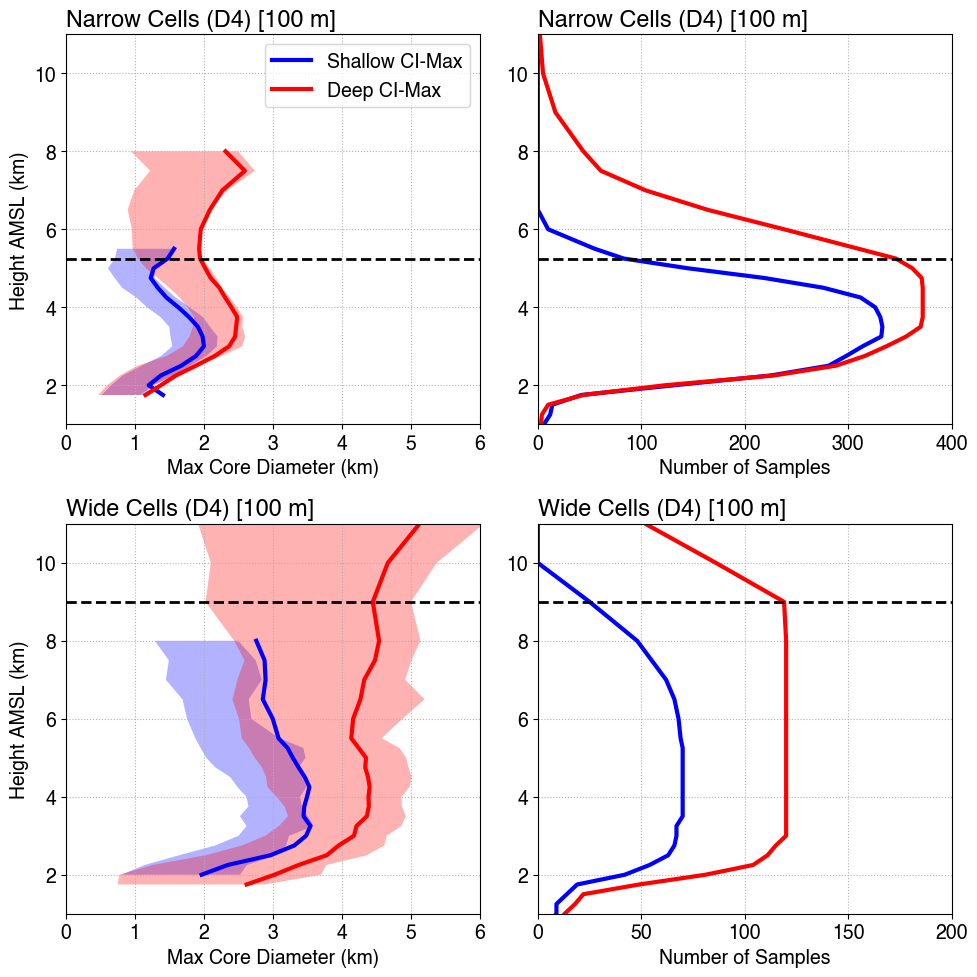

In [ ]:
THRESH = 30
prof = [
    [{'d':MaxCoreDiam_narrow_deep_avg_d4.where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH), 's':MaxCoreDiam_narrow_shallow_avg_d4.where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)},
     {'d':nsMaxCoreDiam_narrow_deep_prof_d4, 's':nsMaxCoreDiam_narrow_shallow_prof_d4}],
    [{'d':MaxCoreDiam_wide_deep_avg_d4.where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH), 's':MaxCoreDiam_wide_shallow_avg_d4.where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)},
     {'d':nsMaxCoreDiam_wide_deep_prof_d4, 's':nsMaxCoreDiam_wide_shallow_prof_d4}],
]
z_thresh = [narrow_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]
inqt25_w_d = MaxCoreDiam_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt75_w_d = MaxCoreDiam_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
inqt25_w_s = MaxCoreDiam_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt75_w_s = MaxCoreDiam_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
inqt25_n_d = MaxCoreDiam_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt75_n_d = MaxCoreDiam_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
inqt25_n_s = MaxCoreDiam_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s = MaxCoreDiam_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
# name_map = {'d':'Deep preCI', 's':'Shallow preCI'}
name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
xlabels = [
    ['Max Core Diameter (km)', 'Number of Samples'],
    ['Max Core Diameter (km)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
    ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
]
ylims = (1,11)
xlims = [
    [(0, 6), (0,400)],
    [(0, 6), (0,200)],
]
legend_show = [[True,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}CIMax_Profile_NarrowWide_CoreDiam_d4.png'
fig = plot_mxn_prof(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh, legend_show=legend_show, legend_loc=legend_loc, name_map=name_map,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# THRESH = 30
# prof = [
#     [{'d':MaxCoreMeanW_narrow_deep_avg_d2.where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH), 's':MaxCoreMeanW_narrow_shallow_avg_d2.where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)},
#      {'d':nsMaxCoreDiam_narrow_deep_prof_d2, 's':nsMaxCoreDiam_narrow_shallow_prof_d2}],
#     [{'d':MaxCoreMeanW_wide_deep_avg_d2.where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH), 's':MaxCoreMeanW_wide_shallow_avg_d2.where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)},
#      {'d':nsMaxCoreDiam_wide_deep_prof_d2, 's':nsMaxCoreDiam_wide_shallow_prof_d2}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]
# inqt25_w_d = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
# inqt75_w_d = MaxCoreMeanW_wide_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d2 > THRESH)
# inqt25_w_s = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
# inqt75_w_s = MaxCoreMeanW_wide_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d2 > THRESH)
# inqt25_n_d = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
# inqt75_n_d = MaxCoreMeanW_narrow_deep_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d2 > THRESH)
# inqt25_n_s = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
# inqt75_n_s = MaxCoreMeanW_narrow_shallow_inqt_d2.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d2 > THRESH)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Core Mean W (m/s)', 'Number of Samples'],
#     ['Core Mean W (m/s)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
#     ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(0, 12), (0,200)],
#     [(0, 12), (0,100)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMeanW_d2.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# THRESH = 30
# prof = [
#     [{'d':MaxCoreMeanW_narrow_deep_avg_d3.where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH), 's':MaxCoreMeanW_narrow_shallow_avg_d3.where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)},
#      {'d':nsMaxCoreDiam_narrow_deep_prof_d3, 's':nsMaxCoreDiam_narrow_shallow_prof_d3}],
#     [{'d':MaxCoreMeanW_wide_deep_avg_d3.where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH), 's':MaxCoreMeanW_wide_shallow_avg_d3.where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)},
#      {'d':nsMaxCoreDiam_wide_deep_prof_d3, 's':nsMaxCoreDiam_wide_shallow_prof_d3}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]
# inqt25_w_d = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
# inqt75_w_d = MaxCoreMeanW_wide_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d3 > THRESH)
# inqt25_w_s = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
# inqt75_w_s = MaxCoreMeanW_wide_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d3 > THRESH)
# inqt25_n_d = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
# inqt75_n_d = MaxCoreMeanW_narrow_deep_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d3 > THRESH)
# inqt25_n_s = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
# inqt75_n_s = MaxCoreMeanW_narrow_shallow_inqt_d3.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d3 > THRESH)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Core Mean W (m/s)', 'Number of Samples'],
#     ['Core Mean W (m/s)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
#     ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(0, 14), (0,400)],
#     [(0, 14), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMeanW_d3.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# THRESH = 30
# prof = [
#     [{'d':MaxCoreMeanW_narrow_deep_avg_d4.where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH), 's':MaxCoreMeanW_narrow_shallow_avg_d4.where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)},
#      {'d':nsMaxCoreDiam_narrow_deep_prof_d4, 's':nsMaxCoreDiam_narrow_shallow_prof_d4}],
#     [{'d':MaxCoreMeanW_wide_deep_avg_d4.where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH), 's':MaxCoreMeanW_wide_shallow_avg_d4.where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)},
#      {'d':nsMaxCoreDiam_wide_deep_prof_d4, 's':nsMaxCoreDiam_wide_shallow_prof_d4}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]
# inqt25_w_d = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
# inqt75_w_d = MaxCoreMeanW_wide_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_deep_prof_d4 > THRESH)
# inqt25_w_s = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
# inqt75_w_s = MaxCoreMeanW_wide_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_wide_shallow_prof_d4 > THRESH)
# inqt25_n_d = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
# inqt75_n_d = MaxCoreMeanW_narrow_deep_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_deep_prof_d4 > THRESH)
# inqt25_n_s = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.25).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
# inqt75_n_s = MaxCoreMeanW_narrow_shallow_inqt_d4.sel(quantile=0.75).where(nsMaxCoreDiam_narrow_shallow_prof_d4 > THRESH)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Core Mean W (m/s)', 'Number of Samples'],
#     ['Core Mean W (m/s)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
#     ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(0, 14), (0,400)],
#     [(0, 14), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}CIMax_Profile_NarrowWide_CoreMeanW_d4.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height_core/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

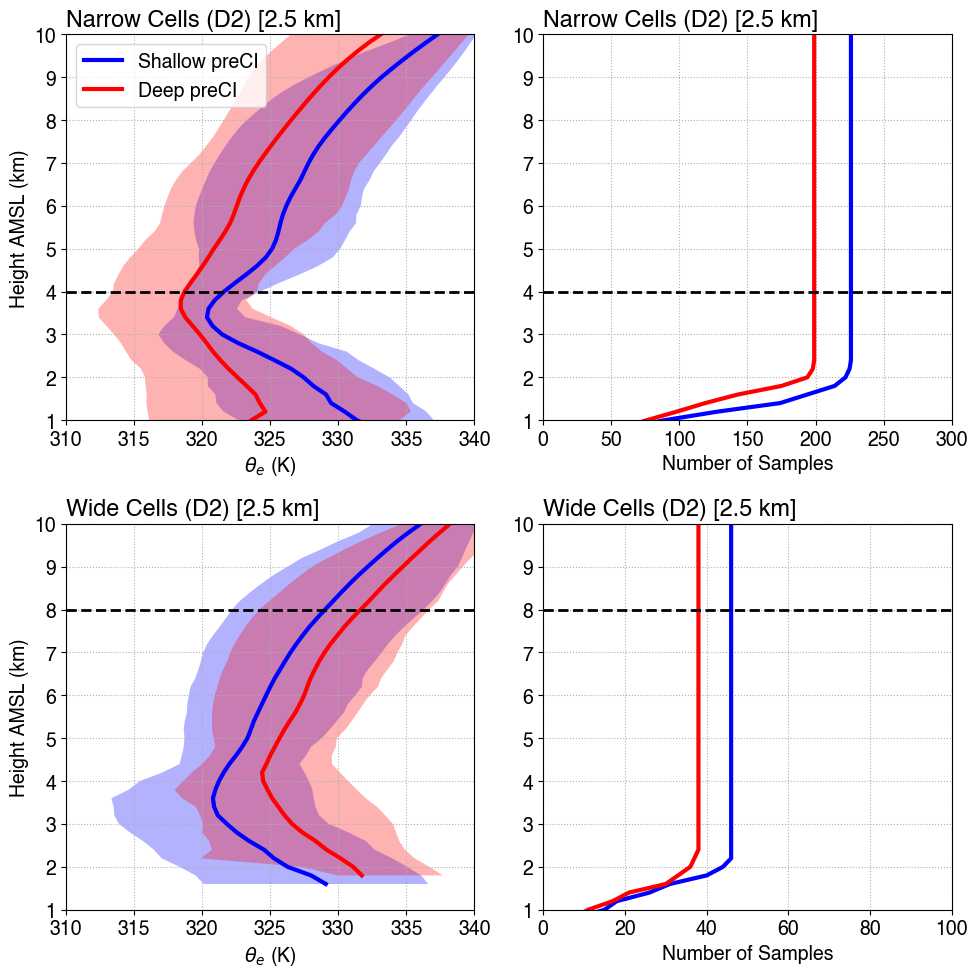

In [ ]:
THRESH = 30
prof = [
    [{'d':ThetaE_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > THRESH), 's':ThetaE_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > THRESH)},
     {'d':ns_narrow_deep_prof_d2, 's':ns_narrow_shallow_prof_d2}],
    [{'d':ThetaE_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > THRESH), 's':ThetaE_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > THRESH)},
     {'d':ns_wide_deep_prof_d2, 's':ns_wide_shallow_prof_d2}],
]
z_thresh = [narrow_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]
inqt25_w_d = ThetaE_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > THRESH)
inqt75_w_d = ThetaE_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > THRESH)
inqt25_w_s = ThetaE_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > THRESH)
inqt75_w_s = ThetaE_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > THRESH)
inqt25_n_d = ThetaE_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > THRESH)
inqt75_n_d = ThetaE_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > THRESH)
inqt25_n_s = ThetaE_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > THRESH)
inqt75_n_s = ThetaE_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > THRESH)
inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
name_map = {'d':'Deep preCI', 's':'Shallow preCI'}
# name_map = {'d':'Deep CI-Max', 's':'Shallow CI-Max'}
xlabels = [
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
    ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
]
ylims = (1,10)
xlims = [
    [(310, 340), (0,300)],
    [(310, 340), (0,100)],
]
legend_show = [[True,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}PreCI_Profile_NarrowWide_ThetaE_d2.png'
fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

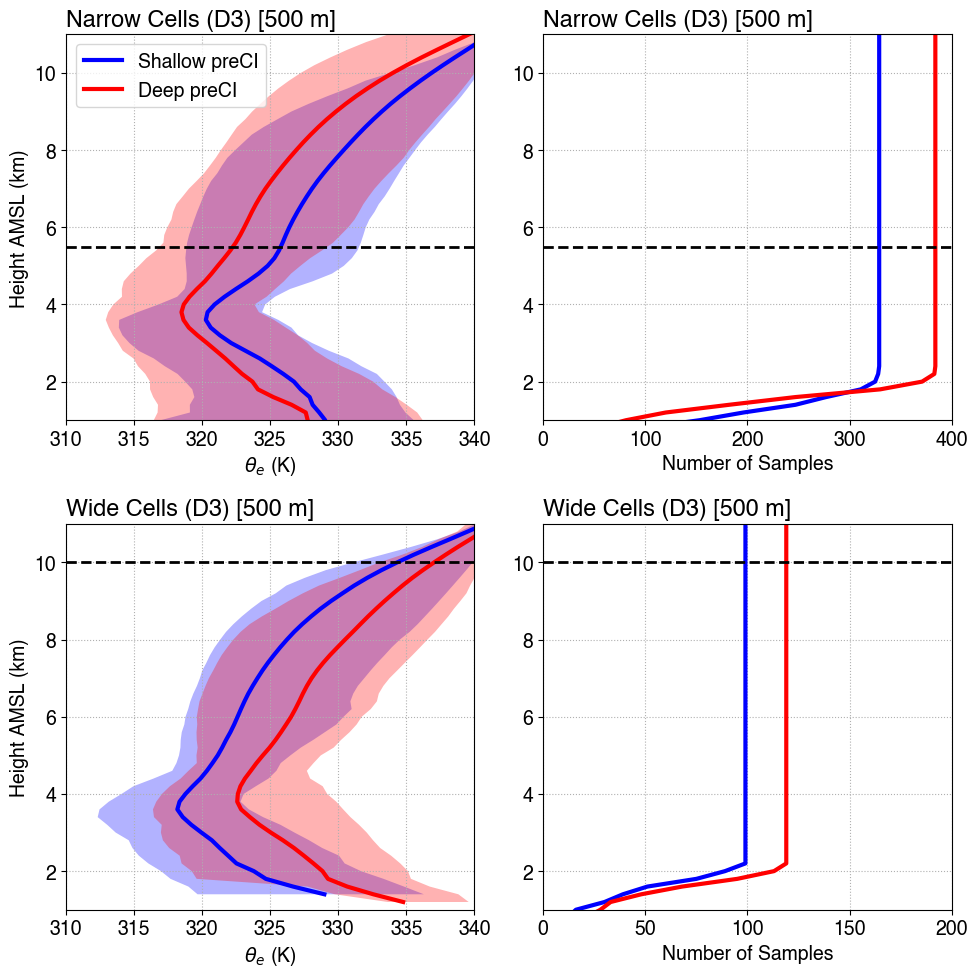

In [ ]:
THRESH = 30
prof = [
    [{'d':ThetaE_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > THRESH), 's':ThetaE_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > THRESH)},
     {'d':ns_narrow_deep_prof_d3, 's':ns_narrow_shallow_prof_d3}],
    [{'d':ThetaE_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > THRESH), 's':ThetaE_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > THRESH)},
     {'d':ns_wide_deep_prof_d3, 's':ns_wide_shallow_prof_d3}],
]
z_thresh = [narrow_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]
inqt25_w_d = ThetaE_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > THRESH)
inqt75_w_d = ThetaE_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > THRESH)
inqt25_w_s = ThetaE_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > THRESH)
inqt75_w_s = ThetaE_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > THRESH)
inqt25_n_d = ThetaE_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > THRESH)
inqt75_n_d = ThetaE_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > THRESH)
inqt25_n_s = ThetaE_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > THRESH)
inqt75_n_s = ThetaE_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > THRESH)
inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
    ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
]
ylims = (1,11)
xlims = [
    [(310, 340), (0,400)],
    [(310, 340), (0,200)],
]
legend_show = [[True,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}PreCI_Profile_NarrowWide_ThetaE_d3.png'
fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

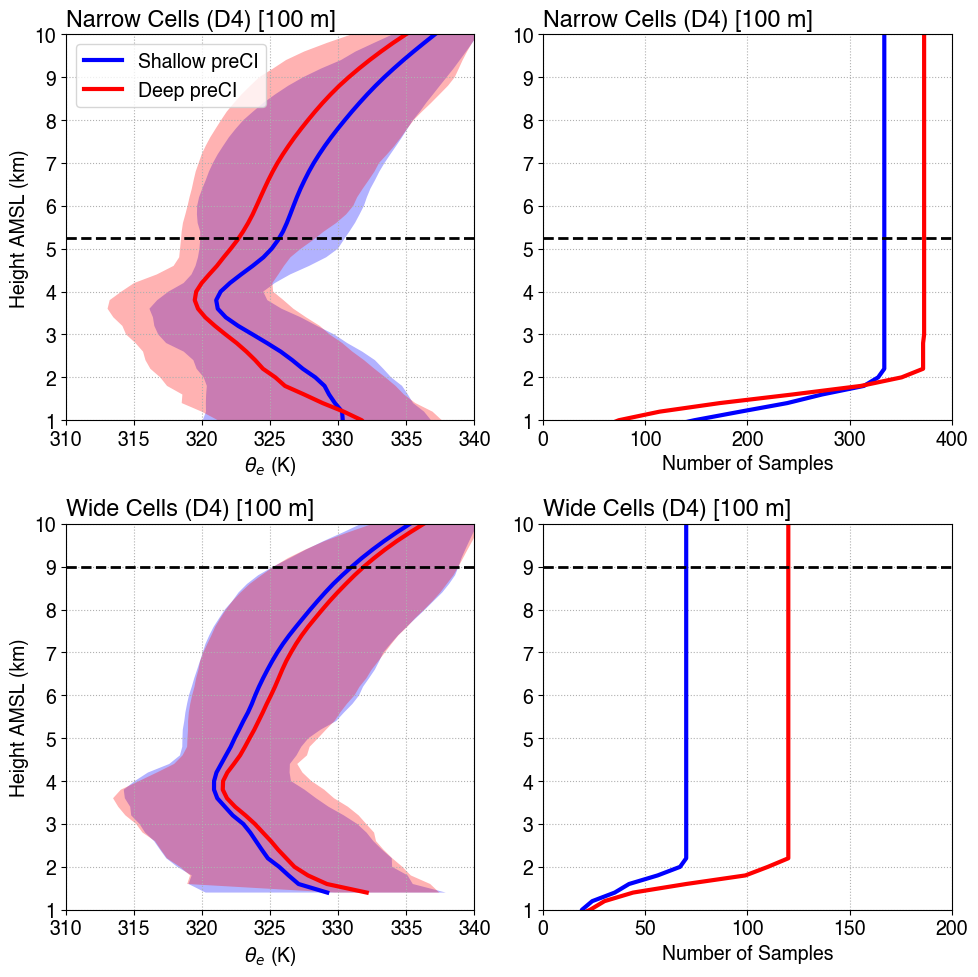

In [ ]:
THRESH = 30
prof = [
    [{'d':ThetaE_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > THRESH), 's':ThetaE_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > THRESH)},
     {'d':ns_narrow_deep_prof_d4, 's':ns_narrow_shallow_prof_d4}],
    [{'d':ThetaE_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > THRESH), 's':ThetaE_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > THRESH)},
     {'d':ns_wide_deep_prof_d4, 's':ns_wide_shallow_prof_d4}],
]
z_thresh = [narrow_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]
inqt25_w_d = ThetaE_wide_deep_inqt_d4.sel(quantile=0.25).where(ns_wide_deep_prof_d4 > THRESH)
inqt75_w_d = ThetaE_wide_deep_inqt_d4.sel(quantile=0.75).where(ns_wide_deep_prof_d4 > THRESH)
inqt25_w_s = ThetaE_wide_shallow_inqt_d4.sel(quantile=0.25).where(ns_wide_shallow_prof_d4 > THRESH)
inqt75_w_s = ThetaE_wide_shallow_inqt_d4.sel(quantile=0.75).where(ns_wide_shallow_prof_d4 > THRESH)
inqt25_n_d = ThetaE_narrow_deep_inqt_d4.sel(quantile=0.25).where(ns_narrow_deep_prof_d4 > THRESH)
inqt75_n_d = ThetaE_narrow_deep_inqt_d4.sel(quantile=0.75).where(ns_narrow_deep_prof_d4 > THRESH)
inqt25_n_s = ThetaE_narrow_shallow_inqt_d4.sel(quantile=0.25).where(ns_narrow_shallow_prof_d4 > THRESH)
inqt75_n_s = ThetaE_narrow_shallow_inqt_d4.sel(quantile=0.75).where(ns_narrow_shallow_prof_d4 > THRESH)
inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
nrow = len(prof)
ncol = len(prof[0])
# nrow, ncol
xlabels = [
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
    [r'$\theta_e$ '+'(K)', 'Number of Samples'],
]
ylabels = [
    ['Height AMSL (km)', ''],
    ['Height AMSL (km)', ''],
]
titles = [
    ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
    ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
]
ylims = (1,10)
xlims = [
    [(310, 340), (0,400)],
    [(310, 340), (0,200)],
]
legend_show = [[True,False],[False]*ncol]
legend_loc = 'best'
fontsize = 14
figsize = [10, 10]
figname = f'{figdir}PreCI_Profile_NarrowWide_ThetaE_d4.png'
fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh, name_map=name_map, legend_show=legend_show, legend_loc=legend_loc,
                    xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':Theta_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > min_ns_prof), 's':Theta_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d2, 's':ns_narrow_shallow_prof_d2}],
#     [{'d':Theta_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > min_ns_prof), 's':Theta_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d2, 's':ns_wide_shallow_prof_d2}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]
# inqt25_w_d = Theta_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > min_ns_prof)
# inqt75_w_d = Theta_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > min_ns_prof)
# inqt25_w_s = Theta_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > min_ns_prof)
# inqt75_w_s = Theta_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > min_ns_prof)
# inqt25_n_d = Theta_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > min_ns_prof)
# inqt75_n_d = Theta_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > min_ns_prof)
# inqt25_n_s = Theta_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > min_ns_prof)
# inqt75_n_s = Theta_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
#     ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(300, 345), (0,300)],
#     [(300, 345), (0,100)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_Theta_d2.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':Theta_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > min_ns_prof), 's':Theta_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d3, 's':ns_narrow_shallow_prof_d3}],
#     [{'d':Theta_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > min_ns_prof), 's':Theta_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d3, 's':ns_wide_shallow_prof_d3}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]
# inqt25_w_d = Theta_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > min_ns_prof)
# inqt75_w_d = Theta_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > min_ns_prof)
# inqt25_w_s = Theta_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > min_ns_prof)
# inqt75_w_s = Theta_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > min_ns_prof)
# inqt25_n_d = Theta_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > min_ns_prof)
# inqt75_n_d = Theta_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > min_ns_prof)
# inqt25_n_s = Theta_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > min_ns_prof)
# inqt75_n_s = Theta_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
#     ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(300, 345), (0,400)],
#     [(300, 345), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_Theta_d3.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':Theta_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > min_ns_prof), 's':Theta_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d3, 's':ns_narrow_shallow_prof_d3}],
#     [{'d':Theta_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > min_ns_prof), 's':Theta_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d3, 's':ns_wide_shallow_prof_d3}],
# ]
# inqt25_w_d = Theta_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > min_ns_prof)
# inqt75_w_d = Theta_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > min_ns_prof)
# inqt25_w_s = Theta_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > min_ns_prof)
# inqt75_w_s = Theta_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > min_ns_prof)
# inqt25_n_d = Theta_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > min_ns_prof)
# inqt75_n_d = Theta_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > min_ns_prof)
# inqt25_n_s = Theta_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > min_ns_prof)
# inqt75_n_s = Theta_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
#     ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(300, 345), (0,600)],
#     [(300, 345), (0,600)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_Theta_d3.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=maxETH10dbz_thresh_d3,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':Theta_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > min_ns_prof), 's':Theta_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d4, 's':ns_narrow_shallow_prof_d4}],
#     [{'d':Theta_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > min_ns_prof), 's':Theta_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d4, 's':ns_wide_shallow_prof_d4}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]
# inqt25_w_d = Theta_wide_deep_inqt_d4.sel(quantile=0.25).where(ns_wide_deep_prof_d4 > min_ns_prof)
# inqt75_w_d = Theta_wide_deep_inqt_d4.sel(quantile=0.75).where(ns_wide_deep_prof_d4 > min_ns_prof)
# inqt25_w_s = Theta_wide_shallow_inqt_d4.sel(quantile=0.25).where(ns_wide_shallow_prof_d4 > min_ns_prof)
# inqt75_w_s = Theta_wide_shallow_inqt_d4.sel(quantile=0.75).where(ns_wide_shallow_prof_d4 > min_ns_prof)
# inqt25_n_d = Theta_narrow_deep_inqt_d4.sel(quantile=0.25).where(ns_narrow_deep_prof_d4 > min_ns_prof)
# inqt75_n_d = Theta_narrow_deep_inqt_d4.sel(quantile=0.75).where(ns_narrow_deep_prof_d4 > min_ns_prof)
# inqt25_n_s = Theta_narrow_shallow_inqt_d4.sel(quantile=0.25).where(ns_narrow_shallow_prof_d4 > min_ns_prof)
# inqt75_n_s = Theta_narrow_shallow_inqt_d4.sel(quantile=0.75).where(ns_narrow_shallow_prof_d4 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
#     [r'$\theta$ '+'(K)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
#     ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
# ]
# ylims = (1,10)
# xlims = [
#     [(300, 345), (0,400)],
#     [(300, 345), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_Theta_d4.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':qv_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > min_ns_prof)*1e3, 's':qv_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > min_ns_prof)*1e3},
#      {'d':ns_narrow_deep_prof_d2, 's':ns_narrow_shallow_prof_d2}],
#     [{'d':qv_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > min_ns_prof)*1e3, 's':qv_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > min_ns_prof)*1e3},
#      {'d':ns_wide_deep_prof_d2, 's':ns_wide_shallow_prof_d2}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]
# inqt25_w_d = qv_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > min_ns_prof)*1e3
# inqt75_w_d = qv_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > min_ns_prof)*1e3
# inqt25_w_s = qv_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > min_ns_prof)*1e3
# inqt75_w_s = qv_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > min_ns_prof)*1e3
# inqt25_n_d = qv_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > min_ns_prof)*1e3
# inqt75_n_d = qv_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > min_ns_prof)*1e3
# inqt25_n_s = qv_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > min_ns_prof)*1e3
# inqt75_n_s = qv_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > min_ns_prof)*1e3
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Qv (g kg$^{-1}$)', 'Number of Samples'],
#     ['Qv (g kg$^{-1}$)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
#     ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
# ]
# ylims = (1,10)
# # xlims = None
# xlims = [
#     [(0, 20), (0,300)],
#     [(0, 20), (0,100)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_qv_d2.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':qv_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > min_ns_prof)*1e3, 's':qv_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > min_ns_prof)*1e3},
#      {'d':ns_narrow_deep_prof_d3, 's':ns_narrow_shallow_prof_d3}],
#     [{'d':qv_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > min_ns_prof)*1e3, 's':qv_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > min_ns_prof)*1e3},
#      {'d':ns_wide_deep_prof_d3, 's':ns_wide_shallow_prof_d3}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]
# inqt25_w_d = qv_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > min_ns_prof)*1e3
# inqt75_w_d = qv_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > min_ns_prof)*1e3
# inqt25_w_s = qv_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > min_ns_prof)*1e3
# inqt75_w_s = qv_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > min_ns_prof)*1e3
# inqt25_n_d = qv_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > min_ns_prof)*1e3
# inqt75_n_d = qv_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > min_ns_prof)*1e3
# inqt25_n_s = qv_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > min_ns_prof)*1e3
# inqt75_n_s = qv_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > min_ns_prof)*1e3
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Qv (g kg$^{-1}$)', 'Number of Samples'],
#     ['Qv (g kg$^{-1}$)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
#     ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
# ]
# ylims = (1,10)
# # xlims = None
# xlims = [
#     [(0, 20), (0,400)],
#     [(0, 20), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_qv_d3.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':qv_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > min_ns_prof)*1e3, 's':qv_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > min_ns_prof)*1e3},
#      {'d':ns_narrow_deep_prof_d4, 's':ns_narrow_shallow_prof_d4}],
#     [{'d':qv_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > min_ns_prof)*1e3, 's':qv_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > min_ns_prof)*1e3},
#      {'d':ns_wide_deep_prof_d4, 's':ns_wide_shallow_prof_d4}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]
# inqt25_w_d = qv_wide_deep_inqt_d4.sel(quantile=0.25).where(ns_wide_deep_prof_d4 > min_ns_prof)*1e3
# inqt75_w_d = qv_wide_deep_inqt_d4.sel(quantile=0.75).where(ns_wide_deep_prof_d4 > min_ns_prof)*1e3
# inqt25_w_s = qv_wide_shallow_inqt_d4.sel(quantile=0.25).where(ns_wide_shallow_prof_d4 > min_ns_prof)*1e3
# inqt75_w_s = qv_wide_shallow_inqt_d4.sel(quantile=0.75).where(ns_wide_shallow_prof_d4 > min_ns_prof)*1e3
# inqt25_n_d = qv_narrow_deep_inqt_d4.sel(quantile=0.25).where(ns_narrow_deep_prof_d4 > min_ns_prof)*1e3
# inqt75_n_d = qv_narrow_deep_inqt_d4.sel(quantile=0.75).where(ns_narrow_deep_prof_d4 > min_ns_prof)*1e3
# inqt25_n_s = qv_narrow_shallow_inqt_d4.sel(quantile=0.25).where(ns_narrow_shallow_prof_d4 > min_ns_prof)*1e3
# inqt75_n_s = qv_narrow_shallow_inqt_d4.sel(quantile=0.75).where(ns_narrow_shallow_prof_d4 > min_ns_prof)*1e3
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['Qv (g kg$^{-1}$)', 'Number of Samples'],
#     ['Qv (g kg$^{-1}$)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
#     ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
# ]
# ylims = (1,10)
# # xlims = None
# xlims = [
#     [(0, 20), (0,400)],
#     [(0, 20), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_qv_d4.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':rh_narrow_deep_avg_d2.where(ns_narrow_deep_prof_d2 > min_ns_prof), 's':rh_narrow_shallow_avg_d2.where(ns_narrow_shallow_prof_d2 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d2, 's':ns_narrow_shallow_prof_d2}],
#     [{'d':rh_wide_deep_avg_d2.where(ns_wide_deep_prof_d2 > min_ns_prof), 's':rh_wide_shallow_avg_d2.where(ns_wide_shallow_prof_d2 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d2, 's':ns_wide_shallow_prof_d2}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d2, wide_maxETH10dbz_thresh_d2]
# inqt25_w_d = rh_wide_deep_inqt_d2.sel(quantile=0.25).where(ns_wide_deep_prof_d2 > min_ns_prof)
# inqt75_w_d = rh_wide_deep_inqt_d2.sel(quantile=0.75).where(ns_wide_deep_prof_d2 > min_ns_prof)
# inqt25_w_s = rh_wide_shallow_inqt_d2.sel(quantile=0.25).where(ns_wide_shallow_prof_d2 > min_ns_prof)
# inqt75_w_s = rh_wide_shallow_inqt_d2.sel(quantile=0.75).where(ns_wide_shallow_prof_d2 > min_ns_prof)
# inqt25_n_d = rh_narrow_deep_inqt_d2.sel(quantile=0.25).where(ns_narrow_deep_prof_d2 > min_ns_prof)
# inqt75_n_d = rh_narrow_deep_inqt_d2.sel(quantile=0.75).where(ns_narrow_deep_prof_d2 > min_ns_prof)
# inqt25_n_s = rh_narrow_shallow_inqt_d2.sel(quantile=0.25).where(ns_narrow_shallow_prof_d2 > min_ns_prof)
# inqt75_n_s = rh_narrow_shallow_inqt_d2.sel(quantile=0.75).where(ns_narrow_shallow_prof_d2 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['RH (%)', 'Number of Samples'],
#     ['RH (%)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D2) [2.5 km]', 'Narrow Cells (D2) [2.5 km]'],
#     ['Wide Cells (D2) [2.5 km]', 'Wide Cells (D2) [2.5 km]'],
# ]
# ylims = (1,10)
# # xlims = None
# xlims = [
#     [(10, 100), (0,300)],
#     [(10, 100), (0,100)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_rh_d2.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':rh_narrow_deep_avg_d3.where(ns_narrow_deep_prof_d3 > min_ns_prof), 's':rh_narrow_shallow_avg_d3.where(ns_narrow_shallow_prof_d3 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d3, 's':ns_narrow_shallow_prof_d3}],
#     [{'d':rh_wide_deep_avg_d3.where(ns_wide_deep_prof_d3 > min_ns_prof), 's':rh_wide_shallow_avg_d3.where(ns_wide_shallow_prof_d3 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d3, 's':ns_wide_shallow_prof_d3}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d3, wide_maxETH10dbz_thresh_d3]
# inqt25_w_d = rh_wide_deep_inqt_d3.sel(quantile=0.25).where(ns_wide_deep_prof_d3 > min_ns_prof)
# inqt75_w_d = rh_wide_deep_inqt_d3.sel(quantile=0.75).where(ns_wide_deep_prof_d3 > min_ns_prof)
# inqt25_w_s = rh_wide_shallow_inqt_d3.sel(quantile=0.25).where(ns_wide_shallow_prof_d3 > min_ns_prof)
# inqt75_w_s = rh_wide_shallow_inqt_d3.sel(quantile=0.75).where(ns_wide_shallow_prof_d3 > min_ns_prof)
# inqt25_n_d = rh_narrow_deep_inqt_d3.sel(quantile=0.25).where(ns_narrow_deep_prof_d3 > min_ns_prof)
# inqt75_n_d = rh_narrow_deep_inqt_d3.sel(quantile=0.75).where(ns_narrow_deep_prof_d3 > min_ns_prof)
# inqt25_n_s = rh_narrow_shallow_inqt_d3.sel(quantile=0.25).where(ns_narrow_shallow_prof_d3 > min_ns_prof)
# inqt75_n_s = rh_narrow_shallow_inqt_d3.sel(quantile=0.75).where(ns_narrow_shallow_prof_d3 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['RH (%)', 'Number of Samples'],
#     ['RH (%)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D3) [500 m]', 'Narrow Cells (D3) [500 m]'],
#     ['Wide Cells (D3) [500 m]', 'Wide Cells (D3) [500 m]'],
# ]
# ylims = (1,10)
# # xlims = None
# xlims = [
#     [(10, 100), (0,400)],
#     [(10, 100), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_rh_d3.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)

In [ ]:
# prof = [
#     [{'d':rh_narrow_deep_avg_d4.where(ns_narrow_deep_prof_d4 > min_ns_prof), 's':rh_narrow_shallow_avg_d4.where(ns_narrow_shallow_prof_d4 > min_ns_prof)},
#      {'d':ns_narrow_deep_prof_d4, 's':ns_narrow_shallow_prof_d4}],
#     [{'d':rh_wide_deep_avg_d4.where(ns_wide_deep_prof_d4 > min_ns_prof), 's':rh_wide_shallow_avg_d4.where(ns_wide_shallow_prof_d4 > min_ns_prof)},
#      {'d':ns_wide_deep_prof_d4, 's':ns_wide_shallow_prof_d4}],
# ]
# z_thresh = [narrow_maxETH10dbz_thresh_d4, wide_maxETH10dbz_thresh_d4]
# inqt25_w_d = rh_wide_deep_inqt_d4.sel(quantile=0.25).where(ns_wide_deep_prof_d4 > min_ns_prof)
# inqt75_w_d = rh_wide_deep_inqt_d4.sel(quantile=0.75).where(ns_wide_deep_prof_d4 > min_ns_prof)
# inqt25_w_s = rh_wide_shallow_inqt_d4.sel(quantile=0.25).where(ns_wide_shallow_prof_d4 > min_ns_prof)
# inqt75_w_s = rh_wide_shallow_inqt_d4.sel(quantile=0.75).where(ns_wide_shallow_prof_d4 > min_ns_prof)
# inqt25_n_d = rh_narrow_deep_inqt_d4.sel(quantile=0.25).where(ns_narrow_deep_prof_d4 > min_ns_prof)
# inqt75_n_d = rh_narrow_deep_inqt_d4.sel(quantile=0.75).where(ns_narrow_deep_prof_d4 > min_ns_prof)
# inqt25_n_s = rh_narrow_shallow_inqt_d4.sel(quantile=0.25).where(ns_narrow_shallow_prof_d4 > min_ns_prof)
# inqt75_n_s = rh_narrow_shallow_inqt_d4.sel(quantile=0.75).where(ns_narrow_shallow_prof_d4 > min_ns_prof)
# inqt = [{'d':(inqt25_n_d, inqt75_n_d), 's':(inqt25_n_s, inqt75_n_s)}, {'d':(inqt25_w_d, inqt75_w_d), 's':(inqt25_w_s, inqt75_w_s)}, ]
# nrow = len(prof)
# ncol = len(prof[0])
# # nrow, ncol
# xlabels = [
#     ['RH (%)', 'Number of Samples'],
#     ['RH (%)', 'Number of Samples'],
# ]
# ylabels = [
#     ['Height AMSL (km)', ''],
#     ['Height AMSL (km)', ''],
# ]
# titles = [
#     ['Narrow Cells (D4) [100 m]', 'Narrow Cells (D4) [100 m]'],
#     ['Wide Cells (D4) [100 m]', 'Wide Cells (D4) [100 m]'],
# ]
# ylims = (1,10)
# # xlims = None
# xlims = [
#     [(10, 100), (0,400)],
#     [(10, 100), (0,200)],
# ]
# fontsize = 14
# figsize = [10, 10]
# figname = f'{figdir}PreCI_Profile_NarrowWide_rh_d4.png'
# fig = plot_mxn_prof(nrow, ncol, prof, inqt, height/1e3, z_thresh=z_thresh,
#                     xlabels=xlabels, ylabels=ylabels, titles=titles, xlims=xlims, ylims=ylims, fontsize=fontsize, figsize=figsize, figname=figname)